In [1]:
# Suppress all warnings
import warnings
warnings.simplefilter("ignore")
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

# Importing packages
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import holidays
import xgboost as xgb
import keras 
import itertools

from pandas.plotting import autocorrelation_plot, lag_plot

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse

from pmdarima.arima import auto_arima

from scipy.stats import zscore

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, TimeSeriesSplit, RandomizedSearchCV, GridSearchCV, cross_val_score
from sklearn.feature_selection import SelectFromModel
from sklearn.decomposition import PCA

import prophet
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.make_holidays import make_holidays_df

from xgboost import plot_importance, plot_tree, XGBRegressor

from keras.layers import LSTM, Dense, Dropout, Input, Bidirectional, BatchNormalization
from keras.models import Model, Sequential
from keras.callbacks import EarlyStopping, LearningRateScheduler, ModelCheckpoint
from keras.regularizers import l1_l2
from keras.optimizers import Adam

from math import sqrt

plt.style.use('fivethirtyeight')

# Loading data
df = pd.read_csv('initial_data2.csv')

# Converting Date column to Datetime object
df['Date'] = pd.to_datetime(df['Date'])

# Ava's Time Series Vaccine Rate Prediction Project Final Report

## I. Abstract

The objective of this project is to use various time-series modeling techniques to predict the percentage of the United States' states and territories whose citizens have received their first booster COVID-19 vaccination dosage. I conducted extensive exploratory data analysis to uncover insights on the data such as variable distributions and feature interactions before performing data cleaning by changing data frequency, imputing null values, and adding engineered features among other processes. Next, six models, ARIMA, auto ARIMA, univariate Prophet, multivariate Prophet, XGBoost, and Keras LSTM are developed, trained, and tuned on the vaccination data. Notably, many of the models suffered from overfitting and other issues due to the cumulative nature of the dataset and the size of it. The manually trained ARIMA model emerged as the best-performing model as indicated by the lowest root mean squared error (RMSE)  as it was able to approach the modeling process with simplicity and handle seasonal components. However, this model also had unusual results in the train RMSE being greater than that of the test set. Some other findings were that the vaccination rate of specific age groups and of specific manufacturers are imperative in predicting overall vaccination rates. As for the working dynamics, during our project, our team effectively divided work and utilized each other's strengths, meeting both in person and over Zoom for complex tasks like debugging. This experience taught me the importance of strategic division of responsibilities and leveraging individual strengths for efficient collaboration.


## II. Project and Data Overview

### A. Project Overview

Using a CDC database of weekly-reported vaccine equity data at a United States state level, we seek to predict the percent of people in a county who have completed a primary series of the COVID-19 vaccination and received a booster dose. This data will be cleaned and organized for use in a time series prediction model. Some of the predictors for this project include age group vaccination rates, specific manufacturere vaccination rate, and location. Users of the model may include vaccine manufacturers who are seeking data on specific geographical places or demographics that they should target their advertisement towards. For example, should our analysis reveal that high vaccination rates among children under 12 strongly correlate with overall vaccination coverage, manufacturers might be influenced to focus their marketing efforts on families. Additionally, stakeholders can gain an understanding of the impact certain features have on locations reaching near 100% booster vaccination completion or when this might occur.

### B. Data Overview and Preprocessing
#### 1. Data Collection:

We are using data collected by the Centers for Disease Control and Prevention (CDC). These data are made accessible through the CDC’s Application Programming Interface (API). 

#### 2. Data Cleaning:
**Imputing missing values and removing redundant features**

Our goal for this project is to predict the percentage of the population that has received the initial booster. With this objective in mind, we identified missing data, deleted redundant columns, and investigated outliers. We eliminated COVID-19 vaccination features with more than 1,000 missing values, as they relate to the bivalent booster or second booster distribution. The second booster was introduced about a year after the initial booster. To avoid data leakage, we ensured that data regarding the second booster doses are absent, given that these vaccines weren't available at the commencement of our dataset.

There were columns representing both the proportion of vaccinated people in a state and the actual number of people who received the vaccine. Since these essentially measured the same metric, albeit at different scales, we felt it redundant. Hence, we discarded the count features and retained the proportion columns, ensuring consistent scaling across states.

Furthermore, a significant portion of data before November 2nd, 2021, was missing. Research revealed that this date aligned with the CDC’s recommendation for children aged five to eleven to receive the vaccine (Kates et al., 2021). This led us to adjust our dataset's starting point to this date for consistency. We observed a significant number of missing entries for December 14th, 2022. While the cause remains unclear, our research into time series imputation techniques led us to select the Last Observation Carried Forward (LOCF) method (Abulkhair, 2023). Consequently, we used the data from December 7th, 2022, to fill the gaps for those states with incomplete data on December 14th, 2022.

In [2]:
# Find NaN value counts
missing_counts = df.isna().sum()

# Sort the missing value counts in descending order
missing_counts_sorted = missing_counts.sort_values(ascending=False)

# columns with over 1000 missing values
columns_with_over_1000_missing = missing_counts_sorted[missing_counts_sorted > 1000].index

# remove columns with over 1000 missing
df = df.drop(columns=columns_with_over_1000_missing)

# list of numerical columns wihh equivalent percentage columns to drop
columns_to_drop = [
       'Administered_Dose1_Recip',   
       'Administered_Dose1_Recip_5Plus',
       'Administered_Dose1_Recip_12Plus',  
       'Administered_Dose1_Recip_18Plus',
       'Administered_Dose1_Recip_65Plus', 
        'Series_Complete_Yes',
        'Series_Complete_5Plus',
        'Series_Complete_12Plus',
        'Series_Complete_18Plus',
       'Series_Complete_65Plus',
       'Additional_Doses_18Plus', 
       'Additional_Doses_50Plus', 
       'Additional_Doses_65Plus']

# Dropping the columns from the df
df = df.drop(columns = columns_to_drop)

# Defining response variable for easier 
pred_var = 'Additional_Doses_Vax_Pct' 

given_date = pd.to_datetime('2021-11-02') 

df = df[df['Date'] > given_date]

specific_day = '2022-12-14'  

specific_day_data = df.loc[df['Date'] == specific_day]

rows_with_missing_values = specific_day_data[specific_day_data.isnull().any(axis=1)]

location_values = rows_with_missing_values['Location'].tolist()

# Month column
df['month'] = df['Date'].dt.month

# Year column
df['year'] = df['Date'].dt.year

# Filter the DataFrame for dates in December 2022
december_2022_data = df[(df['year'] == 2022) & (df['month'] == 12)]

for location in location_values:
    # Subset data for the specific location
    location_data = df[df['Location'] == location]
    
    # Subset data for the specific dates
    dates_to_impute = location_data[location_data['Date'].isin(['2022-12-07', '2022-12-14'])]
    
    # Perform forward fill (LOCF) imputation for the specific location and dates
    imputed_data = dates_to_impute.bfill()
    
    # Update the original DataFrame with the imputed data for the current location
    df.loc[imputed_data.index, imputed_data.columns] = imputed_data

#### 3. Temporal Aggregation:

Upon conducting a deeper analysis of the data, we discovered a shift in June 2022, where the API transitioned from daily to weekly reporting. To maintain consistency, we chose to resample our dataset to capture weekly observations each Wednesday, aligning with the new reporting pattern established post-June 2022.

In [3]:
june_2022_data = df[(df['year'] == 2022) & (df['month'] == 6)]

dec_2021_data = df[(df['year'] == 2021) & (df['month'] == 12)]

df['day_of_week'] = df['Date'].dt.day_name()

# Identifying day of week
given_date = pd.to_datetime('2022-06-22') 
days = df[df['Date'] > given_date]

df = df[df['day_of_week'] == 'Wednesday']

#### 4. Outlier Detection
**Segmented Analysis Outlier Detection on Aggregated Data**

For outlier detection, we used the average for each feature across observations for each date so that we could make the date the index. We decided to use segmented analysis for outlier detection which breaks the dataset into monthly segments and calculates the interquartile range (IQR) for each segment. This can help identify if outliers are specific to certain months because the rate of vaccination varies greatly month-to-month. Using this technique, we identified one outlier in our dataset which represents the response variable at the end of June 2022. However, I believe this outlier corresponds to the major public health announcement made by the U.S. Food and Drug Administration (FDA) regarding the recommendation to include the Omicron BA.4/5 component for COVID-19 vaccine booster doses and for the general public to obtain a booster dosage (Marks, 2022). Therefore, I believe this relative spike (which appears to be incredibly minimal) correlated with an external event is justified and a representation of the true variability in the data. Removing it, in my eyes, could lead to a loss of information.

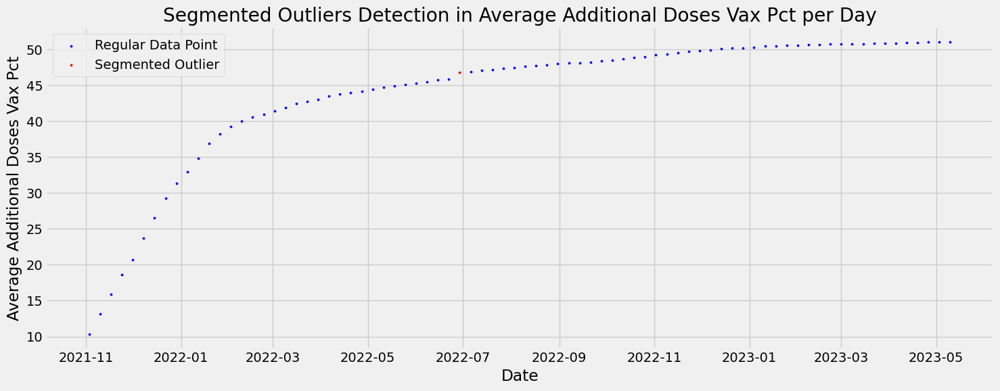

In [4]:
avg_vax_pct_per_day = df.groupby('Date')['Additional_Doses_Vax_Pct'].mean().reset_index()
# Convert 'Date' to datetime format
avg_vax_pct_per_day['Date'] = pd.to_datetime(avg_vax_pct_per_day['Date'])

# Create a month-year column for segmentation
avg_vax_pct_per_day['Month_Year'] = avg_vax_pct_per_day['Date'].dt.to_period('M')

# Group by Month_Year and calculate IQR for each month
iqr_values = avg_vax_pct_per_day.groupby('Month_Year')['Additional_Doses_Vax_Pct'].apply(lambda x: (x.quantile(0.25), x.quantile(0.75))).reset_index()
iqr_values.columns = ['Month_Year', 'IQR_Values']
iqr_values['Q1'] = iqr_values['IQR_Values'].apply(lambda x: x[0])
iqr_values['Q3'] = iqr_values['IQR_Values'].apply(lambda x: x[1])
iqr_values['Lower_Bound'] = iqr_values['Q1'] - 1.5 * (iqr_values['Q3'] - iqr_values['Q1'])
iqr_values['Upper_Bound'] = iqr_values['Q3'] + 1.5 * (iqr_values['Q3'] - iqr_values['Q1'])

# Merge the IQR values back to the main dataframe
avg_vax_pct_per_day = pd.merge(avg_vax_pct_per_day, iqr_values, on='Month_Year')

# Determine if a data point is an outlier for its respective month
avg_vax_pct_per_day['is_segmented_outlier'] = (avg_vax_pct_per_day['Additional_Doses_Vax_Pct'] < avg_vax_pct_per_day['Lower_Bound']) | (avg_vax_pct_per_day['Additional_Doses_Vax_Pct'] > avg_vax_pct_per_day['Upper_Bound'])
# Scatter plot to see segmented analysis outliers
plt.figure(figsize=(15, 6))

# Plot non-outliers in blue and outliers in red
plt.scatter(avg_vax_pct_per_day[avg_vax_pct_per_day['is_segmented_outlier'] == False]['Date'], 
            avg_vax_pct_per_day[avg_vax_pct_per_day['is_segmented_outlier'] == False]['Additional_Doses_Vax_Pct'], 
            color='blue', s=5, label='Regular Data Point')

plt.scatter(avg_vax_pct_per_day[avg_vax_pct_per_day['is_segmented_outlier'] == True]['Date'], 
            avg_vax_pct_per_day[avg_vax_pct_per_day['is_segmented_outlier'] == True]['Additional_Doses_Vax_Pct'], 
            color='red', s=5, label='Segmented Outlier')

plt.title('Segmented Outliers Detection in Average Additional Doses Vax Pct per Day')
plt.xlabel('Date')
plt.ylabel('Average Additional Doses Vax Pct')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

#### 5. Feature Engineering:

In our time-series analysis, we recognized the value of feature engineering to uncover potential predictors not explicitly present in the CDC’s API. Consequently, we integrated columns indicating the quarter, month, year, day of the week, day of the month, day of the year, and week of the year in which each observation was taken. Additionally, we established columns denoting the season of the observation (Winter, Spring, Fall, or Summer). Finally, we incorporated a Boolean column to indicate if the week of the observation encompassed a holiday, as per the `holidays` Python library, and another to denote if it contained a vaccine announcement by the CDC (Montel, 2017; Hahn, n.d.).

To explore time trends in prediction variables over time, we have had to group the data by date. This was necessary as otherwise the data contains multiple entries for each date for each state. To investigate lag we have plotted an ACF graph. The pattern the autocorrelation function (ACF) plot exhibited is commonly observed in time series data with a strong short-term memory or persistence. It implied that the most recent values have a more pronounced impact on the current value, and the impact of earlier values diminishes gradually. The decay in autocorrelation suggests a relatively fast decrease in correlation with increasing time lags. To further investigate the lag we have plotted the partial autocorrelation function (PACF) graph which showed the most significant lag at value of one week. Thus we have created a lag variable with shift of one week. Notably, autoregressive integrated moving average (ARIMA) models intrinsically factor in such dependencies.

In [5]:
# Quarter column
df['quarter'] = df['Date'].dt.quarter

# Day of year column
df['dayofyear'] = df['Date'].dt.dayofyear

# Day of month column
df['dayofmonth'] = df['Date'].dt.day

# Week of year column
df['weekofyear'] = df['Date'].dt.isocalendar().week.astype(np.int64)

# Defining function to identify season
def get_season(date):
    month = date.month
    day = date.day
    if month in [3, 4, 5]:
        season = 'spring'
    elif month in [6, 7, 8]:
        season = 'summer'
    elif month in [9, 10, 11]:
        season = 'fall'
    else:
        season = 'winter'
    

    if month == 3 and day < 20:
        season = 'winter'
    elif month == 6 and day < 21:
        season = 'spring'
    elif month == 9 and day < 22:
        season = 'summer'
    elif month == 12 and day < 21:
        season = 'fall'
    
    return season

# Applying function and creating season column
df['season'] = df['Date'].apply(get_season)

# Create a list of US holidays for the given year range in the dataframe
us_holidays = holidays.US(years=[df['Date'].dt.year.min(), df['Date'].dt.year.max()]).keys()

# Convert us_holidays to a pandas Series of datetime objects
us_holidays_series = pd.Series(pd.to_datetime(list(us_holidays)))

# Create Holiday column
df['holidays'] = df['Date'].isin(us_holidays_series) | (df['Date'] + pd.Timedelta(days=1)).isin(us_holidays_series)
df['holidays'] = df['holidays'].replace({True: 'Holiday', False: 'Normal day'})

# Determine which weeks have a holiday
holiday_weeks = us_holidays_series.dt.strftime('%U-%Y').unique()

# Assign a "holiday season" for every date that's within a week having a holiday
df['holiday_season'] = df['Date'].dt.strftime('%U-%Y').isin(holiday_weeks)

In [6]:
# Define a list of unique announcement dates
announcement_dates = [
    "04/28/2023", "04/27/2023", "04/18/2023", "03/14/2023", "03/10/2023",
    "12/16/2022", "12/08/2022", "10/21/2022", "10/12/2022", "09/13/2022",
    "08/31/2022", "08/26/2022", "08/19/2022", "07/13/2022", "07/08/2022",
    "06/30/2022", "06/17/2022", "05/17/2022", "05/05/2022", "04/29/2022",
    "04/15/2022", "04/01/2022", "03/29/2022", "03/21/2022", "03/11/2022",
    "02/11/2022", "02/01/2022", "01/31/2022", "01/11/2022", "01/07/2022",
    "01/03/2022", "12/17/2021", "12/14/2021", "12/09/2021", "11/30/2021",
    "11/19/2021", "10/29/2021", "10/26/2021", "10/22/2021", "10/20/2021",
    "10/14/2021", "10/01/2021", "09/24/2021", "09/22/2021", "09/20/2021",
    "09/17/2021", "09/10/2021", "09/02/2021", "09/01/2021", "08/24/2021",
    "08/23/2021", "08/18/2021", "08/13/2021", "08/12/2021", "08/06/2021",
    "08/03/2021", "07/30/2021", "07/16/2021", "07/13/2021", "07/08/2021",
    "07/06/2021", "07/02/2021", "06/29/2021", "06/25/2021", "06/15/2021",
    "06/11/2021", "06/10/2021", "05/25/2021", "05/19/2021", "05/11/2021",
    "05/10/2021", "04/27/2021", "04/23/2021", "04/21/2021", "04/16/2021",
    "04/13/2021", "04/12/2021", "04/01/2021", "03/26/2021", "03/24/2021",
    "03/17/2021", "03/05/2021", "03/02/2021", "02/27/2021", "02/26/2021",
    "02/25/2021", "02/23/2021", "02/22/2021", "02/12/2021", "02/05/2021",
    "02/04/2021", "01/29/2021", "01/14/2021", "01/04/2021", "12/28/2020",
    "12/22/2020", "12/21/2020", "12/18/2020", "12/17/2020", "12/14/2020", "12/12/2020"
]

# Convert to datetime and deduplicate
announcement_dates = list(set([pd.to_datetime(date) for date in announcement_dates]))

# Convert announcement dates to week-year format
announcement_weeks = [date.strftime('%U-%Y') for date in announcement_dates]

# Check if the date in the dataset is within the same week of any announcement dates
def in_announcement_week(date):
    return date.strftime('%U-%Y') in announcement_weeks

# Create the 'vax_announcement' column
df['vax_announcement'] = df['Date'].apply(in_announcement_week)

#### 6. Exploratory Data Analysis (EDA)
**Temporal Visualizations & Seasonal Decomposition**

We have used the seasonal and trend decomposition using Loess (STL) to investigate potential trends, seasons and residuals. Based on the STL plot, we have learned that `Additional_Doses_Vax_Pct` has a very steep increase in the first four to five months after the booster's initial release, and then the rate  tapered and increased at a small and steady rate. This was expected as one might consider that most people who wanted the booster, receved it when it first came out. The seasonal plot provides clear evidence for a seasonal pattern of around three months. This pattern is something we kept in mind and explored further in variable analysis. We will account for this pattern in a variety of ways moving forward with the project. For example one of the solutions we employ is to use an ARIMA model which can account for seasonal components. However, for other models we have creaed a categorical `Season` variable. Lastly, the residual pattern suggests that the STL may not have adequately captured some underlying patterns or structures in our time series data. 

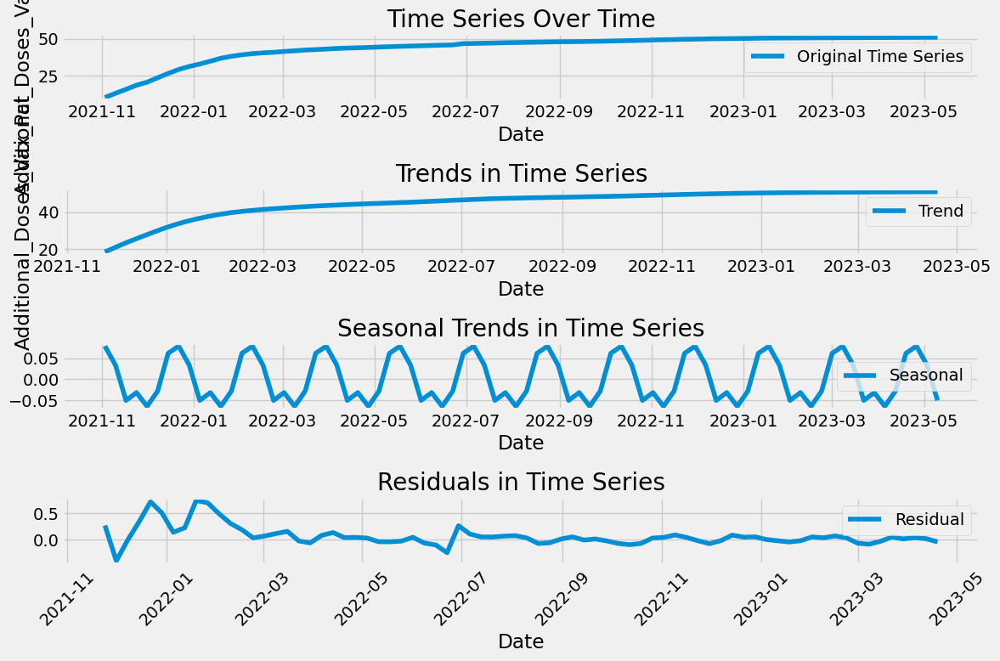

In [7]:
# STL decomposition to investigate trends, seasons and residual

# group data by date as there are multiple entires per each date
time_series_data = df.groupby('Date')[pred_var].mean().reset_index()
# set index to date
time_series_data = time_series_data.set_index('Date')

# Perform STL decomposition with a seasonality period of 7 because data are reported weekly
result = sm.tsa.seasonal_decompose(time_series_data[pred_var], model='stl', period=7)

# Access the decomposed components
trend = result.trend
seasonal = result.seasonal
residual = result.resid

# Plot the original time series, trend, seasonal, and residual components
plt.figure(figsize=(12, 8))

# Plot a subset of data 
plt.subplot(4, 1, 1)
plt.plot(time_series_data[pred_var], label='Original Time Series')
plt.legend()
plt.title('Time Series Over Time')
plt.xlabel('Date')
plt.ylabel(pred_var)


plt.subplot(4, 1, 2)
plt.plot(trend, label='Trend')
plt.legend()
plt.title('Trends in Time Series')
plt.xlabel('Date')
plt.ylabel(pred_var)



plt.subplot(4, 1, 3)
plt.plot(seasonal, label='Seasonal')
plt.legend()
plt.title('Seasonal Trends in Time Series')
plt.xlabel('Date')

plt.subplot(4, 1, 4)
plt.plot(residual, label='Residual')
plt.legend()
plt.title('Residuals in Time Series')
plt.xlabel('Date')

# Customize x-axis labels to rotate by 45 degrees
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


**Correlation Analysis**

This ACF pattern is commonly observed in time series data with a strong short-term memory or persistence. It implies that the most recent values have a more pronounced impact on the current value, and the impact of earlier values diminishes gradually. The decay in autocorrelation suggests a relatively fast decrease in correlation with increasing time lags. Autoregressive models are ideal for dealing with this particular autocorrelation pattern. To investigate this further we have looked at the PACF graph and identified the biggest spike at value of one week. To prevent correlation issues in our model I will experiement with adding lag terms such as one week.

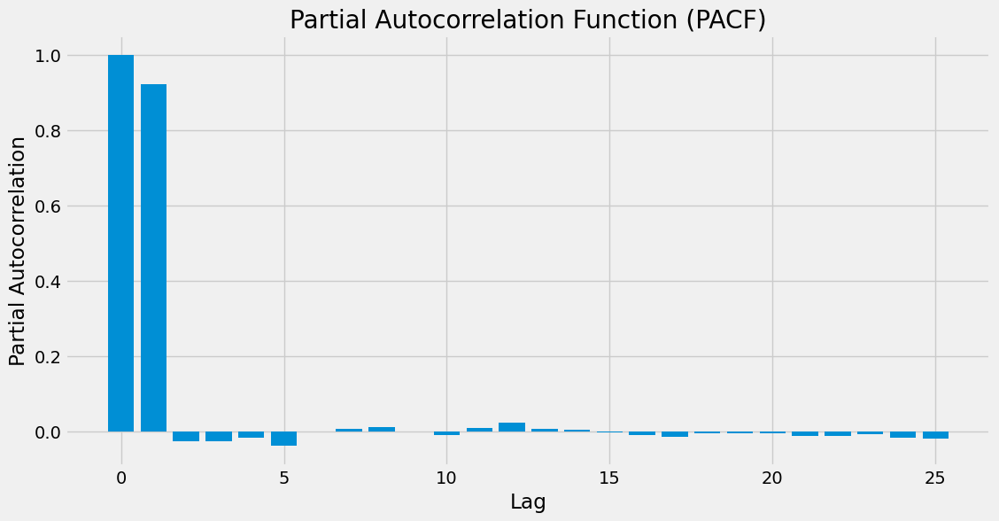

In [8]:
# PACF Plot

# Calculate the PACF
pacf = sm.tsa.pacf(time_series_data, nlags=25)

# Create the PACF plot
plt.figure(figsize=(12, 6))
plt.bar(range(len(pacf)), pacf)
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.title('Partial Autocorrelation Function (PACF)')
plt.grid(True)
plt.show()

Below, I add the one week lag as indicated to do so by the PACF graph. This is the final preprocessing step I took, and I exported the preprocessed dataframe for ease of use across all of my models. Therefore, the dataframe I will use and reference in the model development section and beyond will be `'df_post_eda.csv'`. 

In [9]:
# Adding one week lag
df['Additional_Doses_Vax_Pct_1_w_lag'] = df['Additional_Doses_Vax_Pct'].shift(1)

#### Univariate Analysis
**Distribution of Response Variable**

Here, we can see that the response variable is skewed to the left and that the most significant concentration of data lies between the 30% to 50% vaccination rate, suggesting that for many samples, the percentage of additional doses administered falls within this range. It's worth noting the scarcity of data points both below 10% and above 60%. This indicates that very low and very high vaccination rates are less common among the samples we have.

<Axes: xlabel='Additional_Doses_Vax_Pct', ylabel='Count'>

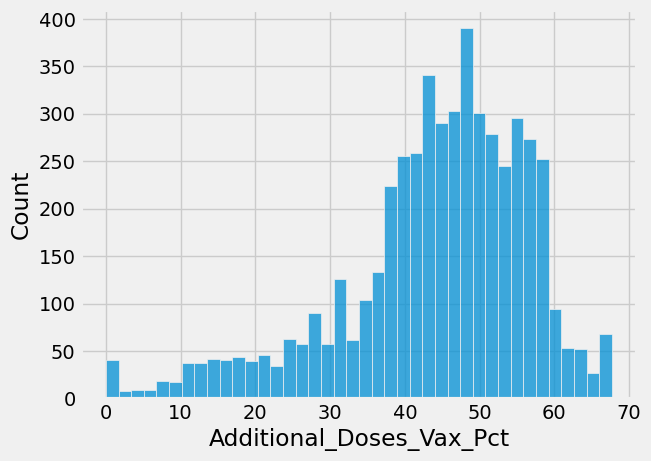

In [10]:
# Distribution of response variable
sns.histplot(df[pred_var], kde=False )

**Distribution of features after data cleaning and imputation**

We can see that many of the features are relatively normally distributted with some having an extreme skew.

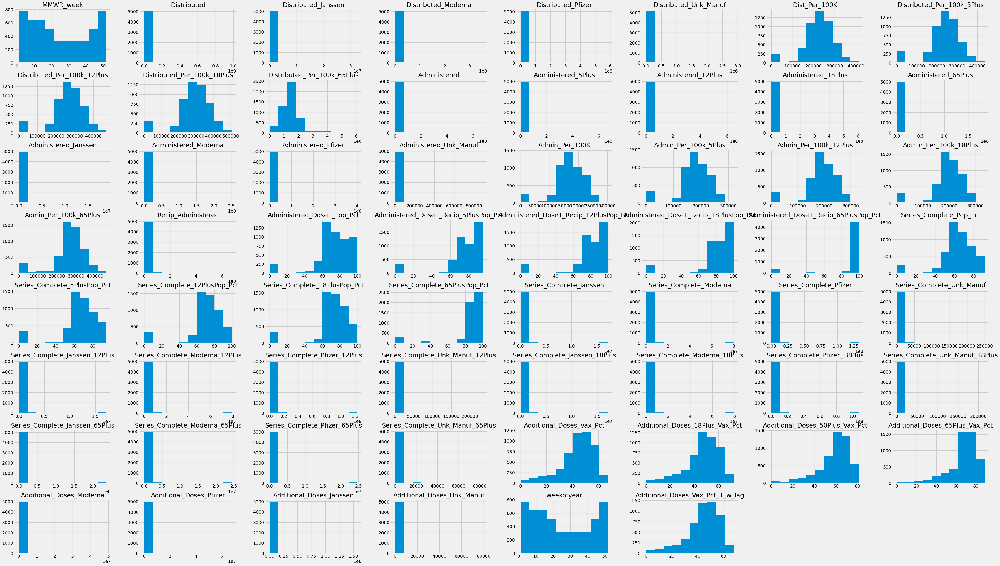

In [11]:
# Distribution of features after data cleaning and imputation

# find continous/ numerical variables
continuous_vars = df.select_dtypes(include=['float64', 'int64']).columns.tolist()

# plot df
%matplotlib inline
df.hist (column= continuous_vars,figsize= (50,30))
#hides array names that are otherwise printed
_ = plt.plot()

**Distribution of feature-engineered `season`**

We can see that there are more observations from the winter. This may have been because of where we start and end out data as a result of vaccine guidelines for 5-11 year olds.

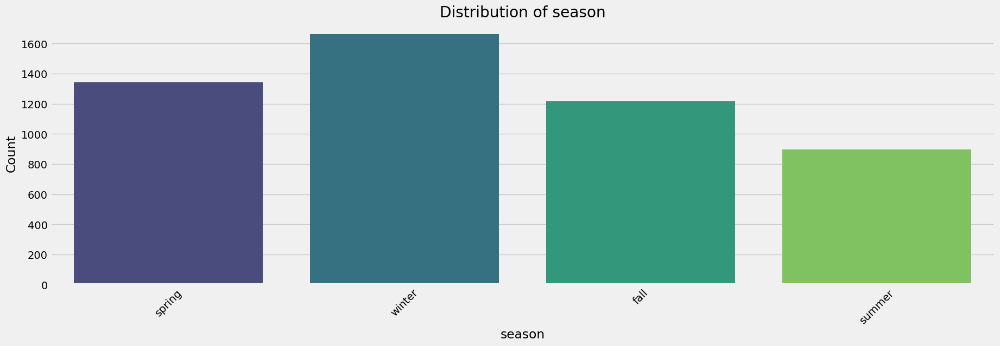

In [12]:
# Distribution of season 
categorical_variable = 'season'

# Create a countplot
plt.figure(figsize=(20, 6))  
sns.countplot(data=df, x=categorical_variable, palette='viridis')  
plt.title(f'Distribution of {categorical_variable}')
plt.xlabel(categorical_variable)
plt.ylabel('Count')

# Rotate x-axis labels for better readability 
plt.xticks(rotation=45)

# Show the plot
plt.show()

**Distribution of feature-engineered `holiday_season`**

We can observe that relatively few vaccination rates were reported in weeks when there was a US holiday. 

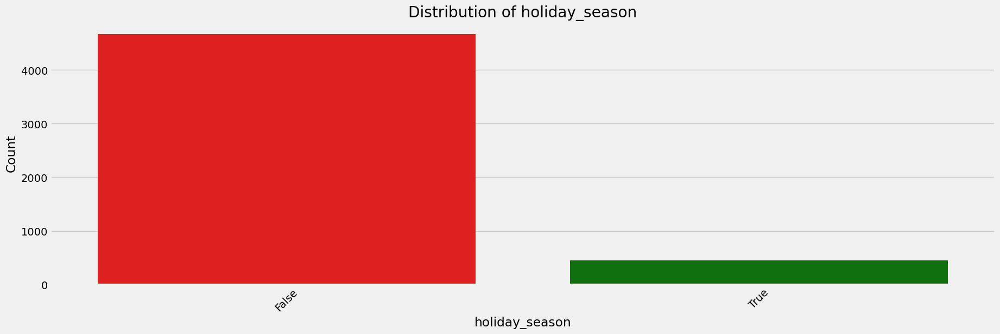

In [13]:
# Custom Boolean color palette
boolean_palette = {True: 'green', False: 'red'}

# Distribution of holidays
categorical_variable = 'holiday_season'

# Create a countplot
plt.figure(figsize=(20, 6))  
sns.countplot(data=df, x=categorical_variable, palette=boolean_palette) 
plt.title(f'Distribution of {categorical_variable}')
plt.xlabel(categorical_variable)
plt.ylabel('Count')

# Rotate x-axis labels for better readability 
plt.xticks(rotation=45)

# Show the plot
plt.show()

**Distribution of feature-engineered `vax_announcement`**

There are a pretty significant proportion of vaccine rate observations on a week where there was a CDC vaccine announcement. This could be because there were a lot of announcements reported, though.

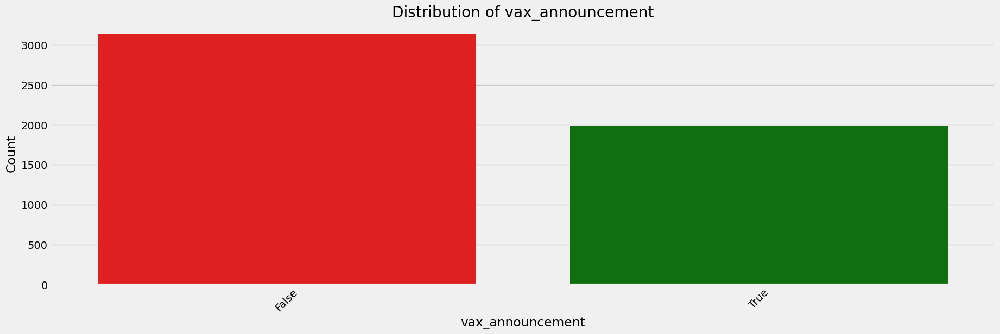

In [14]:
# Distribution of doses near vaccine announcements
categorical_variable = 'vax_announcement'

# Create a countplot
plt.figure(figsize=(20, 6))  # Set the figure size
sns.countplot(data=df, x=categorical_variable, palette=boolean_palette)  
plt.title(f'Distribution of {categorical_variable}')
plt.xlabel(categorical_variable)
plt.ylabel('Count')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()

**Distribution of `Location`**

The observations across locations are almost completely even with around 15 less reports from Palau and around 60 less reports from the location code RP (we were unable to find this location's corresponding state/territory name).

#### Bivariate Analysis
To further investigate the seasonal trends found in the STL plots we have plotted box plots of `Month` and `Season` against our prediction variable. Based on these plots we can see that the median across all categories is pretty similar. However, both November and Fall have a significanly larger IQR. This is potentially related to the fact that our data subset starts in Novemember (Fall), meaning that it had a lot of low percentage of values in 2021 when the COVID booster first came out.

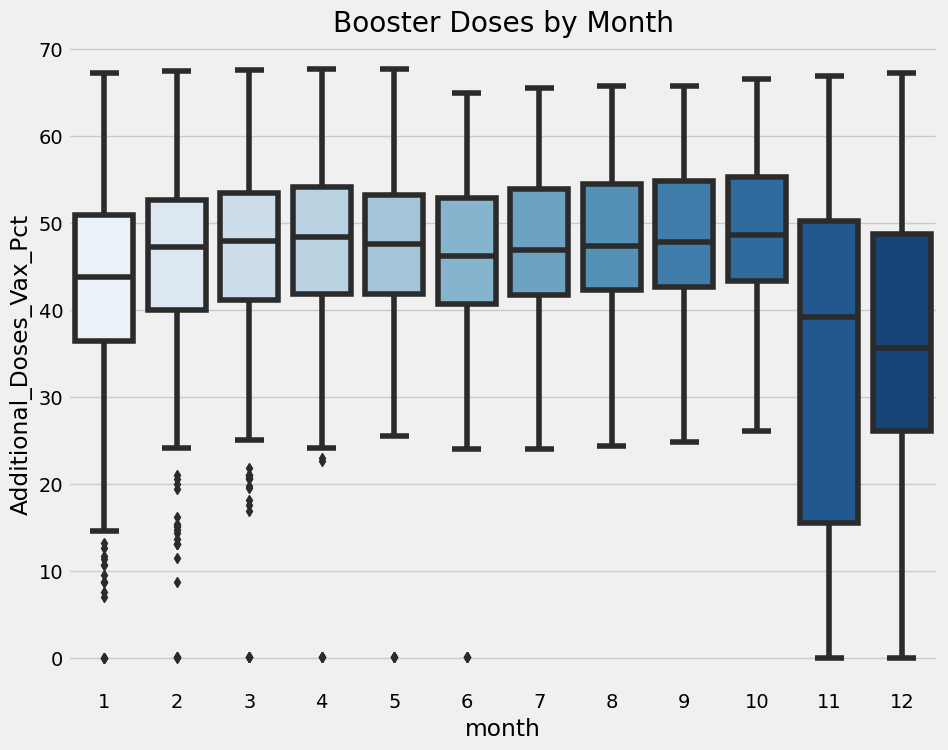

In [15]:
# visualize the monthly pred_var
features_target = df[['day_of_week', 'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear','season', 'holidays', 'holiday_season', 'vax_announcement','Additional_Doses_Vax_Pct_1_w_lag', pred_var,'Date']]
features_target = features_target.set_index('Date')
fig, ax = plt.subplots(figsize=(10, 8))
sns.boxplot(data=features_target, x='month', y=pred_var, palette='Blues')
ax.set_title('Booster Doses by Month')
plt.show()

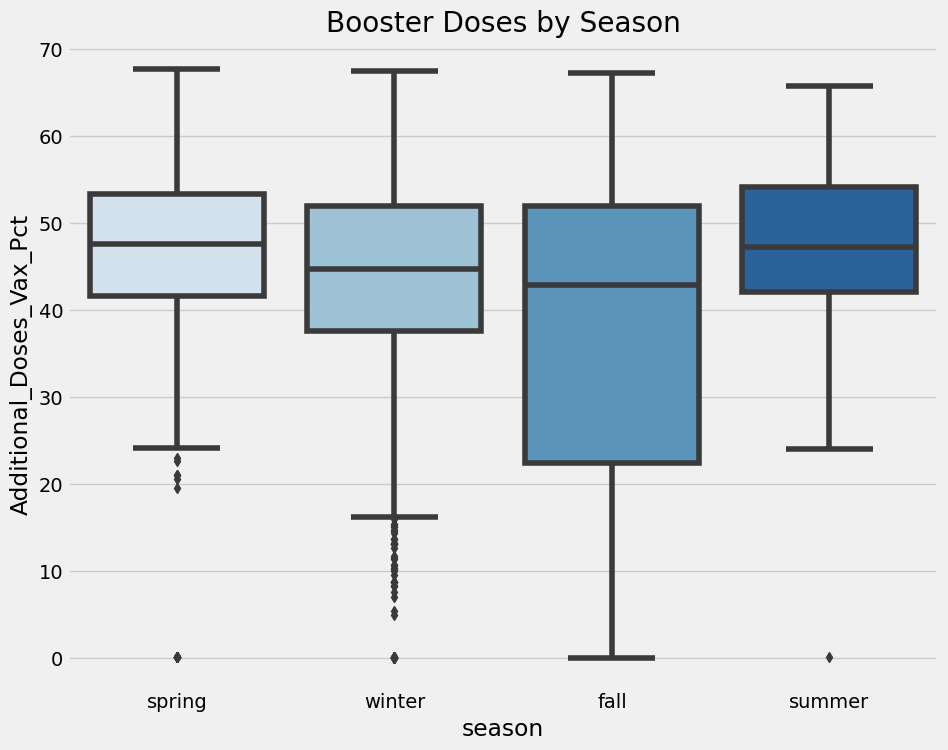

In [16]:
fig, ax = plt.subplots(figsize=(10, 8))
sns.boxplot(data=features_target, x='season', y=pred_var, palette='Blues')
ax.set_title('Booster Doses by Season')
plt.show()

#### Multivariate Analysis
Based on multivariate heatmaps there are few variables that have relatively high correlation with our prediction variable. These features may have contributed to some of the overfitting issues I had with model development.

<Figure size 1000x800 with 0 Axes>

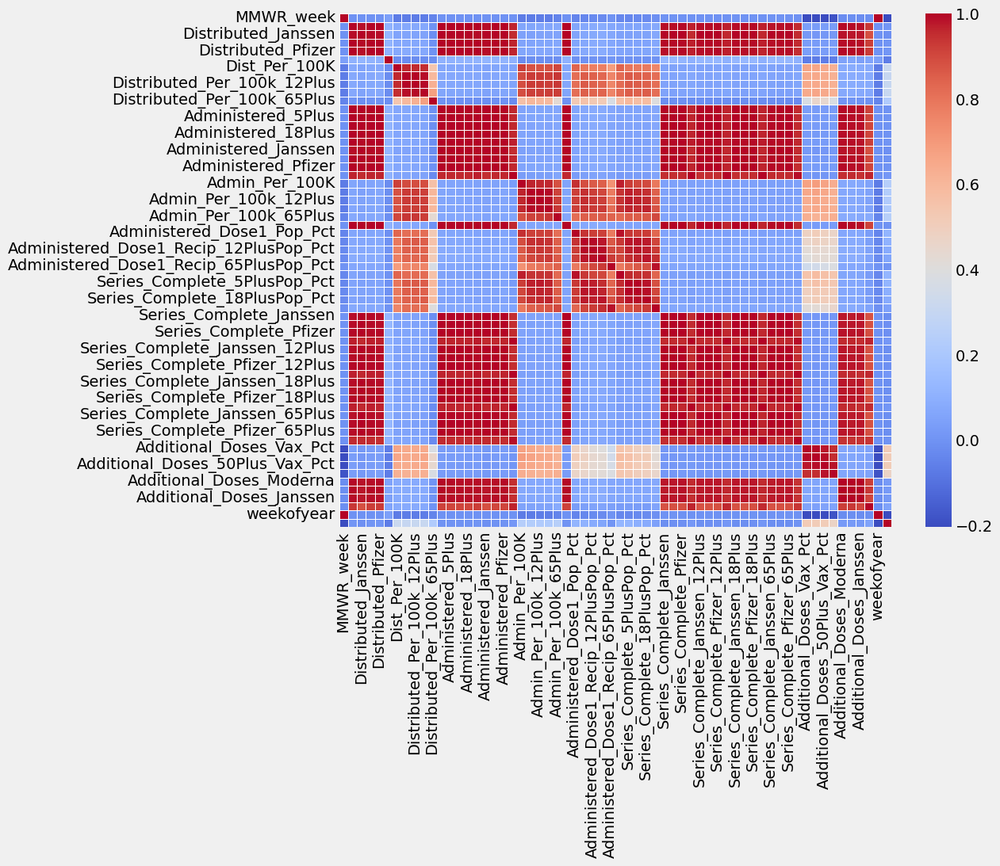

In [19]:
# Heat map to show correlation between variables
continuous_vars = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
plt.figure(figsize=(10, 8))  
# Assuming 'df' is your DataFrame and 'continuous_vars' is the list of continuous variable names
plt.figure(figsize=(10, 8))
sns.heatmap(df[continuous_vars].corr(), cmap='coolwarm', linewidths=0.5)

plt.show()

<Axes: >

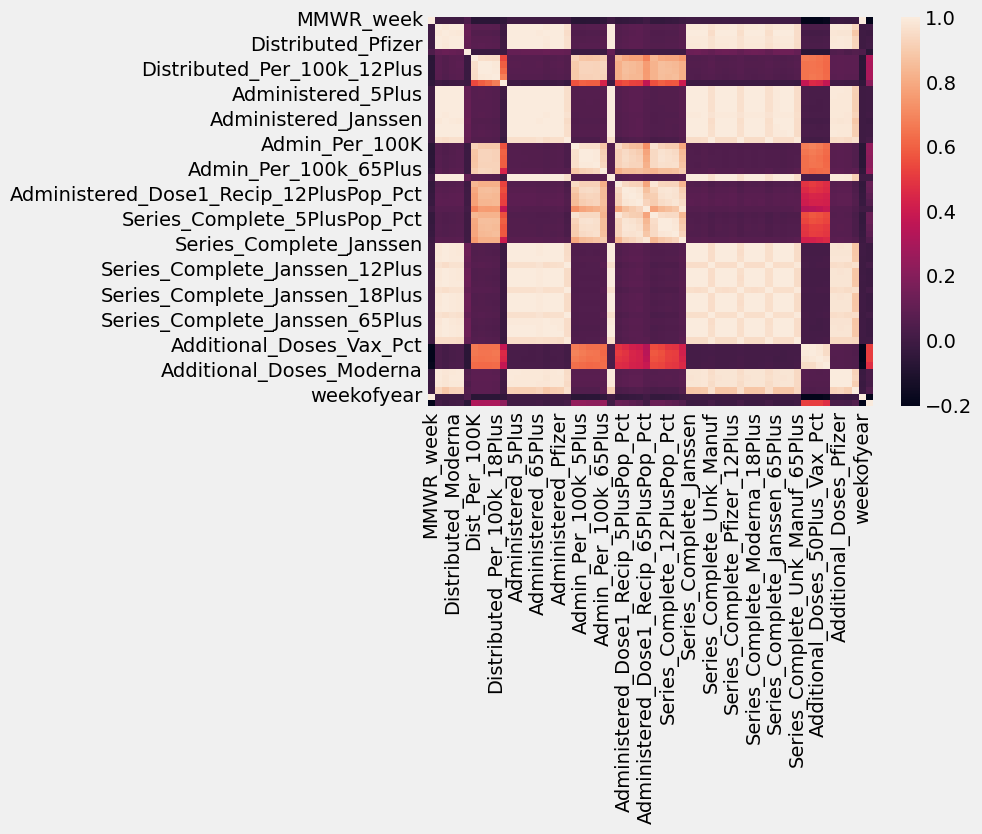

In [21]:
# Engineered feature correlations

correlation = df[continuous_vars].corr( method='pearson' )
sns.heatmap( correlation )

## III. Methodology
### A. `ARIMA` Model
#### 1. Data Preparation:

For the Autoregressive Integrated Moving Average Prediction (ARIMA) model, I imported solely the `Date` and response variable columns as the model inherently does not take any other features (Munichiello, 2023). I then grouped `Date` by location as ARIMA models must have one unique observation per date. Finally, I scaled the data as that has improved all of the models.

In [22]:
# Predictive variable
pred_var = 'Additional_Doses_Vax_Pct'

# Import data with specific columns
df = pd.read_csv('df_post_eda.csv', usecols=['Date', pred_var])

# Convert 'Date' to datetime and group by 'Date'
df['Date'] = pd.to_datetime(df['Date'])
df = df.groupby('Date')[pred_var].mean()

# Sorting the DataFrame by the index
df.sort_index(inplace=True)

# Calculate the index for the 70-30 split
split_index = int(len(df) * 0.7)

# Initialize the MinMaxScaler to scale data between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))

# Apply the scaler to the data
df_scaled = pd.DataFrame(scaler.fit_transform(df.values.reshape(-1, 1)), index=df.index, columns=[pred_var])

To check the stationarity of my data, I performed the Augmented Dickey-Fuller test to see if the $p-value ≤ 0.05$ meaning the data does not have a unit root. I also created an autocorrelation plot to show that, after around 11 lags, the autocorrelation remained between 0.25 and -0.25. Although the data passed this test, I know that stationary data have a property that the mean, variance and autocorrelation structure do not change over time (National Institute of Standards and Technology (NIST), n.d.). It is clear from the graph that both the mean and standard devation change over time. This may be because the vaccination rate was increasing so rapidly in the beginning of our dataset beforetapering off as more people got vaccinated in each `Location`. I believe the ADF test did not reflect this because of the cumulative nature of the dataset. For this reason, I assumed my data to be non-stationary.

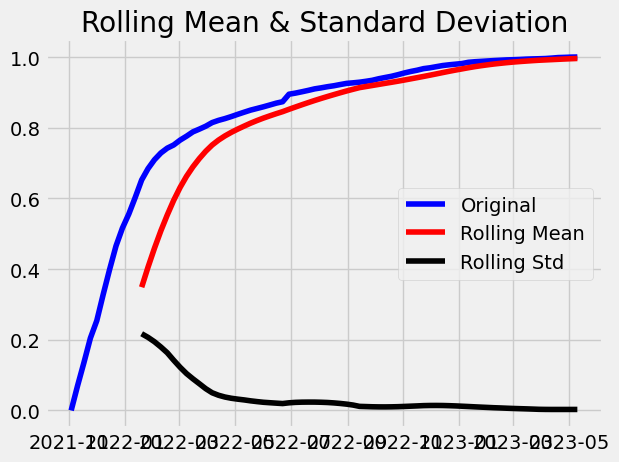

Results of Dickey-Fuller Test:
Test Statistic                 -4.009253
p-value                         0.001363
#Lags Used                      2.000000
Number of Observations Used    77.000000
Critical Value (1%)            -3.518281
Critical Value (5%)            -2.899878
Critical Value (10%)           -2.587223
dtype: float64


<Axes: xlabel='Lag', ylabel='Autocorrelation'>

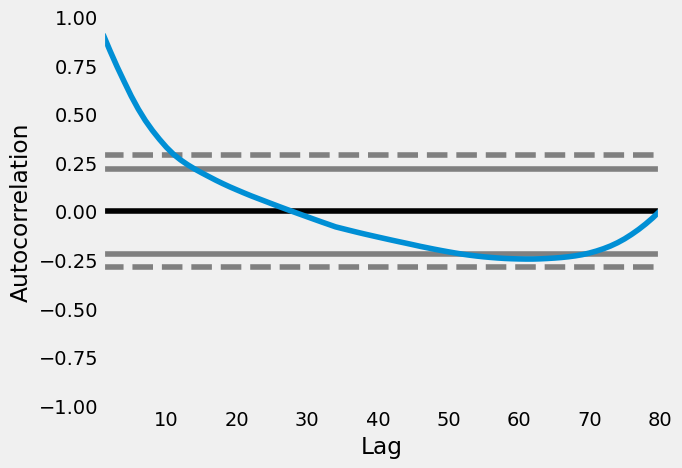

In [23]:
# Perform Augmented Dickey-Fuller test:
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolling_mean = timeseries.rolling(window=12).mean()
    rolling_std = timeseries.rolling(window=12).std()

    # Plot rolling statistics:
    plt.plot(timeseries, color='blue',label='Original')
    plt.plot(rolling_mean, color='red', label='Rolling Mean')
    plt.plot(rolling_std, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Perform Augmented Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    adf_test = adfuller(timeseries, autolag='AIC')
    adf_output = pd.Series(adf_test[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in adf_test[4].items():
        adf_output['Critical Value (%s)' % key] = value
    print(adf_output)

# Testing
test_stationarity(df_scaled[pred_var])

#Autocorrelation plot
autocorrelation_plot(df_scaled[pred_var])

ARIMA models are defined by several key parameters such as `order` and `seasonal_order` for seasonal data (SARIMA). Their descriptions are as follows:

- `order`: This parameter is a tuple `(p, d, q)`.
    - Lag order (`p`): Refers to the number of lag observations included in the model, or the number of past values used for predicting the future values.
    - Degree of differencing (`d`): Indicates the number of times that the raw observations are differenced. This helps in making the time series stationary.
    - Moving average order (`q`): Represents the size of the moving average window, or the number of lagged forecast errors that should be included in the ARIMA model.

- `seasonal_order`: This optional parameter is a tuple `(P, D, Q, s)` and is used for the seasonal component of the model.
    - Seasonal auto-regressive order (`P`): Similar to `p`, but for the seasonal component of the model. It represents the number of seasonal lags of the autoregressive model.
    - Seasonal differencing (`D`): Similar to `d`, but for the seasonal component. It refers to the number of times the seasonal differences are taken to make the series stationary.
    - Seasonal moving average order (`Q`): Similar to `q`, but for the seasonal component. It indicates the number of seasonal moving average terms.
    - Time span of repeating seasonal pattern (`s`): Denotes the length of the seasonal cycle (Munichiello, 2023; 4.1 Seasonal ARIMA Models | STAT 510, n.d.).

#### 2. Model Building
I began by splitting my data into a 70-30 train test split. Then, to develop my ARIMA model, it was important for me to analyze the Auto-Correlation Function (ACF) and Partial Auto-Correlation Function (PACF) plots to give me insight into potential `p` and `q` parameters. Since the ACF plot hits zero autocorrelation at around lag 14, it is clear that the effects of past values on the current value becomes negligible after about 14 periods. As for the PACF plot, it is clear that the autocorrelation drops below zero at lag four. 

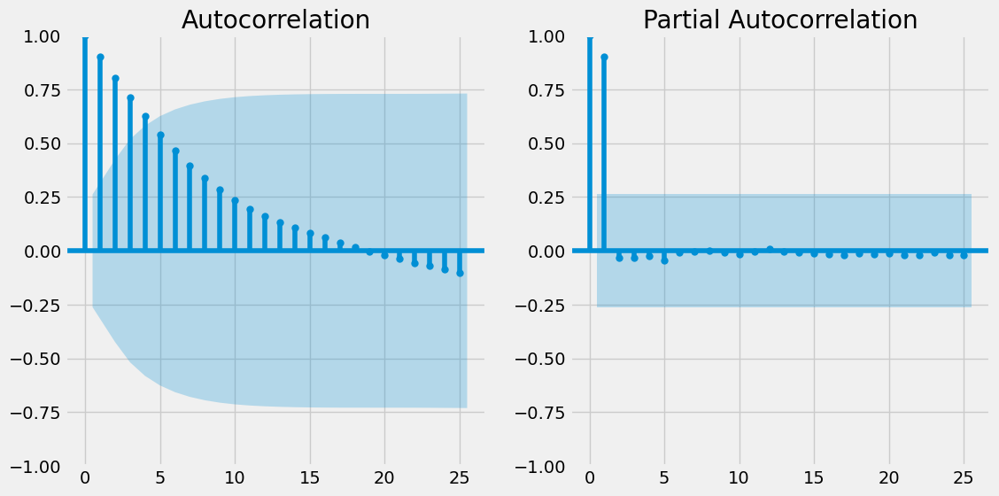

In [24]:
# Calculate the index for the 70-30 split
split_index = int(len(df_scaled) * 0.7)

# Split into scaled and differenced train and test sets
train_ar = df_scaled.iloc[:split_index]
test_ar = df_scaled.iloc[split_index:]

# Plot ACF and PACF
plt.figure(figsize=(12, 6))
plt.subplot(121)
plot_acf(train_ar, ax=plt.gca(), lags=25)
plt.subplot(122)
plot_pacf(train_ar, ax=plt.gca(), lags=25)
plt.show()


Based on the plot results, I wanted to start with a lower `q` value and then experiment with higher values if necessary. Furthermore, I will start with $p = 3$ as the PACF is significant at lag 3. I also included some other preliminary model specifications in the [ARIMA Preliminary Models](#ARIMA-Init-Model) section of the appendix.

In [25]:
# Initialize the ARIMA model
model_ar1 = ARIMA(train_ar, order=(3, 0, 1))

# Fit the ARIMA model
fitted_model_ar1 = model_ar1.fit()

# Print out the summary of the fit model
fitted_model_ar1.summary()

/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                  SARIMAX Results                                   
====================================================================================
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(3, 0, 1)   Log Likelihood                 192.073
Date:                      Mon, 27 Nov 2023   AIC                           -372.146
Time:                              13:49:27   BIC                           -359.993
Sample:                          11-03-2021   HQIC                          -367.434
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5959      0.148      4.036      0.000       0.307       0.885
ar.L1          1.1266      0.189      5.967      0.000       0.757       1.497
ar.L2          0.7027      0.369      1.905      0.057      -0.020       1.426
ar.L3         -0.8425      0.184     -4.570      0.000      -1.204      -0.481
ma.L1          0.7227      0.280      2.578      0.010       0.173       1.272
sigma2      4.939e-05   8.15e-06      6.060      0.000    3.34e-05    6.54e-05
===================================================================================
Ljung-Box (L1) (Q):                   0.53   Jarque-Bera (JB):                 8.88
Prob(Q):                              0.47   Prob(JB):                         0.01
Heteroskedasticity (H):               0.09   Skew:                            -0.38
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.79
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [27]:
# Calculate the train RMSE
train_rmse = sqrt(mean_squared_error(train_ar, fitted_model_ar1.fittedvalues))
print('The Train RMSE is {}'.format(round(train_rmse, 2)))

# Make predictions on the test set
predictions = fitted_model_ar1.predict(start=len(train_ar), end=len(train_ar) + len(test_ar) - 1, dynamic=False)
# Calculate the test RMSE
test_rmse = sqrt(mean_squared_error(test_ar, predictions))
print('The Test RMSE is {}'.format(round(test_rmse, 2)))


The Train RMSE is 0.08
The Test RMSE is 0.26


To refine further, however, I wanted to look at other specifications by iterating over different `p`,`d`,`q` combinations based on the initial insights from the plots. Since the data have been proven not to be stationary, I wanted to explore `d` values greater than 0 to potentially increase model robustness and accuracy by differencing the data.

Therefore, I defined the `p`,`d`, and `q` parameter range to perform a grid search over the different combinations. I fit each ARIMA model to the training data, calculate the Akaike Information Criterion (AIC) for model comparison, and compute the Root Mean Square Error (RMSE) on the test data for each parameter combination to evaluate model accuracy. I then identify the best-performing model based on both the lowest AIC and test RMSE, respectively, and print the model summary.

After consulting with my teammates, they mentioned that they implemented a rolling forecast origin approach to their ARIMA model. Instead of just predicting on the test set from the beginning to the end of the indices, they implemented a rolling forecast so that the model is retrained for every new prediction in the test set. This is supposed to ensure more accurate and adaptive predictive capabilities (Brownlee, 2023). I decided to try this as well to see if I could improve my ARIMA results, and it did not. However, I included those results below. Some of my other less successful ARIMA tunings can be found in the [ARIMA](#ARIMA-tune-prelim) section of the appendix. 

The best performing model I found used the parameters (0,1,6).

**Normal Tuning**

In [28]:
# Define the p, d, and q parameter ranges
p = d = range(0, 3)
q = range(0, 7)

# Generate all different combinations of p, d, and q triplets
pdq = list(itertools.product(p, d, q))

# Record AIC scores and RMSE
aic_scores = []
rmse_scores = []

best_aic_model = None
lowest_aic = float('inf')
best_rmse_model = None
lowest_rmse = float('inf')

# Run a grid search over different p,d,q combinations
for param in pdq:
    try:
        mod = ARIMA(train_ar, order=param)
        results = mod.fit()
        aic = results.aic
        aic_scores.append((param, aic))
        print('ARIMA{} - AIC:{}'.format(param, aic))

        if aic < lowest_aic:
            best_aic_model = (param, results)
            lowest_aic = aic

        # Predict on the test set and calculate RMSE
        test_pred = results.predict(start=test_ar.index[0], end=test_ar.index[-1], dynamic=False)
        test_rmse = np.sqrt(mean_squared_error(test_ar, test_pred))
        rmse_scores.append((param, test_rmse))
        print(f'ARIMA{param} - Test RMSE: {test_rmse}')

        if test_rmse < lowest_rmse:
            best_rmse_model = (param, results)
            lowest_rmse = test_rmse

    except Exception as e:
        print(f'Error fitting ARIMA{param}: {e}')
        continue

# Find the parameters with minimal AIC value
print(f"ARIMA{best_aic_model[0]} with lowest AIC of {lowest_aic}")

# Find the parameters with minimal test RMSE value
print(f"ARIMA{best_rmse_model[0]} with lowest test RMSE of {lowest_rmse}")

# Use the best AIC parameters to fit the model
best_aic_fitted_model = best_aic_model[1]
print(best_aic_fitted_model.summary())

# Use the best RMSE parameters to fit the model
best_rmse_fitted_model = best_rmse_model[1]
best_rmse_summary = best_rmse_fitted_model.summary()

# Print the train and test RMSE for the best RMSE model
best_rmse_param, best_rmse_results = best_rmse_model
train_pred_rmse = best_rmse_results.predict(start=train_ar.index[0], end=train_ar.index[-1], dynamic=False)
train_rmse_best = np.sqrt(mean_squared_error(train_ar, train_pred_rmse))
test_rmse_best = lowest_rmse
print(f"Best ARIMA{best_rmse_param} - Train RMSE: {train_rmse_best}")
print(f"Best ARIMA{best_rmse_param} - Test RMSE: {test_rmse_best}")

/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 0, 0) - AIC:4.247377915841888
ARIMA(0, 0, 0) - Test RMSE: 0.23350429504237882
ARIMA(0, 0, 1) - AIC:-61.386166557230766
ARIMA(0, 0, 1) - Test RMSE: 0.23563160917092582
ARIMA(0, 0, 2) - AIC:-120.75241682724243
ARIMA(0, 0, 2) - Test RMSE: 0.23827322868086245
ARIMA(0, 0, 3) - AIC:-167.77581727403606
ARIMA(0, 0, 3) - Test RMSE: 0.2450247838181501
ARIMA(0, 0, 4) - AIC:-208.98721984355345
ARIMA(0, 0, 4) - Test RMSE: 0.24176701301825643
ARIMA(0, 0, 5) - AIC:-238.79317806887153
ARIMA(0, 0, 5) - Test RMSE: 0.24330099657704457
ARIMA(0, 0, 6) - AIC:-260.72140641203134
ARIMA(0, 0, 6) - Test RMSE: 0.24630483027520078
ARIMA(0, 1, 0) - AIC:-233.93423132271894
ARIMA(0, 1, 0) - Test RMSE: 0.023575872585425713
ARIMA(0, 1, 1) - AIC:-281.8755026362179
ARIMA(0, 1, 1) - Test RMSE: 0.021703558248683898
ARIMA(0, 1, 2) - AIC:-317.04502425321454
ARIMA(0, 1, 2) - Test RMSE: 0.0201882822743985
ARIMA(0, 1, 3) - AIC:-334.6221693724792
ARIMA(0, 1, 3) - Test RMSE: 0.014583201227370708


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 1, 4) - AIC:-341.17129968294756
ARIMA(0, 1, 4) - Test RMSE: 0.013322866549782732
ARIMA(0, 1, 5) - AIC:-344.26377726332
ARIMA(0, 1, 5) - Test RMSE: 0.013634877951547084
ARIMA(0, 1, 6) - AIC:-354.75089008501647
ARIMA(0, 1, 6) - Test RMSE: 0.009937797182224015
ARIMA(0, 2, 0) - AIC:-381.44345120781577
ARIMA(0, 2, 0) - Test RMSE: 0.040002527192291915
ARIMA(0, 2, 1) - AIC:-382.8312301530113
ARIMA(0, 2, 1) - Test RMSE: 0.03787599765300815
ARIMA(0, 2, 2) - AIC:-380.8791307958302
ARIMA(0, 2, 2) - Test RMSE: 0.037604675379974556
ARIMA(0, 2, 3) - AIC:-378.92034573917493
ARIMA(0, 2, 3) - Test RMSE: 0.03743234988239117


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 2, 4) - AIC:-385.57523592106753
ARIMA(0, 2, 4) - Test RMSE: 0.03231499129382203
ARIMA(0, 2, 5) - AIC:-382.91815096136696
ARIMA(0, 2, 5) - Test RMSE: 0.04199302233056776
ARIMA(0, 2, 6) - AIC:-383.45095430858504
ARIMA(0, 2, 6) - Test RMSE: 0.04041100035020977
ARIMA(1, 0, 0) - AIC:-228.61918020716223
ARIMA(1, 0, 0) - Test RMSE: 0.03531958289162262
ARIMA(1, 0, 1) - AIC:-269.24796001003426
ARIMA(1, 0, 1) - Test RMSE: 0.04874606400987704
ARIMA(1, 0, 2) - AIC:-307.1027082494086
ARIMA(1, 0, 2) - Test RMSE: 0.042940251203072044
ARIMA(1, 0, 3) - AIC:-329.1694480883456
ARIMA(1, 0, 3) - Test RMSE: 0.0365148932957402


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(1, 0, 4) - AIC:-335.013299468729
ARIMA(1, 0, 4) - Test RMSE: 0.06287603251109312
ARIMA(1, 0, 5) - AIC:-337.7136153956957
ARIMA(1, 0, 5) - Test RMSE: 0.07391378248693989
ARIMA(1, 0, 6) - AIC:-332.4450350634247
ARIMA(1, 0, 6) - Test RMSE: 0.22618906304649647
ARIMA(1, 1, 0) - AIC:-382.877948427655
ARIMA(1, 1, 0) - Test RMSE: 0.027128500099903603


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(1, 1, 1) - AIC:-384.23718277178415
ARIMA(1, 1, 1) - Test RMSE: 0.032487286494587486
ARIMA(1, 1, 2) - AIC:-382.3689356103163
ARIMA(1, 1, 2) - Test RMSE: 0.033155757325325864
ARIMA(1, 1, 3) - AIC:-374.2438675173964
ARIMA(1, 1, 3) - Test RMSE: 0.013461639971627658
ARIMA(1, 1, 4) - AIC:-387.97730073335714
ARIMA(1, 1, 4) - Test RMSE: 0.01785447830243275


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(1, 1, 5) - AIC:-388.7020424979628
ARIMA(1, 1, 5) - Test RMSE: 0.015078569479815946
ARIMA(1, 1, 6) - AIC:-388.4099480064063
ARIMA(1, 1, 6) - Test RMSE: 0.020924211162350183
ARIMA(1, 2, 0) - AIC:-382.8776751931645
ARIMA(1, 2, 0) - Test RMSE: 0.03768944679741849
ARIMA(1, 2, 1) - AIC:-380.87007247939215
ARIMA(1, 2, 1) - Test RMSE: 0.03784318480267536
ARIMA(1, 2, 2) - AIC:-375.7907461572404
ARIMA(1, 2, 2) - Test RMSE: 0.10997274638119175
ARIMA(1, 2, 3) - AIC:-377.41886357440137
ARIMA(1, 2, 3) - Test RMSE: 0.036931397430668415
ARIMA(1, 2, 4) - AIC:-383.63415198973996
ARIMA(1, 2, 4) - Test RMSE: 0.027857734773898704


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(1, 2, 5) - AIC:-385.0860947023966
ARIMA(1, 2, 5) - Test RMSE: 0.03891368386925232
ARIMA(1, 2, 6) - AIC:-382.50216905749863
ARIMA(1, 2, 6) - Test RMSE: 0.04814229206077891
ARIMA(2, 0, 0) - AIC:-373.16946963052357
ARIMA(2, 0, 0) - Test RMSE: 0.26785937635451923
ARIMA(2, 0, 1) - AIC:-376.1986841777029
ARIMA(2, 0, 1) - Test RMSE: 0.2302198362751503


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(2, 0, 2) - AIC:-282.4086129935133
ARIMA(2, 0, 2) - Test RMSE: 0.042401390496491935
ARIMA(2, 0, 3) - AIC:-311.3186709873355
ARIMA(2, 0, 3) - Test RMSE: 0.07649427150332398
ARIMA(2, 0, 4) - AIC:-328.1302481051966
ARIMA(2, 0, 4) - Test RMSE: 0.04088353075973026


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(2, 0, 5) - AIC:-331.6524564508811
ARIMA(2, 0, 5) - Test RMSE: 0.05098796116315466
ARIMA(2, 0, 6) - AIC:-292.10284992382935
ARIMA(2, 0, 6) - Test RMSE: 0.4137898362441912
ARIMA(2, 1, 0) - AIC:-384.368303927542
ARIMA(2, 1, 0) - Test RMSE: 0.03295018013107606
ARIMA(2, 1, 1) - AIC:-382.1998843707397
ARIMA(2, 1, 1) - Test RMSE: 0.03165330965310442
ARIMA(2, 1, 2) - AIC:-380.8129483990026
ARIMA(2, 1, 2) - Test RMSE: 0.03438531513038868


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(2, 1, 3) - AIC:-378.72694645280524
ARIMA(2, 1, 3) - Test RMSE: 0.035259715041872086
ARIMA(2, 1, 4) - AIC:-377.06711037555243
ARIMA(2, 1, 4) - Test RMSE: 0.025298754081975256
ARIMA(2, 1, 5) - AIC:-384.2577072621762
ARIMA(2, 1, 5) - Test RMSE: 0.024082589438175914


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(2, 1, 6) - AIC:-386.6125135638169
ARIMA(2, 1, 6) - Test RMSE: 0.02527410092215167
ARIMA(2, 2, 0) - AIC:-380.8901883396523
ARIMA(2, 2, 0) - Test RMSE: 0.03768274777956401
ARIMA(2, 2, 1) - AIC:-378.89418192149424
ARIMA(2, 2, 1) - Test RMSE: 0.03769891905870269
ARIMA(2, 2, 2) - AIC:-376.90090791610766
ARIMA(2, 2, 2) - Test RMSE: 0.037682208229094606
ARIMA(2, 2, 3) - AIC:-378.4137824836483
ARIMA(2, 2, 3) - Test RMSE: 0.0346530674415241
ARIMA(2, 2, 4) - AIC:-381.2931815248008
ARIMA(2, 2, 4) - Test RMSE: 0.03737151251748326


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(2, 2, 5) - AIC:-383.15434495370494
ARIMA(2, 2, 5) - Test RMSE: 0.0315477581160997
ARIMA(2, 2, 6) - AIC:-382.9672222960308
ARIMA(2, 2, 6) - Test RMSE: 0.03800766679007163
ARIMA(1, 1, 5) with lowest AIC of -388.7020424979628
ARIMA(0, 1, 6) with lowest test RMSE of 0.009937797182224015
                                  SARIMAX Results                                   
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(1, 1, 5)   Log Likelihood                 201.351
Date:                      Mon, 27 Nov 2023   AIC                           -388.702
Time:                              13:52:09   BIC                           -374.651
Sample:                          11-03-2021   HQIC                          -383.268
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
                 coef    std e

/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


In [30]:
# Define the ARIMA order
arima_order016 = (0, 1, 6)

# Fit the ARIMA model
model016 = ARIMA(train_ar, order=arima_order016)
fitted_model016 = model016.fit()

# Predict on the training set
train_pred_ar016 = fitted_model016.predict(start=train_ar.index[0], end=train_ar.index[-1], typ='levels')

# Predict on the test set
test_pred_ar016 = fitted_model016.predict(start=test_ar.index[0], end=test_ar.index[-1], typ='levels')

# Calculate RMSE for train and test sets
train_rmse_ar016 = np.sqrt(mean_squared_error(train_ar, train_pred_ar016))
test_rmse_ar016 = np.sqrt(mean_squared_error(test_ar, test_pred_ar016))

# Print RMSE values
print(f"Train RMSE: {train_rmse_ar016}")
print(f"Test RMSE: {test_rmse_ar016}")

# Model summary
fitted_model016.summary()

Train RMSE: 0.011998272241271278
Test RMSE: 0.009937797182224015


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                  SARIMAX Results                                   
====================================================================================
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(0, 1, 6)   Log Likelihood                 184.375
Date:                      Mon, 27 Nov 2023   AIC                           -354.751
Time:                              13:53:03   BIC                           -340.700
Sample:                          11-03-2021   HQIC                          -349.317
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.9042      0.124      7.290      0.000       0.661       1.147
ma.L2          1.1057      0.200      5.520      0.000       0.713       1.498
ma.L3          0.8995      0.171      5.270      0.000       0.565       1.234
ma.L4          0.9681      0.303      3.197      0.001       0.375       1.562
ma.L5          0.7690      0.245      3.134      0.002       0.288       1.250
ma.L6          0.5635      0.253      2.227      0.026       0.067       1.060
sigma2      6.824e-05   1.75e-05      3.894      0.000    3.39e-05       0.000
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                59.44
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               0.05   Skew:                             1.61
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

**Rolling Forecast Tuning**

In [31]:
# Rolling forecast origin evaluation function
def rolling_forecast_origin(train_data, test_data, arima_order):
    history = [x for x in train_data]
    predictions = []
    for t in range(len(test_data)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test_data[t])
    error = mean_squared_error(test_data, predictions)
    return np.sqrt(error)

# Define the p, d, and q parameter ranges
p = d = range(0, 3)
q = range(0, 7)

# Generate all different combinations of p, d, and q triplets
pdq = list(itertools.product(p, d, q))

# Record AIC scores and RMSE
aic_scores = []
rmse_scores = []

best_aic_model = None
lowest_aic = float('inf')
best_rmse_model = None
lowest_rmse = float('inf')

# Run a grid search over different p,d,q combinations
for param in pdq:
    try:
        mod = ARIMA(train_ar, order=param)
        results = mod.fit()
        aic = results.aic
        aic_scores.append((param, aic))
        print('ARIMA{} - AIC:{}'.format(param, aic))

        if aic < lowest_aic:
            best_aic_model = (param, results)
            lowest_aic = aic

        # Use the rolling forecast origin approach for RMSE calculation
        test_rmse = rolling_forecast_origin(train_ar.values, test_ar.values, param)
        rmse_scores.append((param, test_rmse))
        print(f'ARIMA{param} - Test RMSE: {test_rmse}')

        if test_rmse < lowest_rmse:
            best_rmse_model = (param, results)
            lowest_rmse = test_rmse

    except Exception as e:
        print(f'Error fitting ARIMA{param}: {e}')
        continue

# Find the parameters with minimal AIC value
print(f"ARIMA{best_aic_model[0]} with lowest AIC of {lowest_aic}")

# Find the parameters with minimal test RMSE value
print(f"ARIMA{best_rmse_model[0]} with lowest test RMSE of {lowest_rmse}")

# Use the best AIC parameters to fit the model
best_aic_fitted_model = best_aic_model[1]
print(best_aic_fitted_model.summary())

# Use the best RMSE parameters to fit the model
best_rmse_fitted_model = best_rmse_model[1]
best_rmse_summary = best_rmse_fitted_model.summary()

# Print the train and test RMSE for the best RMSE model
best_rmse_param, best_rmse_results = best_rmse_model
train_pred_rmse = best_rmse_results.predict(start=train_ar.index[0], end=train_ar.index[-1], dynamic=False)
train_rmse_best = np.sqrt(mean_squared_error(train_ar, train_pred_rmse))
test_rmse_best = lowest_rmse
print(f"Best ARIMA{best_rmse_param} - Train RMSE: {train_rmse_best}")
print(f"Best ARIMA{best_rmse_param} - Test RMSE: {test_rmse_best}")


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 0, 0) - AIC:4.247377915841888
ARIMA(0, 0, 0) - Test RMSE: 0.19689682599508618
ARIMA(0, 0, 1) - AIC:-61.386166557230766
ARIMA(0, 0, 1) - Test RMSE: 0.1019191370564995
ARIMA(0, 0, 2) - AIC:-120.75241682724243


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 2) - Test RMSE: 0.057198496179134306
ARIMA(0, 0, 3) - AIC:-167.77581727403606


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 3) - Test RMSE: 0.03252307691385174
ARIMA(0, 0, 4) - AIC:-208.98721984355345


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 4) - Test RMSE: 0.024613571459282953
ARIMA(0, 0, 5) - AIC:-238.79317806887153


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 5) - Test RMSE: 0.014536313016410257
ARIMA(0, 0, 6) - AIC:-260.72140641203134


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 6) - Test RMSE: 0.012105676352473728
ARIMA(0, 1, 0) - AIC:-233.93423132271894
ARIMA(0, 1, 0) - Test RMSE: 0.001638176583743459
ARIMA(0, 1, 1) - AIC:-281.8755026362179


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 1, 1) - Test RMSE: 0.0010609016327302642
ARIMA(0, 1, 2) - AIC:-317.04502425321454


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 2) - Test RMSE: 0.0009347626816272875
ARIMA(0, 1, 3) - AIC:-334.6221693724792


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 3) - Test RMSE: 0.0014870537589369954
ARIMA(0, 1, 4) - AIC:-341.17129968294756


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 4) - Test RMSE: 0.0010917579260762474
ARIMA(0, 1, 5) - AIC:-344.26377726332


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 5) - Test RMSE: 0.0009591114496682588
ARIMA(0, 1, 6) - AIC:-354.75089008501647


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 6) - Test RMSE: 0.0013058042895714801
ARIMA(0, 2, 0) - AIC:-381.44345120781577


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 0) - Test RMSE: 0.0007879147333206601
ARIMA(0, 2, 1) - AIC:-382.8312301530113
ARIMA(0, 2, 1) - Test RMSE: 0.0007342490373780269
ARIMA(0, 2, 2) - AIC:-380.8791307958302


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 2, 2) - Test RMSE: 0.0007314521796732864
ARIMA(0, 2, 3) - AIC:-378.92034573917493


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 3) - Test RMSE: 0.0007325634592131251
ARIMA(0, 2, 4) - AIC:-385.57523592106753


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 4) - Test RMSE: 0.001159241575397781
ARIMA(0, 2, 5) - AIC:-382.91815096136696


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 5) - Test RMSE: 0.0010718138463683647
ARIMA(0, 2, 6) - AIC:-383.45095430858504


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 6) - Test RMSE: 0.0009897008141751056
ARIMA(1, 0, 0) - AIC:-228.61918020716223


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 0) - Test RMSE: 0.0022737166421355733
ARIMA(1, 0, 1) - AIC:-269.24796001003426


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 1) - Test RMSE: 0.005404585931399144
ARIMA(1, 0, 2) - AIC:-307.1027082494086


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 2) - Test RMSE: 0.004365683947512756
ARIMA(1, 0, 3) - AIC:-329.1694480883456


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 3) - Test RMSE: 0.0020964879671221295
ARIMA(1, 0, 4) - AIC:-335.013299468729


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 4) - Test RMSE: 0.0023322136470668876
ARIMA(1, 0, 5) - AIC:-337.7136153956957


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 5) - Test RMSE: 0.0020479490548349077
ARIMA(1, 0, 6) - AIC:-332.4450350634247


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 6) - Test RMSE: 0.0034189651106060295
ARIMA(1, 1, 0) - AIC:-382.877948427655


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 0) - Test RMSE: 0.0007732110928795112
ARIMA(1, 1, 1) - AIC:-384.23718277178415


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 1) - Test RMSE: 0.0007252399068664201
ARIMA(1, 1, 2) - AIC:-382.3689356103163


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 2) - Test RMSE: 0.0007249542934853802
ARIMA(1, 1, 3) - AIC:-374.2438675173964


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 3) - Test RMSE: 0.000782814395861608
ARIMA(1, 1, 4) - AIC:-387.97730073335714


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 4) - Test RMSE: 0.0017134809487848687
ARIMA(1, 1, 5) - AIC:-388.7020424979628


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 5) - Test RMSE: 0.0011155590927342265
ARIMA(1, 1, 6) - AIC:-388.4099480064063


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 6) - Test RMSE: 0.00123734818874504
ARIMA(1, 2, 0) - AIC:-382.8776751931645


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 0) - Test RMSE: 0.0007381664319877718
ARIMA(1, 2, 1) - AIC:-380.87007247939215


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 1) - Test RMSE: 0.0007364183066952584
ARIMA(1, 2, 2) - AIC:-375.7907461572404


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 2) - Test RMSE: 0.0011117819342048353
ARIMA(1, 2, 3) - AIC:-377.41886357440137


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 3) - Test RMSE: 0.0007288358572307232
ARIMA(1, 2, 4) - AIC:-383.63415198973996


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 4) - Test RMSE: 0.0010112311290048517
ARIMA(1, 2, 5) - AIC:-385.0860947023966


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 5) - Test RMSE: 0.001005185695742508
ARIMA(1, 2, 6) - AIC:-382.50216905749863


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 6) - Test RMSE: 0.0010431592839520952
ARIMA(2, 0, 0) - AIC:-373.16946963052357


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 0) - Test RMSE: 0.0021560403099509877
ARIMA(2, 0, 1) - AIC:-376.1986841777029


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 1) - Test RMSE: 0.0023064402318947615
ARIMA(2, 0, 2) - AIC:-282.4086129935133


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 2) - Test RMSE: 0.0027854421827834
ARIMA(2, 0, 3) - AIC:-311.3186709873355


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 3) - Test RMSE: 0.0017284632612331557
ARIMA(2, 0, 4) - AIC:-328.1302481051966


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 4) - Test RMSE: 0.001821546705616348
ARIMA(2, 0, 5) - AIC:-331.6524564508811


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 5) - Test RMSE: 0.0016393788620216896
ARIMA(2, 0, 6) - AIC:-292.10284992382935


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 6) - Test RMSE: 0.008405113630402087
ARIMA(2, 1, 0) - AIC:-384.368303927542


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 0) - Test RMSE: 0.0007367568552582056
ARIMA(2, 1, 1) - AIC:-382.1998843707397


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 1) - Test RMSE: 0.0007578723701840571
ARIMA(2, 1, 2) - AIC:-380.8129483990026


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 2) - Test RMSE: 0.0007433679604867638
ARIMA(2, 1, 3) - AIC:-378.72694645280524


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 3) - Test RMSE: 0.0007581204748123403
ARIMA(2, 1, 4) - AIC:-377.06711037555243


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 4) - Test RMSE: 0.0007194634650386461
ARIMA(2, 1, 5) - AIC:-384.2577072621762


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 5) - Test RMSE: 0.001167145444086536
ARIMA(2, 1, 6) - AIC:-386.6125135638169


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 6) - Test RMSE: 0.001159203264746481
ARIMA(2, 2, 0) - AIC:-380.8901883396523


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 0) - Test RMSE: 0.0007360772804361125
ARIMA(2, 2, 1) - AIC:-378.89418192149424


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 1) - Test RMSE: 0.000735186059287429
ARIMA(2, 2, 2) - AIC:-376.90090791610766


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 2) - Test RMSE: 0.000731458173655972
ARIMA(2, 2, 3) - AIC:-378.4137824836483


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 3) - Test RMSE: 0.0007085978823558145
ARIMA(2, 2, 4) - AIC:-381.2931815248008


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 4) - Test RMSE: 0.0007603620097464024
ARIMA(2, 2, 5) - AIC:-383.15434495370494


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 5) - Test RMSE: 0.0009086549859147037
ARIMA(2, 2, 6) - AIC:-382.9672222960308


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 6) - Test RMSE: 0.001136232470792607
ARIMA(1, 1, 5) with lowest AIC of -388.7020424979628
ARIMA(2, 2, 3) with lowest test RMSE of 0.0007085978823558145
                                  SARIMAX Results                                   
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(1, 1, 5)   Log Likelihood                 201.351
Date:                      Mon, 27 Nov 2023   AIC                           -388.702
Time:                              13:55:15   BIC                           -374.651
Sample:                          11-03-2021   HQIC                          -383.268
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------

In [32]:
# Define the ARIMA order
arima_order223 = (2, 2, 3)

# Fit the ARIMA model
model223 = ARIMA(train_ar, order=arima_order223)
fitted_model223 = model223.fit()

# Predict on the training set
train_pred_ar223 = fitted_model223.predict(start=train_ar.index[0], end=train_ar.index[-1], typ='levels')

# Predict on the test set
test_pred_ar223 = fitted_model223.predict(start=test_ar.index[0], end=test_ar.index[-1], typ='levels')

# Calculate RMSE for train and test sets
train_rmse_ar223 = np.sqrt(mean_squared_error(train_ar, train_pred_ar223))
test_rmse_ar223 = np.sqrt(mean_squared_error(test_ar, test_pred_ar223))

# Print RMSE values
print(f"Train RMSE: {train_rmse_ar223}")
print(f"Test RMSE: {test_rmse_ar223}")

# Model summary
fitted_model223.summary()

Train RMSE: 0.011363769653325214
Test RMSE: 0.0346530674415241


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                  SARIMAX Results                                   
====================================================================================
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(2, 2, 3)   Log Likelihood                 195.207
Date:                      Mon, 27 Nov 2023   AIC                           -378.414
Time:                              13:56:16   BIC                           -366.480
Sample:                          11-03-2021   HQIC                          -373.811
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2149      0.583      0.369      0.712      -0.927       1.357
ar.L2          0.3947      0.602      0.656      0.512      -0.784       1.574
ma.L1         -0.6747      0.543     -1.242      0.214      -1.739       0.390
ma.L2         -0.2652      0.751     -0.353      0.724      -1.738       1.207
ma.L3          0.3844      0.338      1.137      0.255      -0.278       1.047
sigma2      4.194e-05   5.77e-06      7.269      0.000    3.06e-05    5.33e-05
===================================================================================
Ljung-Box (L1) (Q):                   0.19   Jarque-Bera (JB):                17.89
Prob(Q):                              0.67   Prob(JB):                         0.00
Heteroskedasticity (H):               0.01   Skew:                            -0.33
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.74
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

For models without seasonality, I achieved the best results after scaling my data and performing a loop to tune for the `p`,`d`,`q` values. Although there does not appear to be any seasonality in visuals I have plotted of the data, next, I experimented with seasonality to see if I could improve my model further. I trained a base model on the scaled data with the best non-seasonal parameters found in my last tuning and `P = D = Q = 1`. However, I was unable to achieve an RMSE lower than that without a seasonality parameter, confirming my suspicions.

In [33]:
# Fit SARIMA model
p, d, q = 0, 1, 6  # Non-seasonal parameters
P, D, Q, s = 1, 1, 1, 13  # Seasonal parameters 

model = SARIMAX(train_ar, order=(p, d, q), seasonal_order=(P, D, Q, s))
fitted_model = model.fit()

# Predict on the training set
train_pred_scaled = fitted_model.predict(start=0, end=len(train_ar)-1)

# Predict on the test set
test_pred_scaled = fitted_model.predict(start=len(train_ar), end=len(train_ar) + len(test_ar) - 1)

# Calculate RMSE for train and test sets (on scaled data)
train_rmse_scaled = np.sqrt(mean_squared_error(train_ar, train_pred_scaled))
test_rmse_scaled = np.sqrt(mean_squared_error(test_ar, test_pred_scaled))

# Print RMSE values
print(f"Train RMSE (Seasonal): {train_rmse_scaled}")
print(f"Test RMSE (Seasonal): {test_rmse_scaled}")


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.41181D+00    |proj g|=  3.51632D+03

At iterate    5    f= -1.77848D+00    |proj g|=  1.36500D+00

At iterate   10    f= -2.25951D+00    |proj g|=  2.34798D+01

At iterate   15    f= -2.32049D+00    |proj g|=  2.34528D-01

At iterate   20    f= -2.37498D+00    |proj g|=  9.38885D+00

At iterate   25    f= -2.37852D+00    |proj g|=  1.94988D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     26     68      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


#### 3. Model Performance

The best parameter values I obtained were (0,1,6). This indicates a first-order differencing, and a sixth-order moving average part. Below are visualizations showing how my train and test predictions for the best non-seasonal ARIMA model I created compare to the actual values. I also included the RMSEs and model summary for reference again. It is important to note how unusual it is that the test RMSE is lower than that of the train data. I believe, however, this is due to the cumulative nature of the dataset used. Since the `Location`s are reaching near 100% vaccination rates, the trend is much less complex in our test set. Therefore, I think this simplicity and slow increase is lending itself to a highly accurate test rate. 

The log likelihood is quite high and the AIC and BIC are both very low (negative) indicating a good model fit. Furthermore, the $P>|z|$ Values for the AR and MA terms are all less than 0.05 aside, suggesting that the coefficients for the AR and MA terms are all significantly different from zero and have notable impact on the model. Also, the low sigma2 term suggests less unexplained variation in the model. The Ljung-Box Test has a high p-value which indicates that there is no significant autocorrelation at this lag. 

However, the Jarque-Bero test suggests that the residuals are not normally distributed. Furthermore, there are potential heteroskedastic residuals, suggesting that the model may not be appropriately capturing the underlying process. Additionally, the residuals have a high skew and kurtosis which bolster my claim about the undesireable residual pattern.

I show the results of cross validation below to further bolster my assessment. 

/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


Train RMSE: 0.011998272241271278
Test RMSE: 0.009937797182224015


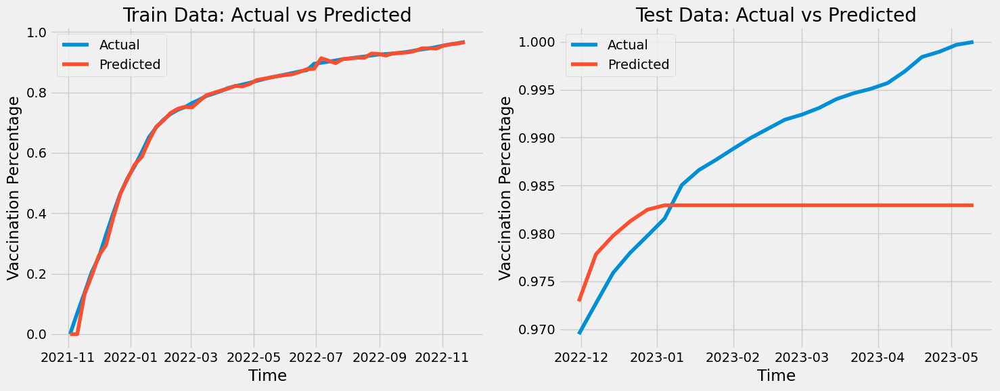

In [34]:
# Define the ARIMA order
arima_order016 = (0, 1, 6)

# Fit the ARIMA model
model016 = ARIMA(train_ar, order=arima_order016)
fitted_model016 = model016.fit()

# Predict on the training set
train_pred_ar016 = fitted_model016.predict(start=train_ar.index[0], end=train_ar.index[-1], typ='levels')

# Predict on the test set
test_pred_ar016 = fitted_model016.predict(start=test_ar.index[0], end=test_ar.index[-1], typ='levels')

# Calculate RMSE for train and test sets
train_rmse_ar016 = np.sqrt(mean_squared_error(train_ar, train_pred_ar016))
test_rmse_ar016 = np.sqrt(mean_squared_error(test_ar, test_pred_ar016))

# Print RMSE values
print(f"Train RMSE: {train_rmse_ar016}")
print(f"Test RMSE: {test_rmse_ar016}")

# Plotting
plt.figure(figsize=(15, 6))

# Train Data Plot
plt.subplot(1, 2, 1)
plt.plot(train_ar, label='Actual')
plt.plot(train_pred_ar016, label='Predicted')
plt.title('Train Data: Actual vs Predicted')
plt.xlabel('Time')
plt.ylabel('Vaccination Percentage')
plt.legend()

# Test Data Plot
plt.subplot(1, 2, 2)
plt.plot(test_ar, label='Actual')
plt.plot(test_pred_ar016, label='Predicted')
plt.title('Test Data: Actual vs Predicted')
plt.xlabel('Time')
plt.ylabel('Vaccination Percentage')
plt.legend()

plt.tight_layout()
plt.show()

In [35]:
# Model summary
fitted_model016.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                  SARIMAX Results                                   
====================================================================================
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(0, 1, 6)   Log Likelihood                 184.375
Date:                      Mon, 27 Nov 2023   AIC                           -354.751
Time:                              14:02:13   BIC                           -340.700
Sample:                          11-03-2021   HQIC                          -349.317
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.9042      0.124      7.290      0.000       0.661       1.147
ma.L2          1.1057      0.200      5.520      0.000       0.713       1.498
ma.L3          0.8995      0.171      5.270      0.000       0.565       1.234
ma.L4          0.9681      0.303      3.197      0.001       0.375       1.562
ma.L5          0.7690      0.245      3.134      0.002       0.288       1.250
ma.L6          0.5635      0.253      2.227      0.026       0.067       1.060
sigma2      6.824e-05   1.75e-05      3.894      0.000    3.39e-05       0.000
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                59.44
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               0.05   Skew:                             1.61
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [44]:
def cross_validated_rmse(data, order, num_folds):
    fold_size = int(len(data) / num_folds)
    rmse_values = []

    for i in range(num_folds):
        train_end = i * fold_size + fold_size
        test_end = train_end + fold_size
        if test_end > len(data):
            test_end = len(data)
        
        train_data = data[:train_end]
        test_data = data[train_end:test_end]

        # Fit the ARIMA model
        model = ARIMA(train_data, order=order)
        model_fit = model.fit()

        # Forecast
        forecast = model_fit.forecast(steps=len(test_data))

        # Calculate RMSE and append to the list
        rmse = sqrt(mean_squared_error(test_data, forecast))
        rmse_values.append(rmse)

    return np.mean(rmse_values), rmse_values

# Example usage
order = (0, 1, 6)
num_folds = 3
average_rmse, all_rmse_values = cross_validated_rmse(df_scaled[pred_var], order, num_folds)
print(f'Average RMSE: {average_rmse}')


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

Average RMSE: 0.019361682068568847


### B. `auto_arima` Model
#### 1. Data Preparation:

The data preparation for `auto_arima` is identical to that of `ARIMA` as I simply only select the `Date` column and response variable, group the data by observation `Date`, and then do a 70-30 train-test split. I also scaled the data for comparison with the other models and because of its succcess in other models. While I considered differencing the data myself, I decided that it was unecessary since the `d` parameter in the `auto_arima` takes care of this. I worried that if I manually differenced the data before passing it to `auto_arima` it could lead to over-differencing, where the time series becomes too "flat," losing valuable information.

In [49]:
# Predictive variable
pred_var = 'Additional_Doses_Vax_Pct'

# Import data with specific columns
df = pd.read_csv('df_post_eda.csv', usecols=['Date', pred_var])

# Convert 'Date' to datetime and group by 'Date'
df['Date'] = pd.to_datetime(df['Date'])
df = df.groupby('Date')[pred_var].mean()

# Sorting the DataFrame by the index
df.sort_index(inplace=True)

# Initialize the MinMaxScaler to scale data between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))

# Apply the scaler to the data
df_scaled = pd.DataFrame(scaler.fit_transform(df.values.reshape(-1, 1)), index=df.index, columns=[pred_var])

# Calculate the index for the 70-30 split
split_index = int(len(df_scaled) * 0.7)

# Split into scaled and differenced train and test sets
train_aar = df_scaled.iloc[:split_index]
test_aar = df_scaled.iloc[split_index:]

Some of `auto_arima`'s key parameters are as follows:

`start_p`, `start_q`, `max_p`, `max_q`: The starting and maximum values of the AR (p) and MA (q) terms.

`d`: The order of first-differencing. If `None`, it is determined automatically through tests such as ADF.

`start_P`, `start_Q`, `max_P`, `max_Q`: The starting and maximum values for the seasonal part of the model.

`D`: The order of seasonal differencing. If `None`, it will be determined through the `seasonal_test`.

`seasonal`: Condition to fit a seasonal ARIMA. 

`m`: The number of periods per season. 

`stepwise`: Applies the stepwise algorithm. 

`information_criterion`: Metric used for model selection. 

`max_order`: Maximum value of p+q+P+Q to suppress overcomplexity.

`out_of_sample_size`: The number of samples to use for out-of-bag (OOB) statistics ((Smith et al., 2017).

The difference between `ARIMA` and `auto_arima` is that the latter iteratively and automatically determines the best parameters for the model. `ARIMA`, in comparison, must be manually tuned.

#### 2. Model Building

Below I run `auto_arima` to find the optimal SARIMA model parameters. Based on the information I gained from developing the `ARIMA` model, I decided to define the range of the `p`, and `q` parameters as between 0 and 7, `d=1`, and, after trying a few different numbers, I set `m = 24` because that gave me the best result. Finally, I set `stepwise = False` because I wanted to do a comprehensive search. If it was set to `True` it might miss the optimal parameters if they are located far from the starting point in the parameter space as `stepwise = True` employs a more efficient approach by looking at neighboring models to the iteratively best one. Although it did not help in my previous `ARIMA` models, for some reason setting `seasonality = True` greatly improves my test RMSE. 

I tried some other variations of the model changing parameters such as `m`. However, the approach I took below gave me the most successful results. The other models can be found in the [Other `auto_arima` Models](#AA-2) section of the appendix.

In [50]:
# Run auto_arima to find optimal SARIMA model parameters
model = auto_arima(train_aar, start_p=0, start_q=0,
                        max_p=7, max_q=7, m=24,
                        start_P=0, seasonal=True,
                        d=2, D = 1, trace=True,
                        error_action='ignore',  
                        suppress_warnings=True, 
                        stepwise=False)

print(model.summary())
print(f"AIC: {model.aic()}")

 ARIMA(0,2,0)(0,1,0)[24]             : AIC=-194.449, Time=0.07 sec
 ARIMA(0,2,0)(0,1,1)[24]             : AIC=-192.449, Time=0.35 sec
 ARIMA(0,2,0)(0,1,2)[24]             : AIC=-190.449, Time=2.34 sec
 ARIMA(0,2,0)(1,1,0)[24]             : AIC=-192.449, Time=0.20 sec
 ARIMA(0,2,0)(1,1,1)[24]             : AIC=-190.449, Time=0.35 sec
 ARIMA(0,2,0)(1,1,2)[24]             : AIC=-188.449, Time=2.22 sec
 ARIMA(0,2,0)(2,1,0)[24]             : AIC=-190.449, Time=0.80 sec
 ARIMA(0,2,0)(2,1,1)[24]             : AIC=-188.449, Time=1.36 sec
 ARIMA(0,2,0)(2,1,2)[24]             : AIC=-186.449, Time=1.35 sec
 ARIMA(0,2,1)(0,1,0)[24]             : AIC=-194.685, Time=0.10 sec
 ARIMA(0,2,1)(0,1,1)[24]             : AIC=-192.685, Time=0.57 sec
 ARIMA(0,2,1)(0,1,2)[24]             : AIC=-190.685, Time=1.17 sec
 ARIMA(0,2,1)(1,1,0)[24]             : AIC=-192.685, Time=0.81 sec
 ARIMA(0,2,1)(1,1,1)[24]             : AIC=-190.685, Time=0.60 sec
 ARIMA(0,2,1)(1,1,2)[24]             : AIC=-188.685, Time=1.74

In [51]:
# Train results
train_pred = model.predict_in_sample()
# Calculate and print the train RMSE
train_rmse = np.sqrt(mean_squared_error(train_aar, train_pred))
print(f"Train RMSE: {train_rmse}")

# Test results
test_pred = model.predict(n_periods=len(test_aar))

# Calculate and print the test RMSE
test_rmse = np.sqrt(mean_squared_error(test_aar, test_pred))
print(f"Test RMSE: {test_rmse}")


Train RMSE: 0.014362240167989263
Test RMSE: 0.030781744659889882


Oddly enough, the test RMSE is much higher than that of the manually trained ARIMA model.

Because of this unordinary result, I wanted to employ cross validation techniques to see if I could get more standard results. I defined a time series cross-validation function (`time_series_cv`) to take the dataset, three cross validation splits, and a horizon which is the number of time steps ahead for which I will forecast and evaluate the model during each fold of the cross-validation process (essentially the size of the fold). The dataset is split based on the length of each segment with one segment used for testing and the rest for training.
The loop runs for each split, incrementing the training dataset and testing the next segment. Then, `auto_arima` fits the model to the training data trying different combinations of parameters. Finally, test predictions are made.

I was unable to do the same configuration as my best model because when I set `D = 1` and `m=24`, I get an error saying the values are too high because my dataset is so small. There are not enough observations in each fold to accommodate for those parameters. Therefore, for illustrative purposes, I chose to cross validate with `D=0` to show that I achieved pretty similar results although the validated RMSE is only slightly higher.

In [53]:
# Time Series Cross-Validation
def time_series_cv(data, n_splits, horizon):
    tscv_results = []
    split_length = int(len(data) / (n_splits + 1))

    for i in range(n_splits):
        train = data[:split_length*(i+1)]
        test = data[split_length*(i+1):split_length*(i+1) + horizon]

        model = auto_arima(train, start_p=0, start_q=0, max_p=7, max_q=7, m=24,start_P=0, seasonal=True, d=2, D = 0, trace=True,
                        error_action='ignore', suppress_warnings=True, stepwise=False)

        test_pred = model.predict(n_periods=horizon)
        rmse = np.sqrt(mean_squared_error(test, test_pred))
        tscv_results.append(rmse)

    return np.mean(tscv_results)

# Runing Time Series Cross-Validation
cv_rmse = time_series_cv(df_scaled, n_splits=3, horizon=13)
print(f"Average RMSE from Time Series Cross-Validation: {cv_rmse}")



 ARIMA(0,2,0)(0,0,0)[24]             : AIC=-111.506, Time=0.02 sec
 ARIMA(0,2,0)(0,0,1)[24]             : AIC=-109.506, Time=0.08 sec
 ARIMA(0,2,0)(0,0,2)[24]             : AIC=-107.506, Time=0.13 sec
 ARIMA(0,2,0)(1,0,0)[24]             : AIC=-109.506, Time=0.09 sec
 ARIMA(0,2,0)(1,0,1)[24]             : AIC=-107.506, Time=0.22 sec
 ARIMA(0,2,0)(1,0,2)[24]             : AIC=-105.506, Time=0.16 sec
 ARIMA(0,2,0)(2,0,0)[24]             : AIC=-107.506, Time=0.32 sec
 ARIMA(0,2,0)(2,0,1)[24]             : AIC=-105.506, Time=0.26 sec
 ARIMA(0,2,0)(2,0,2)[24]             : AIC=-103.506, Time=0.26 sec
 ARIMA(0,2,1)(0,0,0)[24]             : AIC=-109.886, Time=0.02 sec
 ARIMA(0,2,1)(0,0,1)[24]             : AIC=-107.886, Time=0.07 sec
 ARIMA(0,2,1)(0,0,2)[24]             : AIC=-105.886, Time=0.09 sec
 ARIMA(0,2,1)(1,0,0)[24]             : AIC=-107.886, Time=0.03 sec
 ARIMA(0,2,1)(1,0,1)[24]             : AIC=-105.886, Time=0.06 sec
 ARIMA(0,2,1)(1,0,2)[24]             : AIC=-103.886, Time=0.17

Through `auto_arima`, the parameters that achieved the best results in terms of RMSE are `ARIMA(1,2,0)(0,1,0)[24]`. The meanings of these parameters are as follows:

**Non-seasonal**

1 (`p`): The model uses the past one observation to predict the current value (number of autoregressive terms).

2 (`d`): The data has been differenced twice to make it stationary (the degree of differencing).

0 (`q`): The model does not use past forecast errors in predicting future values (number of moving average terms).

**Seasonal**

0 (`P`): The model does not use past seasonal observations in predicting the current value (number of seasonal autoregressive terms).

1 (`D`): Data are seasonally differenced once (degree of seasonal differencing).

0 (`Q`): The model does not use past seasonal forecast errors to predict future values (number of seasonal moving average terms).

[24]: This is the seasonal period. It indicates that the seasonality in the data repeats every 24 weeks, roughly half a year. 

#### 3. Model Performance

In comparing this model to the manual ARIMA model I previously created, it shows a different set of optimal parameters. While the manual ARIMA model was (0,1,6) without seasonality and produced a test RMSE of 0.009937797182224015, the best auto_arima model, ARIMA(1,2,0)(0,1,0)[24], yielded a test RMSE of 0.030781744659889882. The key difference lies in the seasonal component of ARIMA(1,2,0)(0,1,0)[24], indicating a seasonal period of 24 weeks, compared to the non-seasonal ARIMA(0,1,6) model. The ARIMA(1,2,0) component uses one past observation for predictions and differs data twice for stationarity, while the ARIMA(0,1,6) model focuses more on short-term error correction with six MA terms.

The test RMSE of the auto_arima model is among the lowest I have created. The train RMSE is 0.014362240167989263. Upon examining the residual plot, the residuals hover around zero, and the variance remains fairly consistent, suggesting the model does not systematically over or underestimate the observed values.

Other model statistics, like the high log likelihood and low AIC, BIC, p-values, and sigma2, indicate a good fit. The Ljung-Box and Jarque-Bera tests show no significant autocorrelation and that residuals are normally distributed. However, there is a slight skew and high kurtosis, and evidence of heteroskedasticity indicates varying variance of residuals over time.

Overall, this model performs quite well despite some signs of heteroskedasticity.

 ARIMA(0,2,0)(0,1,0)[24]             : AIC=-194.449, Time=0.06 sec
 ARIMA(0,2,0)(0,1,1)[24]             : AIC=-192.449, Time=0.52 sec
 ARIMA(0,2,0)(0,1,2)[24]             : AIC=-190.449, Time=2.14 sec
 ARIMA(0,2,0)(1,1,0)[24]             : AIC=-192.449, Time=0.22 sec
 ARIMA(0,2,0)(1,1,1)[24]             : AIC=-190.449, Time=0.51 sec
 ARIMA(0,2,0)(1,1,2)[24]             : AIC=-188.449, Time=2.44 sec
 ARIMA(0,2,0)(2,1,0)[24]             : AIC=-190.449, Time=1.38 sec
 ARIMA(0,2,0)(2,1,1)[24]             : AIC=-188.449, Time=1.84 sec
 ARIMA(0,2,0)(2,1,2)[24]             : AIC=-186.449, Time=1.73 sec
 ARIMA(0,2,1)(0,1,0)[24]             : AIC=-194.685, Time=0.10 sec
 ARIMA(0,2,1)(0,1,1)[24]             : AIC=-192.685, Time=0.57 sec
 ARIMA(0,2,1)(0,1,2)[24]             : AIC=-190.685, Time=1.50 sec
 ARIMA(0,2,1)(1,1,0)[24]             : AIC=-192.685, Time=0.83 sec
 ARIMA(0,2,1)(1,1,1)[24]             : AIC=-190.685, Time=0.93 sec
 ARIMA(0,2,1)(1,1,2)[24]             : AIC=-188.685, Time=2.14

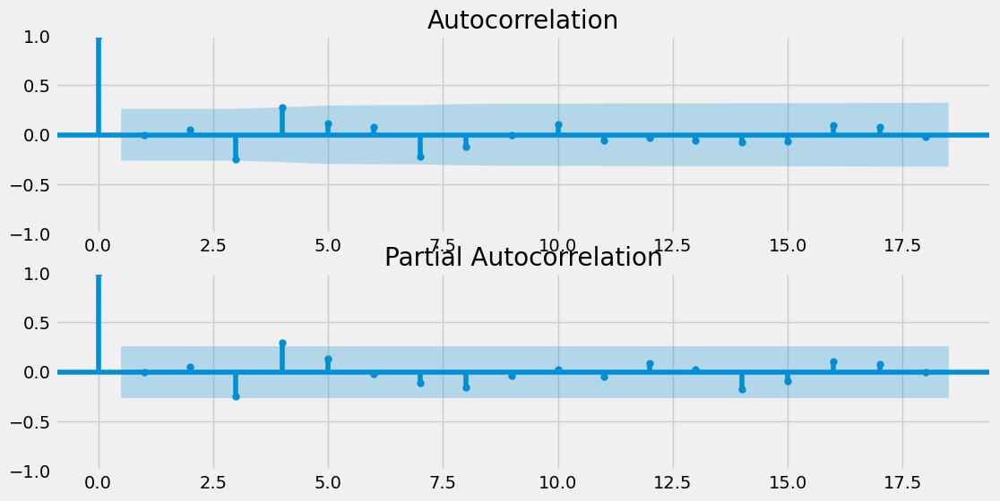

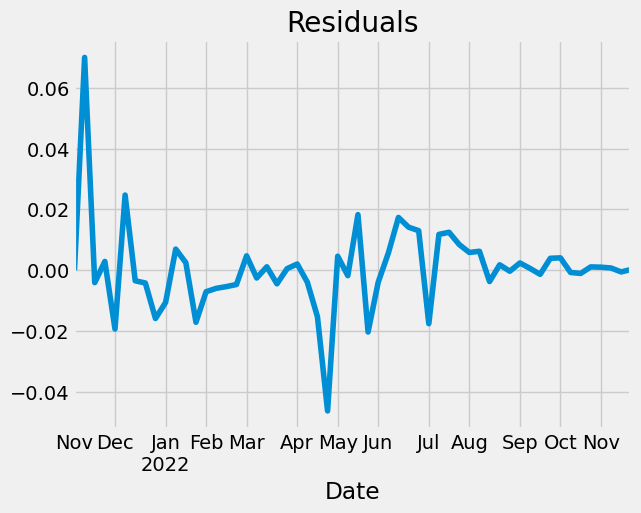

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   56
Model:             SARIMAX(1, 2, 0)x(0, 1, 0, 24)   Log Likelihood                  99.526
Date:                            Mon, 27 Nov 2023   AIC                           -195.053
Time:                                    15:12:33   BIC                           -192.251
Sample:                                11-03-2021   HQIC                          -194.156
                                     - 11-23-2022                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2918      0.131     -2.225      0.026      -0.549      -0.035
sigma2      7.668e-05   1.94e-05      3.952      0.000    3.86e-05       0.000
===================================================================================
Ljung-Box (L1) (Q):                   0.21   Jarque-Bera (JB):                 3.65
Prob(Q):                              0.65   Prob(JB):                         0.16
Heteroskedasticity (H):               0.02   Skew:                            -0.59
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [61]:
final_model = auto_arima(train_aar, start_p=0, start_q=0,
                        max_p=7, max_q=7, m=24,
                        start_P=0, seasonal=True,
                        d=2, D = 1, trace=True,
                        error_action='ignore',  
                        suppress_warnings=True, 
                        stepwise=False)

# Residual Analysis
residuals = pd.Series(final_model.arima_res_.resid)
plt.figure(figsize=(12, 6))
plt.subplot(211)
plot_acf(residuals, ax=plt.gca())
plt.subplot(212)
plot_pacf(residuals, ax=plt.gca())
plt.show()

# Check if residuals have any patterns left
plt.figure()
residuals.plot(title="Residuals")
plt.show()

# Print final model summary
final_model.summary()

Train RMSE: 0.014362240167989263
Test RMSE: 0.030781744659889882


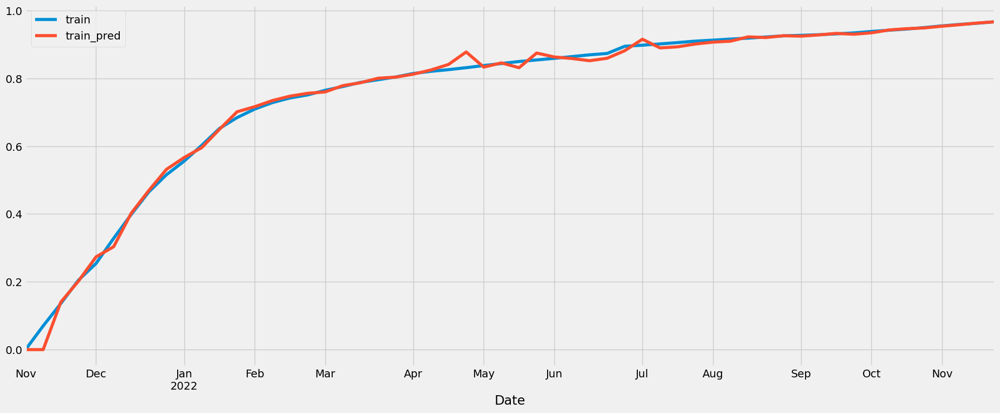

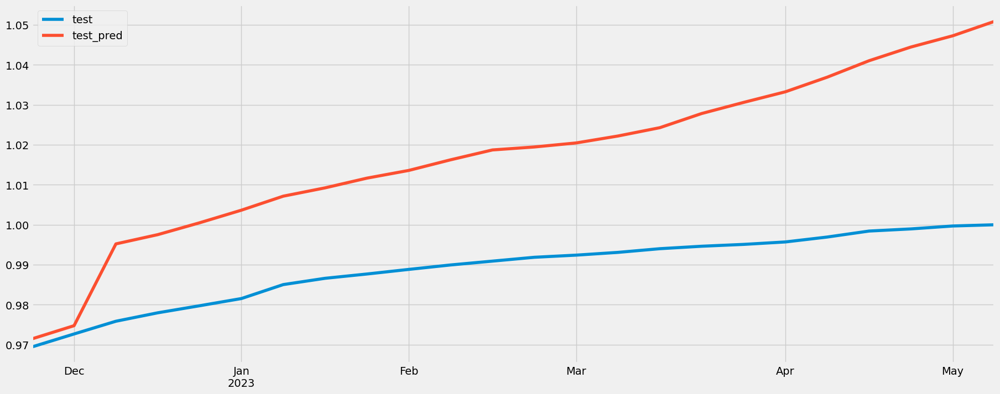

In [62]:
# Train results
train_pred = final_model.predict_in_sample()
pd.concat([train_aar, pd.Series(train_pred, index=train_aar.index)], axis=1).plot(figsize=(20,8))
plt.legend(['train', 'train_pred'])

# Calculate and print the train RMSE
train_rmse = np.sqrt(mean_squared_error(train_aar, train_pred))
print(f"Train RMSE: {train_rmse}")

# Test results
test_pred = final_model.predict(n_periods=len(test_aar))
pd.concat([test_aar, pd.Series(test_pred)], axis=1).plot(figsize=(20,8))
plt.legend(['test', 'test_pred'])

# Calculate and print the test RMSE
test_rmse = np.sqrt(mean_squared_error(test_aar, test_pred))
print(f"Test RMSE: {test_rmse}")


### C. `Prophet` (Univariate) Model
#### 1. Data Preparation:

The Prophet model forecasts time series data using an additive approach. It's particularly effective with data showing strong seasonal effects and handles inconsistencies like missing values and outliers well. Prophet's model comprises three main components: trend ($g(t)$), seasonality ($s(t)$), and holidays ($h(t)$), along with an error term ($e_t$). The trend component adapts to changes in data, seasonality uses a Fourier Series to capture cyclical patterns, and the holiday component accounts for periodic events' impacts.

Key parameters of Prophet include:

- `growth`: Specifies the trend type (linear or logistic).
- `changepoint_num`: Sets the maximum number of trend changepoints.
- `changepoint_range`: Determines how close changepoints can be to the end of the series, affecting model flexibility.
- Seasonality Settings:
    - Yearly (`seasonality_yearly`)
    - Weekly (`seasonality_weekly`)
    - Daily (`seasonality_daily`)
- `season`: Defines the seasonality type (additive or multiplicative).
- Prior Scale Parameters: These control the flexibility of changepoints (`changepoint_prior_scale`), seasonality (`seasonality_prior_scale`), and holidays (`holidays_prior_scale`).

For the univariate Prophet model, I prepared the data by importing the `Date` and response variable `'Additional_Doses_Vax_Pct'` from my dataset. The data was grouped by `Date` to ensure one unique value per date. The DataFrame was structured with `ds` for dates (in YYYY-MM-DD format) and `y` for the response variable. Additionally, I scaled the data for consistency with other models in the analysis.

In [90]:
# Predictive variable
pred_var = 'Additional_Doses_Vax_Pct'

# Import data with specific columns
df_p = pd.read_csv('df_post_eda.csv', usecols=['Date', pred_var])

# Convert 'Date' to datetime and set as index
df_p['Date'] = pd.to_datetime(df_p['Date'])
df_p.set_index('Date', inplace=True)

# Group by 'Date' to ensure there is one unique value per date
df_p = df_p.groupby('Date').mean()

# Initialize the MinMaxScaler to scale data between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))

# Apply the scaler to the data
df_p[pred_var] = scaler.fit_transform(df_p[[pred_var]])

# 'Date' column as a separate variable
df_p.reset_index(inplace=True)

# Rename the columns for compatibility with Prophet
df_p.rename(columns={'Date': 'ds', pred_var: 'y'}, inplace=True)

#### 2. Model Building:

As for the training for the `Prophet` univariate model, I first split my dataframe into train and test sets with a 70-30 train-test split. Then, for an initial base model, I simply fit the `Prophet()` model without modifying any of the parameters. The RMSE was relatively high, so I knew I could improve on my model.

In [64]:
# Calculate the index for the 70-30 split
split_index = int(len(df_p) * 0.7)

# Split into train and test
train = df_p.iloc[:split_index]
test = df_p.iloc[split_index:]

# Initialize and fit the Prophet model on the training data
model = Prophet()
model.fit(train)

16:36:59 - cmdstanpy - INFO - Chain [1] start processing
16:36:59 - cmdstanpy - INFO - Chain [1] done processing


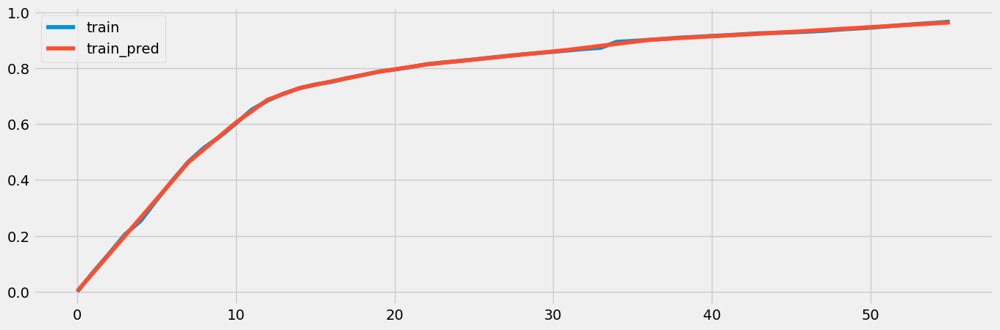

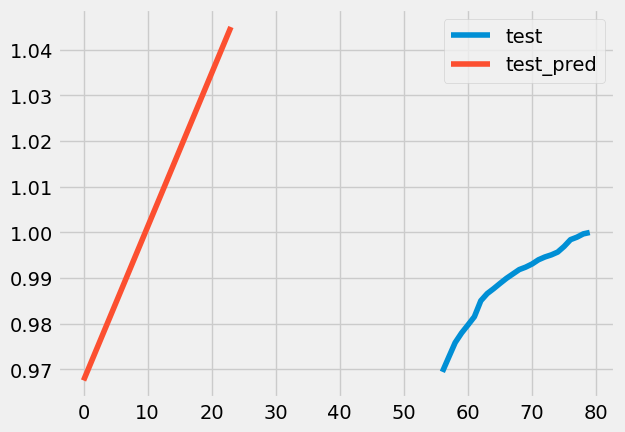

Train RMSE: 0.002906993025481394
Test RMSE: 0.022970901026062914


In [65]:
# Make predictions on the training set
train_pred = model.predict(train[['ds']])

# Plot the training predictions
pd.concat([train['y'], train_pred['yhat']], axis=1).plot(figsize=(15,5))
plt.legend(['train', 'train_pred'])

# Make predictions on the test set
test_pred = model.predict(test[['ds']])

# Plot the test predictions
pd.concat([test['y'], test_pred['yhat']], axis=1).plot()
plt.legend(['test', 'test_pred'])
plt.show()
# Calculate RMSE for the training set
train_rmse = sqrt(mean_squared_error(train['y'], train_pred['yhat']))
print(f"Train RMSE: {train_rmse}")

# Calculate RMSE for the test set
test_rmse = sqrt(mean_squared_error(test['y'], test_pred['yhat']))
print(f"Test RMSE: {test_rmse}")

Next, I enhanced the Prophet model by adding cross-validation and incorporating U.S. holidays. This approach allows the model to account for the potential impact of holidays on vaccination trends. The model fitting process remained similar, but I now generated future data points for predictions, with a weekly frequency (`freq = 'W'`), to align with our data's weekly reporting structure.

For cross-validation, I set specific parameters based on the data span (November 2021 to May 2023):

- **Initial Training Period (`initial`)**: Set to '180 days', giving the model a substantial initial dataset to understand any half-yearly seasonality.
- **Update Frequency (`period`)**: Chosen as '45 days', ensuring the model updates itself every month and a half to stay aligned with changing data patterns.
- **Forecast Horizon (`horizon`)**: Fixed at '45 days', balancing the need for near-future predictions while maintaining reasonable forecast accuracy.

These settings allowed me to evaluate the model's performance across various simulated scenarios. Additionally, I graphically analyzed the model’s forecasts to understand how it interprets trends and seasonality.

The visual outputs indicated a consistent upward trend, aligning with the increasing cumulative nature of vaccination rates. Significantly, the model successfully captured the pronounced effects of holidays in late 2022 and early 2023 on vaccination rates.

16:37:09 - cmdstanpy - INFO - Chain [1] start processing
16:37:09 - cmdstanpy - INFO - Chain [1] done processing


Test RMSE: 0.021909128419629015


  0%|          | 0/4 [00:00<?, ?it/s]

16:37:09 - cmdstanpy - INFO - Chain [1] start processing
16:37:09 - cmdstanpy - INFO - Chain [1] done processing
16:37:09 - cmdstanpy - INFO - Chain [1] start processing
16:37:09 - cmdstanpy - INFO - Chain [1] done processing
16:37:09 - cmdstanpy - INFO - Chain [1] start processing
16:37:10 - cmdstanpy - INFO - Chain [1] done processing
16:37:10 - cmdstanpy - INFO - Chain [1] start processing
16:37:10 - cmdstanpy - INFO - Chain [1] done processing


Cross-Validation RMSE: 0.183403907282513


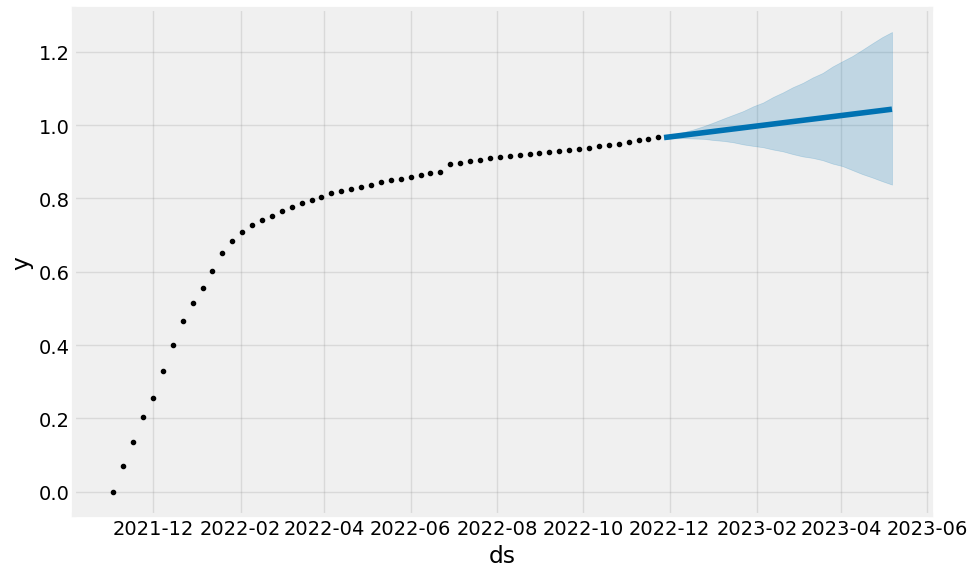

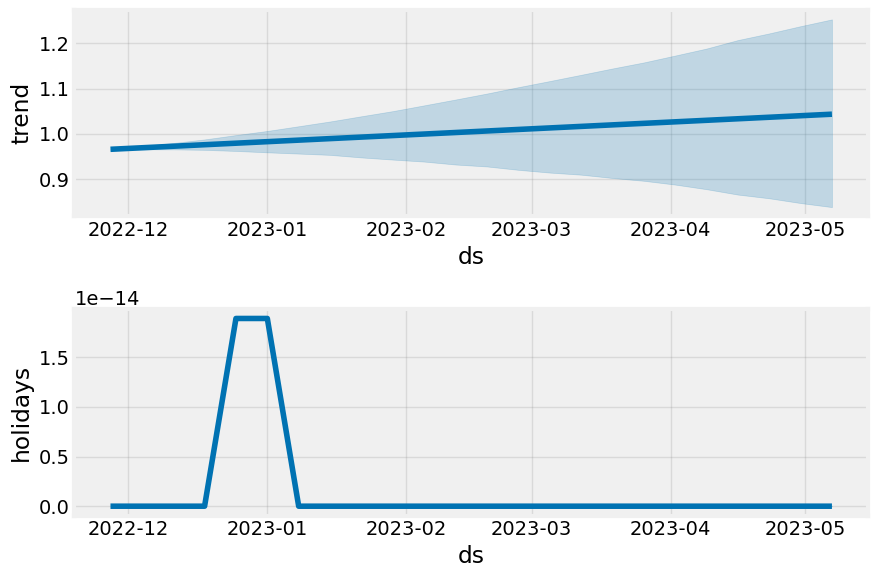

In [66]:
# Initialize Prophet model with US holidays
model = Prophet()
model.add_country_holidays(country_name='US')

# Fit model on the training data
model.fit(train)

# Predict on the test set with weekly frequency
future_test = model.make_future_dataframe(periods=len(test), include_history=False, freq='W')
forecast_test = model.predict(future_test)

# Calculate RMSE for the test set
test_rmse = sqrt(mean_squared_error(test['y'], forecast_test['yhat']))
print(f'Test RMSE: {test_rmse}')

# Cross-validation using training data 
cv_results = cross_validation(model, initial='180 days', period='45 days', horizon='45 days')

# Calculate RMSE for cross-validation results
rmse_cv = sqrt(mean_squared_error(cv_results['y'], cv_results['yhat']))
print(f'Cross-Validation RMSE: {rmse_cv}')

# Plot the forecast on test data
fig = model.plot(forecast_test)
plt.show()

# Plot components
fig2 = model.plot_components(forecast_test)
plt.show()


In [67]:
# Performance metrics
df_performance = performance_metrics(cv_results)
df_performance

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,3 days,0.012509,0.111844,0.079656,0.088319,0.088319,0.081246,0.5
1,5 days,0.014979,0.122387,0.087111,0.101335,0.101335,0.092117,0.5
2,6 days,0.027961,0.167214,0.167107,0.187790,0.187790,0.171599,0.5
3,9 days,0.028462,0.168707,0.168544,0.184210,0.184210,0.168636,0.5
4,10 days,0.015481,0.124422,0.088867,0.098091,0.098091,0.089490,0.5
5,12 days,0.019008,0.137869,0.098376,0.113740,0.113740,0.102307,0.5
6,13 days,0.034707,0.186298,0.186086,0.208382,0.208382,0.188609,0.0
7,16 days,0.034400,0.185473,0.185297,0.201857,0.201857,0.183309,0.0
8,17 days,0.018706,0.136768,0.098404,0.108072,0.108072,0.097866,0.5
9,19 days,0.023495,0.153280,0.110081,0.126442,0.126442,0.112632,0.5


To refine the model, I first introduced a 'cap' feature, indicating the maximum achievable saturation point. This step is crucial for models with logistic growth in Prophet, as it helps define an upper limit for predictions. Observing the vaccination rate data, which initially rises rapidly before leveling off near 100%, I set `growth = 'logistic'` in the model to mirror this pattern. 

Like before, I included U.S. holidays to account for their impact on vaccination rates. For hyperparameter tuning, I followed Facebook Prophet's documentation guidelines, creating a grid of recommended parameters. This grid served as a foundation for exploring various hyperparameter combinations.

In the tuning process, I fitted the model to the training data, maintaining the same `initial`, `period`, and `horizon` settings as before to ensure consistent cross-validation and scoring. After each iteration, performance metrics, particularly the RMSE, were calculated. This approach enabled me to identify the best-performing parameters.

For the final model evaluation, I specifically set `rolling_window = 1` during cross-validation. This setting was chosen to treat each forecasted point independently, avoiding any smoothing of errors and providing a more detailed view of the model's accuracy. The result was a clear picture of the model's performance on the test data, reflected in the test RMSE.

In [68]:
# Set the logistic growth
train['cap'] = 1  
test['cap'] = 1   

# Initialize and fit the Prophet model on the training data with logistic growth
model = Prophet(growth='logistic')
model.add_country_holidays(country_name='US')
model.fit(train)

# Parameter grid for cross-validation tuning
param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'holidays_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['additive', 'multiplicative']
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Storing the RMSEs for each params 

# Cross-validation to evaluate all parameters
for params in all_params:
    m = Prophet(growth='logistic', **params)
    m.add_country_holidays(country_name='US')
    m.fit(train)
    
    df_cv = cross_validation(m, initial='180 days', period='45 days', horizon='45 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Identify the best parameters
best_params = all_params[np.argmin(rmses)]
print(f"Best parameters: {best_params}")

# Fit the final model with the best parameters
final_model = Prophet(growth='logistic', **best_params)
final_model.add_country_holidays(country_name='US')
final_model.fit(train)

# Predict and evaluate on the test set
future_test = final_model.make_future_dataframe(periods=len(test), freq='W', include_history=False)
# Add the cap to the future dataframe
future_test['cap'] = 1
forecast_test = final_model.predict(future_test)
test_rmse = sqrt(mean_squared_error(test['y'], forecast_test['yhat']))
print(f"Test RMSE: {test_rmse}")

# Perform cross-validation
df_cv = cross_validation(final_model, initial='180 days', period='45 days', horizon='45 days', parallel="processes")

# Calculate and print RMSE
rmse = sqrt(mean_squared_error(df_cv['y'], df_cv['yhat']))
print(f'Cross-Validation RMSE: {rmse}')

16:37:20 - cmdstanpy - INFO - Chain [1] start processing
16:37:20 - cmdstanpy - INFO - Chain [1] done processing
16:37:20 - cmdstanpy - INFO - Chain [1] start processing
16:37:21 - cmdstanpy - INFO - Chain [1] done processing
16:37:22 - cmdstanpy - INFO - Chain [1] start processing
16:37:22 - cmdstanpy - INFO - Chain [1] start processing
16:37:22 - cmdstanpy - INFO - Chain [1] done processing
16:37:22 - cmdstanpy - INFO - Chain [1] start processing
16:37:22 - cmdstanpy - INFO - Chain [1] start processing
16:37:22 - cmdstanpy - INFO - Chain [1] done processing
16:37:22 - cmdstanpy - INFO - Chain [1] done processing
16:37:22 - cmdstanpy - INFO - Chain [1] done processing
16:37:22 - cmdstanpy - INFO - Chain [1] start processing
16:37:23 - cmdstanpy - INFO - Chain [1] done processing
16:37:24 - cmdstanpy - INFO - Chain [1] start processing
16:37:24 - cmdstanpy - INFO - Chain [1] start processing
16:37:24 - cmdstanpy - INFO - Chain [1] start processing
16:37:24 - cmdstanpy - INFO - Chain [1

Best parameters: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.01, 'holidays_prior_scale': 0.01, 'seasonality_mode': 'additive'}


16:41:16 - cmdstanpy - INFO - Chain [1] done processing


Test RMSE: 0.012984771707713526


16:41:17 - cmdstanpy - INFO - Chain [1] start processing
16:41:17 - cmdstanpy - INFO - Chain [1] start processing
16:41:17 - cmdstanpy - INFO - Chain [1] start processing
16:41:17 - cmdstanpy - INFO - Chain [1] start processing
16:41:17 - cmdstanpy - INFO - Chain [1] done processing
16:41:17 - cmdstanpy - INFO - Chain [1] done processing
16:41:17 - cmdstanpy - INFO - Chain [1] done processing
16:41:17 - cmdstanpy - INFO - Chain [1] done processing


Cross-Validation RMSE: 0.00508977771402136


I decided to do one more tuning just to be exhaustive.

In [69]:
# Set the logistic growth
train['cap'] = 1  
test['cap'] = 1   

# Initialize and fit the Prophet model on the training data with logistic growth
model = Prophet(growth='logistic')
model.add_country_holidays(country_name='US')
model.fit(train)

# Updated parameter grid for cross-validation tuning
param_grid = {
    'changepoint_prior_scale': [0.3, 0.4, 0.45, 0.5],
    'seasonality_prior_scale': [0.01, 0.015, 0.02, 0.025],
    'holidays_prior_scale': [0.01, 0.015, 0.02, 0.025]
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Storing the RMSEs for each set of parameters 

# Cross-validation to evaluate all parameters
for params in all_params:
    # Initialize Prophet model with logistic growth and additive seasonality
    m = Prophet(growth='logistic', seasonality_mode='additive', **params)
    m.add_country_holidays(country_name='US')
    m.fit(train)
    
    df_cv = cross_validation(m, initial='180 days', period='45 days', horizon='45 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Identify the best parameters
best_params = all_params[np.argmin(rmses)]
print(f"Best parameters: {best_params}")

# Fit the final model with the best parameters
final_model = Prophet(growth='logistic', **best_params)
final_model.add_country_holidays(country_name='US')
final_model.fit(train)

# Predict and evaluate on the test set
future_test = final_model.make_future_dataframe(periods=len(test), freq='W', include_history=False)
# Add the cap to the future dataframe
future_test['cap'] = 1
forecast_test = final_model.predict(future_test)
test_rmse = sqrt(mean_squared_error(test['y'], forecast_test['yhat']))
print(f"Test RMSE: {test_rmse}")

# Perform cross-validation
df_cv = cross_validation(final_model, initial='180 days', period='45 days', horizon='45 days', parallel="processes")

# Calculate and print RMSE
rmse = sqrt(mean_squared_error(df_cv['y'], df_cv['yhat']))
print(f'Cross-Validation RMSE: {rmse}')

16:42:51 - cmdstanpy - INFO - Chain [1] start processing
16:42:51 - cmdstanpy - INFO - Chain [1] done processing
16:42:51 - cmdstanpy - INFO - Chain [1] start processing
16:42:52 - cmdstanpy - INFO - Chain [1] done processing
16:42:52 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing
16:42:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing
16:42:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing
16:42:54 - cmdstanpy - INFO - Chain [1] start processing
16:42:54 - cmdstanpy - INFO - Chain [1] start processing
16:42:54 - cmdstanpy - INFO - Chain [1] done processing
16:42:54 - cmdstanpy - INFO - Chain [1]

Best parameters: {'changepoint_prior_scale': 0.45, 'seasonality_prior_scale': 0.01, 'holidays_prior_scale': 0.015}


16:45:10 - cmdstanpy - INFO - Chain [1] done processing


Test RMSE: 0.01312851228058226


16:45:11 - cmdstanpy - INFO - Chain [1] start processing
16:45:11 - cmdstanpy - INFO - Chain [1] start processing
16:45:11 - cmdstanpy - INFO - Chain [1] start processing
16:45:11 - cmdstanpy - INFO - Chain [1] start processing
16:45:11 - cmdstanpy - INFO - Chain [1] done processing
16:45:11 - cmdstanpy - INFO - Chain [1] done processing
16:45:11 - cmdstanpy - INFO - Chain [1] done processing
16:45:12 - cmdstanpy - INFO - Chain [1] done processing


Cross-Validation RMSE: 0.005042699595181557


Since I exhaustively tuned the hyperparameters that are meant to be tuned, I feel confident that these parameter values will lead to the lowest RMSE for a `Prophet` model trained on my data. The final parameter values I got are:

Best parameters: {`'changepoint_prior_scale'`: 0.45, `'seasonality_prior_scale'`: 0.01, `'holidays_prior_scale'`: 0.015, `'seasonality_mode'`: `'additive'`}

A `'changepoint_prior_scale'` of 0.45 means that the model has just under the maximum trend flexibility, whereas a `'seasonality_prior_scale'` of 0.01 indicates the minimum amount of seasonality flexibility meaning that the magnitude of the parameter is shrunken with maximum regularization, and a `'holidays_prior_scale'` of 0.015 means the same but for holidays flexibility. Finally, `'seasonality_mode'` of `'additive'` is the default which means that the seasonal effects are added as opposed to multiplied to make the final forecast and seasonal fluctuations are constant over time.

The biggest issue I had was a relatively high RMSE; however, setting `growth = 'logistic'` (at the suggestion of my teammate Kaylee Mo) vastly improved my results.

#### 3. Model Performance

Below are the results of the best `Prophet` univariate model after tuning. Although this model's RMSE is higher than the best ARIMA model I could make, the results make more sense in that the test RMSE is higher than the train's. There is evidence of overfitting as the test RMSE is around 10 times as high as the train's. However, the cross-validated RMSE is much closer than to the train RMSE. 

As for the cross-validation performance across horizons, the RMSE remains fairly consistently small. This indicates stable model performance over time. The high coverages may suggest that the prediction intervals are too wide and missing values due to the lack of precision (Schmudde, 2019). 

Looking at the train residual plots, one can see that they fluctuate between approximately -0.009 and 0.006 indicating that the model is not consistently solely under or overestimating the predictions. Furthermore, since the residuals oscillate around 0, there is no clear positive nor negative bias which indicates that the model does not overpredict or underpredict systematically. There are no clear trends or seasonality in the residuals, and there are two outlying points at around December 2021 and late June 2022. 

Overall, the `Prophet` univariate model is among one of the best that I have created despite there being some evidence of lack of prediction precisions. Furthermore, although initially I thought there was a lot of evidence of overfitting, after seeing the cross-validation results, I believe the overfitting is only slight.

17:10:59 - cmdstanpy - INFO - Chain [1] start processing
17:10:59 - cmdstanpy - INFO - Chain [1] done processing


Train RMSE: 0.0020465598500806034
Test RMSE: 0.02662921409495521


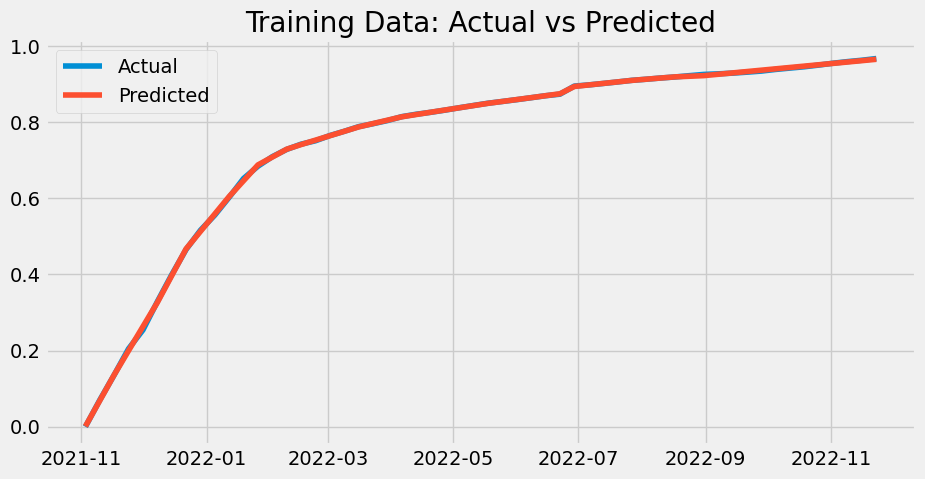

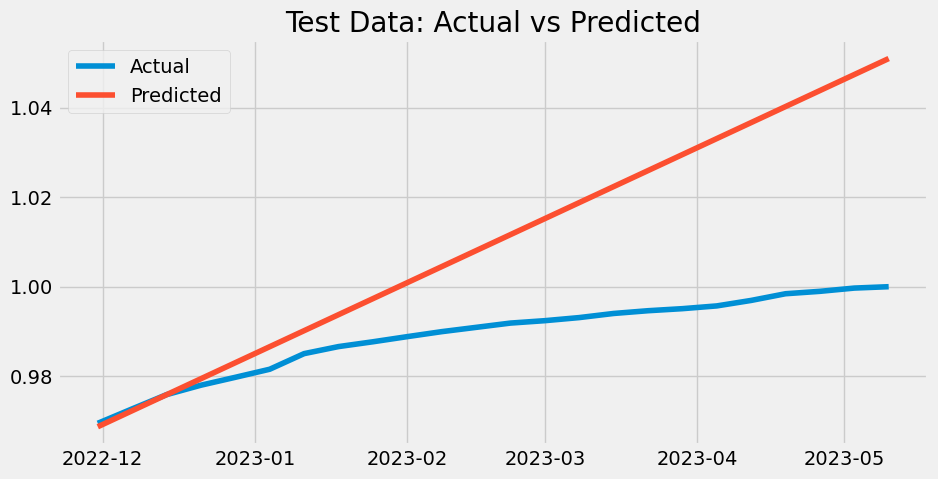

In [91]:
# Initialize the Prophet model with the given parameters
model = Prophet(changepoint_prior_scale=0.45,
                seasonality_prior_scale=0.01,
                holidays_prior_scale=0.015,
                seasonality_mode='additive')

# Fit the model with the training data
model.fit(train)

# Make predictions on the training set
train_pred = model.predict(train[['ds']])

# Make predictions on the test set
test_pred = model.predict(test[['ds']])

# Calculate RMSE for training and test sets
train_rmse = sqrt(mean_squared_error(train['y'], train_pred['yhat']))
test_rmse = sqrt(mean_squared_error(test['y'], test_pred['yhat']))

# Output the RMSE values
print(f"Train RMSE: {train_rmse}")
print(f"Test RMSE: {test_rmse}")

# Plot the predictions against actuals for the training set
plt.figure(figsize=(10, 5))
plt.plot(train['ds'], train['y'], label='Actual')
plt.plot(train['ds'], train_pred['yhat'], label='Predicted')
plt.title('Training Data: Actual vs Predicted')
plt.legend()
plt.show()

# Plot the predictions against actuals for the test set
plt.figure(figsize=(10, 5))
plt.plot(test['ds'], test['y'], label='Actual')
plt.plot(test['ds'], test_pred['yhat'], label='Predicted')
plt.title('Test Data: Actual vs Predicted')
plt.legend()
plt.show()

In [71]:
# Perform cross-validation
df_cv = cross_validation(model, initial='180 days', period='45 days', horizon='45 days', parallel="processes")

# Calculate performance metrics
df_p = performance_metrics(df_cv)

# Calculate and print RMSE
rmse = sqrt(mean_squared_error(df_cv['y'], df_cv['yhat']))
print(f'Cross-Validation RMSE: {rmse}')

df_p

16:47:49 - cmdstanpy - INFO - Chain [1] start processing
16:47:49 - cmdstanpy - INFO - Chain [1] start processing
16:47:49 - cmdstanpy - INFO - Chain [1] start processing
16:47:49 - cmdstanpy - INFO - Chain [1] start processing
16:47:49 - cmdstanpy - INFO - Chain [1] done processing
16:47:49 - cmdstanpy - INFO - Chain [1] done processing
16:47:49 - cmdstanpy - INFO - Chain [1] done processing


Cross-Validation RMSE: 0.00866195901362708


16:47:49 - cmdstanpy - INFO - Chain [1] done processing


,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,3 days,0.000002,0.001330,0.001322,0.001431,0.001431,0.001432,1.0
1,5 days,0.000002,0.001525,0.001524,0.001699,0.001699,0.001699,1.0
2,6 days,0.000012,0.003434,0.003087,0.003402,0.003402,0.003395,0.5
3,9 days,0.000012,0.003405,0.003021,0.003282,0.003282,0.003275,0.5
4,10 days,0.000003,0.001831,0.001798,0.001936,0.001936,0.001936,1.0
5,12 days,0.000005,0.002190,0.002189,0.002426,0.002426,0.002426,1.0
6,13 days,0.000031,0.005583,0.004903,0.005377,0.005377,0.005358,1.0
7,16 days,0.000036,0.005970,0.005653,0.006137,0.006137,0.006116,1.0
8,17 days,0.000014,0.003778,0.003778,0.004063,0.004063,0.004063,1.0
9,19 days,0.000011,0.003337,0.003295,0.003604,0.003604,0.003605,1.0


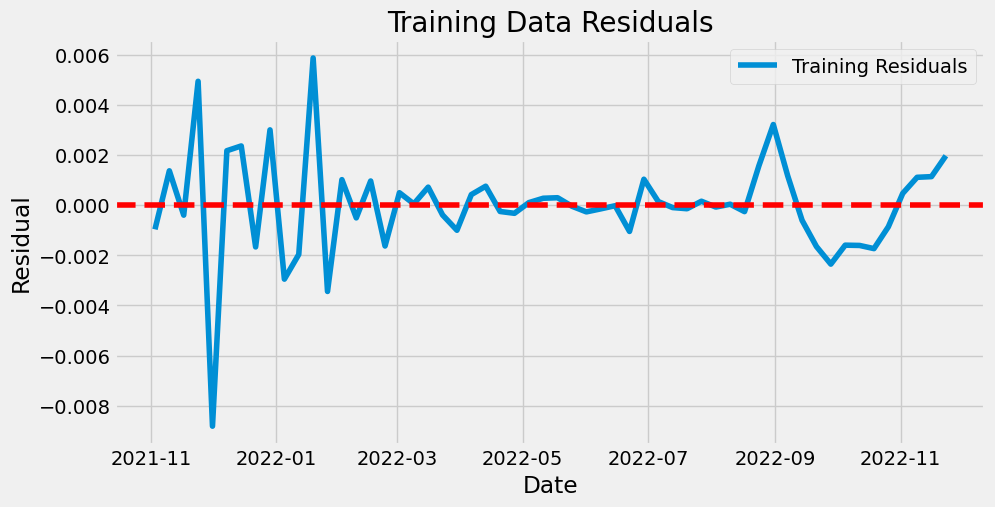

In [92]:
# Calculate residuals for training and test sets
train_residuals = train['y'] - train_pred['yhat']

# Plotting residuals for training set
plt.figure(figsize=(10, 5))
plt.plot(train['ds'], train_residuals, label='Training Residuals')
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Training Data Residuals')
plt.xlabel('Date')
plt.ylabel('Residual')
plt.legend()
plt.show()



### D. `Prophet` (Multivariate) Model
#### 1. Data Preparation:

My data preparation is pretty similar to the univariate `Prophet` model. The largest differences were that I dropped the `holidays` column as it conflicted with the holiday aspect of the `Prophet` model (it inherently takes into account holidays). I added some additional lag columns and rolling statistics for extra time-series data. For these columns, I used a combination of forwards and backwards fill to impute the missing values. Finally, I scaled the data to a scale from 0 to 1 as I have for all the other models for comparison purposes and renamed the `Date` and response variable columns for compatibility with `Prophet`.

To identify the most significant predictors, I plan to initially train a model utilizing the entire set of predictors. I then will analyze the feature importance by examining the corresponding coefficients in the `Prophet` model. Specifically, I will select those predictors whose coefficients fall within or above the 90th percentile. This approach will be complemented by incorporating my custom-engineered features, ensuring a comprehensive and robust model.

In [95]:
# Import data
df = pd.read_csv('df_post_eda.csv')

# Convert 'Date' to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Sort by 'Date' and 'Location'
df = df.sort_values(by=['Date', 'Location'])

# Drop holidays column as it conflicts
df = df.drop(columns=['holidays'])

# Set Date as the index
df.set_index('Date', inplace=True)

# Only include numeric columns for grouping and mean calculation
numeric_cols = df.select_dtypes(include='number').columns
df_numeric = df[numeric_cols].groupby(df.index).mean()

# Merge the numeric data with the non-numeric data
df_non_numeric = df[df.columns.difference(numeric_cols)].groupby(df.index).first()
df_merged = pd.concat([df_non_numeric, df_numeric], axis=1)

# Additional time-series columns to account for 3-month pattern
pred_var = 'Additional_Doses_Vax_Pct'
df_merged['Additional_Doses_Vax_Pct_3_m_lag'] = df_merged[pred_var].shift(12)
df_merged['Additional_Doses_Vax_Pct_9_m_lag'] = df_merged[pred_var].shift(36)

# Rolling statistics
df_merged['rolling_mean'] = df_merged[pred_var].rolling(window=12).mean()
df_merged['rolling_std'] = df_merged[pred_var].rolling(window=12).std()

# Forward and backwards fill to impute missing values
df_merged.fillna(method='ffill', inplace=True)
df_merged.fillna(method='bfill', inplace=True)

# Update numeric_cols to include the new columns
numeric_cols_updated = df_merged.select_dtypes(include='number').columns

# Initialize MinMaxScaler
min_max_scaler = MinMaxScaler(feature_range=(0, 1))

# Apply the scaler to all relevant numeric data
scaled_data = min_max_scaler.fit_transform(df_merged[numeric_cols_updated])
df_scaled = pd.DataFrame(scaled_data, columns=numeric_cols_updated, index=df_merged.index)

# Reset index and rename columns for Prophet
df_prophet = df_scaled.reset_index().rename(columns={'Date': 'ds', pred_var: 'y'})

#### 2. Model Building

To build my model, I started by splitting my dataset into 70% training data and 30% testing data. I then initialized and fit the prophet model on all of the regressors in my dataset. I then make predictions for the train and test set, ensuring to only pass in the `ds` column and other regressors and calculate the RMSEs.

There is obvious and severe overfitting in this initial model as the train RMSE is the lowest I have gotten in any model, yet the test RMSE is somehow greater than one despite my scaling the data. Upon plotting, it is revealed that this is because the model is predicting negative values.

In [96]:
# Split into train and test sets
train_size = int(0.7 * len(df_prophet))  # 70% training data, 30% testing data
train = df_prophet[:train_size]
test = df_prophet[train_size:]

# Initialize and fit the Prophet model
model = Prophet()
for col in train.columns:
    if col not in ['ds', 'y']:
        model.add_regressor(col)

model = model.fit(train)

17:12:38 - cmdstanpy - INFO - Chain [1] start processing
17:12:47 - cmdstanpy - INFO - Chain [1] done processing


In [97]:
# Make predictions on the training set
train_predictions = model.predict(train[['ds'] + train.columns.drop(['ds', 'y']).tolist()])
train_rmse = sqrt(mean_squared_error(train['y'], train_predictions['yhat']))

# Make predictions on the test set
test_predictions = model.predict(test[['ds'] + test.columns.drop(['ds', 'y']).tolist()])
test_rmse = sqrt(mean_squared_error(test['y'], test_predictions['yhat']))

print(f'Train RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')

Train RMSE: 6.511725410315001e-05
Test RMSE: 5.234941777275454


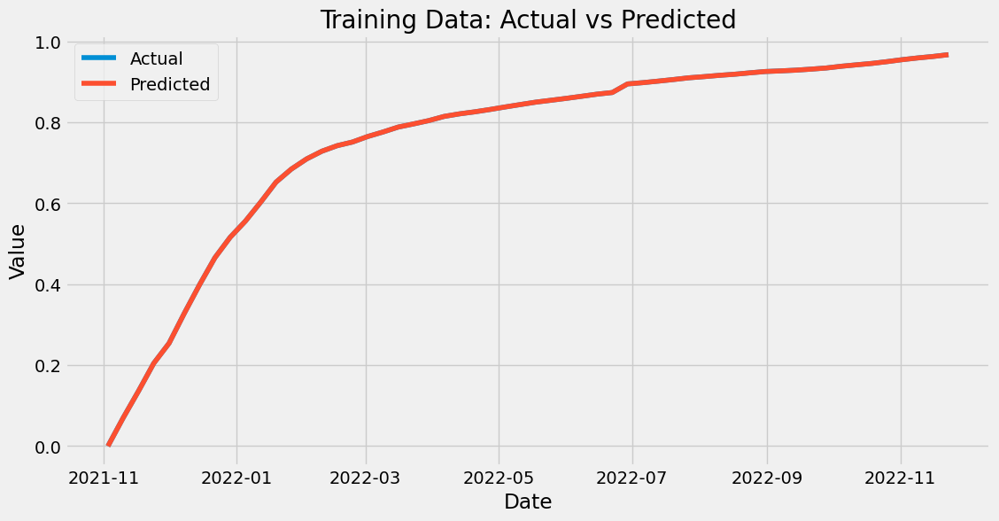

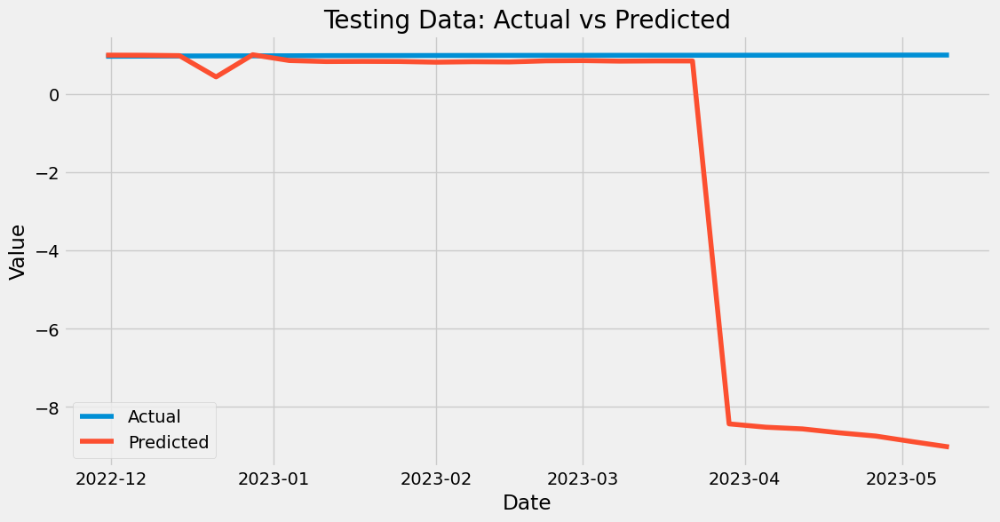

In [98]:
# Plotting for training data
plt.figure(figsize=(12, 6))
plt.plot(train['ds'], train['y'], label='Actual')
plt.plot(train['ds'], train_predictions['yhat'], label='Predicted')
plt.title('Training Data: Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

# Plotting for testing data
plt.figure(figsize=(12, 6))
plt.plot(test['ds'], test['y'], label='Actual')
plt.plot(test['ds'], test_predictions['yhat'], label='Predicted')
plt.title('Testing Data: Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


To proceed, I decided to analyze the coefficients of the additional regressors to see which are important. I wanted to simplify my model by just including a few additional features so that I could reduce overfitting. I then found which features have coefficients in or above the 90th percentile of coefficients. I wanted to include the feature engineered columns I made for the rolling statistics and lags as well to increase robustness.

In [99]:
# Extract the coefficients for additional regressors
coefficients = model.params['beta'][0]

# Map the coefficients to the corresponding regressors
regressor_names = [col for col in train.columns if col not in ['ds', 'y']]
coefficient_mapping = dict(zip(regressor_names, coefficients))

# Print the coefficients for each regressor
for regressor, coefficient in coefficient_mapping.items():
    print(f"{regressor}: {coefficient}")

MMWR_week: -17.7126
Distributed: -6.24599
Distributed_Janssen: 0.126586
Distributed_Moderna: 1.10444
Distributed_Pfizer: 1.74047
Distributed_Unk_Manuf: -0.172165
Dist_Per_100K: 5.46868
Distributed_Per_100k_5Plus: -4.95544
Distributed_Per_100k_12Plus: 15.8082
Distributed_Per_100k_18Plus: -11.192
Distributed_Per_100k_65Plus: -1.03975
Administered: -8.12095
Administered_5Plus: 4.14906
Administered_12Plus: 10.0802
Administered_18Plus: 1.31291
Administered_65Plus: -1.03781
Administered_Janssen: -0.372053
Administered_Moderna: 2.28109
Administered_Pfizer: 3.91415
Administered_Unk_Manuf: 0.134152
Admin_Per_100K: 9.96737
Admin_Per_100k_5Plus: -13.0824
Admin_Per_100k_12Plus: -0.199752
Admin_Per_100k_18Plus: 0.643769
Admin_Per_100k_65Plus: 0.440127
Recip_Administered: -13.6794
Administered_Dose1_Pop_Pct: 0.712512
Administered_Dose1_Recip_5PlusPop_Pct: 1.60661
Administered_Dose1_Recip_12PlusPop_Pct: -0.979406
Administered_Dose1_Recip_18PlusPop_Pct: 0.869499
Administered_Dose1_Recip_65PlusPop_Pct:

In [100]:
# Given coefficients
coefficients = {
    "MMWR_week": -17.7126,
    "Distributed": -6.24599,
    "Distributed_Janssen": 0.126586,
    "Distributed_Moderna": 1.10444,
    "Distributed_Pfizer": 1.74047,
    "Distributed_Unk_Manuf": -0.172165,
    "Dist_Per_100K": 5.46868,
    "Distributed_Per_100k_5Plus": -4.95544,
    "Distributed_Per_100k_12Plus": 15.8082,
    "Distributed_Per_100k_18Plus": -11.192,
    "Distributed_Per_100k_65Plus": -1.03975,
    "Administered": -8.12095,
    "Administered_5Plus": 4.14906,
    "Administered_12Plus": 10.0802,
    "Administered_18Plus": 1.31291,
    "Administered_65Plus": -1.03781,
    "Administered_Janssen": -0.372053,
    "Administered_Moderna": 2.28109,
    "Administered_Pfizer": 3.91415,
    "Administered_Unk_Manuf": 0.134152,
    "Admin_Per_100K": 9.96737,
    "Admin_Per_100k_5Plus": -13.0824,
    "Admin_Per_100k_12Plus": -0.199752,
    "Admin_Per_100k_18Plus": 0.643769,
    "Admin_Per_100k_65Plus": 0.440127,
    "Recip_Administered": -13.6794,
    "Administered_Dose1_Pop_Pct": 0.712512,
    "Administered_Dose1_Recip_5PlusPop_Pct": 1.60661,
    "Administered_Dose1_Recip_12PlusPop_Pct": -0.979406,
    "Administered_Dose1_Recip_18PlusPop_Pct": 0.869499,
    "Administered_Dose1_Recip_65PlusPop_Pct": -0.162557,
    "Series_Complete_Pop_Pct": 2.24572,
    "Series_Complete_5PlusPop_Pct": -1.7691,
    "Series_Complete_12PlusPop_Pct": -2.2114,
    "Series_Complete_18PlusPop_Pct": 0.898917,
    "Series_Complete_65PlusPop_Pct": -0.030613,
    "Series_Complete_Janssen": 1.1059,
    "Series_Complete_Moderna": -0.344974,
    "Series_Complete_Pfizer": 0.67971,
    "Series_Complete_Unk_Manuf": -1.66363,
    "Series_Complete_Janssen_12Plus": 2.44106,
    "Series_Complete_Moderna_12Plus": 15.9942,
    "Series_Complete_Pfizer_12Plus": 6.27011,
    "Series_Complete_Unk_Manuf_12Plus": 0.632878,
    "Series_Complete_Janssen_18Plus": -4.04329,
    "Series_Complete_Moderna_18Plus": -14.079,
    "Series_Complete_Pfizer_18Plus": -7.27635,
    "Series_Complete_Unk_Manuf_18Plus": 0.363388,
    "Series_Complete_Janssen_65Plus": 0.440104,
    "Series_Complete_Moderna_65Plus": -0.834406,
    "Series_Complete_Pfizer_65Plus": 0.790656,
    "Series_Complete_Unk_Manuf_65Plus": 0.320233,
    "Additional_Doses_18Plus_Vax_Pct": -3.33052,
    "Additional_Doses_50Plus_Vax_Pct": 5.58217,
    "Additional_Doses_65Plus_Vax_Pct": -0.332158,
    "Additional_Doses_Moderna": 1.88548,
    "Additional_Doses_Pfizer": 0.937175,
    "Additional_Doses_Janssen": -4.39878,
    "Additional_Doses_Unk_Manuf": 0.446367,
    "month": 0.491734,
    "year": 0.443981,
    "quarter": -0.00900019,
    "dayofyear": 7.49538,
    "dayofmonth": 0.0439242,
    "weekofyear": 10.1179,
    "Additional_Doses_Vax_Pct_1_w_lag": -0.102208,
    "Additional_Doses_Vax_Pct_3_m_lag": -0.0442407,
    "Additional_Doses_Vax_Pct_9_m_lag": 0.0214993,
    "rolling_mean": 0.153734,
    "rolling_std": 0.395855
}

# Calculate absolute values of the coefficients
abs_coefficients = {key: abs(value) for key, value in coefficients.items()}

# Calculate the 90th percentile
percentile_90 = np.percentile(list(abs_coefficients.values()), 90)

print(f'90th Percentile: {percentile_90}')

# Select predictors with coefficients >= 90th percentile
selected_predictors = {key: value for key, value in abs_coefficients.items() if value >= percentile_90}

# Output the selected predictors
print(selected_predictors)

90th Percentile: 10.225310000000002
{'MMWR_week': 17.7126, 'Distributed_Per_100k_12Plus': 15.8082, 'Distributed_Per_100k_18Plus': 11.192, 'Admin_Per_100k_5Plus': 13.0824, 'Recip_Administered': 13.6794, 'Series_Complete_Moderna_12Plus': 15.9942, 'Series_Complete_Moderna_18Plus': 14.079}


Given this feature selection, I will proceed by tuning my model as I did for the univariate `Prophet` model. One of the largest problems I faced when creating the multivariate `Prophet` model was this initial high test RMSE and overfitting. I am hoping that by setting the growth as logistic will help with the model predicting negative values and that the tuning overall will help with overfitting. Furthermore, I will set a floor and cap to assert that the output value should be between 0 and 1 as another potential solution.

In [101]:
# Set for logistic growth
train['cap'] = 1  
test['cap'] = 1 

# Initialize Prophet model with logistic growth
initial_model = Prophet(growth='logistic')

# Add country holidays
initial_model.add_country_holidays(country_name='US')

# Add specified features as additional regressors
features = [
    'MMWR_week', 'Distributed_Per_100k_12Plus', 'Distributed_Per_100k_18Plus', 
    'Admin_Per_100k_5Plus', 'Recip_Administered', 'Series_Complete_Moderna_12Plus', 
    'Series_Complete_Moderna_18Plus', "Additional_Doses_Vax_Pct_1_w_lag", 
    "Additional_Doses_Vax_Pct_3_m_lag", "Additional_Doses_Vax_Pct_9_m_lag", 
    "rolling_mean", "rolling_std"
]
for feature in features:
    initial_model.add_regressor(feature)

# Fit the model to the training data
initial_model.fit(train)

# Additional settings for logistic growth
train['floor'] = 0
test['floor'] = 0

# Parameter grid for cross-validation tuning
param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'holidays_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['additive', 'multiplicative']
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Storing the RMSEs for each set of parameters 

# Cross-validation to evaluate all parameters
for params in all_params:
    m = Prophet(growth='logistic', **params)
    m.add_country_holidays(country_name='US')
    # Add each additional regressor
    for feature in features:
        m.add_regressor(feature)
    m.fit(train.assign(cap=1, floor=0))

    df_cv = cross_validation(m, initial='180 days', period='45 days', horizon='45 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Identify the best parameters
best_params1 = all_params[np.argmin(rmses)]
print(f"Best parameters: {best_params1}")


17:12:55 - cmdstanpy - INFO - Chain [1] start processing
17:12:56 - cmdstanpy - INFO - Chain [1] done processing
17:12:56 - cmdstanpy - INFO - Chain [1] start processing
17:12:56 - cmdstanpy - INFO - Chain [1] done processing
17:12:57 - cmdstanpy - INFO - Chain [1] start processing
17:12:57 - cmdstanpy - INFO - Chain [1] start processing
17:12:57 - cmdstanpy - INFO - Chain [1] start processing
17:12:57 - cmdstanpy - INFO - Chain [1] start processing
17:12:57 - cmdstanpy - INFO - Chain [1] done processing
17:12:58 - cmdstanpy - INFO - Chain [1] done processing
17:12:58 - cmdstanpy - INFO - Chain [1] done processing
17:12:59 - cmdstanpy - INFO - Chain [1] done processing
17:12:59 - cmdstanpy - INFO - Chain [1] start processing
17:12:59 - cmdstanpy - INFO - Chain [1] done processing
17:13:00 - cmdstanpy - INFO - Chain [1] start processing
17:13:00 - cmdstanpy - INFO - Chain [1] start processing
17:13:00 - cmdstanpy - INFO - Chain [1] start processing
17:13:00 - cmdstanpy - INFO - Chain [1

Best parameters: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.01, 'holidays_prior_scale': 0.01, 'seasonality_mode': 'multiplicative'}


17:25:43 - cmdstanpy - INFO - Chain [1] done processing


In [102]:
# Refit the model with the best parameters
final_model = Prophet(growth='logistic', **best_params1)
final_model.add_country_holidays(country_name='US')
for feature in features:
    final_model.add_regressor(feature)
final_model.fit(train.assign(cap=1, floor=0))

# Predict on the training set
train_forecast = final_model.predict(train)
train_rmse = sqrt(mean_squared_error(train['y'], train_forecast['yhat']))

# Predict on the test set
test_forecast = final_model.predict(test)
test_rmse = sqrt(mean_squared_error(test['y'], test_forecast['yhat']))

print(f"Train RMSE: {train_rmse}")
print(f"Test RMSE: {test_rmse}")
# Retrieve and print the cross-validated RMSE of the best model
best_rmse_index = np.argmin(rmses)
best_rmse = rmses[best_rmse_index]
print(f"Cross-validated RMSE of the best model: {best_rmse}")


17:26:46 - cmdstanpy - INFO - Chain [1] start processing
17:26:47 - cmdstanpy - INFO - Chain [1] done processing


Train RMSE: 0.010021219867086121
Test RMSE: 0.01684613527712839
Cross-validated RMSE of the best model: 0.011242406258430045


Here, we can see that the test RMSE greatly decreased and is very similar to the train RMSE. The best parameters I got are as follows:

`'changepoint_prior_scale'`: 0.5, `'seasonality_prior_scale'`: 0.01, `'holidays_prior_scale'`: 0.01, `'seasonality_mode'`: `'multiplicative'`.

Below I tune the model once more to be exhaustive.

In [103]:
# Updated parameter grid for cross-validation tuning
param_grid = {
    'changepoint_prior_scale': [0.3, 0.4, 0.45, 0.5],
    'seasonality_prior_scale': [0.01, 0.015, 0.02, 0.025],
    'holidays_prior_scale': [0.01, 0.015, 0.02, 0.025]
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Storing the RMSEs for each set of parameters 

# Cross-validation to evaluate all parameters
for params in all_params:
    # Initialize Prophet model with logistic growth and additive seasonality
    m = Prophet(growth='logistic', seasonality_mode='multiplicative', **params)
    m.add_country_holidays(country_name='US')
    
    # Add each additional regressor
    for feature in features:
        m.add_regressor(feature)
    
    # Fit the model to the training data
    m.fit(train.assign(cap=1, floor=0))

    # Perform cross-validation
    df_cv = cross_validation(m, initial='180 days', period='45 days', horizon='45 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)

    # Store the RMSE for each parameter set
    rmses.append(df_p['rmse'].values[0])

# Identify the best parameters
best_params = all_params[np.argmin(rmses)]
print(f"Best parameters: {best_params}")

17:26:53 - cmdstanpy - INFO - Chain [1] start processing
17:26:54 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:56 - cmdstanpy - INFO - Chain [1] done processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:58 - cmdstanpy - INFO - Chain [1] done processing
17:26:58 - cmdstanpy - INFO - Chain [1

Best parameters: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.01, 'holidays_prior_scale': 0.01}


17:30:09 - cmdstanpy - INFO - Chain [1] done processing


In [104]:
# Refit the model with the best parameters
final_model = Prophet(growth='logistic', **best_params)
final_model.add_country_holidays(country_name='US')
for feature in features:
    final_model.add_regressor(feature)
final_model.fit(train.assign(cap=1, floor=0))

# Predict on the training set
train_forecast = final_model.predict(train)
train_rmse = sqrt(mean_squared_error(train['y'], train_forecast['yhat']))

# Predict on the test set
test_forecast = final_model.predict(test)
test_rmse = sqrt(mean_squared_error(test['y'], test_forecast['yhat']))

print(f"Train RMSE: {train_rmse}")
print(f"Test RMSE: {test_rmse}")
# Retrieve and print the cross-validated RMSE of the best model
best_rmse_index = np.argmin(rmses)
best_rmse = rmses[best_rmse_index]
print(f"Cross-validated RMSE of the best model: {best_rmse}")


17:34:30 - cmdstanpy - INFO - Chain [1] start processing
17:34:31 - cmdstanpy - INFO - Chain [1] done processing


Train RMSE: 0.0063968552187190315
Test RMSE: 0.10680624649090134
Cross-validated RMSE of the best model: 0.011242406258430045


After extensive tuning, the optimal parameters for the Prophet model are:

- `'changepoint_prior_scale'`: 0.5
- `'seasonality_prior_scale'`: 0.01
- `'holidays_prior_scale'`: 0.01
- `seasonality_mode`: `'multiplicative'`

A `'changepoint_prior_scale'` of 0.5 implies maximum flexibility in capturing trend changes, allowing the model to quickly adapt to shifts in the data. Conversely, a `'seasonality_prior_scale'` and `'holidays_prior_scale'` of 0.01 introduce a high level of regularization. This minimal seasonality and holiday flexibility help prevent the model from overfitting seasonal patterns and holiday effects.

The `'multiplicative'` `seasonality_mode` means that the model interprets seasonal effects as proportional to the time series level, a useful feature for data with varying seasonal amplitude.

Despite these adjustments, the model still exhibited signs of overfitting, as evidenced by the significant disparity between the training and testing RMSEs, and between the training RMSE and cross-validated RMSE. Multiple rounds of tuning were conducted to address this, but the gap persisted. This suggests that the overfitting may be inherent to the dataset's characteristics or due to other factors not fully mitigated by parameter adjustments.

#### 3. Model Performance

After tuning, the best parameters for the best multivariate `Prophet` model, I found  slightly differ from the ones used in my best univariate `Prophet` model. In this model, the trends are more flexible, the seasonality flexibility is the same, and the holiday parameter has maximum regularization, higher than that of the univariate model. Also, the multivariate model uses multiplicative seasonality as opposed to additive. The increased flexibility in trends makes sense to me as additional regressors can both cause the model to be more flexible and better adapt to the additional variables and non-linear interactions between the primary time series and additional regressors. I infer that the additional regressors may cause interactions between holiday effects and other regressors which require a heightened level of regularization to prevent overfitting. Finally, I think that the multivariate model may perform better with multiplicative seasonality as opposed to the univeriate's additive seasonality because seasonal effects may be amplified by additional regressors.

The best test RMSE for my multivariate model is 0.10680624649090134 and the cross-validated RMSE is 0.011242406258430045. It appears that there is evidence of overfitting in this model as well as most that I have created as the test RMSE is much higher than the train RMSE. The RMSEs for the multivariate `Prophet` model are lower than those of the univariate version. I believe this is because of the access to more information with the addition of other regressors. However, I think these additional regressors also contributed to the overfitting that is apparent in the multivariate `Prophet` model and absent in its univariate counterpart.

Train RMSE: 0.0063968552187190315
Test RMSE: 0.10680624649090134
Cross-validated RMSE of the best model: 0.011242406258430045


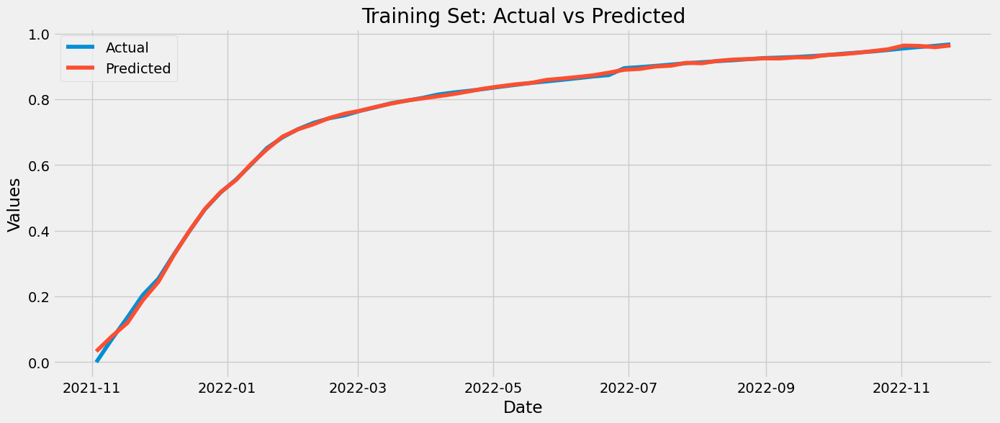

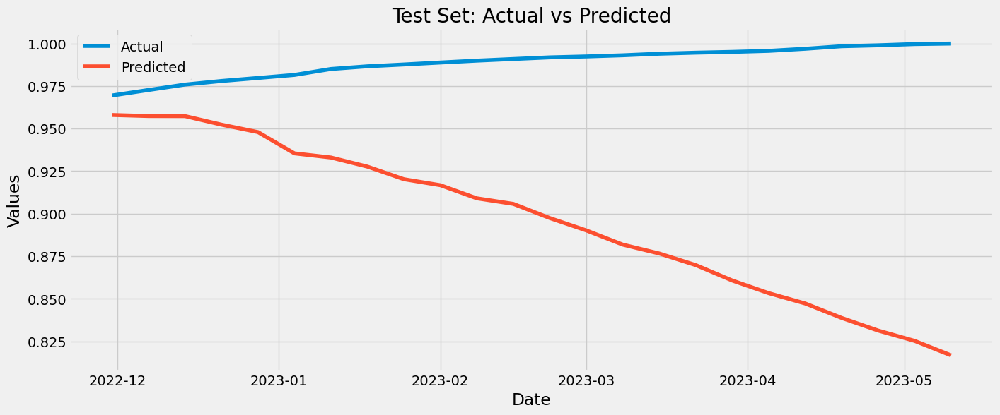

In [105]:
# Test and Train RMSE
print(f"Train RMSE: {train_rmse}")
print(f"Test RMSE: {test_rmse}")

# Print the cross-validated RMSE of the best model
best_rmse = min(rmses)
print(f"Cross-validated RMSE of the best model: {best_rmse}")

# Plotting the actual vs predicted values for the training set
plt.figure(figsize=(15, 6))
plt.plot(train['ds'], train['y'], label='Actual')
plt.plot(train_forecast['ds'], train_forecast['yhat'], label='Predicted')
plt.title('Training Set: Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()


# Plotting the actual vs predicted values for the test set
plt.figure(figsize=(15, 6))
plt.plot(test['ds'], test['y'], label='Actual')
plt.plot(test_forecast['ds'], test_forecast['yhat'], label='Predicted')
plt.title('Test Set: Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()

In [106]:
# Perform cross-validation
df_cv = cross_validation(final_model, initial='180 days', period='45 days', horizon='45 days', parallel="processes")

# Calculate performance metrics
df_p = performance_metrics(df_cv)

# Calculate and print RMSE
rmse = sqrt(mean_squared_error(df_cv['y'], df_cv['yhat']))
print(f'Cross-Validation RMSE: {rmse}')

df_p

18:02:48 - cmdstanpy - INFO - Chain [1] start processing
18:02:49 - cmdstanpy - INFO - Chain [1] start processing
18:02:49 - cmdstanpy - INFO - Chain [1] start processing
18:02:49 - cmdstanpy - INFO - Chain [1] start processing
18:02:49 - cmdstanpy - INFO - Chain [1] done processing
18:02:49 - cmdstanpy - INFO - Chain [1] done processing
18:02:49 - cmdstanpy - INFO - Chain [1] done processing


Cross-Validation RMSE: 0.01737289454707667


18:02:59 - cmdstanpy - INFO - Chain [1] done processing


,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,3 days,0.000002,0.001353,0.001353,0.001468,0.001468,0.001469,1.0
1,5 days,0.000003,0.001773,0.001731,0.001946,0.001946,0.001948,0.5
2,6 days,0.000007,0.002575,0.002539,0.002832,0.002832,0.002836,0.0
3,9 days,0.000013,0.003606,0.003557,0.003893,0.003893,0.003890,0.0
4,10 days,0.000012,0.003441,0.003346,0.003636,0.003636,0.003632,0.0
5,12 days,0.000014,0.003758,0.003605,0.004045,0.004045,0.004054,0.0
6,13 days,0.000011,0.003301,0.002356,0.002725,0.002725,0.002732,0.5
7,16 days,0.000070,0.008388,0.005954,0.006543,0.006543,0.006501,0.5
8,17 days,0.000084,0.009139,0.008496,0.009219,0.009219,0.009184,0.0
9,19 days,0.000039,0.006236,0.006151,0.006825,0.006825,0.006849,0.0


### E. `XGBoost` Model
#### 1. Data Preparation:

It is important to initially mention that I decided to develop an `XGBoost` model for four different versions of my data.

1. **Ungrouped, unscaled data**: Essentially, the dataframe created after the initial preprocessing.
2. **Grouped, unscaled data**: All observations on a specific day are averaged so that `Date` is a unique identifier, and the features remain the same magnitude as they were observed.
3. **Grouped, scaled data**: All observations on a specific day are averaged so that `Date` is a unique identifier, and the features are scaled to be between zero and one.
4. **Ungrouped, scaled data**: There are multiple observations per `Date`, and the features are scaled to be between zero and one.

For all of the versions, however, there are a few common preprocessing steps I took. I began by sorting my data by `Date` and `Location` to ensure consistency before splitting into train and test sets. I tried creating models with a few different versions of engineered features, and I will include each iteration of my feature engineering and model output process in the appendix; however, for the sake of brevity and clarity, I will include the feature engineering setup I used for my final model I tuned for each data version outlined above. First, I added rolling mean and standard deviation columns to adjust for seasonality and reduce noise (Dancho, 2017). I settled on `window = 12` which represents the three-month seasonality pattern I had previously identified. Furthermore, I converted the `Date` column to a datetime datatype and added additional lag columns for three and nine month lags to account for the three-month pattern. I chose not to impute the missing values of the lag columns as one does not need to for `XGBoost` I also one-hot-encoded my data to account for the few categorical variables in my dataframe to ensure compatibility with `XGBoost`. Here is how I did that process for Version 1 of my data:

In [107]:
# Import data
df = pd.read_csv('df_post_eda.csv')

# Predictive variable
pred_var = 'Additional_Doses_Vax_Pct' 

# Converting Date column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Sorting data by Date and Location
df_v1 = df.sort_values(by=['Date', 'Location'])

# Additional time-series features to account for 3-month pattern
# 3 month lag
df_v1['Additional_Doses_Vax_Pct_3_m_lag'] = df_v1['Additional_Doses_Vax_Pct'].shift(12)

# 9 month lag
df_v1['Additional_Doses_Vax_Pct_9_m_lag'] = df_v1['Additional_Doses_Vax_Pct'].shift(36)

# Rolling statistics
df_v1['rolling_mean'] = df_v1[pred_var].shift().rolling(window=12).mean()
df_v1['rolling_std'] = df_v1[pred_var].shift().rolling(window=12).std()

# One-hot encoding of the entire dataframe
df_encoded_v1 = pd.get_dummies(df_v1)

**Version 1**

For the train-test split for Version 1 of my data, I first created a list (`splits_by_date`) where each element is a DataFrame containing all records from `df_encoded` corresponding to a unique date. This is done by iterating over each unique date in the `Date` column. I then initialized a `TimeSeriesSplit` object from `Scikit-learn`. TimeSeriesSplit is a cross-validator for time series data, providing train/test indices to split time series data samples. I set it to have 5 splits, with a test size of 12, and a gap of 12. The `test_size` indicates the number of observations to include in each test set, and gap specifies a gap period between the train and test sets to avoid leakage. I finally created the actual train and test splits by running a loop that iterates over the pairs of train and test indices generated by `tscv.split(splits_by_date)`. For each pair of indices, it concatenates the data frames from `splits_by_date` corresponding to those indices to create the training and testing sets. This way, I ended up with multiple sets of train and test data, respecting the temporal order of the data. Finally, I dropped the `Date` column after using it to create the splits as `XGBoost` can only handle numerical data and the `Date` attribute is represented in several of the engineered features I created previously. The best model that I created for Version 1 of my data performed quite poorly, so I just used all of the features in my dataframe and did not proceed with feature selection for this data version.

In [108]:
# Split the dataset based on unique dates
splits_by_date_v1 = [df_encoded_v1[df_encoded_v1['Date'] == date] for date in df_encoded_v1['Date'].unique()]

# TimeSeriesSplit
# I made the test_size = 12 because I think three months' worth of data is sufficient

tscv = TimeSeriesSplit(n_splits=3, test_size = 12, gap = 12)

# Loop to create train and test splits
for train_index, test_index in tscv.split(splits_by_date_v1):
    train_v1 = pd.concat([splits_by_date_v1[i] for i in train_index])
    test_v1 = pd.concat([splits_by_date_v1[i] for i in test_index])

# Set up XGBoost data structures
X_train_v1, y_train_v1 = train_v1.drop([pred_var, 'Date'], axis=1), train_v1[pred_var]
X_test_v1, y_test_v1 = test_v1.drop([pred_var, 'Date'], axis=1), test_v1[pred_var]

**Version 2**

For Version 2, I followed the same specifications as Version 1; however, I dropped the `Location` column as I am averaging the observations for each `Date` across all locations. I still did not perform feature selection because the model using these data performed similarly as poorly as Version 1's did. Also, I am including a line to perform that grouping and the feature engineering after grouping. 

In [109]:
# Dropping Location column because we are grouping by Location
df_v2 = df.drop('Location', axis = 1)

# Group by 'Date' to ensure there is one unique value per date
df_v2 = df_v2.groupby('Date').mean(numeric_only=True).reset_index()

# Additional time-series columns to account for 3-month pattern
# 3 month lag
df_v2['Additional_Doses_Vax_Pct_3_m_lag'] = df_v2['Additional_Doses_Vax_Pct'].shift(12)

# 9 month lag
df_v2['Additional_Doses_Vax_Pct_9_m_lag'] = df_v2['Additional_Doses_Vax_Pct'].shift(36)

# Rolling statistics
df_v2['rolling_mean'] = df_v2[pred_var].shift().rolling(window=12).mean()
df_v2['rolling_std'] = df_v2[pred_var].shift().rolling(window=12).std()

# One-hot encoding of the entire dataframe
df_v2_encoded = pd.get_dummies(df_v2)

# Split the dataset based on unique dates
splits_by_date_v2 = [df_v2_encoded[df_v2_encoded['Date'] == date] for date in df_v2_encoded['Date'].unique()]

# Train test split
for train_index, test_index in tscv.split(splits_by_date_v2):
    train_v2 = pd.concat([splits_by_date_v2[i] for i in train_index])
    test_v2 = pd.concat([splits_by_date_v2[i] for i in test_index])

# Set up XGBoost data structures and dropping Date column because it cannot be used directly
X_train_v2, y_train_v2 = train_v2.drop([pred_var, 'Date'], axis=1), train_v2[pred_var]
X_test_v2, y_test_v2 = test_v2.drop([pred_var, 'Date'], axis=1), test_v2[pred_var]

**Version 3** 

Version 3 follows the same process as Version 2 with some modifications for scaling. Here, I employed the `MinMaxScaler()` function to scale the features from 0 to 1. To do this, I had to drop the `Date` column from the dataframe as it cannot be scaled; however, I added it back to the dataframe after scaling for use in the train-test split. I included feature engineering after grouping and scaling the data. I did not have time to do feature selection here and chose only to do it on Version 4 as it was the version whose model achieved the best results for `XGBoost`.

In [110]:
# Dropping Location column because we are grouping by Location
df_v3 = df.drop('Location', axis = 1)

# Group by 'Date' to ensure there is one unique value per date
df_v3 = df_v3.groupby('Date').mean(numeric_only=True).reset_index()

# Create a new DataFrame from the aggregated data
data = pd.DataFrame(df_v3)

# Separate the 'Date' column for scaling
date_column = data['Date']
data_without_date = data.drop('Date', axis=1)

# Initialize the MinMaxScaler
min_max_scaler = MinMaxScaler(feature_range=(0, 1))

# Apply the scaler to the data without the 'Date' column
scaled_data = min_max_scaler.fit_transform(data_without_date)

# Create a new DataFrame with the scaled data
df_v3 = pd.DataFrame(scaled_data, columns=data_without_date.columns, index=data_without_date.index)

# Add the 'Date' column back to the scaled DataFrame (for train test split)
df_v3['Date'] = date_column

# Additional time-series columns to account for 3-month pattern
# 3 month lag
df_v3['Additional_Doses_Vax_Pct_3_m_lag'] = df_v3['Additional_Doses_Vax_Pct'].shift(12)

# 9 month lag
df_v3['Additional_Doses_Vax_Pct_9_m_lag'] = df_v3['Additional_Doses_Vax_Pct'].shift(36)

# Rolling statistics
df_v3['rolling_mean'] = df_v3[pred_var].shift().rolling(window=12).mean()
df_v3['rolling_std'] = df_v3[pred_var].shift().rolling(window=12).std()

# One-hot encoding of the entire dataframe
df_encoded_v3 = pd.get_dummies(df_v3)

# Split the dataset based on unique dates
splits_by_date_v3 = [df_encoded_v3[df_encoded_v3['Date'] == date] for date in df_encoded_v3['Date'].unique()]

# Train test split
for train_index, test_index in tscv.split(splits_by_date_v3):
    train_v3 = pd.concat([splits_by_date_v3[i] for i in train_index])
    test_v3 = pd.concat([splits_by_date_v3[i] for i in test_index])

# Set up XGBoost data structures and dropping Date column because it cannot be used directly
X_train_v3, y_train_v3 = train_v3.drop([pred_var, 'Date'], axis=1), train_v3[pred_var]
X_test_v3, y_test_v3 = test_v3.drop([pred_var, 'Date'], axis=1), test_v3[pred_var]

**Version 4**

Version 4's data preparation consists of a combination of 1's and 3's in that I scale the data but do not group it. I performed feature selection after tuning my base model which I will explain more in the tuning section. I again had to drop the `Date` column and re-append after one hot encoding and scaling the data.

In [111]:
# Save the 'Date' column and drop it from the DataFrame
date_column = df['Date']
df.drop('Date', axis=1, inplace=True)

# Apply one-hot encoding to the DataFrame
df_encoded_v4 = pd.get_dummies(df)

# Apply the scaler to the encoded data
df_v4 = pd.DataFrame(min_max_scaler.fit_transform(df_encoded_v4), columns=df_encoded_v4.columns)

# Re-attach the 'Date' column
df_v4['Date'] = date_column

# Reorder the columns to place 'Date' at the start
df_v4 = df_v4[['Date'] + [col for col in df_v4.columns if col != 'Date']]

# Additional time-series columns to account for 3-month pattern
# 3 month lag
df_v4['Additional_Doses_Vax_Pct_3_m_lag'] = df_v4['Additional_Doses_Vax_Pct'].shift(12)

# 9 month lag
df_v4['Additional_Doses_Vax_Pct_9_m_lag'] = df_v4['Additional_Doses_Vax_Pct'].shift(36)

# 1 week lag (because ACF plot said to)
df_v4['Additional_Doses_Vax_Pct_1_w_lag'] = df_v4['Additional_Doses_Vax_Pct'].shift(1)

# Rolling statistics
df_v4['rolling_mean'] = df_v4[pred_var].shift().rolling(window=12).mean()
df_v4['rolling_std'] = df_v4[pred_var].shift().rolling(window=12).std()

# Split the dataset based on unique dates
splits_by_date_v4 = [df_v4[df_v4['Date'] == date] for date in df_v4['Date'].unique()]

# Train test split
for train_index, test_index in tscv.split(splits_by_date_v4):
    train_v4 = pd.concat([splits_by_date_v4[i] for i in train_index])
    test_v4 = pd.concat([splits_by_date_v4[i] for i in test_index])
    
# Set up XGBoost data structures and dropping 'Date' because XGBoost cannot handle it
X_train_v4, y_train_v4 = train_v4.drop([pred_var, 'Date'], axis=1), train_v4[pred_var]
X_test_v4, y_test_v4 = test_v4.drop([pred_var, 'Date'], axis=1), test_v4[pred_var]

#### 2. Model Building:

XGBoost, which stands for eXtreme Gradient Boosting, works by iteratively combining a sequence of simple decision trees, each correcting the errors of its predecessors, to form a powerful ensemble model that delivers highly accurate predictions. In the context of predicting vaccine rates, `XGBoost` stands out for its ability to handle complex, varied datasets with high efficiency and accuracy. It is robust to different data types and missing values and it has powerful boosting capabilities. However, successful application requires thoughtful preprocessing, feature engineering, and hyperparameter optimization to tailor the model to the specific nuances of vaccine data. Furthermore, `XGBoost` models do not have an inherent understanding of temporal structures of time series data (Brownlee, 2021; Jain, 2023).

`XGBoost` has a variety of parameters to tune. I will briefly go over some of the key ones I decided to tune and focus on. 

`subsample` controls the proportion of data used to create each tree.

`reg_alpha` represents the L1 regularization term on weights (Lasso Regression) used to prevent overfitting by penalizing the absolute size of the weights; a larger value specifies stronger regularization, and it can drive some weights to zero. 

`reg_lambda` represents the L2 regularization term on weights (Ridge Regression) used to prevent overfitting by penalizing large weights; a larger value specifies stronger regularization. 

`n_estimators` is the number of gradient boosted trees to be used in the model with a higher number giving potentially more predictive power but also slower run times and overfitting.

`min_child_weight` specifies the minimum sum of instance weight needed in a leaf to control overfitting. High values help the model avoid learning highly specific relations for a selected tree sample.

`max_depth` denotes the maximum tree depth with a deeper tree corresponding with more complex, potentially overfit, relationships by allowing for more splits.

`learning_rate` scales each tree's contribution. Higher values can cause models to be bad at generalizing whereas smaller values can make models robust but time consuming to train.

`gamma` controls the minimum loss reduction required to make a further separation on a leaf node with a higher value corresponding with fewer splits.

`colsample_bytree` represents the proportion of features to be randomly sampled to create each tree. Randomness helps with model robustness and prevents overfitting (xgboost developers, 2022).

As for the training process for `XGBoost`, I followed the same process for each version; however, I will show how I trained the model for Version 4 below and the training process for the other versions will be in the appendix.

In the Data Preparation section, I showed how I split my data into train and test sets and then into `X_train`, `y_train`, `X_test`, and `y_test` so that the `XGBoost` model can train on known data and then validate the model's predictive accuracy on unseen data to ensure its generalizability and effectiveness.

To train a base `XGBoost` model, I initiated with the parameters `learning_rate = 0.01`, `n_estimators = 1000`, and set `early_stopping_rounds = 10`. I chose a lower learning rate of 0.01, aiming for gradual weight updates to reduce overfitting risks and enhance robustness. I also selected a high number of estimators at 1000 trees to enable the model to capture complex patterns in the time-series dataset. Lastly, I implemented early stopping to halt training after 10 consecutive rounds without improvement in model performance, thereby preventing overfitting and conserving computational resources.

In [112]:
# Initialize the XGBRegressor with specific parameters
reg_base_v4 = XGBRegressor(n_estimators=1000, learning_rate=0.01, early_stopping_rounds=10)

# Fit the model to the training data
reg_base_v4.fit(X_train_v4, y_train_v4, eval_set=[(X_train_v4, y_train_v4), (X_test_v4, y_test_v4)], verbose = False)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=10,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

I then plotted the results of my model and the train and test RMSEs to evaluate the performance of my model and indicate whether I should continue training it.

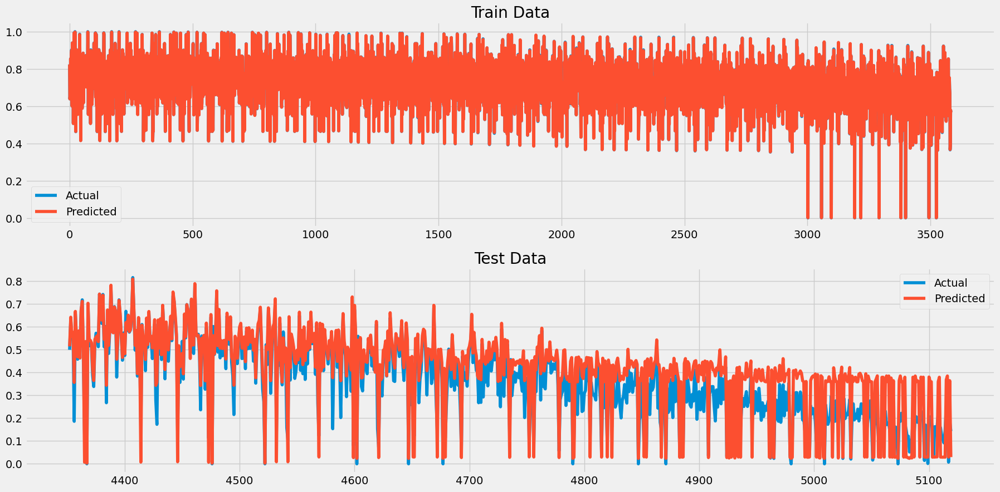

Train RMSE of base model 0.0013047871873905932
Test RMSE of base model 0.090238365990643


In [113]:
# Forecasting and Evaluation
train_pred_base_v4 = reg_base_v4.predict(X_train_v4)
test_pred_base_v4 = reg_base_v4.predict(X_test_v4)

# Plotting
fig, ax = plt.subplots(2, 1, figsize=(20, 10))

# Train plot
ax[0].plot(train_v4.index, y_train_v4, label='Actual')
ax[0].plot(train_v4.index, train_pred_base_v4, label='Predicted')
ax[0].set_title('Train Data')
ax[0].legend()

# Test plot
ax[1].plot(test_v4.index, y_test_v4, label='Actual')
ax[1].plot(test_v4.index, test_pred_base_v4, label='Predicted')
ax[1].set_title('Test Data')
ax[1].legend()

# Show the plots
plt.show()

# Print RMSE values
train_rmse_base_v4 = np.sqrt(mean_squared_error(y_train_v4, train_pred_base_v4))
test_rmse_base_v4 = np.sqrt(mean_squared_error(y_test_v4, test_pred_base_v4))
print(f"Train RMSE of base model {train_rmse_base_v4}")
print(f"Test RMSE of base model {test_rmse_base_v4}")

These results are good compared to the initial data versions I used. However, I attempt to improve them with feature selection. I did this by extracting feature importances from the previous base `XGBoost` model, `reg_base_v4`, by selecting features exceeding the average importance. I then retrained a new model with these selected features, evaluated its performance using RMSE, and printed the number, names of the selected features, and parameters of the retrained model, `selected_model_base` (Pedregosa et al., 2011).

In [114]:
# 1. Extract feature importances
importances = reg_base_v4.feature_importances_

# 2. Determine a threshold
threshold = np.mean(importances)

# 3. Select features based on threshold
selection = SelectFromModel(reg_base_v4, threshold=threshold, prefit=True)
X_train_selected_v4 = selection.transform(X_train_v4)
X_test_selected_v4 = selection.transform(X_test_v4)

4. # Retrain model with selected features
selected_model_base = xgb.XGBRegressor(learning_rate=0.01, n_estimators=1000, early_stopping_rounds=10)
selected_model_base.fit(X_train_selected_v4, y_train_v4, eval_set=[(X_train_selected_v4, y_train_v4), (X_test_selected_v4, y_test_v4)], verbose=False)

# 5. Evaluate the retrained model
train_pred_selected = selected_model_base.predict(X_train_selected_v4)
test_pred_selected = selected_model_base.predict(X_test_selected_v4)

# Calculate RMSE for the retrained model
train_rmse_selected = np.sqrt(mean_squared_error(y_train_v4, train_pred_selected))
test_rmse_selected = np.sqrt(mean_squared_error(y_test_v4, test_pred_selected))
print(f"Train RMSE with selected features: {train_rmse_selected}")
print(f"Test RMSE with selected features: {test_rmse_selected}")

# Print the number and names of selected features
selected_features = np.array(X_train_v4.columns)[selection.get_support()]
print(f"Number of selected features: {len(selected_features)}")
print("Selected features:", selected_features)

# Print the parameters used in the selected_model_base
params_selected_model_base = selected_model_base.get_params()
print("Parameters used in the model:\n", params_selected_model_base)

Train RMSE with selected features: 0.0012672636322900329
Test RMSE with selected features: 0.08596906481390161
Number of selected features: 12
Selected features: ['Distributed' 'Distributed_Janssen' 'Distributed_Per_100k_65Plus'
 'Administered' 'Administered_Janssen' 'Administered_Pfizer'
 'Administered_Dose1_Recip_65PlusPop_Pct' 'Series_Complete_Janssen'
 'Series_Complete_Unk_Manuf' 'Series_Complete_Unk_Manuf_12Plus'
 'Additional_Doses_18Plus_Vax_Pct' 'Additional_Doses_65Plus_Vax_Pct']
Parameters used in the model:
 {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'early_stopping_rounds': 10, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'gpu_id': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.01, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'm

The results showed improvement, but to further enhance the model, I initiated hyperparameter tuning using `RandomizedSearchCV` for a coarse grid search, which efficiently identifies the general range of optimal hyperparameters with minimal computing resources. `RandomizedSearchCV` randomly selects and evaluates a specified number of combinations from a given hyperparameter space, using cross-validation to identify the best performing model configuration efficiently. I used `cv = tscv` to ensure I am cross validating while respecting the temporal nature of the data as `TimeSeriesSplit` provides train/test indices to split the time series data samples into such a way (Pedregosa et al., 2011).

In [115]:
# Define the hyperparameter space
param_dist_v4 = {
    'learning_rate': [0.001, 0.01, 0.05, 0.1, 0.2, 0.3],
    'n_estimators': [25, 50, 100, 150, 200, 250, 300, 400, 500, 1000],
    'max_depth': np.arange(3, 10, 1),
    'min_child_weight': np.arange(1, 6, 1),
    'gamma': np.linspace(0, 0.5, 5),
    'subsample': np.linspace(0.5, 1, 5),
    'colsample_bytree': np.linspace(0.5, 1, 5),
    'reg_alpha': np.logspace(-5, 1, 5),
    'reg_lambda': np.logspace(-5, 1, 5)
}

# Initialize XGBoost regressor
xgb_reg_v4 = XGBRegressor(n_estimators=1000)

# Initialize RandomizedSearchCV
random_search_v4 = RandomizedSearchCV(
    estimator=xgb_reg_v4, 
    param_distributions=param_dist_v4, 
    n_iter=100, 
    scoring='neg_mean_squared_error', 
    cv=tscv, 
    verbose=1, 
    n_jobs=-1, 
    random_state=42
)

# Perform the tuning
random_search_v4.fit(X_train_selected_v4, y_train_v4)
 
# Evaluate the best model
best_model_fs_v4 = random_search_v4.best_estimator_
train_pred_fs_v4 = best_model_fs_v4.predict(X_train_selected_v4)
test_pred_fs_v4 = best_model_fs_v4.predict(X_test_selected_v4)

# Calculate RMSE for the best model
train_rmse_fs_v4 = sqrt(mean_squared_error(y_train_v4, train_pred_fs_v4))
test_rmse_fs_v4 = sqrt(mean_squared_error(y_test_v4, test_pred_fs_v4))

# Print the best parameters and RMSE values
print("Best parameters:", random_search_v4.best_params_)
print(f"Train RMSE: {train_rmse_fs_v4}")
print(f"Test RMSE: {test_rmse_fs_v4}")

Fitting 3 folds for each of 100 candidates, totalling 300 fits


/Users/avaserin/anaconda3/lib/python3.11/site-packages/xgboost/data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):
/Users/avaserin/anaconda3/lib/python3.11/site-packages/xgboost/data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):
/Users/avaserin/anaconda3/lib/python3.11/site-packages/xgboost/data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):
/Users/avaserin/anaconda3/lib/python3.11/site-packages/xgboost/data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):
/Users/avaserin/anaconda3/lib/python3.11/site-packages/xgboost/data.py:427: FutureWa

Best parameters: {'subsample': 0.75, 'reg_lambda': 0.31622776601683794, 'reg_alpha': 0.01, 'n_estimators': 400, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.2, 'gamma': 0.0, 'colsample_bytree': 0.625}
Train RMSE: 0.0011601848782626465
Test RMSE: 0.1025870952741192


Despite searching through other parameters using `RandomizedSearchCV`, I could not achieve a test RMSE lower than that of the base model with feature selection. Although I wanted to do a `GridSearchCV`, Professor Shi said not to focus on tuning, and it is very computationally expensive to perform one. Therefore, I proceeded with the parameters found in the feature selected base model.

During this phase, I encountered several challenges: My laptop's limited memory meant that both `RandomizedSearchCV` and `GridSearchCV` were computationally intensive, sometimes taking over 24 hours to complete. Additionally, developing and tuning models for all of the data versions I previously mentioned was time-consuming and often unproductive. Surprisingly, in some cases, my initial base model outperformed the grid-searched models, even though the grid included the base model's parameters. Finally, I suspect overfitting was a primary issue, likely due to the cumulative nature of my data and the small size of my dataframe.

#### 3. Model Performance

I am confident I created and tuned the `XGBoost` model with among the lowest RMSEs possible given my small dataframe and issues with cumulative predictions. Despite this, compared to other models, the RMSE is relatively high. Furthermore, the visualizations make clear that there is evidence of overfitting in my models. Some of the most important features in this model include the percent of people 18+ who completed a primary series and have received a booster (or additional) doses (`Additional_Doses_18Plus_Vax_Pct`), total number of doses delivered per 100,000 people ages 65+ (`Distributed_Per_100k_65Plus`), and total number of doses delivered from other manufacturers (`Series_Complete_Unk_Manuf`). This indicates that looking at specific age groups' vaccination rates can help to inform overall vaccination rates and that unpopular vaccine manufacturers might have a large impact.

Train RMSE with selected features: 0.0012672636322900329
Test RMSE with selected features: 0.08596906481390161


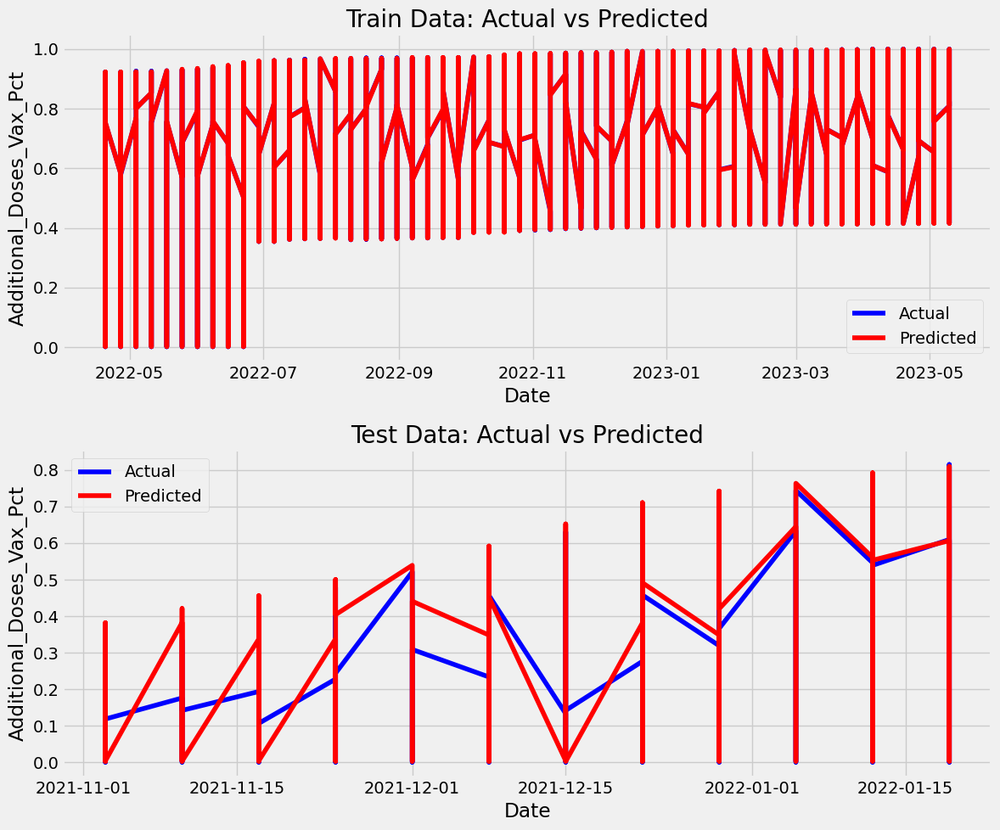

<Figure size 1000x600 with 0 Axes>

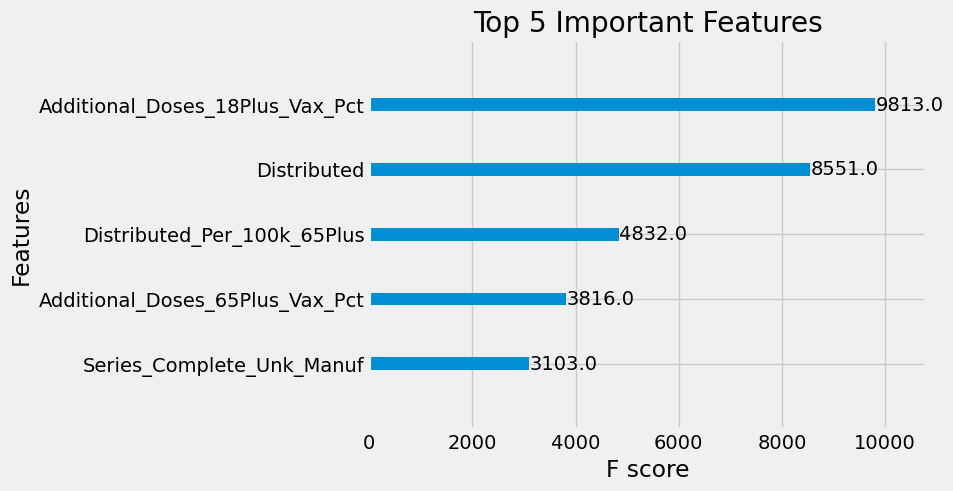

In [116]:
# Evaluate the retrained model
train_pred_selected = selected_model_base.predict(X_train_selected_v4)
test_pred_selected = selected_model_base.predict(X_test_selected_v4)

# Calculate RMSE for the retrained model
train_rmse_selected = np.sqrt(mean_squared_error(y_train_v4, train_pred_selected))
test_rmse_selected = np.sqrt(mean_squared_error(y_test_v4, test_pred_selected))
print(f"Train RMSE with selected features: {train_rmse_selected}")
print(f"Test RMSE with selected features: {test_rmse_selected}")

# Visualizing Predicted vs Actual Values for Train and Test Sets
fig, ax = plt.subplots(2, 1, figsize=(12, 10))

# Train Data
ax[0].plot(train_v4['Date'], y_train_v4, label='Actual', color='blue')
ax[0].plot(train_v4['Date'], train_pred_selected, label='Predicted', color='red')
ax[0].set_title('Train Data: Actual vs Predicted')
ax[0].legend()
ax[0].set_xlabel('Date')
ax[0].set_ylabel(pred_var)

# Test Data
ax[1].plot(test_v4['Date'], y_test_v4, label='Actual', color='blue')
ax[1].plot(test_v4['Date'], test_pred_selected, label='Predicted', color='red')
ax[1].set_title('Test Data: Actual vs Predicted')
ax[1].legend()
ax[1].set_xlabel('Date')
ax[1].set_ylabel(pred_var)

plt.tight_layout()
plt.show()
# Extract the names of the selected features
selected_feature_names = np.array(X_train_v4.columns)[selection.get_support()]

# Set the feature names in the XGBoost model
selected_model_base.get_booster().feature_names = selected_feature_names.tolist()
# Display Top 5 Important Features
plt.figure(figsize=(10, 6))
plot_importance(selected_model_base, max_num_features=5)
plt.title('Top 5 Important Features')
plt.show()


In [117]:
# Initialize a list to store RMSEs for each fold
cv_rmses = []

# Perform TimeSeriesSplit
for train_index, test_index in tscv.split(splits_by_date_v4):
    train = pd.concat([splits_by_date_v4[i] for i in train_index])
    test = pd.concat([splits_by_date_v4[i] for i in test_index])
    
    X_train, y_train = train.drop([pred_var, 'Date'], axis=1), train[pred_var]
    X_test, y_test = test.drop([pred_var, 'Date'], axis=1), test[pred_var]

    # Feature selection and model fitting as before
    reg_base = XGBRegressor(n_estimators=1000, learning_rate=0.01, early_stopping_rounds=10)
    reg_base.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], verbose=False)
    selection = SelectFromModel(reg_base, threshold='mean', prefit=True)
    X_train_selected = selection.transform(X_train)
    X_test_selected = selection.transform(X_test)

    selected_model = xgb.XGBRegressor(learning_rate=0.01, n_estimators=1000, early_stopping_rounds=10)
    selected_model.fit(X_train_selected, y_train, eval_set=[(X_train_selected, y_train), (X_test_selected, y_test)], verbose=False)

    # Make predictions and calculate RMSE
    test_pred = selected_model.predict(X_test_selected)
    rmse = np.sqrt(mean_squared_error(y_test, test_pred))
    cv_rmses.append(rmse)

# Calculate the average cross-validated RMSE
cv_rmse = np.mean(cv_rmses)
print(f"Cross-validated RMSE: {cv_rmse}")


Cross-validated RMSE: 0.06388431417642502


### F. Long Short-Term Memory (LSTM) Model
#### 1. Data Preparation:

For the LSTM model, I created many different initial variations with different data preparations. For instance, I tried some models where I imputed NaN values with zeroes or normalized instead of scaling my data. I will include these versions in the appendix. Below is the data preparation I did for my most successful model.

I began by importing the cleaned data, converting the `Date` column to a datetime datatype and sorting it by `Date` and `Location` to ensure the train-test split is done correctly and without data leakage. I one-hot-encoded the categorical variables as LSTM models inherently work with numerical data, and categorical data are not interpretable by them (Pramoditha, 2022). I then set `Date` and `Location` as a multi-index to form a combined, two-level index for each row. This helps to preserve the temporal and spatial context of the dataset to accurately model time series data that varies over time and across different locations. I added the lag and rolling mean and standard deviation models I have added to all of the other models I have developed for the same reasons. There were many NaN values in these columns because of the nature of how lag columns are developed. Finally, I scaled the data to fall within a range from 0 to 1 using `MinMaxScaler` as LSTM models, like many neural network architectures, are sensitive to the scale of input data. Scaling can optimize gradient descent efficiency and help the data conform to activation function dynamics (Hedengren, 2022). 

Next, to create sequences from the scale as inputs to the LSTM model, I created a function `make_series` so that the model can capture temporal dependencies (Aggarwal, 2023). I wanted to create a sequence for each location to capture any differences in the data across locations, so I grouped using `groupby(level = 'Location')` before constructing the sequences of length 12 corresponding to a segment of continuous observations. I chose this length to capture the relevant three-month temporal patterns in the data. The target variable, `target`, for each sequence is `pred_var` at the end of the sequence. Furthermore, I decided to use all of the features in my model as 

The generated sequences, `data_series` are then split into training and testing sets with the `test_size` parameter determining the number of sequences included in the test set. I then split `data_series` into train and test series with the test series being size 1080 as it represents approximately 20% of the data and is a multiple of 12 (the sequence length I used). Finally, the sequences are converted into arrays with `X_train` and `X_test` containing the input features (excluding the target variable), and `y_train` and `y_test` containing the corresponding target values. Instead of feature selection, I performed feature extraction for this model by employing principal component analysis (PCA) to reduce dimensionality to reduce model complexity. Despite this, I achieved far worse results by way of RMSE. The code I used a results from PCA can be found in the [LSTM Feature Extraction section](#LSTM-PCA) of the appendix.

Finally, I initialized `TimeSeriesSplit` for cross-validation throughout the model training process to ensure that validation sets are always later in time than the training sets. This respect of temporal order of observations is crucial for time series models such as LSTMs, and it was important for me to cross-validate as I trained my models to mitigate overfitting concerns.

In [118]:
# Import data
df = pd.read_csv('df_post_eda.csv')

# Convert 'Date' to datetime and sort by 'Date' and 'Location'
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(by=['Date', 'Location'])

# Identify categorical columns except 'Location'
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_cols.remove('Location')

# One-hot encode these categorical columns
df_encoded = pd.get_dummies(df, columns=categorical_cols)

# 'Date' and 'Location' as indices
df_encoded.set_index(['Date', 'Location'], inplace=True)

# Additional time-series columns to account for 3-month pattern
df_encoded['Additional_Doses_Vax_Pct_3_m_lag'] = df_encoded[pred_var].shift(12)
df_encoded['Additional_Doses_Vax_Pct_9_m_lag'] = df_encoded[pred_var].shift(36)

# Rolling statistics
df_encoded['rolling_mean'] = df_encoded[pred_var].shift().rolling(window=12).mean()
df_encoded['rolling_std'] = df_encoded[pred_var].shift().rolling(window=12).std()

# Forward fill missing values
df_encoded.fillna(method='ffill', inplace=True)
df_encoded.fillna(method='bfill', inplace=True)

# Initialize MinMaxScaler
min_max_scaler = MinMaxScaler(feature_range=(0, 1))

# Apply the scaler to the data
df_scaled = pd.DataFrame(min_max_scaler.fit_transform(df_encoded), columns=df_encoded.columns, index=df_encoded.index)

# Function to create sequences for LSTM
def make_series(data, sequence_length, pred_var):
    series = []
    for location, group in data.groupby(level='Location'):
        group = group.reset_index(level='Location', drop=True)
        for i in range(sequence_length, len(group)):
            sequence = group[i - sequence_length:i]
            target = group.iloc[i][pred_var]
            series.append((sequence.index[0], target, sequence.drop(pred_var, axis=1).values))
    return series

# Set sequence length
sequence_length = 12

# Create sequences from the scaled data
data_series = make_series(df_scaled, sequence_length, pred_var)

# Split into train and test sequences
test_size = 1080  # Size of test set
train_series = data_series[:-test_size]
test_series = data_series[-test_size:]

# Prepare data for LSTM
X_train = np.array([x[2] for x in train_series])
y_train = np.array([x[1] for x in train_series])
X_test = np.array([x[2] for x in test_series])
y_test = np.array([x[1] for x in test_series])

# Initialize TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

#### 2. Model Building:

There are many parameters in the LSTM model one can modify to help tune the model. I will go over a few below:

Number of Neurons (`neurons_options`): In the LSTM layer, units specify the dimensionality of the output space, or the number of neurons in the layer. This parameter determines the model's ability to learn complex patterns at the risk of overfitting.

Return Sequences (`return_sequences`): Determines if the layer should return the full sequence (True) or only the last output (False).

Optimizer (`optimizer`): In the model's compile method, the optimizer parameter is set, often to 'adam' for LSTM models. It's defined as `optimizer='adam'`. Adam modifies the learning rate throughout model training.

Loss Function (`loss`): This computes the quantity that a model should seek to minimize during training, for example Mean Absolute Error (MAE).

Dropout (`dropout_options`): Dropout is the proportion of the neurons in the layer to be omitted during training and is a regularization technique to prevent overfitting. 

Regularization Coefficients (`l1_reg_options` and `l2_reg_options`): These are the options for Lasso and Ridge regularization coefficients, respectively used to prevent overfitting. 

Batch Size (`batch_sizes`): Specifies the size of the batch of training data used in each iteration of the model's training process, influencing the speed and stability of the network's convergence. 

Activation Function (`activation`): The activation function is a mathematical operation applied to a node's output, transforming the input signal into an output signal and introducing non-linearity into the model (Chollet, n.d.; Chowdhury, 2021).

As for the training process, in the following code chunk I implement a cross-validation process to train the model followed by training a final model on the full training dataset. I did this by iterating over training and validation splits produced by `TimeSeriesSplit`and splitting the training data into training and validation sets for the current fold using indices. I then define the LSTM model with an input layer (`Input`), an LSTM layer (`LSTM`), a dropout layer (`Dropout`), and an output layer (`Dense`). The model is compiled with the Adam optimizer and MAE loss function, trained on the current training fold, and then validated on the respective subset. I decided to use `epochs=100` and `batch_size=32` because such a relatively high number of epochs allows it to train for an extended period and a batch size of 32 balances computational efficiency and model convergence. After this cross-validation is performed, the final model is defined with the same architecture and trained in the same way on the entire training dataset without validation data to optimize the model's performance.

In [119]:
# Cross-Validation Loop
for train_index, val_index in tscv.split(X_train):
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # Define LSTM model
    inputs = Input(shape=(sequence_length, X_train_fold.shape[2]))
    lstm_out = LSTM(32, return_sequences=False)(inputs)
    lstm_out = Dropout(0.2)(lstm_out)
    outputs = Dense(1)(lstm_out)
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='mae')

    # Fit the model on this fold
    model.fit(X_train_fold, y_train_fold, epochs=100, batch_size=32,
              validation_data=(X_val_fold, y_val_fold), shuffle=False)

# Final Model Training on Full Train Data
model_final = Model(inputs=inputs, outputs=outputs)
model_final.compile(optimizer='adam', loss='mae')
model_final.fit(X_train, y_train, epochs=100, batch_size=32, shuffle=False)

Epoch 1/100


2023-11-27 18:06:08.296705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:08.297316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:08.297649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 12ms/step - loss: 0.2970 - val_loss: 0.1270
Epoch 2/100
18/18 [==============================] - 0s 3ms/step - loss: 0.1861 - val_loss: 0.1461
Epoch 3/100
18/18 [==============================] - 0s 3ms/step - loss: 0.1639 - val_loss: 0.1063
Epoch 4/100
 1/18 [>.............................] - ETA: 0s - loss: 0.1483

2023-11-27 18:06:08.978867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:08.979483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:08.979881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 3ms/step - loss: 0.1461 - val_loss: 0.0891
Epoch 5/100
18/18 [==============================] - 0s 3ms/step - loss: 0.1197 - val_loss: 0.0970
Epoch 6/100
18/18 [==============================] - 0s 3ms/step - loss: 0.1126 - val_loss: 0.1142
Epoch 7/100
18/18 [==============================] - 0s 3ms/step - loss: 0.1259 - val_loss: 0.0882
Epoch 8/100
18/18 [==============================] - 0s 3ms/step - loss: 0.0911 - val_loss: 0.0832
Epoch 9/100
18/18 [==============================] - 0s 3ms/step - loss: 0.0930 - val_loss: 0.0874
Epoch 10/100
18/18 [==============================] - 0s 3ms/step - loss: 0.0778 - val_loss: 0.0845
Epoch 11/100
18/18 [==============================] - 0s 3ms/step - loss: 0.0764 - val_loss: 0.0945
Epoch 12/100
18/18 [==============================] - 0s 3ms/step - loss: 0.0851 - val_loss: 0.1279
Epoch 13/100
18/18 [==============================] - 0s 3ms/step - loss: 0.0866 - val_loss: 0.1404
Epoch 14/100
18/18

2023-11-27 18:06:14.314409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:14.314861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:14.315437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

 1/34 [..............................] - ETA: 13s - loss: 0.1294

2023-11-27 18:06:14.547908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:14.548527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:14.549009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 6ms/step - loss: 0.1937 - val_loss: 0.0689
Epoch 2/100
34/34 [==============================] - 0s 2ms/step - loss: 0.1541 - val_loss: 0.1822
Epoch 3/100
34/34 [==============================] - ETA: 0s - loss: 0.1190

2023-11-27 18:06:14.862363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:14.862842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:14.863504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 2ms/step - loss: 0.1190 - val_loss: 0.1418
Epoch 4/100
34/34 [==============================] - 0s 2ms/step - loss: 0.1086 - val_loss: 0.1002
Epoch 5/100
34/34 [==============================] - 0s 2ms/step - loss: 0.0979 - val_loss: 0.1028
Epoch 6/100
34/34 [==============================] - 0s 2ms/step - loss: 0.0929 - val_loss: 0.1012
Epoch 7/100
34/34 [==============================] - 0s 2ms/step - loss: 0.1033 - val_loss: 0.1529
Epoch 8/100
34/34 [==============================] - 0s 2ms/step - loss: 0.0894 - val_loss: 0.1373
Epoch 9/100
34/34 [==============================] - 0s 2ms/step - loss: 0.0732 - val_loss: 0.0937
Epoch 10/100
34/34 [==============================] - 0s 2ms/step - loss: 0.0722 - val_loss: 0.0866
Epoch 11/100
34/34 [==============================] - 0s 2ms/step - loss: 0.0705 - val_loss: 0.0697
Epoch 12/100
34/34 [==============================] - 0s 2ms/step - loss: 0.0727 - val_loss: 0.0624
Epoch 13/100
34/34 

2023-11-27 18:06:21.869387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:21.869911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:21.870385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 5ms/step - loss: 0.1994 - val_loss: 0.0882
Epoch 2/100
51/51 [==============================] - 0s 2ms/step - loss: 0.1688 - val_loss: 0.0906
Epoch 3/100
 1/51 [..............................] - ETA: 0s - loss: 0.1374

2023-11-27 18:06:22.553890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:22.554318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:22.555007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 2ms/step - loss: 0.1392 - val_loss: 0.0845
Epoch 4/100
51/51 [==============================] - 0s 2ms/step - loss: 0.1258 - val_loss: 0.0794
Epoch 5/100
51/51 [==============================] - 0s 2ms/step - loss: 0.1177 - val_loss: 0.0751
Epoch 6/100
51/51 [==============================] - 0s 2ms/step - loss: 0.1108 - val_loss: 0.0741
Epoch 7/100
51/51 [==============================] - 0s 2ms/step - loss: 0.1074 - val_loss: 0.0693
Epoch 8/100
51/51 [==============================] - 0s 2ms/step - loss: 0.0998 - val_loss: 0.0663
Epoch 9/100
51/51 [==============================] - 0s 2ms/step - loss: 0.0985 - val_loss: 0.0670
Epoch 10/100
51/51 [==============================] - 0s 2ms/step - loss: 0.0993 - val_loss: 0.0647
Epoch 11/100
51/51 [==============================] - 0s 2ms/step - loss: 0.0935 - val_loss: 0.0592
Epoch 12/100
51/51 [==============================] - 0s 2ms/step - loss: 0.0760 - val_loss: 0.0622
Epoch 13/100
51/51 

2023-11-27 18:06:33.299321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:33.299833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:33.300352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 4ms/step - loss: 0.2193 - val_loss: 0.1747
Epoch 2/100
51/68 [=====================>........] - ETA: 0s - loss: 0.1751

2023-11-27 18:06:34.005173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:34.005659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:34.006247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 2ms/step - loss: 0.1660 - val_loss: 0.1852
Epoch 3/100
68/68 [==============================] - 0s 2ms/step - loss: 0.1318 - val_loss: 0.1882
Epoch 4/100
68/68 [==============================] - 0s 2ms/step - loss: 0.1229 - val_loss: 0.1317
Epoch 5/100
68/68 [==============================] - 0s 2ms/step - loss: 0.1099 - val_loss: 0.1261
Epoch 6/100
68/68 [==============================] - 0s 2ms/step - loss: 0.0949 - val_loss: 0.1468
Epoch 7/100
68/68 [==============================] - 0s 2ms/step - loss: 0.0888 - val_loss: 0.1166
Epoch 8/100
68/68 [==============================] - 0s 2ms/step - loss: 0.0870 - val_loss: 0.1518
Epoch 9/100
68/68 [==============================] - 0s 2ms/step - loss: 0.0819 - val_loss: 0.1218
Epoch 10/100
68/68 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.1149
Epoch 11/100
68/68 [==============================] - 0s 2ms/step - loss: 0.0759 - val_loss: 0.1227
Epoch 12/100
68/68 [

2023-11-27 18:06:47.880319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:47.880988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:47.881361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 4ms/step - loss: 0.1531 - val_loss: 0.0949
Epoch 2/100
47/85 [===============>..............] - ETA: 0s - loss: 0.1266

2023-11-27 18:06:48.638613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:06:48.639410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:06:48.639874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 3ms/step - loss: 0.1243 - val_loss: 0.0747
Epoch 3/100
85/85 [==============================] - 0s 2ms/step - loss: 0.1205 - val_loss: 0.0799
Epoch 4/100
85/85 [==============================] - 0s 2ms/step - loss: 0.1108 - val_loss: 0.0750
Epoch 5/100
85/85 [==============================] - 0s 2ms/step - loss: 0.1031 - val_loss: 0.0798
Epoch 6/100
85/85 [==============================] - 0s 2ms/step - loss: 0.0929 - val_loss: 0.0719
Epoch 7/100
85/85 [==============================] - 0s 2ms/step - loss: 0.0913 - val_loss: 0.0700
Epoch 8/100
85/85 [==============================] - 0s 2ms/step - loss: 0.0867 - val_loss: 0.0672
Epoch 9/100
85/85 [==============================] - 0s 2ms/step - loss: 0.0802 - val_loss: 0.0680
Epoch 10/100
85/85 [==============================] - 0s 2ms/step - loss: 0.0764 - val_loss: 0.0663
Epoch 11/100
85/85 [==============================] - 0s 2ms/step - loss: 0.0794 - val_loss: 0.0651
Epoch 12/100
85/85 [

2023-11-27 18:07:06.182844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:07:06.183417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:07:06.183950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

102/102 [==============================] - 1s 2ms/step - loss: 0.0288
Epoch 2/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0281
Epoch 3/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0304
Epoch 4/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0255
Epoch 5/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0253
Epoch 6/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0256
Epoch 7/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0241
Epoch 8/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0257
Epoch 9/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0235
Epoch 10/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0284
Epoch 11/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0223
Epoch 12/100
102/102 [==============================] - 0s 2ms/step - loss: 0.0240
Epoch 13/100
102/102 [===

34/34 [==============================] - 0s 674us/step


2023-11-27 18:08:00.745030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:00.745475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:00.746101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

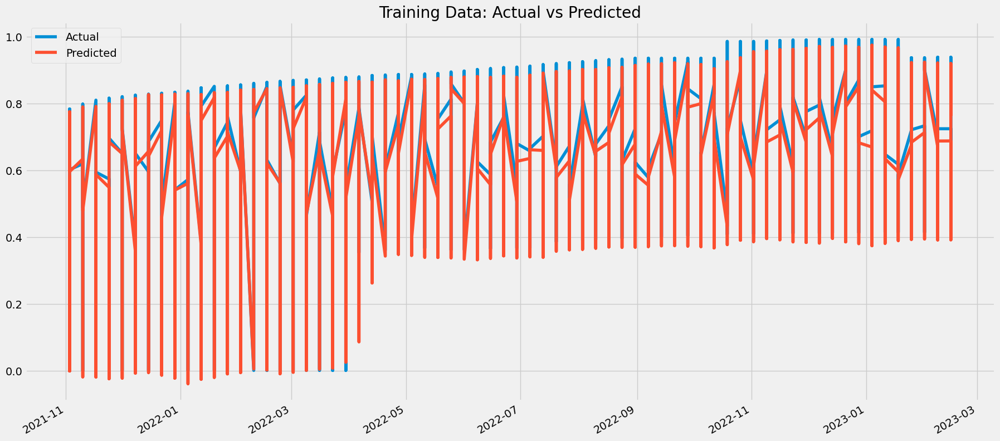

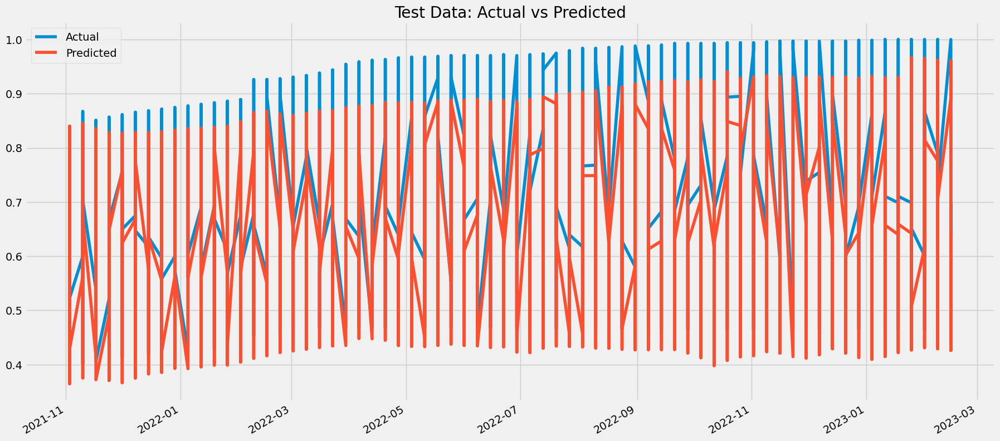

In [120]:
# Generate predictions
train_pred = model_final.predict(X_train).flatten()  # Flatten to ensure it's a 1D array
test_pred = model_final.predict(X_test).flatten()

# Create DataFrames for the actual and predicted values with proper indexing
# Ensure the index is constructed correctly for the training ground truth
train_indices = [x[0] for x in train_series]
train_gt = pd.DataFrame(y_train, columns=['y'], index=train_indices)
train_pred_df = pd.DataFrame(train_pred, columns=['yhat'], index=train_indices)

# Plot training predictions and actual values
pd.concat([train_gt, train_pred_df], axis=1).plot(figsize=(20,10))
plt.legend(['Actual', 'Predicted'])
plt.title('Training Data: Actual vs Predicted')

# Ensure the index is constructed correctly 
test_indices = [x[0] for x in test_series]
test_gt = pd.DataFrame(y_test, columns=['y'], index=test_indices)
test_pred_df = pd.DataFrame(test_pred, columns=['yhat'], index=test_indices)

# Plot test predictions and actual values
pd.concat([test_gt, test_pred_df], axis=1).plot(figsize=(20,10))
plt.legend(['Actual', 'Predicted'])
plt.title('Test Data: Actual vs Predicted')
plt.show()

In [121]:
# Calculate metrics
train_mae = mean_absolute_error(y_train, train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
train_r2 = r2_score(y_train, train_pred)

test_mae = mean_absolute_error(y_test, test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
test_r2 = r2_score(y_test, test_pred)

print("Training Metrics:")
print(f"MAE: {train_mae}")
print(f"RMSE: {train_rmse}")
print(f"R2: {train_r2}")

print("\nTest Metrics:")
print(f"MAE: {test_mae}")
print(f"RMSE: {test_rmse}")
print(f"R2: {test_r2}")

Training Metrics:
MAE: 0.026000731810113784
RMSE: 0.03099349464410889
R2: 0.9517904485789822

Test Metrics:
MAE: 0.04867035405712069
RMSE: 0.05973041769173671
R2: 0.8042515041695877


To tune the model and reduce overfitting, I employed a learning rate scheduler that increases the rate until `epoch` reaches 10 and then decays it every 10 epochs to help the model converge quickly but fine-tune slowly. 

Next, the `build_model` function defines the architecture of the model by taking the hyperparameters I am tuning as inputs. It consists of two LSTM layers, dropout layers to prevent overfitting, and a final dense layer with a sigmoid activation function as it naturally constrains the output to be within the range of 0 to 1, which aligns with the nature of the response variable (a proportion or percentage). Then, the model is compiled with the Adam optimizer and MAE loss.

I then defined two training callbacks:
1. `lr_scheduler` uses `LearningRateScheduler()` to adjust the learning rate based on my `scheduler` function (Chollet, n.d.).
2. `early_stopping` monitors the validation loss, terminates the training process if that loss does not improve after 20 epochs, and restores the best weights observed during training.

As for the hyperparameter grid search, I decided to focus on tuning the number of neurons, dropout rates, L1 and L2 regularization strengths, and batch sizes. For these, I created lists for five hyperparameters to iterate over in nested loops to try all of the possible combinations. 

Within these nested loops, cross validation is performed using `tscv.split` on the train data as I previously described in the base model. In each of these folds, a model is developed with the current combination of hyperparameters and trained on the training set all while monitoring that validation set's performance and using the callbacks.

After each round of training, the best validation loss for that fold is recorded as well as the average validation loss across the folds. For the sets of hyperparameters producing a lower average validation loss than the best configuration already created, the `best_val_loss` and `best_config` variables are updated.

Once all of the hyperparameter combinations are evaluated, the final model using the best configuration obtained during hyperparameter tuning is rebuilt, compiled, and trained on the full training dataset. That model is then evaluated by various metrics. 

I had various initial models that I had created that had issues that I improved on in this model. Those model versions can be found in the [LSTM Initial Models](#LSTM-initial-models) section of the appendix.

Many of the issues I faced during training came down to me trying too hard to conform to the methods Professor Shi used in her LSTM notebook as I tried to normalize my data and impute missing values with zeros. I also did not implement cross validations in many of my initial models which caused both overfitting and general lack of training accuracy. Finally, I faced long run times when running the tuning for-loops due to their computational complexities.


In [122]:
# Learning rate scheduler for training
def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * np.exp(-0.1 * (epoch // 10))  # More aggressive decay every 10 epochs

# Function to build LSTM model
def build_model(input_shape, output_units=1, neurons=16, dropout=0.3, l1_reg=0.0001, l2_reg=0.0001):
    model = Sequential()
    model.add(LSTM(neurons, return_sequences=True, input_shape=input_shape,
                   kernel_regularizer=l1_l2(l1=l1_reg, l2=l2_reg)))
    model.add(Dropout(dropout))
    model.add(LSTM(neurons, return_sequences=False, 
                   kernel_regularizer=l1_l2(l1=l1_reg, l2=l2_reg)))
    model.add(Dropout(dropout))
    model.add(Dense(output_units, activation='sigmoid'))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mae')
    return model

# Callbacks for training
lr_schedule = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Hyperparameters to iterate over
neurons_options = [16, 32]
dropout_options = [0.2, 0.3]
l1_reg_options = [0.0001, 0.00001]
l2_reg_options = [0.0001, 0.00001]
batch_sizes = [32, 64, 128]

# Initialize variables to track the best model configuration
best_val_loss = float('inf')
best_config = {}

# Input shape for LSTM layers
input_shape = (sequence_length, X_train.shape[2])

# Loop over all combinations of hyperparameters
for neurons in neurons_options:
    for dropout in dropout_options:
        for l1_reg in l1_reg_options:
            for l2_reg in l2_reg_options:
                for batch_size in batch_sizes:
                    print(f"Training with neurons: {neurons}, dropout: {dropout}, l1_reg: {l1_reg}, l2_reg: {l2_reg}, batch_size: {batch_size}")
                    
                    # Initialize variables for cross-validation
                    cv_val_loss = []
                    
                    for train_index, val_index in tscv.split(X_train):
                        X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
                        y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

                        # Build the model with current hyperparameters
                        model = build_model(input_shape, output_units=1, neurons=neurons, dropout=dropout, l1_reg=l1_reg, l2_reg=l2_reg)
                        
                        # Train the model on this fold
                        history = model.fit(X_train_fold, y_train_fold, epochs=100, batch_size=batch_size,
                                            validation_data=(X_val_fold, y_val_fold), shuffle=False, callbacks=[lr_schedule, early_stopping])
                        
                        # Record the best validation loss for this fold
                        cv_val_loss.append(min(history.history['val_loss']))
                    
                    # Average validation loss across all folds
                    avg_val_loss = np.mean(cv_val_loss)
                    
                    # Update the best model configuration if the current one is better
                    if avg_val_loss < best_val_loss:
                        best_val_loss = avg_val_loss
                        best_config = {'neurons': neurons, 'dropout': dropout, 'l1_reg': l1_reg, 'l2_reg': l2_reg, 'batch_size': batch_size}
                        
                    print(f"Average Validation Loss: {avg_val_loss}")
                    print(f"Current Best Configuration: {best_config}")

# Rebuild the model using the best configuration
model_final = build_model(input_shape, output_units=1, neurons=best_config['neurons'], dropout=best_config['dropout'], l1_reg=best_config['l1_reg'], l2_reg=best_config['l2_reg'])
model_final.compile(optimizer=Adam(learning_rate=0.001), loss='mae')

# Retrain the final model on the full training data
model_final.fit(X_train, y_train, epochs=100, batch_size=best_config['batch_size'], shuffle=False, callbacks=[lr_schedule, early_stopping])

Training with neurons: 16, dropout: 0.2, l1_reg: 0.0001, l2_reg: 0.0001, batch_size: 32
Epoch 1/100


2023-11-27 18:08:08.375093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:08.375663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:08.376022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 20ms/step - loss: 0.2116 - val_loss: 0.1889 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.1160

2023-11-27 18:08:09.714642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:09.715524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:09.716162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 4ms/step - loss: 0.1636 - val_loss: 0.1803 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1541 - val_loss: 0.1718 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1455 - val_loss: 0.1659 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1325 - val_loss: 0.1648 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1347 - val_loss: 0.1526 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1174 - val_loss: 0.1460 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1031 - val_loss: 0.1397 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0962 - val_loss: 0.1332 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0976 - val_loss: 0.1267 - lr: 0.0010
Epo

2023-11-27 18:08:12.352046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:12.352695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:12.353079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 10ms/step - loss: 0.1948 - val_loss: 0.1305 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1638

2023-11-27 18:08:13.305469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:13.306244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:13.306701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1744 - val_loss: 0.1288 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1616 - val_loss: 0.1168 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1529 - val_loss: 0.1074 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1466 - val_loss: 0.1036 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 2ms/step - loss: 0.1408 - val_loss: 0.0987 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1361 - val_loss: 0.0999 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 2ms/step - loss: 0.1325 - val_loss: 0.0861 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 2ms/step - loss: 0.1285 - val_loss: 0.1024 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1253 - val_loss: 0.0840 - lr: 0.0010
Epo

2023-11-27 18:08:16.112088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:16.112798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:16.113265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 8ms/step - loss: 0.1717 - val_loss: 0.1601 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.1326

2023-11-27 18:08:17.317474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:17.318055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:17.318675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 3ms/step - loss: 0.1520 - val_loss: 0.1422 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1450 - val_loss: 0.1325 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1330 - val_loss: 0.1252 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1257 - val_loss: 0.1189 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1238 - val_loss: 0.1131 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1199 - val_loss: 0.1130 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1163 - val_loss: 0.1076 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1110 - val_loss: 0.1039 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1082 - val_loss: 0.1006 - lr: 0.0010
Epo

2023-11-27 18:08:25.311818: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:25.312517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:25.312881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 7ms/step - loss: 0.1689 - val_loss: 0.1636 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1696

2023-11-27 18:08:26.610310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:26.610913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:26.611308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 3ms/step - loss: 0.1495 - val_loss: 0.1427 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1368 - val_loss: 0.1359 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1290 - val_loss: 0.1207 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1209 - val_loss: 0.1181 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1156 - val_loss: 0.1196 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1098 - val_loss: 0.1134 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0995 - val_loss: 0.1187 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0988 - val_loss: 0.0964 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0921 - val_loss: 0.0963 - lr: 0.0010
Epo

2023-11-27 18:08:38.489526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:38.490025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:38.490486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 6ms/step - loss: 0.1675 - val_loss: 0.1436 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.1085

2023-11-27 18:08:39.777863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:39.778345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:39.778986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 3ms/step - loss: 0.1434 - val_loss: 0.1278 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1282 - val_loss: 0.1179 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1165 - val_loss: 0.1121 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1123 - val_loss: 0.1089 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1080 - val_loss: 0.1053 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1029 - val_loss: 0.1028 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0936 - val_loss: 0.0974 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0903 - val_loss: 0.0943 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0833 - val_loss: 0.0906 - lr: 0.0010
Epo

2023-11-27 18:08:58.835701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:58.836351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:58.836730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 37ms/step - loss: 0.2275 - val_loss: 0.1950 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1448

2023-11-27 18:08:59.963614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:08:59.964166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:08:59.964506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 5ms/step - loss: 0.1712 - val_loss: 0.1872 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1652 - val_loss: 0.1843 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1610 - val_loss: 0.1782 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1567 - val_loss: 0.1710 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1501 - val_loss: 0.1640 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1401 - val_loss: 0.1617 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1395 - val_loss: 0.1575 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1308 - val_loss: 0.1485 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1224 - val_loss: 0.1460 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:09:01.998753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:01.999420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:02.000004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

15/17 [=========================>....] - ETA: 0s - loss: 0.2051 

2023-11-27 18:09:02.915324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:02.915905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:02.916394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 39ms/step - loss: 0.1989 - val_loss: 0.1449 - lr: 0.0010
Epoch 2/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1767 - val_loss: 0.1374 - lr: 0.0010
Epoch 3/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1031

2023-11-27 18:09:03.292068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:03.292561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:03.293120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 4ms/step - loss: 0.1663 - val_loss: 0.1291 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1579 - val_loss: 0.1175 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1527 - val_loss: 0.1124 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1481 - val_loss: 0.1060 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1349 - val_loss: 0.1051 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1296 - val_loss: 0.1003 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1260 - val_loss: 0.1008 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1211 - val_loss: 0.0913 - lr: 0.0010
Epoch 11/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1120 - val_loss: 0.0915 - lr: 9.0484e-0

2023-11-27 18:09:06.032656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:06.033675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:06.034245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 14ms/step - loss: 0.1895 - val_loss: 0.1725 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.1201

2023-11-27 18:09:07.184064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:07.184560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:07.185254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 4ms/step - loss: 0.1552 - val_loss: 0.1610 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1475 - val_loss: 0.1453 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1379 - val_loss: 0.1302 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1300 - val_loss: 0.1173 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1244 - val_loss: 0.1086 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1194 - val_loss: 0.1039 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1145 - val_loss: 0.1007 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1111 - val_loss: 0.0956 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1033 - val_loss: 0.0879 - lr: 0.0010
Epo

2023-11-27 18:09:11.163606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:11.164200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:11.164560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 11ms/step - loss: 0.1931 - val_loss: 0.1655 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1364

2023-11-27 18:09:12.340288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:12.340953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:12.341353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 4ms/step - loss: 0.1572 - val_loss: 0.1606 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1473 - val_loss: 0.1559 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1362 - val_loss: 0.1556 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1310 - val_loss: 0.1488 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1236 - val_loss: 0.1437 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1188 - val_loss: 0.1346 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1136 - val_loss: 0.1342 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1096 - val_loss: 0.1268 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1067 - val_loss: 0.1351 - lr: 0.0010
Epo

2023-11-27 18:09:19.675284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:19.675926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:19.676284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 10ms/step - loss: 0.1892 - val_loss: 0.1571 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.1214

2023-11-27 18:09:20.870773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:20.871340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:20.872065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 4ms/step - loss: 0.1572 - val_loss: 0.1454 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1423 - val_loss: 0.1348 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1330 - val_loss: 0.1280 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1248 - val_loss: 0.1223 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1184 - val_loss: 0.1183 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1142 - val_loss: 0.1154 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1092 - val_loss: 0.1129 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1035 - val_loss: 0.1100 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0997 - val_loss: 0.1081 - lr: 0.0010
Epo

2023-11-27 18:09:32.093798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:32.094496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:32.094949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 69ms/step - loss: 0.2473 - val_loss: 0.2097 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.1458

2023-11-27 18:09:33.241596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:33.242125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:33.242870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 9ms/step - loss: 0.1748 - val_loss: 0.1850 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1611 - val_loss: 0.1917 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1655 - val_loss: 0.1968 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1685 - val_loss: 0.1968 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1675 - val_loss: 0.1912 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1618 - val_loss: 0.1831 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1600 - val_loss: 0.1756 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1541 - val_loss: 0.1690 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1471 - val_loss: 0.1643 - lr: 0.0010
Epoch 11/100
5/5 [===

2023-11-27 18:09:35.467538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:35.467995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:35.468599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 40ms/step - loss: 0.2295 - val_loss: 0.1667 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1516

2023-11-27 18:09:36.590458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:36.591525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:36.592019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 7ms/step - loss: 0.1881 - val_loss: 0.1457 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1800 - val_loss: 0.1403 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1700 - val_loss: 0.1413 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1592 - val_loss: 0.1327 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1496 - val_loss: 0.1239 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1422 - val_loss: 0.1259 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1363 - val_loss: 0.1191 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1316 - val_loss: 0.1208 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1250 - val_loss: 0.1146 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:09:38.892219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:38.892587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:38.892997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 26ms/step - loss: 0.2165 - val_loss: 0.1908 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1690

2023-11-27 18:09:40.007717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:40.008273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:40.008795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 5ms/step - loss: 0.1747 - val_loss: 0.1729 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1646 - val_loss: 0.1709 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1515 - val_loss: 0.1573 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1415 - val_loss: 0.1445 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1367 - val_loss: 0.1336 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1295 - val_loss: 0.1236 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1227 - val_loss: 0.1145 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 6ms/step - loss: 0.1179 - val_loss: 0.1066 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1129 - val_loss: 0.1023 - lr: 0.0010
Epo

2023-11-27 18:09:43.972086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:43.972578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:43.972904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 21ms/step - loss: 0.2508 - val_loss: 0.1621 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1680

2023-11-27 18:09:45.173579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:45.174055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:45.174561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.1770 - val_loss: 0.1642 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1685 - val_loss: 0.1505 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1546 - val_loss: 0.1426 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1437 - val_loss: 0.1344 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1344 - val_loss: 0.1396 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1324 - val_loss: 0.1346 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1280 - val_loss: 0.1272 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1221 - val_loss: 0.1263 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1187 - val_loss: 0.1227 - lr: 0.0010
Epo

2023-11-27 18:09:51.018668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:51.019318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:51.019739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 2s 17ms/step - loss: 0.1784 - val_loss: 0.1652 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1841

2023-11-27 18:09:52.639962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:09:52.640509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:09:52.641161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 5ms/step - loss: 0.1611 - val_loss: 0.1588 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1497 - val_loss: 0.1518 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1415 - val_loss: 0.1462 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1372 - val_loss: 0.1420 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1321 - val_loss: 0.1376 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1248 - val_loss: 0.1324 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1191 - val_loss: 0.1290 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1178 - val_loss: 0.1269 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1157 - val_loss: 0.1263 - lr: 0.0010
Epo

2023-11-27 18:10:00.119975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:00.120399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:00.120988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 20ms/step - loss: 0.1609 - val_loss: 0.1755 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.1228

2023-11-27 18:10:01.235598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:01.236163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:01.236661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 4ms/step - loss: 0.1563 - val_loss: 0.1656 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1462 - val_loss: 0.1532 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1325 - val_loss: 0.1517 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1193 - val_loss: 0.1525 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1118 - val_loss: 0.1501 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1083 - val_loss: 0.1459 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0875 - val_loss: 0.1422 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0939 - val_loss: 0.1228 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0952 - val_loss: 0.1212 - lr: 0.0010
Epo

2023-11-27 18:10:03.979401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:03.979923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:03.980262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 10ms/step - loss: 0.1754 - val_loss: 0.1173 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1144

2023-11-27 18:10:04.907050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:04.907524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:04.908203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1641 - val_loss: 0.1083 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1524 - val_loss: 0.1139 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1461 - val_loss: 0.0952 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1401 - val_loss: 0.1006 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1359 - val_loss: 0.0884 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1268 - val_loss: 0.0977 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 2ms/step - loss: 0.1222 - val_loss: 0.0885 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 2ms/step - loss: 0.1256 - val_loss: 0.0849 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1154 - val_loss: 0.1085 - lr: 0.0010
Epo

2023-11-27 18:10:08.443649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:08.444029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:08.444645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 8ms/step - loss: 0.1746 - val_loss: 0.1604 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.1264

2023-11-27 18:10:09.672907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:09.673377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:09.674015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 3ms/step - loss: 0.1498 - val_loss: 0.1432 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1378 - val_loss: 0.1304 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1318 - val_loss: 0.1227 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1265 - val_loss: 0.1156 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1214 - val_loss: 0.1115 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1186 - val_loss: 0.1087 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1146 - val_loss: 0.1061 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1091 - val_loss: 0.1008 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1028 - val_loss: 0.0952 - lr: 0.0010
Epo

2023-11-27 18:10:17.200086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:17.200803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:17.201155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 7ms/step - loss: 0.1559 - val_loss: 0.1503 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1469

2023-11-27 18:10:18.491768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:18.492348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:18.492754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 3ms/step - loss: 0.1391 - val_loss: 0.1323 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1261 - val_loss: 0.1221 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1165 - val_loss: 0.1194 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1054 - val_loss: 0.1169 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0994 - val_loss: 0.1201 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0946 - val_loss: 0.1204 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0864 - val_loss: 0.1316 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0824 - val_loss: 0.1250 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0773 - val_loss: 0.1331 - lr: 0.0010
Epo

2023-11-27 18:10:35.269255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:35.269890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:35.270497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 6ms/step - loss: 0.1596 - val_loss: 0.1348 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0861

2023-11-27 18:10:36.583973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:36.584443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:36.585106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 3ms/step - loss: 0.1359 - val_loss: 0.1197 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1223 - val_loss: 0.1154 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1164 - val_loss: 0.1113 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1117 - val_loss: 0.1090 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1065 - val_loss: 0.1034 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0980 - val_loss: 0.1003 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0948 - val_loss: 0.0954 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0909 - val_loss: 0.0919 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0848 - val_loss: 0.0885 - lr: 0.0010
Epo

2023-11-27 18:10:51.433016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:51.433479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:51.433904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.2392 - val_loss: 0.2010 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1568

2023-11-27 18:10:52.532044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:52.532490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:52.533089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1731 - val_loss: 0.1825 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1610 - val_loss: 0.1828 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1600 - val_loss: 0.1793 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1535 - val_loss: 0.1726 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1477 - val_loss: 0.1657 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1416 - val_loss: 0.1601 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1357 - val_loss: 0.1565 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1331 - val_loss: 0.1520 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1285 - val_loss: 0.1465 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:10:54.911205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:54.911628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:54.912198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 18ms/step - loss: 0.1939 - val_loss: 0.1349 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1237

2023-11-27 18:10:55.834371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:55.834835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:55.835531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 3ms/step - loss: 0.1723 - val_loss: 0.1311 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1563 - val_loss: 0.1204 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1432 - val_loss: 0.1116 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1352 - val_loss: 0.1071 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1283 - val_loss: 0.0995 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1228 - val_loss: 0.0992 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1153 - val_loss: 0.1018 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1111 - val_loss: 0.1006 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1043 - val_loss: 0.0965 - lr: 0.0010
Epo

2023-11-27 18:10:59.047234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:10:59.047697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:10:59.048306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 2s 14ms/step - loss: 0.1795 - val_loss: 0.1588 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.1253

2023-11-27 18:11:00.704527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:00.705277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:00.705606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 4ms/step - loss: 0.1523 - val_loss: 0.1516 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1402 - val_loss: 0.1327 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1324 - val_loss: 0.1202 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1254 - val_loss: 0.1137 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1210 - val_loss: 0.1084 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1137 - val_loss: 0.1031 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1089 - val_loss: 0.1003 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1063 - val_loss: 0.0974 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1029 - val_loss: 0.0954 - lr: 0.0010
Epo

2023-11-27 18:11:06.124967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:06.125761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:06.126247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 12ms/step - loss: 0.1762 - val_loss: 0.1520 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1215

2023-11-27 18:11:07.335526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:07.336181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:07.336607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 4ms/step - loss: 0.1491 - val_loss: 0.1392 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1282 - val_loss: 0.1198 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1122 - val_loss: 0.1036 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1016 - val_loss: 0.0946 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0966 - val_loss: 0.0900 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0897 - val_loss: 0.0876 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0862 - val_loss: 0.0841 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0846 - val_loss: 0.0825 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0835 - val_loss: 0.0795 - lr: 0.0010
Epo

2023-11-27 18:11:14.656183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:14.656719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:14.657056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 10ms/step - loss: 0.1773 - val_loss: 0.1520 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.1109

2023-11-27 18:11:15.900080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:15.900569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:15.901250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 4ms/step - loss: 0.1494 - val_loss: 0.1402 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1367 - val_loss: 0.1321 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1234 - val_loss: 0.1242 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1138 - val_loss: 0.1189 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1091 - val_loss: 0.1155 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1056 - val_loss: 0.1131 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1015 - val_loss: 0.1114 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1010 - val_loss: 0.1113 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0991 - val_loss: 0.1075 - lr: 0.0010
Epo

2023-11-27 18:11:27.892647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:27.893102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:27.893655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 69ms/step - loss: 0.2732 - val_loss: 0.2248 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.1500

2023-11-27 18:11:28.996635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:28.997142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:28.997859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 9ms/step - loss: 0.1904 - val_loss: 0.1849 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1631 - val_loss: 0.1862 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1598 - val_loss: 0.1892 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1658 - val_loss: 0.1889 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1635 - val_loss: 0.1845 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1571 - val_loss: 0.1773 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1502 - val_loss: 0.1703 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1459 - val_loss: 0.1653 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1412 - val_loss: 0.1623 - lr: 0.0010
Epoch 11/100
5/5 [===

2023-11-27 18:11:31.149093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:31.149813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:31.150143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1769 - val_loss: 0.1281 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1481

2023-11-27 18:11:32.266168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:32.266664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:32.267347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1660 - val_loss: 0.1177 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1581 - val_loss: 0.1237 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1508 - val_loss: 0.1267 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1419 - val_loss: 0.1157 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1374 - val_loss: 0.1180 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1302 - val_loss: 0.1226 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1239 - val_loss: 0.1228 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1216 - val_loss: 0.1233 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1152 - val_loss: 0.1220 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:11:34.910088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:34.910545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:34.911187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 25ms/step - loss: 0.2300 - val_loss: 0.2011 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1303

2023-11-27 18:11:36.052379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:36.052884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:36.053311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 5ms/step - loss: 0.1633 - val_loss: 0.1692 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1586 - val_loss: 0.1635 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 6ms/step - loss: 0.1475 - val_loss: 0.1603 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1375 - val_loss: 0.1460 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1309 - val_loss: 0.1384 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1278 - val_loss: 0.1301 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1237 - val_loss: 0.1232 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1186 - val_loss: 0.1144 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1156 - val_loss: 0.1071 - lr: 0.0010
Epo

2023-11-27 18:11:39.870684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:39.871341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:39.871834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 21ms/step - loss: 0.1755 - val_loss: 0.1576 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1761

2023-11-27 18:11:41.053355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:41.054180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:41.054688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.1575 - val_loss: 0.1485 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1441 - val_loss: 0.1450 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1382 - val_loss: 0.1429 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1329 - val_loss: 0.1410 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1289 - val_loss: 0.1308 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1212 - val_loss: 0.1282 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1187 - val_loss: 0.1327 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1200 - val_loss: 0.1192 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1119 - val_loss: 0.1196 - lr: 0.0010
Epo

2023-11-27 18:11:47.096204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:47.096608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:47.097190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 2s 16ms/step - loss: 0.1822 - val_loss: 0.1586 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1899

2023-11-27 18:11:48.672237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:48.672852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:48.673422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 5ms/step - loss: 0.1599 - val_loss: 0.1490 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 0.1439 - val_loss: 0.1408 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1329 - val_loss: 0.1336 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1237 - val_loss: 0.1276 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 0.1191 - val_loss: 0.1244 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 4ms/step - loss: 0.1156 - val_loss: 0.1231 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 0.1119 - val_loss: 0.1236 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 4ms/step - loss: 0.1109 - val_loss: 0.1247 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1077 - val_loss: 0.1233 - lr: 0.0010
Epo

2023-11-27 18:11:56.412537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:56.413724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:56.414521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 19ms/step - loss: 0.1675 - val_loss: 0.1284 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.0604

2023-11-27 18:11:57.538767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:11:57.539257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:11:57.539916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 4ms/step - loss: 0.1091 - val_loss: 0.1326 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1151 - val_loss: 0.1250 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1035 - val_loss: 0.1249 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1072 - val_loss: 0.1209 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1003 - val_loss: 0.1204 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1030 - val_loss: 0.1174 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0935 - val_loss: 0.1163 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0960 - val_loss: 0.1120 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0877 - val_loss: 0.1144 - lr: 0.0010
Epo

2023-11-27 18:12:00.516090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:00.516485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:00.517135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 10ms/step - loss: 0.1334 - val_loss: 0.0725 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0761

2023-11-27 18:12:01.462649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:01.463203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:01.463835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1235 - val_loss: 0.0754 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1156 - val_loss: 0.0770 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1147 - val_loss: 0.0625 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1088 - val_loss: 0.0850 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1067 - val_loss: 0.0592 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1055 - val_loss: 0.0739 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0999 - val_loss: 0.0679 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0975 - val_loss: 0.0694 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0950 - val_loss: 0.0811 - lr: 0.0010
Epo

2023-11-27 18:12:03.956648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:03.957158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:03.957661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 9ms/step - loss: 0.1134 - val_loss: 0.1098 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.0779

2023-11-27 18:12:05.178287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:05.178979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:05.179525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 3ms/step - loss: 0.1081 - val_loss: 0.1020 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1027 - val_loss: 0.0958 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0995 - val_loss: 0.0916 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0970 - val_loss: 0.0904 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0917 - val_loss: 0.0823 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0938 - val_loss: 0.0848 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0874 - val_loss: 0.0799 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0830 - val_loss: 0.0732 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0866 - val_loss: 0.0761 - lr: 0.0010
Epo

2023-11-27 18:12:12.953328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:12.953770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:12.954227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 7ms/step - loss: 0.1179 - val_loss: 0.1073 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.0892

2023-11-27 18:12:14.229377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:14.229927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:14.230650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 3ms/step - loss: 0.1084 - val_loss: 0.1002 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1025 - val_loss: 0.0948 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0986 - val_loss: 0.0959 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0933 - val_loss: 0.0983 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0899 - val_loss: 0.0898 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0860 - val_loss: 0.0860 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0827 - val_loss: 0.0828 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0773 - val_loss: 0.0848 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0751 - val_loss: 0.0803 - lr: 0.0010
Epo

2023-11-27 18:12:30.923606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:30.924183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:30.924527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 6ms/step - loss: 0.1212 - val_loss: 0.1024 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0867

2023-11-27 18:12:32.234837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:32.235323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:32.235903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 3ms/step - loss: 0.1066 - val_loss: 0.0940 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0993 - val_loss: 0.0972 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0955 - val_loss: 0.0983 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0886 - val_loss: 0.0908 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0800 - val_loss: 0.0854 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0776 - val_loss: 0.0822 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0770 - val_loss: 0.0810 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0738 - val_loss: 0.0779 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0678 - val_loss: 0.0750 - lr: 0.0010
Epo

2023-11-27 18:12:48.956472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:48.957115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:48.957733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1424 - val_loss: 0.1320 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0602

2023-11-27 18:12:50.047984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:50.048649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:50.049101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1132 - val_loss: 0.1361 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1141 - val_loss: 0.1346 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1077 - val_loss: 0.1274 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1041 - val_loss: 0.1202 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0941 - val_loss: 0.1154 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0881 - val_loss: 0.1145 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0837 - val_loss: 0.1080 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0730 - val_loss: 0.1111 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0670 - val_loss: 0.0995 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:12:51.887053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:51.887727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:51.888160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 18ms/step - loss: 0.1550 - val_loss: 0.0889 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.0561

2023-11-27 18:12:52.816720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:52.817265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:52.817923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 3ms/step - loss: 0.1224 - val_loss: 0.0869 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1133 - val_loss: 0.0802 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1063 - val_loss: 0.0731 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1007 - val_loss: 0.0703 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0940 - val_loss: 0.0703 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0909 - val_loss: 0.0682 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0844 - val_loss: 0.0702 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0797 - val_loss: 0.0704 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0792 - val_loss: 0.0667 - lr: 0.0010
Epo

2023-11-27 18:12:54.789775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:54.790293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:54.790706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 2s 14ms/step - loss: 0.1346 - val_loss: 0.1232 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.0653

2023-11-27 18:12:56.450680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:12:56.451424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:12:56.451906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 4ms/step - loss: 0.1092 - val_loss: 0.1169 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1021 - val_loss: 0.1028 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0994 - val_loss: 0.0944 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0937 - val_loss: 0.0876 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0916 - val_loss: 0.0848 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0911 - val_loss: 0.0819 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0893 - val_loss: 0.0795 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0868 - val_loss: 0.0777 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0833 - val_loss: 0.0746 - lr: 0.0010
Epo

2023-11-27 18:13:00.466106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:00.466622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:00.466963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 12ms/step - loss: 0.1313 - val_loss: 0.1103 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0773

2023-11-27 18:13:01.676337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:01.676804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:01.677478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 4ms/step - loss: 0.1099 - val_loss: 0.1086 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1027 - val_loss: 0.1220 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0987 - val_loss: 0.1227 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0944 - val_loss: 0.1221 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0891 - val_loss: 0.1059 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0819 - val_loss: 0.0933 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0748 - val_loss: 0.0881 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0723 - val_loss: 0.0902 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0709 - val_loss: 0.0855 - lr: 0.0010
Epo

2023-11-27 18:13:09.671358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:09.671784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:09.672365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 10ms/step - loss: 0.1218 - val_loss: 0.1057 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.0756

2023-11-27 18:13:10.891926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:10.892408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:10.893040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 4ms/step - loss: 0.1058 - val_loss: 0.0970 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0960 - val_loss: 0.0876 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0890 - val_loss: 0.0847 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0828 - val_loss: 0.0820 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0812 - val_loss: 0.0818 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0769 - val_loss: 0.0801 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0739 - val_loss: 0.0785 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0709 - val_loss: 0.0772 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0673 - val_loss: 0.0762 - lr: 0.0010
Epo

2023-11-27 18:13:22.623084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:22.623750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:22.624383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 74ms/step - loss: 0.1561 - val_loss: 0.1431 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.0862

2023-11-27 18:13:23.741313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:23.742661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:23.743271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 9ms/step - loss: 0.1202 - val_loss: 0.1285 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1062 - val_loss: 0.1318 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1072 - val_loss: 0.1362 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1089 - val_loss: 0.1378 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1122 - val_loss: 0.1357 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1093 - val_loss: 0.1306 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1056 - val_loss: 0.1242 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1006 - val_loss: 0.1180 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0978 - val_loss: 0.1134 - lr: 0.0010
Epoch 11/100
5/5 [===

2023-11-27 18:13:25.462087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:25.462571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:25.463018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1794 - val_loss: 0.1358 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0954

2023-11-27 18:13:26.568080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:26.568550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:26.569231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1384 - val_loss: 0.0987 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1362 - val_loss: 0.0933 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1313 - val_loss: 0.0923 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1281 - val_loss: 0.0929 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1231 - val_loss: 0.0938 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1156 - val_loss: 0.0865 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1106 - val_loss: 0.0765 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1062 - val_loss: 0.0764 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1018 - val_loss: 0.0845 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:13:28.264042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:28.264523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:28.265050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 25ms/step - loss: 0.1764 - val_loss: 0.1436 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.0844

2023-11-27 18:13:29.402602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:29.403128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:29.403838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 5ms/step - loss: 0.1077 - val_loss: 0.1188 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1088 - val_loss: 0.1198 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1060 - val_loss: 0.1178 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0968 - val_loss: 0.1065 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0942 - val_loss: 0.0982 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 6ms/step - loss: 0.0913 - val_loss: 0.0927 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0871 - val_loss: 0.0890 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0868 - val_loss: 0.0875 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0823 - val_loss: 0.0814 - lr: 0.0010
Epo

2023-11-27 18:13:32.481345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:32.481755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:32.482212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 21ms/step - loss: 0.1418 - val_loss: 0.1131 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1360

2023-11-27 18:13:33.597073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:33.597565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:33.597994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.1220 - val_loss: 0.1055 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1086 - val_loss: 0.0983 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0953 - val_loss: 0.0950 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0904 - val_loss: 0.1068 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0907 - val_loss: 0.0981 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0872 - val_loss: 0.0884 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0825 - val_loss: 0.0871 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0795 - val_loss: 0.0898 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0809 - val_loss: 0.0848 - lr: 0.0010
Epo

2023-11-27 18:13:40.354049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:40.354482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:40.354962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 17ms/step - loss: 0.1388 - val_loss: 0.1119 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1443

2023-11-27 18:13:41.526702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:41.527230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:41.527918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 5ms/step - loss: 0.1145 - val_loss: 0.1056 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0998 - val_loss: 0.1021 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0960 - val_loss: 0.1004 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0939 - val_loss: 0.1022 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0962 - val_loss: 0.1038 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0909 - val_loss: 0.0994 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0886 - val_loss: 0.0994 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0863 - val_loss: 0.0981 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0851 - val_loss: 0.0983 - lr: 0.0010
Epo

2023-11-27 18:13:50.047765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:50.048397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:50.048929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 2s 20ms/step - loss: 0.1102 - val_loss: 0.1241 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.0738

2023-11-27 18:13:51.700961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:51.701615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:51.702817: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 4ms/step - loss: 0.1052 - val_loss: 0.1250 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1049 - val_loss: 0.1169 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1015 - val_loss: 0.1157 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0928 - val_loss: 0.1194 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0970 - val_loss: 0.1156 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0878 - val_loss: 0.1200 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0952 - val_loss: 0.1122 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0807 - val_loss: 0.1147 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0750 - val_loss: 0.1194 - lr: 0.0010
Epo

2023-11-27 18:13:54.622005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:54.622462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:54.622800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 10ms/step - loss: 0.1362 - val_loss: 0.0710 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0728

2023-11-27 18:13:55.562097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:55.562783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:55.563183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1230 - val_loss: 0.0726 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1155 - val_loss: 0.0681 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1131 - val_loss: 0.0627 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1066 - val_loss: 0.0779 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1027 - val_loss: 0.0569 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1041 - val_loss: 0.0813 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0989 - val_loss: 0.0594 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0977 - val_loss: 0.0729 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0924 - val_loss: 0.0718 - lr: 0.0010
Epo

2023-11-27 18:13:59.409353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:13:59.409767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:13:59.410414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 9ms/step - loss: 0.1181 - val_loss: 0.1026 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.0754

2023-11-27 18:14:00.650043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:00.650660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:00.651304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 3ms/step - loss: 0.1009 - val_loss: 0.0940 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0983 - val_loss: 0.0921 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0967 - val_loss: 0.0895 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0962 - val_loss: 0.0873 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0929 - val_loss: 0.0865 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0915 - val_loss: 0.0845 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0882 - val_loss: 0.0835 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0851 - val_loss: 0.0806 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0817 - val_loss: 0.0789 - lr: 0.0010
Epo

2023-11-27 18:14:07.739023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:07.739708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:07.740018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 7ms/step - loss: 0.1044 - val_loss: 0.1077 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1287

2023-11-27 18:14:08.999675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:09.000221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:09.000985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 3ms/step - loss: 0.0994 - val_loss: 0.0958 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0928 - val_loss: 0.0807 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0861 - val_loss: 0.0845 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0800 - val_loss: 0.0853 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0755 - val_loss: 0.0818 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0717 - val_loss: 0.0859 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0686 - val_loss: 0.0880 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0673 - val_loss: 0.0902 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0639 - val_loss: 0.0940 - lr: 0.0010
Epo

2023-11-27 18:14:26.034609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:26.035134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:26.035552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 2s 7ms/step - loss: 0.1151 - val_loss: 0.0939 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0525

2023-11-27 18:14:27.478533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:27.479029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:27.479862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 3ms/step - loss: 0.0984 - val_loss: 0.0877 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0925 - val_loss: 0.0847 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0788 - val_loss: 0.0838 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0724 - val_loss: 0.0759 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0661 - val_loss: 0.0763 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0641 - val_loss: 0.0758 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0616 - val_loss: 0.0726 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0612 - val_loss: 0.0701 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0609 - val_loss: 0.0678 - lr: 0.0010
Epo

2023-11-27 18:14:48.323023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:48.323520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:48.324026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1369 - val_loss: 0.1251 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0543

2023-11-27 18:14:49.403465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:49.403936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:49.404579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.0949 - val_loss: 0.1313 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0990 - val_loss: 0.1287 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0970 - val_loss: 0.1178 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0936 - val_loss: 0.1128 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0832 - val_loss: 0.1166 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0775 - val_loss: 0.1136 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0714 - val_loss: 0.1080 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0618 - val_loss: 0.1113 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0539 - val_loss: 0.0984 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:14:51.174944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:51.175344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:51.175994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 19ms/step - loss: 0.1299 - val_loss: 0.0769 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.0583

2023-11-27 18:14:52.096421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:52.097612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:52.098112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 4ms/step - loss: 0.1116 - val_loss: 0.0718 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1055 - val_loss: 0.0694 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0932 - val_loss: 0.0680 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0896 - val_loss: 0.0669 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0860 - val_loss: 0.0713 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0753 - val_loss: 0.0821 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0754 - val_loss: 0.0752 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0743 - val_loss: 0.0781 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0717 - val_loss: 0.0755 - lr: 0.0010
Epo

2023-11-27 18:14:54.664089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:54.664511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:54.665130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 15ms/step - loss: 0.1045 - val_loss: 0.1028 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.0542

2023-11-27 18:14:55.896105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:14:55.896943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:14:55.897370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 4ms/step - loss: 0.0931 - val_loss: 0.0934 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0894 - val_loss: 0.0819 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0863 - val_loss: 0.0726 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0809 - val_loss: 0.0676 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0785 - val_loss: 0.0670 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0751 - val_loss: 0.0653 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0718 - val_loss: 0.0643 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0681 - val_loss: 0.0616 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0669 - val_loss: 0.0606 - lr: 0.0010
Epo

2023-11-27 18:15:00.241717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:00.242178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:00.242750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 2s 13ms/step - loss: 0.1297 - val_loss: 0.1057 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0684

2023-11-27 18:15:02.022405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:02.023013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:02.023400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 4ms/step - loss: 0.1046 - val_loss: 0.0970 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0909 - val_loss: 0.1037 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0888 - val_loss: 0.1053 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0837 - val_loss: 0.0973 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0787 - val_loss: 0.0902 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0755 - val_loss: 0.0863 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0718 - val_loss: 0.0802 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0697 - val_loss: 0.0784 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0678 - val_loss: 0.0764 - lr: 0.0010
Epo

2023-11-27 18:15:11.675157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:11.675722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:11.676057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 10ms/step - loss: 0.1219 - val_loss: 0.0983 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.0662

2023-11-27 18:15:12.886176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:12.886743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:12.887091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 4ms/step - loss: 0.1016 - val_loss: 0.0882 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0836 - val_loss: 0.0832 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0788 - val_loss: 0.0828 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0729 - val_loss: 0.0791 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0698 - val_loss: 0.0789 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0663 - val_loss: 0.0772 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0621 - val_loss: 0.0768 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0615 - val_loss: 0.0777 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0631 - val_loss: 0.0821 - lr: 0.0010
Epo

2023-11-27 18:15:24.561426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:24.561904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:24.562294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 65ms/step - loss: 0.2227 - val_loss: 0.1881 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.1128

2023-11-27 18:15:25.635398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:25.635885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:25.636307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 10ms/step - loss: 0.1576 - val_loss: 0.1426 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1159 - val_loss: 0.1257 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1020 - val_loss: 0.1283 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1028 - val_loss: 0.1330 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1049 - val_loss: 0.1362 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1046 - val_loss: 0.1353 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1034 - val_loss: 0.1309 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1005 - val_loss: 0.1242 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0919 - val_loss: 0.1165 - lr: 0.0010
Epoch 11/100
5/5 [==

2023-11-27 18:15:28.447176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:28.447702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:28.448061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1873 - val_loss: 0.1206 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0830

2023-11-27 18:15:29.587176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:29.587676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:29.588347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1183 - val_loss: 0.0756 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1165 - val_loss: 0.0717 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1135 - val_loss: 0.0713 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1059 - val_loss: 0.0730 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1069 - val_loss: 0.0696 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1034 - val_loss: 0.0669 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0999 - val_loss: 0.0644 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0972 - val_loss: 0.0645 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0933 - val_loss: 0.0635 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:15:31.368128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:31.368744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:31.369171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 26ms/step - loss: 0.1573 - val_loss: 0.1309 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1001

2023-11-27 18:15:32.492659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:32.493175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:32.493841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 6ms/step - loss: 0.1171 - val_loss: 0.1184 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1109 - val_loss: 0.1212 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1050 - val_loss: 0.1164 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0973 - val_loss: 0.1042 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0948 - val_loss: 0.0964 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 6ms/step - loss: 0.0894 - val_loss: 0.0909 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 6ms/step - loss: 0.0880 - val_loss: 0.0869 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0846 - val_loss: 0.0809 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0792 - val_loss: 0.0732 - lr: 0.0010
Epo

2023-11-27 18:15:37.742482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:37.743148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:37.743558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 21ms/step - loss: 0.1278 - val_loss: 0.1019 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1272

2023-11-27 18:15:38.905506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:38.906008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:38.906418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.1073 - val_loss: 0.0973 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0983 - val_loss: 0.0943 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0914 - val_loss: 0.0944 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0897 - val_loss: 0.0986 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0870 - val_loss: 0.0983 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0857 - val_loss: 0.0980 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0834 - val_loss: 0.1002 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0829 - val_loss: 0.0976 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0827 - val_loss: 0.0955 - lr: 0.0010
Epo

2023-11-27 18:15:43.635032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:43.635470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:43.635983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 17ms/step - loss: 0.1335 - val_loss: 0.1046 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1343

2023-11-27 18:15:44.823660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:44.824160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:44.824830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 5ms/step - loss: 0.1042 - val_loss: 0.0945 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0867 - val_loss: 0.0855 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0807 - val_loss: 0.0820 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0750 - val_loss: 0.0793 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0745 - val_loss: 0.0785 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0698 - val_loss: 0.0752 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0700 - val_loss: 0.0740 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0680 - val_loss: 0.0728 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0666 - val_loss: 0.0705 - lr: 0.0010
Epo

2023-11-27 18:15:52.611517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:52.611991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:52.612424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 2s 19ms/step - loss: 0.2115 - val_loss: 0.1860 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.1290

2023-11-27 18:15:54.290934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:54.291426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:54.292479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 4ms/step - loss: 0.1678 - val_loss: 0.1806 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1575 - val_loss: 0.1704 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1527 - val_loss: 0.1629 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1447 - val_loss: 0.1596 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1404 - val_loss: 0.1564 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1319 - val_loss: 0.1518 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1291 - val_loss: 0.1498 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1233 - val_loss: 0.1470 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1191 - val_loss: 0.1409 - lr: 0.0010
Epo

2023-11-27 18:15:57.220035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:57.220463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:57.221093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 10ms/step - loss: 0.1942 - val_loss: 0.1277 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1411

2023-11-27 18:15:58.209441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:15:58.210024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:15:58.210601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1751 - val_loss: 0.1219 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1613 - val_loss: 0.1141 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1549 - val_loss: 0.1045 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1495 - val_loss: 0.1042 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1428 - val_loss: 0.0957 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1386 - val_loss: 0.1052 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1339 - val_loss: 0.0879 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1305 - val_loss: 0.0951 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1274 - val_loss: 0.0859 - lr: 0.0010
Epo

2023-11-27 18:16:02.243439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:02.243859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:02.244441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 8ms/step - loss: 0.1853 - val_loss: 0.1696 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.1316

2023-11-27 18:16:03.489329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:03.489797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:03.490324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 3ms/step - loss: 0.1557 - val_loss: 0.1485 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1418 - val_loss: 0.1362 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1301 - val_loss: 0.1238 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1271 - val_loss: 0.1158 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1238 - val_loss: 0.1113 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1200 - val_loss: 0.1070 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1146 - val_loss: 0.1037 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1114 - val_loss: 0.1012 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1064 - val_loss: 0.0951 - lr: 0.0010
Epo

2023-11-27 18:16:11.089299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:11.090019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:11.090445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 7ms/step - loss: 0.1689 - val_loss: 0.1612 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1505

2023-11-27 18:16:12.414988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:12.415749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:12.416208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 3ms/step - loss: 0.1502 - val_loss: 0.1484 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1389 - val_loss: 0.1426 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1304 - val_loss: 0.1345 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1243 - val_loss: 0.1319 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1185 - val_loss: 0.1223 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1162 - val_loss: 0.1283 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1123 - val_loss: 0.1121 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1059 - val_loss: 0.1097 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1017 - val_loss: 0.1085 - lr: 0.0010
Epo

2023-11-27 18:16:29.671889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:29.672347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:29.672915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 6ms/step - loss: 0.1738 - val_loss: 0.1432 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0930

2023-11-27 18:16:31.012304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:31.012904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:31.013302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 3ms/step - loss: 0.1443 - val_loss: 0.1273 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1299 - val_loss: 0.1182 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1194 - val_loss: 0.1103 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1131 - val_loss: 0.1055 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1073 - val_loss: 0.1017 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1041 - val_loss: 0.0971 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0948 - val_loss: 0.0919 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0894 - val_loss: 0.0894 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0856 - val_loss: 0.0843 - lr: 0.0010
Epo

2023-11-27 18:16:48.636547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:48.637060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:48.637555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.2244 - val_loss: 0.1867 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1329

2023-11-27 18:16:49.723333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:49.723810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:49.724478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 5ms/step - loss: 0.1652 - val_loss: 0.1876 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1637 - val_loss: 0.1888 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1630 - val_loss: 0.1837 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1581 - val_loss: 0.1772 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1534 - val_loss: 0.1718 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1490 - val_loss: 0.1681 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1448 - val_loss: 0.1661 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1412 - val_loss: 0.1630 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1325 - val_loss: 0.1586 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:16:52.309632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:52.310052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:52.310695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 18ms/step - loss: 0.2063 - val_loss: 0.1450 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1464

2023-11-27 18:16:53.222770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:53.223206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:53.223736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 3ms/step - loss: 0.1830 - val_loss: 0.1382 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1688 - val_loss: 0.1260 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1601 - val_loss: 0.1162 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1510 - val_loss: 0.1102 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1469 - val_loss: 0.1027 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1385 - val_loss: 0.1118 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1311 - val_loss: 0.0991 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1291 - val_loss: 0.1014 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1198 - val_loss: 0.0993 - lr: 0.0010
Epo

2023-11-27 18:16:55.803439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:55.803863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:55.804305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 14ms/step - loss: 0.1828 - val_loss: 0.1726 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.1118

2023-11-27 18:16:56.944442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:16:56.944923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:16:56.945538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 4ms/step - loss: 0.1595 - val_loss: 0.1599 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1472 - val_loss: 0.1457 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1392 - val_loss: 0.1338 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1331 - val_loss: 0.1268 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1293 - val_loss: 0.1228 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1240 - val_loss: 0.1176 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1205 - val_loss: 0.1132 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1150 - val_loss: 0.1102 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1136 - val_loss: 0.1056 - lr: 0.0010
Epo

2023-11-27 18:17:03.296842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:03.297829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:03.298384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 2s 12ms/step - loss: 0.1790 - val_loss: 0.1588 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1267

2023-11-27 18:17:04.989588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:04.990197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:04.990617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 4ms/step - loss: 0.1559 - val_loss: 0.1466 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1393 - val_loss: 0.1446 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1271 - val_loss: 0.1260 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1170 - val_loss: 0.1142 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1086 - val_loss: 0.1101 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1043 - val_loss: 0.1072 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1020 - val_loss: 0.0951 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0996 - val_loss: 0.1060 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0955 - val_loss: 0.0895 - lr: 0.0010
Epo

2023-11-27 18:17:12.142611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:12.143068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:12.143679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 10ms/step - loss: 0.2061 - val_loss: 0.1577 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.1205

2023-11-27 18:17:13.328290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:13.328835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:13.329491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 4ms/step - loss: 0.1617 - val_loss: 0.1461 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1463 - val_loss: 0.1377 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1339 - val_loss: 0.1314 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1227 - val_loss: 0.1280 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1132 - val_loss: 0.1245 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1068 - val_loss: 0.1206 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1017 - val_loss: 0.1174 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0980 - val_loss: 0.1136 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0936 - val_loss: 0.1086 - lr: 0.0010
Epo

2023-11-27 18:17:21.717513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:21.718058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:21.718405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 68ms/step - loss: 0.2632 - val_loss: 0.2180 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.1560

2023-11-27 18:17:22.780286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:22.780761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:22.781463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 9ms/step - loss: 0.1909 - val_loss: 0.1897 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1687 - val_loss: 0.1917 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1664 - val_loss: 0.1961 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1706 - val_loss: 0.1983 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1735 - val_loss: 0.1971 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1696 - val_loss: 0.1936 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1654 - val_loss: 0.1890 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1600 - val_loss: 0.1844 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1578 - val_loss: 0.1802 - lr: 0.0010
Epoch 11/100
5/5 [===

2023-11-27 18:17:25.212508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:25.213140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:25.213544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 35ms/step - loss: 0.2200 - val_loss: 0.1775 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1419

2023-11-27 18:17:26.310783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:26.311348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:26.311901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1816 - val_loss: 0.1446 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1802 - val_loss: 0.1359 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1698 - val_loss: 0.1307 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1607 - val_loss: 0.1278 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1552 - val_loss: 0.1237 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1466 - val_loss: 0.1210 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1411 - val_loss: 0.1150 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1309 - val_loss: 0.1184 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1249 - val_loss: 0.1168 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:17:28.534706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:28.535162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:28.535612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 26ms/step - loss: 0.2554 - val_loss: 0.2332 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1440

2023-11-27 18:17:29.640229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:29.640722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:29.641423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 6ms/step - loss: 0.1802 - val_loss: 0.1862 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 6ms/step - loss: 0.1668 - val_loss: 0.1718 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 6ms/step - loss: 0.1577 - val_loss: 0.1631 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 6ms/step - loss: 0.1525 - val_loss: 0.1541 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 6ms/step - loss: 0.1484 - val_loss: 0.1521 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1413 - val_loss: 0.1426 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1352 - val_loss: 0.1347 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1292 - val_loss: 0.1247 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1273 - val_loss: 0.1163 - lr: 0.0010
Epo

2023-11-27 18:17:34.111518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:34.112544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:34.112996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 20ms/step - loss: 0.2192 - val_loss: 0.1621 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1524

2023-11-27 18:17:35.234318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:35.234808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:35.235475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 6ms/step - loss: 0.1648 - val_loss: 0.1428 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1485 - val_loss: 0.1479 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1397 - val_loss: 0.1370 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1317 - val_loss: 0.1282 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1236 - val_loss: 0.1236 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1201 - val_loss: 0.1245 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1166 - val_loss: 0.1245 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1140 - val_loss: 0.1162 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1094 - val_loss: 0.1096 - lr: 0.0010
Epo

2023-11-27 18:17:40.713547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:40.714045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:40.714422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 16ms/step - loss: 0.1813 - val_loss: 0.1620 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1857

2023-11-27 18:17:41.867048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:41.867517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:41.868167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 5ms/step - loss: 0.1664 - val_loss: 0.1529 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1532 - val_loss: 0.1480 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1463 - val_loss: 0.1424 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1377 - val_loss: 0.1363 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1322 - val_loss: 0.1335 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1280 - val_loss: 0.1282 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1227 - val_loss: 0.1251 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1190 - val_loss: 0.1218 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1135 - val_loss: 0.1201 - lr: 0.0010
Epo

2023-11-27 18:17:48.016332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:48.016821: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:48.017200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 19ms/step - loss: 0.1540 - val_loss: 0.2014 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.1722

2023-11-27 18:17:49.123236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:49.123743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:49.124167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 4ms/step - loss: 0.1721 - val_loss: 0.1714 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1600 - val_loss: 0.1595 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1450 - val_loss: 0.1613 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1404 - val_loss: 0.1566 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1349 - val_loss: 0.1513 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1231 - val_loss: 0.1554 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1234 - val_loss: 0.1489 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1170 - val_loss: 0.1379 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1045 - val_loss: 0.1318 - lr: 0.0010
Epo

2023-11-27 18:17:51.935260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:51.935691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:51.936287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 2s 10ms/step - loss: 0.1846 - val_loss: 0.1193 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1383

2023-11-27 18:17:53.371386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:53.372039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:53.372562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1712 - val_loss: 0.1171 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1586 - val_loss: 0.1110 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1502 - val_loss: 0.1023 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1443 - val_loss: 0.0992 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1376 - val_loss: 0.1014 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1332 - val_loss: 0.0888 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1288 - val_loss: 0.1043 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1215 - val_loss: 0.0864 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1169 - val_loss: 0.1003 - lr: 0.0010
Epo

2023-11-27 18:17:57.097333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:57.097733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:57.098296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 8ms/step - loss: 0.1624 - val_loss: 0.1490 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.1393

2023-11-27 18:17:58.292616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:17:58.293036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:17:58.293673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 3ms/step - loss: 0.1456 - val_loss: 0.1376 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1350 - val_loss: 0.1270 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1306 - val_loss: 0.1220 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1248 - val_loss: 0.1169 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1186 - val_loss: 0.1134 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1131 - val_loss: 0.1077 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1117 - val_loss: 0.1081 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1040 - val_loss: 0.1022 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1043 - val_loss: 0.1053 - lr: 0.0010
Epo

2023-11-27 18:18:10.293304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:10.293833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:10.294205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 7ms/step - loss: 0.1603 - val_loss: 0.1613 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1612

2023-11-27 18:18:11.556321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:11.556810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:11.557374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 3ms/step - loss: 0.1439 - val_loss: 0.1398 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1296 - val_loss: 0.1259 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1242 - val_loss: 0.1218 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1200 - val_loss: 0.1169 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1126 - val_loss: 0.1058 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1082 - val_loss: 0.1058 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1012 - val_loss: 0.0951 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0963 - val_loss: 0.0907 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0955 - val_loss: 0.0890 - lr: 0.0010
Epo

2023-11-27 18:18:25.977588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:25.978028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:25.978640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 6ms/step - loss: 0.1655 - val_loss: 0.1418 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0863

2023-11-27 18:18:27.302209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:27.302974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:27.303452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 3ms/step - loss: 0.1419 - val_loss: 0.1277 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1305 - val_loss: 0.1204 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1238 - val_loss: 0.1154 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1164 - val_loss: 0.1100 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1125 - val_loss: 0.1055 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1084 - val_loss: 0.1017 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1038 - val_loss: 0.0982 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0996 - val_loss: 0.0939 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0937 - val_loss: 0.0911 - lr: 0.0010
Epo

2023-11-27 18:18:47.265369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:47.265930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:47.266371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 35ms/step - loss: 0.1881 - val_loss: 0.1769 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1027

2023-11-27 18:18:48.353872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:48.354359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:48.355008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 5ms/step - loss: 0.1569 - val_loss: 0.1819 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1630 - val_loss: 0.1760 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1537 - val_loss: 0.1658 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1491 - val_loss: 0.1574 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1402 - val_loss: 0.1528 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1352 - val_loss: 0.1486 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1279 - val_loss: 0.1379 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1104 - val_loss: 0.1364 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1043 - val_loss: 0.1318 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:18:50.408572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:50.409011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:50.409468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 18ms/step - loss: 0.2274 - val_loss: 0.1433 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1150

2023-11-27 18:18:51.355576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:51.356159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:51.356561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 4ms/step - loss: 0.1701 - val_loss: 0.1256 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1657 - val_loss: 0.1252 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1596 - val_loss: 0.1179 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1490 - val_loss: 0.1054 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1413 - val_loss: 0.0982 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1351 - val_loss: 0.1011 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1304 - val_loss: 0.0863 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1186 - val_loss: 0.1077 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1211 - val_loss: 0.0811 - lr: 0.0010
Epo

2023-11-27 18:18:53.688051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:53.688473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:53.688978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 14ms/step - loss: 0.1987 - val_loss: 0.1694 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.1181

2023-11-27 18:18:54.831617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:54.832318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:54.832702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 4ms/step - loss: 0.1626 - val_loss: 0.1615 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1455 - val_loss: 0.1392 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1387 - val_loss: 0.1245 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1292 - val_loss: 0.1121 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1246 - val_loss: 0.1030 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1162 - val_loss: 0.0980 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1129 - val_loss: 0.0938 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1080 - val_loss: 0.0904 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1017 - val_loss: 0.0860 - lr: 0.0010
Epo

2023-11-27 18:18:58.912889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:18:58.913310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:18:58.913791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 11ms/step - loss: 0.1844 - val_loss: 0.1554 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1381

2023-11-27 18:19:00.115474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:00.116189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:00.116598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 4ms/step - loss: 0.1527 - val_loss: 0.1537 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1401 - val_loss: 0.1440 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1310 - val_loss: 0.1367 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1223 - val_loss: 0.1393 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1175 - val_loss: 0.1324 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1112 - val_loss: 0.1359 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1084 - val_loss: 0.1280 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1054 - val_loss: 0.1319 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1066 - val_loss: 0.1339 - lr: 0.0010
Epo

2023-11-27 18:19:07.444480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:07.444852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:07.445396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 2s 10ms/step - loss: 0.2038 - val_loss: 0.1552 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.1277

2023-11-27 18:19:09.196455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:09.196876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:09.197384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 4ms/step - loss: 0.1654 - val_loss: 0.1454 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1435 - val_loss: 0.1398 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1299 - val_loss: 0.1373 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1186 - val_loss: 0.1342 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1133 - val_loss: 0.1313 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1059 - val_loss: 0.1304 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 3ms/step - loss: 0.1048 - val_loss: 0.1267 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0993 - val_loss: 0.1231 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0965 - val_loss: 0.1200 - lr: 0.0010
Epo

2023-11-27 18:19:20.800770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:20.801690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:20.802321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 65ms/step - loss: 0.1837 - val_loss: 0.1888 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.1551

2023-11-27 18:19:21.856768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:21.857233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:21.857890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 10ms/step - loss: 0.1676 - val_loss: 0.1960 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1695 - val_loss: 0.1986 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1686 - val_loss: 0.1965 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1671 - val_loss: 0.1900 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1637 - val_loss: 0.1809 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1521 - val_loss: 0.1738 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1455 - val_loss: 0.1688 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1487 - val_loss: 0.1644 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1453 - val_loss: 0.1607 - lr: 0.0010
Epoch 11/100
5/5 [==

2023-11-27 18:19:23.965792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:23.966342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:23.966729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1880 - val_loss: 0.1403 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1498

2023-11-27 18:19:25.073576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:25.074060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:25.074763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1733 - val_loss: 0.1246 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1653 - val_loss: 0.1198 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1587 - val_loss: 0.1195 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1512 - val_loss: 0.1168 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1447 - val_loss: 0.1109 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1368 - val_loss: 0.1237 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1322 - val_loss: 0.1221 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1250 - val_loss: 0.1147 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1179 - val_loss: 0.1192 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:19:27.883121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:27.883842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:27.884280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 27ms/step - loss: 0.1792 - val_loss: 0.1682 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1608

2023-11-27 18:19:29.059989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:29.060776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:29.061264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 5ms/step - loss: 0.1577 - val_loss: 0.1602 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1482 - val_loss: 0.1481 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1360 - val_loss: 0.1310 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1312 - val_loss: 0.1173 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1247 - val_loss: 0.1097 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1184 - val_loss: 0.1006 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1165 - val_loss: 0.0991 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1078 - val_loss: 0.0915 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1031 - val_loss: 0.0833 - lr: 0.0010
Epo

2023-11-27 18:19:32.937973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:32.938578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:32.938928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 21ms/step - loss: 0.2126 - val_loss: 0.1550 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1565

2023-11-27 18:19:34.132844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:34.133423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:34.134084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.1676 - val_loss: 0.1503 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1583 - val_loss: 0.1419 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1440 - val_loss: 0.1366 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1349 - val_loss: 0.1420 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1336 - val_loss: 0.1330 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1274 - val_loss: 0.1279 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1235 - val_loss: 0.1307 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1212 - val_loss: 0.1220 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1167 - val_loss: 0.1266 - lr: 0.0010
Epo

2023-11-27 18:19:38.530057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:38.530790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:38.531197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 17ms/step - loss: 0.2140 - val_loss: 0.1566 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1695

2023-11-27 18:19:39.676790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:39.677267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:39.677945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 5ms/step - loss: 0.1668 - val_loss: 0.1501 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1539 - val_loss: 0.1443 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1425 - val_loss: 0.1390 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1344 - val_loss: 0.1353 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1297 - val_loss: 0.1340 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1269 - val_loss: 0.1321 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1181 - val_loss: 0.1264 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1163 - val_loss: 0.1247 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1105 - val_loss: 0.1207 - lr: 0.0010
Epo

2023-11-27 18:19:48.617745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:48.618186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:48.618783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 20ms/step - loss: 0.1149 - val_loss: 0.1250 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.0915

2023-11-27 18:19:49.743805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:49.744278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:49.744941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 4ms/step - loss: 0.1139 - val_loss: 0.1139 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1058 - val_loss: 0.1137 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1001 - val_loss: 0.1122 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0897 - val_loss: 0.1187 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0922 - val_loss: 0.1054 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0749 - val_loss: 0.1281 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0729 - val_loss: 0.1316 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0776 - val_loss: 0.1135 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0635 - val_loss: 0.1221 - lr: 0.0010
Epo

2023-11-27 18:19:52.460375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:52.460758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:52.461193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 11ms/step - loss: 0.1368 - val_loss: 0.0740 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1098

2023-11-27 18:19:53.385475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:53.386001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:53.386654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1230 - val_loss: 0.0790 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1202 - val_loss: 0.0793 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1185 - val_loss: 0.0740 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1155 - val_loss: 0.0785 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1133 - val_loss: 0.0676 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1114 - val_loss: 0.0843 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1058 - val_loss: 0.0633 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1046 - val_loss: 0.0912 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0960 - val_loss: 0.0654 - lr: 0.0010
Epo

2023-11-27 18:19:57.013581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:57.013960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:57.014320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 2s 8ms/step - loss: 0.1152 - val_loss: 0.1114 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.0883

2023-11-27 18:19:58.873838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:19:58.874260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:19:58.874698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 4ms/step - loss: 0.1078 - val_loss: 0.1000 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1051 - val_loss: 0.0937 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0997 - val_loss: 0.0877 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0967 - val_loss: 0.0867 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0923 - val_loss: 0.0822 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0901 - val_loss: 0.0763 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0870 - val_loss: 0.0777 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0849 - val_loss: 0.0788 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0792 - val_loss: 0.0612 - lr: 0.0010
Epo

2023-11-27 18:20:06.095068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:06.095653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:06.096005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 7ms/step - loss: 0.1204 - val_loss: 0.1119 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1145

2023-11-27 18:20:07.389577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:07.390179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:07.390862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 3ms/step - loss: 0.1102 - val_loss: 0.1075 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1056 - val_loss: 0.1045 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1007 - val_loss: 0.1054 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0993 - val_loss: 0.0982 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0885 - val_loss: 0.1005 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0853 - val_loss: 0.0899 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0799 - val_loss: 0.1009 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0766 - val_loss: 0.0945 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0726 - val_loss: 0.1032 - lr: 0.0010
Epo

2023-11-27 18:20:23.563616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:23.564134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:23.564750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 6ms/step - loss: 0.1230 - val_loss: 0.1009 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0697

2023-11-27 18:20:24.890152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:24.890676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:24.891229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 3ms/step - loss: 0.1112 - val_loss: 0.0933 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1026 - val_loss: 0.0907 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0991 - val_loss: 0.0887 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0940 - val_loss: 0.0857 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0894 - val_loss: 0.0848 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0891 - val_loss: 0.0833 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0837 - val_loss: 0.0831 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0787 - val_loss: 0.0805 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0767 - val_loss: 0.0770 - lr: 0.0010
Epo

2023-11-27 18:20:38.689445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:38.690360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:38.691038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 42ms/step - loss: 0.1221 - val_loss: 0.1236 - lr: 0.0010
Epoch 2/100


2023-11-27 18:20:39.881177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:39.882684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:39.883442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1066 - val_loss: 0.1259 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1059 - val_loss: 0.1251 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1020 - val_loss: 0.1192 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1030 - val_loss: 0.1136 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0942 - val_loss: 0.1099 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0875 - val_loss: 0.1105 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0840 - val_loss: 0.1054 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0736 - val_loss: 0.1044 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0693 - val_loss: 0.1025 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:20:42.182596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:42.183147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:42.183481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 19ms/step - loss: 0.1746 - val_loss: 0.1001 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.0672

2023-11-27 18:20:43.122600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:43.123055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:43.123466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 3ms/step - loss: 0.1279 - val_loss: 0.0829 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1182 - val_loss: 0.0844 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1137 - val_loss: 0.0758 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1078 - val_loss: 0.0755 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1050 - val_loss: 0.0694 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0997 - val_loss: 0.0751 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0982 - val_loss: 0.0718 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0948 - val_loss: 0.0703 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0901 - val_loss: 0.0776 - lr: 0.0010
Epo

2023-11-27 18:20:44.808581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:44.809060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:44.809608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 14ms/step - loss: 0.1269 - val_loss: 0.1167 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.0766

2023-11-27 18:20:46.005097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:46.005729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:46.006143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 4ms/step - loss: 0.1098 - val_loss: 0.1118 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 4ms/step - loss: 0.1015 - val_loss: 0.0974 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0965 - val_loss: 0.0885 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0948 - val_loss: 0.0860 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0914 - val_loss: 0.0828 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0892 - val_loss: 0.0777 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0874 - val_loss: 0.0755 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0845 - val_loss: 0.0724 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0842 - val_loss: 0.0696 - lr: 0.0010
Epo

2023-11-27 18:20:50.268048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:50.268584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:50.269098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 12ms/step - loss: 0.1411 - val_loss: 0.1128 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0825

2023-11-27 18:20:51.445103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:20:51.445570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:20:51.446079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 4ms/step - loss: 0.1167 - val_loss: 0.1024 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1000 - val_loss: 0.1046 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0961 - val_loss: 0.1061 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0928 - val_loss: 0.1019 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0875 - val_loss: 0.0958 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0850 - val_loss: 0.0935 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0819 - val_loss: 0.0956 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0788 - val_loss: 0.0880 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0766 - val_loss: 0.0904 - lr: 0.0010
Epo

2023-11-27 18:21:01.029171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:01.029965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:01.030440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

40/43 [==========================>...] - ETA: 0s - loss: 0.1260

2023-11-27 18:21:02.252805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:02.253398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:02.253797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 2s 22ms/step - loss: 0.1243 - val_loss: 0.1081 - lr: 0.0010
Epoch 2/100
16/43 [==========>...................] - ETA: 0s - loss: 0.1167

2023-11-27 18:21:02.805331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:02.805800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:02.806351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 4ms/step - loss: 0.1087 - val_loss: 0.1050 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 0.1036 - val_loss: 0.1045 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0946 - val_loss: 0.1016 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 3ms/step - loss: 0.0899 - val_loss: 0.0989 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0834 - val_loss: 0.0969 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0784 - val_loss: 0.0920 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0750 - val_loss: 0.0910 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0723 - val_loss: 0.0838 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0688 - val_loss: 0.0821 - lr: 0.0010
Epo

2023-11-27 18:21:14.733185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:14.733691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:14.734072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 65ms/step - loss: 0.2052 - val_loss: 0.1642 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.1006

2023-11-27 18:21:15.815708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:15.816194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:15.816820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 9ms/step - loss: 0.1336 - val_loss: 0.1319 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 9ms/step - loss: 0.1120 - val_loss: 0.1372 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1111 - val_loss: 0.1445 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1171 - val_loss: 0.1479 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1125 - val_loss: 0.1458 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1149 - val_loss: 0.1407 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1126 - val_loss: 0.1340 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1091 - val_loss: 0.1286 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1021 - val_loss: 0.1267 - lr: 0.0010
Epoch 11/100
5/5 [===

2023-11-27 18:21:17.528137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:17.528596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:17.529081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1845 - val_loss: 0.1479 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0939

2023-11-27 18:21:18.616057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:18.616527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:18.617190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 7ms/step - loss: 0.1387 - val_loss: 0.1045 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1294 - val_loss: 0.0908 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1231 - val_loss: 0.0854 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1168 - val_loss: 0.0824 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1126 - val_loss: 0.0792 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1048 - val_loss: 0.0747 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0994 - val_loss: 0.0748 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0985 - val_loss: 0.0706 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0942 - val_loss: 0.0714 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:21:20.976553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:20.977829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:20.978382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 25ms/step - loss: 0.1417 - val_loss: 0.1273 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1004

2023-11-27 18:21:22.088216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:22.088802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:22.089215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 5ms/step - loss: 0.1190 - val_loss: 0.1213 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1121 - val_loss: 0.1238 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1037 - val_loss: 0.1172 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0978 - val_loss: 0.1073 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0970 - val_loss: 0.1016 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0920 - val_loss: 0.0955 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0897 - val_loss: 0.0879 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0856 - val_loss: 0.0816 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0857 - val_loss: 0.0798 - lr: 0.0010
Epo

2023-11-27 18:21:25.618368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:25.619015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:25.619385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 21ms/step - loss: 0.1378 - val_loss: 0.1094 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1289

2023-11-27 18:21:26.736184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:26.736826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:26.737338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.1158 - val_loss: 0.1012 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1045 - val_loss: 0.0962 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0983 - val_loss: 0.0894 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0893 - val_loss: 0.1028 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0904 - val_loss: 0.0988 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0872 - val_loss: 0.0948 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0851 - val_loss: 0.0820 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0792 - val_loss: 0.0676 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0710 - val_loss: 0.0600 - lr: 0.0010
Epo

2023-11-27 18:21:31.193959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:31.194605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:31.195004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 16ms/step - loss: 0.1283 - val_loss: 0.1115 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1357

2023-11-27 18:21:32.376928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:32.377426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:32.377981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 5ms/step - loss: 0.1119 - val_loss: 0.1042 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1046 - val_loss: 0.1047 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 5ms/step - loss: 0.1040 - val_loss: 0.1052 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0988 - val_loss: 0.1005 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0968 - val_loss: 0.1006 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 4ms/step - loss: 0.0950 - val_loss: 0.0983 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 0.0908 - val_loss: 0.0958 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0886 - val_loss: 0.0965 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0895 - val_loss: 0.0970 - lr: 0.0010
Epo

2023-11-27 18:21:40.227463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:40.227979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:40.228348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 19ms/step - loss: 0.1227 - val_loss: 0.1311 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.0816

2023-11-27 18:21:41.351575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:41.352067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:41.352739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 4ms/step - loss: 0.1187 - val_loss: 0.1259 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1035 - val_loss: 0.1155 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1028 - val_loss: 0.1114 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1033 - val_loss: 0.1121 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0937 - val_loss: 0.1143 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1000 - val_loss: 0.1095 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0863 - val_loss: 0.1116 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0882 - val_loss: 0.1073 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 4ms/step - loss: 0.0780 - val_loss: 0.1132 - lr: 0.0010
Epo

2023-11-27 18:21:44.093605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:44.094571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:44.095179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 10ms/step - loss: 0.1579 - val_loss: 0.0875 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0715

2023-11-27 18:21:45.016909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:45.017402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:45.018060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1191 - val_loss: 0.0766 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1153 - val_loss: 0.0620 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1131 - val_loss: 0.0708 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1088 - val_loss: 0.0595 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1069 - val_loss: 0.0622 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 2ms/step - loss: 0.1037 - val_loss: 0.0595 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1011 - val_loss: 0.0568 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0960 - val_loss: 0.0820 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0923 - val_loss: 0.0607 - lr: 0.0010
Epo

2023-11-27 18:21:48.583635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:48.584108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:48.584614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 2s 8ms/step - loss: 0.1169 - val_loss: 0.1119 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.0734

2023-11-27 18:21:50.277396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:50.278182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:50.278592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 3ms/step - loss: 0.1034 - val_loss: 0.1025 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1030 - val_loss: 0.0988 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 3ms/step - loss: 0.1005 - val_loss: 0.0956 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0982 - val_loss: 0.0926 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0964 - val_loss: 0.0928 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0944 - val_loss: 0.0868 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0928 - val_loss: 0.0849 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0912 - val_loss: 0.0835 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 3ms/step - loss: 0.0922 - val_loss: 0.0809 - lr: 0.0010
Epo

2023-11-27 18:21:57.078202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:57.078625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:57.079184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 7ms/step - loss: 0.1133 - val_loss: 0.1055 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1186

2023-11-27 18:21:58.326727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:21:58.327363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:21:58.327893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 3ms/step - loss: 0.1047 - val_loss: 0.1056 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1038 - val_loss: 0.1015 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0980 - val_loss: 0.0977 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0963 - val_loss: 0.1026 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0933 - val_loss: 0.0970 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0875 - val_loss: 0.0974 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0868 - val_loss: 0.0917 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0834 - val_loss: 0.0906 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 3ms/step - loss: 0.0826 - val_loss: 0.0931 - lr: 0.0010
Epo

2023-11-27 18:22:09.817906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:09.818651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:09.819360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 6ms/step - loss: 0.1199 - val_loss: 0.0991 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0481

2023-11-27 18:22:11.125399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:11.125872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:11.126539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 3ms/step - loss: 0.1023 - val_loss: 0.0951 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0912 - val_loss: 0.0936 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0876 - val_loss: 0.0911 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0842 - val_loss: 0.0905 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0809 - val_loss: 0.0880 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0745 - val_loss: 0.0828 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0699 - val_loss: 0.0772 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0694 - val_loss: 0.0749 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0658 - val_loss: 0.0776 - lr: 0.0010
Epo

2023-11-27 18:22:25.005396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:25.005964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:25.006310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1210 - val_loss: 0.1117 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0613

2023-11-27 18:22:26.087814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:26.088239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:26.088815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 5ms/step - loss: 0.1003 - val_loss: 0.1241 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1037 - val_loss: 0.1258 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1075 - val_loss: 0.1202 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 5ms/step - loss: 0.1001 - val_loss: 0.1152 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0957 - val_loss: 0.1146 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0900 - val_loss: 0.1154 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0913 - val_loss: 0.1126 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0862 - val_loss: 0.1107 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 0.0826 - val_loss: 0.1119 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:22:29.723717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:29.724091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:29.724655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 18ms/step - loss: 0.1360 - val_loss: 0.0775 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.0716

2023-11-27 18:22:30.618775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:30.619308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:30.619775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 4ms/step - loss: 0.1139 - val_loss: 0.0749 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1113 - val_loss: 0.0719 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1078 - val_loss: 0.0647 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 3ms/step - loss: 0.1023 - val_loss: 0.0581 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0985 - val_loss: 0.0612 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0943 - val_loss: 0.0581 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0890 - val_loss: 0.0598 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0862 - val_loss: 0.0693 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0819 - val_loss: 0.0667 - lr: 0.0010
Epo

2023-11-27 18:22:32.211869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:32.212280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:32.212850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 14ms/step - loss: 0.1176 - val_loss: 0.1101 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.0679

2023-11-27 18:22:33.377668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:33.378231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:33.378842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 4ms/step - loss: 0.1023 - val_loss: 0.1073 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0969 - val_loss: 0.0962 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0946 - val_loss: 0.0882 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0933 - val_loss: 0.0809 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0890 - val_loss: 0.0760 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0823 - val_loss: 0.0697 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0764 - val_loss: 0.0622 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0745 - val_loss: 0.0629 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 4ms/step - loss: 0.0686 - val_loss: 0.0546 - lr: 0.0010
Epo

2023-11-27 18:22:37.621034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:37.621527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:37.622044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 11ms/step - loss: 0.1165 - val_loss: 0.0975 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0766

2023-11-27 18:22:38.831189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:38.831676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:38.832357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 4ms/step - loss: 0.0949 - val_loss: 0.1116 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0915 - val_loss: 0.1067 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0868 - val_loss: 0.1062 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0821 - val_loss: 0.1033 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0801 - val_loss: 0.1020 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0763 - val_loss: 0.1069 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0760 - val_loss: 0.1069 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0759 - val_loss: 0.1128 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 4ms/step - loss: 0.0761 - val_loss: 0.1150 - lr: 0.0010
Epo

2023-11-27 18:22:48.348215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:48.348709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:48.349149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 10ms/step - loss: 0.1173 - val_loss: 0.0977 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.0657

2023-11-27 18:22:49.550704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:49.551265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:49.551761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 4ms/step - loss: 0.0999 - val_loss: 0.0917 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0881 - val_loss: 0.0879 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0812 - val_loss: 0.0853 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0773 - val_loss: 0.0814 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0747 - val_loss: 0.0783 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0742 - val_loss: 0.0786 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0711 - val_loss: 0.0759 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0687 - val_loss: 0.0780 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0670 - val_loss: 0.0742 - lr: 0.0010
Epo

2023-11-27 18:22:58.370493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:58.371047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:58.371409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 2s 66ms/step - loss: 0.1671 - val_loss: 0.1426 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.0791

2023-11-27 18:22:59.973912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:22:59.974422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:22:59.975111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 9ms/step - loss: 0.1132 - val_loss: 0.1281 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1025 - val_loss: 0.1356 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1057 - val_loss: 0.1417 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 7ms/step - loss: 0.1066 - val_loss: 0.1421 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1047 - val_loss: 0.1372 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0993 - val_loss: 0.1291 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0946 - val_loss: 0.1230 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0930 - val_loss: 0.1208 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0900 - val_loss: 0.1217 - lr: 0.0010
Epoch 11/100
5/5 [===

2023-11-27 18:23:01.784745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:01.785173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:01.785529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1751 - val_loss: 0.0937 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0818

2023-11-27 18:23:02.871949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:02.872428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:02.873081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1146 - val_loss: 0.0679 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1149 - val_loss: 0.0634 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1075 - val_loss: 0.0712 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1015 - val_loss: 0.0733 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0992 - val_loss: 0.0638 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0925 - val_loss: 0.0674 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0879 - val_loss: 0.0723 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0826 - val_loss: 0.0789 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0800 - val_loss: 0.0737 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:23:04.219705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:04.220177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:04.220632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 25ms/step - loss: 0.1306 - val_loss: 0.1274 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1013

2023-11-27 18:23:05.320355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:05.320840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:05.321313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 6ms/step - loss: 0.1120 - val_loss: 0.1171 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 6ms/step - loss: 0.1061 - val_loss: 0.1183 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 6ms/step - loss: 0.1038 - val_loss: 0.1127 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0970 - val_loss: 0.1046 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 6ms/step - loss: 0.0958 - val_loss: 0.1033 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 6ms/step - loss: 0.0904 - val_loss: 0.0976 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 6ms/step - loss: 0.0898 - val_loss: 0.0934 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0837 - val_loss: 0.0842 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 6ms/step - loss: 0.0779 - val_loss: 0.0818 - lr: 0.0010
Epo

2023-11-27 18:23:09.182735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:09.183217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:09.183567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 20ms/step - loss: 0.1671 - val_loss: 0.1024 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.0962

2023-11-27 18:23:10.314885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:10.315554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:10.316107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.1103 - val_loss: 0.1030 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1047 - val_loss: 0.0904 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0941 - val_loss: 0.0878 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0907 - val_loss: 0.0913 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0882 - val_loss: 0.0893 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0851 - val_loss: 0.0892 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0830 - val_loss: 0.0835 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0805 - val_loss: 0.0907 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0796 - val_loss: 0.0936 - lr: 0.0010
Epo

2023-11-27 18:23:15.925198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:15.925610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:15.926077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 16ms/step - loss: 0.1239 - val_loss: 0.1012 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1297

2023-11-27 18:23:17.059258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:17.059929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:17.060368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 5ms/step - loss: 0.1051 - val_loss: 0.0950 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0954 - val_loss: 0.0884 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0916 - val_loss: 0.0856 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0885 - val_loss: 0.0879 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0878 - val_loss: 0.0890 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0842 - val_loss: 0.0855 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0791 - val_loss: 0.0811 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0781 - val_loss: 0.0802 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 5ms/step - loss: 0.0769 - val_loss: 0.0787 - lr: 0.0010
Epo

2023-11-27 18:23:22.649917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:22.650599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:22.651124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 20ms/step - loss: 0.2368 - val_loss: 0.2436 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.2002

2023-11-27 18:23:23.767231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:23.767978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:23.768453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 5ms/step - loss: 0.2174 - val_loss: 0.2294 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 5ms/step - loss: 0.2049 - val_loss: 0.2178 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1891 - val_loss: 0.2070 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1746 - val_loss: 0.2058 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1554 - val_loss: 0.2144 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1371 - val_loss: 0.2138 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1278 - val_loss: 0.1982 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1137 - val_loss: 0.1863 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1056 - val_loss: 0.1823 - lr: 0.0010
Epo

2023-11-27 18:23:28.194849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:28.195445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:28.195879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 11ms/step - loss: 0.2522 - val_loss: 0.1963 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1507

2023-11-27 18:23:29.163936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:29.164552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:29.164959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.2261 - val_loss: 0.1650 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.2029 - val_loss: 0.1516 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1865 - val_loss: 0.1412 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1748 - val_loss: 0.1308 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1657 - val_loss: 0.1257 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1593 - val_loss: 0.1197 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1522 - val_loss: 0.1138 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1465 - val_loss: 0.1114 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1422 - val_loss: 0.1111 - lr: 0.0010
Epo

2023-11-27 18:23:34.327079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:34.327626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:34.327958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 9ms/step - loss: 0.2282 - val_loss: 0.2063 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.2090

2023-11-27 18:23:35.562070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:35.562544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:35.563075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 4ms/step - loss: 0.1932 - val_loss: 0.1784 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1719 - val_loss: 0.1594 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1549 - val_loss: 0.1442 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1457 - val_loss: 0.1363 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1368 - val_loss: 0.1288 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1311 - val_loss: 0.1270 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1274 - val_loss: 0.1201 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1191 - val_loss: 0.1166 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1145 - val_loss: 0.1118 - lr: 0.0010
Epo

2023-11-27 18:23:44.409827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:44.410350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:44.410688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 2s 8ms/step - loss: 0.2288 - val_loss: 0.2149 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.2244

2023-11-27 18:23:46.274499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:23:46.274986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:23:46.275540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 4ms/step - loss: 0.1879 - val_loss: 0.1733 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1627 - val_loss: 0.1574 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1483 - val_loss: 0.1450 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1379 - val_loss: 0.1295 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1285 - val_loss: 0.1228 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1195 - val_loss: 0.1154 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1133 - val_loss: 0.1102 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1073 - val_loss: 0.1034 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1017 - val_loss: 0.0994 - lr: 0.0010
Epo

2023-11-27 18:24:06.490830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:24:06.491497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:24:06.492103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 2s 7ms/step - loss: 0.2201 - val_loss: 0.1824 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.1449

2023-11-27 18:24:07.910115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:24:07.910615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:24:07.911193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 3ms/step - loss: 0.1711 - val_loss: 0.1525 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1464 - val_loss: 0.1376 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1295 - val_loss: 0.1281 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1189 - val_loss: 0.1247 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1116 - val_loss: 0.1183 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1025 - val_loss: 0.1128 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0972 - val_loss: 0.1043 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0882 - val_loss: 0.0998 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0816 - val_loss: 0.0960 - lr: 0.0010
Epo

2023-11-27 18:24:35.427750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:24:35.428712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:24:35.429363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 40ms/step - loss: 0.2416 - val_loss: 0.2682 - lr: 0.0010
Epoch 2/100


2023-11-27 18:24:36.637829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:24:36.638355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:24:36.639054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 8ms/step - loss: 0.2334 - val_loss: 0.2566 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2240 - val_loss: 0.2264 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2060 - val_loss: 0.2187 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1929 - val_loss: 0.2161 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1872 - val_loss: 0.2051 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1765 - val_loss: 0.1941 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1628 - val_loss: 0.1860 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1504 - val_loss: 0.1809 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1411 - val_loss: 0.1746 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:24:40.066223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:24:40.067261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:24:40.067743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 19ms/step - loss: 0.2591 - val_loss: 0.1856 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1926

2023-11-27 18:24:40.984681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:24:40.985182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:24:40.985867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 4ms/step - loss: 0.2297 - val_loss: 0.1880 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 4ms/step - loss: 0.2087 - val_loss: 0.1639 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1963 - val_loss: 0.1522 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1831 - val_loss: 0.1490 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1719 - val_loss: 0.1449 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1647 - val_loss: 0.1297 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1524 - val_loss: 0.1338 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1419 - val_loss: 0.1450 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1465 - val_loss: 0.1109 - lr: 0.0010
Epo

2023-11-27 18:24:43.889451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:24:43.890004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:24:43.890380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 15ms/step - loss: 0.2335 - val_loss: 0.2190 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.1608

2023-11-27 18:24:45.051282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:24:45.051758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:24:45.052424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 5ms/step - loss: 0.2045 - val_loss: 0.1906 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1861 - val_loss: 0.1711 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1696 - val_loss: 0.1533 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1571 - val_loss: 0.1409 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1468 - val_loss: 0.1364 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1402 - val_loss: 0.1253 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1278 - val_loss: 0.1208 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1196 - val_loss: 0.1146 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1148 - val_loss: 0.1075 - lr: 0.0010
Epo

2023-11-27 18:24:51.950273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:24:51.950689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:24:51.951068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 12ms/step - loss: 0.2350 - val_loss: 0.2080 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1627

2023-11-27 18:24:53.139646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:24:53.140358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:24:53.140747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 5ms/step - loss: 0.1977 - val_loss: 0.1968 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1790 - val_loss: 0.1861 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1585 - val_loss: 0.1732 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1464 - val_loss: 0.1535 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1341 - val_loss: 0.1322 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1252 - val_loss: 0.1268 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1148 - val_loss: 0.1139 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1070 - val_loss: 0.1147 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1010 - val_loss: 0.1027 - lr: 0.0010
Epo

2023-11-27 18:25:04.255453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:04.255874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:04.256386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 11ms/step - loss: 0.2335 - val_loss: 0.2048 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.1568

2023-11-27 18:25:05.506407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:05.506832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:05.507474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 5ms/step - loss: 0.1889 - val_loss: 0.1765 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1626 - val_loss: 0.1596 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1442 - val_loss: 0.1476 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1312 - val_loss: 0.1405 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1202 - val_loss: 0.1312 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1118 - val_loss: 0.1272 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1085 - val_loss: 0.1227 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1044 - val_loss: 0.1188 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1013 - val_loss: 0.1152 - lr: 0.0010
Epo

2023-11-27 18:25:21.083040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:21.083416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:21.083762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 66ms/step - loss: 0.2472 - val_loss: 0.2579 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.2471

2023-11-27 18:25:22.158940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:22.159443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:22.159869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 11ms/step - loss: 0.2303 - val_loss: 0.2751 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 9ms/step - loss: 0.2366 - val_loss: 0.2696 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2309 - val_loss: 0.2539 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 9ms/step - loss: 0.2187 - val_loss: 0.2379 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 9ms/step - loss: 0.2133 - val_loss: 0.2274 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2045 - val_loss: 0.2222 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 9ms/step - loss: 0.1950 - val_loss: 0.2211 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 9ms/step - loss: 0.1903 - val_loss: 0.2234 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 9ms/step - loss: 0.1839 - val_loss: 0.2210 - lr: 0.0010
Epoch 11/100
5/5 [

2023-11-27 18:25:24.293731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:24.294303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:24.294680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 2s 36ms/step - loss: 0.2774 - val_loss: 0.2013 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.2295

2023-11-27 18:25:25.877641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:25.878064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:25.878815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 9ms/step - loss: 0.2400 - val_loss: 0.1890 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2210 - val_loss: 0.1944 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2053 - val_loss: 0.1793 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1904 - val_loss: 0.1766 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1787 - val_loss: 0.1659 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1638 - val_loss: 0.1690 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1578 - val_loss: 0.1663 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1530 - val_loss: 0.1607 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1449 - val_loss: 0.1460 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:25:29.671079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:29.671633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:29.671936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 28ms/step - loss: 0.2347 - val_loss: 0.2336 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.2234

2023-11-27 18:25:30.775751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:30.776303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:30.776900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 8ms/step - loss: 0.2180 - val_loss: 0.2171 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1980 - val_loss: 0.2017 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1878 - val_loss: 0.1789 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1772 - val_loss: 0.1729 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1625 - val_loss: 0.1595 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1536 - val_loss: 0.1466 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1461 - val_loss: 0.1404 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1403 - val_loss: 0.1334 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 9ms/step - loss: 0.1362 - val_loss: 0.1318 - lr: 0.0010
Epo

2023-11-27 18:25:36.519095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:36.519535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:36.519904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 22ms/step - loss: 0.2422 - val_loss: 0.2225 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.2409

2023-11-27 18:25:37.678694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:37.679118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:37.679768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 7ms/step - loss: 0.2163 - val_loss: 0.2096 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1975 - val_loss: 0.1986 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1832 - val_loss: 0.2035 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1775 - val_loss: 0.2001 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1704 - val_loss: 0.1640 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1542 - val_loss: 0.1548 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1422 - val_loss: 0.1693 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1440 - val_loss: 0.1827 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 8ms/step - loss: 0.1476 - val_loss: 0.1361 - lr: 0.0010
Epo

2023-11-27 18:25:47.407578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:47.408078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:47.408602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 18ms/step - loss: 0.2435 - val_loss: 0.2165 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.2131

2023-11-27 18:25:48.581335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:25:48.581842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:25:48.582328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 7ms/step - loss: 0.2107 - val_loss: 0.2012 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1963 - val_loss: 0.1891 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1789 - val_loss: 0.1726 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1626 - val_loss: 0.1556 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1530 - val_loss: 0.1525 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1474 - val_loss: 0.1470 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1363 - val_loss: 0.1394 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1309 - val_loss: 0.1350 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1272 - val_loss: 0.1318 - lr: 0.0010
Epo

2023-11-27 18:26:00.534320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:26:00.534757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:26:00.535364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 20ms/step - loss: 0.2070 - val_loss: 0.2627 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.2511

2023-11-27 18:26:01.657834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:26:01.658309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:26:01.658889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 5ms/step - loss: 0.2300 - val_loss: 0.2137 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1976 - val_loss: 0.2069 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1856 - val_loss: 0.1978 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1713 - val_loss: 0.1947 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1718 - val_loss: 0.1837 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1593 - val_loss: 0.1806 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1495 - val_loss: 0.1757 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1380 - val_loss: 0.1811 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 4ms/step - loss: 0.1249 - val_loss: 0.2004 - lr: 0.0010
Epo

2023-11-27 18:26:05.793191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:26:05.793766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:26:05.794158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 10ms/step - loss: 0.2392 - val_loss: 0.1749 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1584

2023-11-27 18:26:06.741014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:26:06.741479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:26:06.741959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.2137 - val_loss: 0.1580 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1912 - val_loss: 0.1467 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1806 - val_loss: 0.1370 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1675 - val_loss: 0.1275 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1609 - val_loss: 0.1166 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1522 - val_loss: 0.1113 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1416 - val_loss: 0.1288 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1377 - val_loss: 0.1025 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1375 - val_loss: 0.1187 - lr: 0.0010
Epo

2023-11-27 18:26:11.557229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:26:11.557772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:26:11.558159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

49/51 [===========================>..] - ETA: 0s - loss: 0.2241

2023-11-27 18:26:12.835579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:26:12.836224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:26:12.836835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 10ms/step - loss: 0.2221 - val_loss: 0.1958 - lr: 0.0010
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1932 - val_loss: 0.1714 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1727 - val_loss: 0.1518 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1588 - val_loss: 0.1415 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1478 - val_loss: 0.1290 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1423 - val_loss: 0.1271 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1350 - val_loss: 0.1202 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1266 - val_loss: 0.1157 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1232 - val_loss: 0.1097 - lr: 0.0010
Epo

2023-11-27 18:26:21.808688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:26:21.809120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:26:21.809715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 7ms/step - loss: 0.2199 - val_loss: 0.2160 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.2219

2023-11-27 18:26:23.113652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:26:23.114154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:26:23.114699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 4ms/step - loss: 0.1782 - val_loss: 0.1653 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1553 - val_loss: 0.1523 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1427 - val_loss: 0.1417 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1340 - val_loss: 0.1277 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 3ms/step - loss: 0.1275 - val_loss: 0.1220 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1219 - val_loss: 0.1240 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1190 - val_loss: 0.1155 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1137 - val_loss: 0.1071 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1084 - val_loss: 0.1058 - lr: 0.0010
Epo

2023-11-27 18:26:37.862842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:26:37.863220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:26:37.863580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 2s 7ms/step - loss: 0.2074 - val_loss: 0.1694 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.1261

2023-11-27 18:26:39.747275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:26:39.747721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:26:39.748381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 4ms/step - loss: 0.1658 - val_loss: 0.1414 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1431 - val_loss: 0.1298 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1321 - val_loss: 0.1215 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1202 - val_loss: 0.1146 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1119 - val_loss: 0.1117 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1074 - val_loss: 0.1069 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1017 - val_loss: 0.1032 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0970 - val_loss: 0.0949 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0912 - val_loss: 0.0922 - lr: 0.0010
Epo

2023-11-27 18:27:04.854036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:04.854571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:04.855068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.2126 - val_loss: 0.2483 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1931

2023-11-27 18:27:05.927817: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:05.928476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:05.928833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 7ms/step - loss: 0.2209 - val_loss: 0.2407 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2096 - val_loss: 0.2166 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1912 - val_loss: 0.2098 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1801 - val_loss: 0.2100 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1761 - val_loss: 0.1988 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1618 - val_loss: 0.1953 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1493 - val_loss: 0.1811 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1324 - val_loss: 0.1731 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1217 - val_loss: 0.1588 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:27:08.440556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:08.440969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:08.441454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 18ms/step - loss: 0.2578 - val_loss: 0.1852 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1969

2023-11-27 18:27:09.351473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:09.352086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:09.352511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 4ms/step - loss: 0.2173 - val_loss: 0.1794 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 4ms/step - loss: 0.2018 - val_loss: 0.1609 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1864 - val_loss: 0.1573 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1757 - val_loss: 0.1464 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1647 - val_loss: 0.1498 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1566 - val_loss: 0.1382 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1481 - val_loss: 0.1287 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1368 - val_loss: 0.1364 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1314 - val_loss: 0.1374 - lr: 0.0010
Epo

2023-11-27 18:27:13.345557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:13.346522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:13.347009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 15ms/step - loss: 0.2195 - val_loss: 0.2051 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.1556

2023-11-27 18:27:14.503951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:14.504736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:14.505132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 6ms/step - loss: 0.1898 - val_loss: 0.1778 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1784 - val_loss: 0.1689 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1699 - val_loss: 0.1561 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1558 - val_loss: 0.1450 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1448 - val_loss: 0.1375 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1376 - val_loss: 0.1301 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1299 - val_loss: 0.1269 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1250 - val_loss: 0.1236 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1227 - val_loss: 0.1220 - lr: 0.0010
Epo

2023-11-27 18:27:21.909080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:21.909654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:21.910041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 12ms/step - loss: 0.2207 - val_loss: 0.1940 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1633

2023-11-27 18:27:23.105452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:23.106043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:23.106441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 5ms/step - loss: 0.1854 - val_loss: 0.1848 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1693 - val_loss: 0.1717 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1519 - val_loss: 0.1533 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1395 - val_loss: 0.1368 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1300 - val_loss: 0.1326 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1230 - val_loss: 0.1229 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1150 - val_loss: 0.1197 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1101 - val_loss: 0.1158 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1045 - val_loss: 0.1082 - lr: 0.0010
Epo

2023-11-27 18:27:33.540317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:33.540754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:33.541368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 10ms/step - loss: 0.2167 - val_loss: 0.1916 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.1419

2023-11-27 18:27:34.781032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:34.781500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:34.782169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 5ms/step - loss: 0.1738 - val_loss: 0.1671 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1512 - val_loss: 0.1522 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1338 - val_loss: 0.1402 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1241 - val_loss: 0.1311 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1170 - val_loss: 0.1279 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1097 - val_loss: 0.1201 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1048 - val_loss: 0.1152 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0986 - val_loss: 0.1098 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0957 - val_loss: 0.1060 - lr: 0.0010
Epo

2023-11-27 18:27:45.727800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:45.728479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:45.729008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 66ms/step - loss: 0.3519 - val_loss: 0.2586 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.1985

2023-11-27 18:27:46.800897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:46.801507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:46.802111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 11ms/step - loss: 0.2183 - val_loss: 0.2475 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2170 - val_loss: 0.2638 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2251 - val_loss: 0.2638 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2209 - val_loss: 0.2512 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2137 - val_loss: 0.2346 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2017 - val_loss: 0.2222 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1951 - val_loss: 0.2160 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 9ms/step - loss: 0.1901 - val_loss: 0.2155 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1838 - val_loss: 0.2175 - lr: 0.0010
Epoch 11/100


2023-11-27 18:27:50.703462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:50.704176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:50.704878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.2484 - val_loss: 0.1934 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.2514

2023-11-27 18:27:51.793996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:51.794471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:51.795124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 9ms/step - loss: 0.2216 - val_loss: 0.1952 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 9ms/step - loss: 0.2080 - val_loss: 0.1806 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1944 - val_loss: 0.1585 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1821 - val_loss: 0.1798 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1766 - val_loss: 0.1660 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 9ms/step - loss: 0.1653 - val_loss: 0.1755 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1559 - val_loss: 0.1679 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1506 - val_loss: 0.1666 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1468 - val_loss: 0.1540 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:27:55.892301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:55.892803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:55.893347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 2s 27ms/step - loss: 0.2193 - val_loss: 0.2088 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.2197

2023-11-27 18:27:57.652150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:27:57.652640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:27:57.653333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 9ms/step - loss: 0.2034 - val_loss: 0.1986 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1846 - val_loss: 0.1864 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1754 - val_loss: 0.1672 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 9ms/step - loss: 0.1639 - val_loss: 0.1523 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1496 - val_loss: 0.1359 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1409 - val_loss: 0.1274 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1354 - val_loss: 0.1209 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1274 - val_loss: 0.1139 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 9ms/step - loss: 0.1204 - val_loss: 0.1108 - lr: 0.0010
Epo

2023-11-27 18:28:03.478627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:03.479086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:03.479466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 22ms/step - loss: 0.2318 - val_loss: 0.2145 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.2371

2023-11-27 18:28:04.611734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:04.612239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:04.612889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 8ms/step - loss: 0.2034 - val_loss: 0.1990 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1844 - val_loss: 0.1895 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1716 - val_loss: 0.2052 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1708 - val_loss: 0.1847 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1609 - val_loss: 0.1529 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1392 - val_loss: 0.1649 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1358 - val_loss: 0.1664 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1354 - val_loss: 0.1718 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1366 - val_loss: 0.1345 - lr: 0.0010
Epo

2023-11-27 18:28:14.080079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:14.080501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:14.081067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 18ms/step - loss: 0.2320 - val_loss: 0.2039 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.2108

2023-11-27 18:28:15.243461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:15.243956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:15.244633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 7ms/step - loss: 0.2000 - val_loss: 0.1882 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 6ms/step - loss: 0.1833 - val_loss: 0.1807 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1707 - val_loss: 0.1682 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1556 - val_loss: 0.1512 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1451 - val_loss: 0.1476 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1407 - val_loss: 0.1479 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1344 - val_loss: 0.1294 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1214 - val_loss: 0.1268 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1206 - val_loss: 0.1330 - lr: 0.0010
Epo

2023-11-27 18:28:27.465518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:27.466145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:27.466507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 21ms/step - loss: 0.1099 - val_loss: 0.1861 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.1590

2023-11-27 18:28:28.654155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:28.654956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:28.655400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 5ms/step - loss: 0.1391 - val_loss: 0.1261 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1010 - val_loss: 0.1476 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1186 - val_loss: 0.1191 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0838 - val_loss: 0.1534 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1011 - val_loss: 0.1274 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0871 - val_loss: 0.1109 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0846 - val_loss: 0.1065 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0819 - val_loss: 0.1057 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0655 - val_loss: 0.1068 - lr: 0.0010
Epo

2023-11-27 18:28:31.936481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:31.936862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:31.937338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 12ms/step - loss: 0.1367 - val_loss: 0.1206 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0542

2023-11-27 18:28:32.980109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:32.980863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:32.981317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1350 - val_loss: 0.0764 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1305 - val_loss: 0.0891 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1241 - val_loss: 0.0743 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1173 - val_loss: 0.0934 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1149 - val_loss: 0.0715 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1167 - val_loss: 0.0836 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1099 - val_loss: 0.0855 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1074 - val_loss: 0.0765 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1038 - val_loss: 0.0866 - lr: 0.0010
Epo

2023-11-27 18:28:37.519467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:37.519923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:37.520418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 9ms/step - loss: 0.1310 - val_loss: 0.1169 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.0971

2023-11-27 18:28:38.747678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:38.748300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:38.748841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 4ms/step - loss: 0.1176 - val_loss: 0.1069 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1134 - val_loss: 0.1008 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1073 - val_loss: 0.0965 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1061 - val_loss: 0.0950 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1022 - val_loss: 0.0911 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0999 - val_loss: 0.0882 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0974 - val_loss: 0.0878 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0953 - val_loss: 0.0857 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0913 - val_loss: 0.0850 - lr: 0.0010
Epo

2023-11-27 18:28:47.253932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:47.254464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:47.255063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 8ms/step - loss: 0.1267 - val_loss: 0.1466 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1581

2023-11-27 18:28:48.584129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:28:48.584606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:28:48.585289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 4ms/step - loss: 0.1194 - val_loss: 0.1267 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1108 - val_loss: 0.1223 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1055 - val_loss: 0.1087 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0992 - val_loss: 0.0971 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0932 - val_loss: 0.0915 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0865 - val_loss: 0.0959 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0827 - val_loss: 0.0988 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0769 - val_loss: 0.1148 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0760 - val_loss: 0.0839 - lr: 0.0010
Epo

2023-11-27 18:29:09.163193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:09.163844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:09.164191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 2s 7ms/step - loss: 0.1281 - val_loss: 0.1082 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0543

2023-11-27 18:29:10.604820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:10.605385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:10.605851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 4ms/step - loss: 0.1129 - val_loss: 0.1027 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1043 - val_loss: 0.0980 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1006 - val_loss: 0.0956 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0946 - val_loss: 0.0928 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0918 - val_loss: 0.0912 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0876 - val_loss: 0.0889 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0847 - val_loss: 0.0865 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0800 - val_loss: 0.0842 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0772 - val_loss: 0.0815 - lr: 0.0010
Epo

2023-11-27 18:29:32.095823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:32.096426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:32.096758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 2s 36ms/step - loss: 0.1665 - val_loss: 0.1523 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0783

2023-11-27 18:29:33.732394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:33.733103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:33.733521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1285 - val_loss: 0.1647 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1313 - val_loss: 0.1463 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1181 - val_loss: 0.1340 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1106 - val_loss: 0.1318 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1051 - val_loss: 0.1343 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1024 - val_loss: 0.1340 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0974 - val_loss: 0.1297 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0853 - val_loss: 0.1357 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0796 - val_loss: 0.1229 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:29:36.567675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:36.568154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:36.568976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 19ms/step - loss: 0.1634 - val_loss: 0.0998 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.0991

2023-11-27 18:29:37.510516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:37.511341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:37.511836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.1365 - val_loss: 0.1041 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1223 - val_loss: 0.0821 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1178 - val_loss: 0.0775 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1090 - val_loss: 0.0772 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1061 - val_loss: 0.0725 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1001 - val_loss: 0.0724 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0897 - val_loss: 0.0820 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0870 - val_loss: 0.0906 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0918 - val_loss: 0.0676 - lr: 0.0010
Epo

2023-11-27 18:29:40.035203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:40.035627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:40.036191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 16ms/step - loss: 0.1281 - val_loss: 0.1204 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.0653

2023-11-27 18:29:41.220495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:41.221197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:41.221615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 5ms/step - loss: 0.1111 - val_loss: 0.1024 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1050 - val_loss: 0.0941 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0995 - val_loss: 0.0896 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0927 - val_loss: 0.0878 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0877 - val_loss: 0.0815 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 6ms/step - loss: 0.0800 - val_loss: 0.0688 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0789 - val_loss: 0.0752 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0707 - val_loss: 0.0617 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0703 - val_loss: 0.0711 - lr: 0.0010
Epo

2023-11-27 18:29:46.679743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:46.680273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:46.680696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 13ms/step - loss: 0.1383 - val_loss: 0.1153 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0790

2023-11-27 18:29:47.878902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:47.879446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:47.880158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 5ms/step - loss: 0.1125 - val_loss: 0.1238 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1085 - val_loss: 0.1247 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1003 - val_loss: 0.1234 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0907 - val_loss: 0.0937 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0835 - val_loss: 0.0865 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0761 - val_loss: 0.0883 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0694 - val_loss: 0.0908 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0668 - val_loss: 0.0788 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0627 - val_loss: 0.0901 - lr: 0.0010
Epo

2023-11-27 18:29:57.819579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:57.820209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:57.820527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 11ms/step - loss: 0.1233 - val_loss: 0.1112 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.0609

2023-11-27 18:29:59.068440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:29:59.069016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:29:59.069596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 5ms/step - loss: 0.1040 - val_loss: 0.1035 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0973 - val_loss: 0.0992 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0857 - val_loss: 0.0937 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0780 - val_loss: 0.0906 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0699 - val_loss: 0.0870 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0691 - val_loss: 0.0833 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0624 - val_loss: 0.0842 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0606 - val_loss: 0.0821 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0629 - val_loss: 0.0772 - lr: 0.0010
Epo

2023-11-27 18:30:14.472610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:14.473140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:14.473736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 66ms/step - loss: 0.1537 - val_loss: 0.1464 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.1022

2023-11-27 18:30:15.543084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:15.543550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:15.544148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 11ms/step - loss: 0.1195 - val_loss: 0.1524 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1220 - val_loss: 0.1555 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1206 - val_loss: 0.1493 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1153 - val_loss: 0.1394 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1108 - val_loss: 0.1322 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1083 - val_loss: 0.1295 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 11ms/step - loss: 0.1027 - val_loss: 0.1284 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 10ms/step - loss: 0.0955 - val_loss: 0.1264 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 10ms/step - loss: 0.0870 - val_loss: 0.1256 - lr: 0.0010
Epoch 11/100

2023-11-27 18:30:17.634080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:17.635025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:17.635604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 38ms/step - loss: 0.1721 - val_loss: 0.0991 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1156

2023-11-27 18:30:18.733728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:18.734359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:18.734820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 9ms/step - loss: 0.1375 - val_loss: 0.0925 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 9ms/step - loss: 0.1288 - val_loss: 0.0938 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 9ms/step - loss: 0.1189 - val_loss: 0.0921 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1116 - val_loss: 0.0768 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1028 - val_loss: 0.0907 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0959 - val_loss: 0.0972 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0948 - val_loss: 0.0794 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 9ms/step - loss: 0.0829 - val_loss: 0.0870 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0784 - val_loss: 0.0969 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:30:20.783826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:20.784778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:20.785233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 29ms/step - loss: 0.1427 - val_loss: 0.1254 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1443

2023-11-27 18:30:21.968076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:21.968628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:21.969045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 8ms/step - loss: 0.1216 - val_loss: 0.1285 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1053 - val_loss: 0.1074 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1037 - val_loss: 0.0944 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 7ms/step - loss: 0.0985 - val_loss: 0.0905 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0919 - val_loss: 0.0831 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0908 - val_loss: 0.0760 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 7ms/step - loss: 0.0885 - val_loss: 0.0800 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0840 - val_loss: 0.0855 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0759 - val_loss: 0.0711 - lr: 0.0010
Epo

2023-11-27 18:30:27.231637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:27.232145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:27.232608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 2s 23ms/step - loss: 0.1637 - val_loss: 0.1394 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1680

2023-11-27 18:30:28.992333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:28.992816: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:28.993403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 7ms/step - loss: 0.1330 - val_loss: 0.1102 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1114 - val_loss: 0.1122 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1033 - val_loss: 0.1249 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1009 - val_loss: 0.1219 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0977 - val_loss: 0.1147 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0941 - val_loss: 0.1039 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0886 - val_loss: 0.1012 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0822 - val_loss: 0.0962 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0786 - val_loss: 0.0952 - lr: 0.0010
Epo

2023-11-27 18:30:38.338552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:38.339234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:38.339613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 19ms/step - loss: 0.1314 - val_loss: 0.1171 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1132

2023-11-27 18:30:39.539705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:39.540504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:39.540926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 8ms/step - loss: 0.1129 - val_loss: 0.1124 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 8ms/step - loss: 0.1093 - val_loss: 0.1137 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 8ms/step - loss: 0.1071 - val_loss: 0.1102 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 8ms/step - loss: 0.1005 - val_loss: 0.1054 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 8ms/step - loss: 0.0981 - val_loss: 0.1035 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 8ms/step - loss: 0.0975 - val_loss: 0.1058 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 8ms/step - loss: 0.0965 - val_loss: 0.1045 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 8ms/step - loss: 0.0910 - val_loss: 0.0968 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 9ms/step - loss: 0.0890 - val_loss: 0.1001 - lr: 0.0010
Epo

2023-11-27 18:30:51.093953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:51.094583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:51.095019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 21ms/step - loss: 0.1117 - val_loss: 0.1540 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.1314

2023-11-27 18:30:52.289260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:52.289959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:52.290349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 5ms/step - loss: 0.1253 - val_loss: 0.1257 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1054 - val_loss: 0.1231 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1007 - val_loss: 0.1221 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0980 - val_loss: 0.1176 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0898 - val_loss: 0.1362 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1061 - val_loss: 0.1117 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0713 - val_loss: 0.1212 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0605 - val_loss: 0.1400 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0737 - val_loss: 0.1221 - lr: 0.0010
Epo

2023-11-27 18:30:55.923540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:55.924082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:55.924454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 11ms/step - loss: 0.1247 - val_loss: 0.1266 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0498

2023-11-27 18:30:56.972374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:30:56.972898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:30:56.973271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 4ms/step - loss: 0.1269 - val_loss: 0.0689 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1194 - val_loss: 0.0777 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1138 - val_loss: 0.0619 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1111 - val_loss: 0.0677 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1093 - val_loss: 0.0624 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1049 - val_loss: 0.0650 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1008 - val_loss: 0.0684 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0960 - val_loss: 0.0774 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0957 - val_loss: 0.0655 - lr: 0.0010
Epo

2023-11-27 18:31:01.679485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:31:01.680389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:31:01.680861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 9ms/step - loss: 0.1193 - val_loss: 0.1011 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.1024

2023-11-27 18:31:03.002279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:31:03.002861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:31:03.003274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 4ms/step - loss: 0.1090 - val_loss: 0.0932 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1048 - val_loss: 0.0918 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0996 - val_loss: 0.0838 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0958 - val_loss: 0.0811 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0944 - val_loss: 0.0802 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0910 - val_loss: 0.0797 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0856 - val_loss: 0.0751 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0906 - val_loss: 0.0755 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0823 - val_loss: 0.0747 - lr: 0.0010
Epo

2023-11-27 18:31:11.467091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:31:11.468104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:31:11.468702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 8ms/step - loss: 0.1181 - val_loss: 0.1264 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1337

2023-11-27 18:31:12.815230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:31:12.815850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:31:12.816341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 4ms/step - loss: 0.1066 - val_loss: 0.1065 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1028 - val_loss: 0.0972 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0956 - val_loss: 0.0915 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0924 - val_loss: 0.0895 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0842 - val_loss: 0.0826 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0775 - val_loss: 0.0762 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0742 - val_loss: 0.0738 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0681 - val_loss: 0.0785 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0644 - val_loss: 0.0943 - lr: 0.0010
Epo

2023-11-27 18:31:32.351118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:31:32.351678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:31:32.352038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 7ms/step - loss: 0.1173 - val_loss: 0.1034 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0513

2023-11-27 18:31:33.715572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:31:33.716344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:31:33.716796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 4ms/step - loss: 0.1061 - val_loss: 0.1002 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1010 - val_loss: 0.0958 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0936 - val_loss: 0.0920 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0897 - val_loss: 0.0901 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0846 - val_loss: 0.0863 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0806 - val_loss: 0.0853 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0778 - val_loss: 0.0829 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0743 - val_loss: 0.0792 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0658 - val_loss: 0.0758 - lr: 0.0010
Epo

2023-11-27 18:31:58.770365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:31:58.770993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:31:58.771393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1108 - val_loss: 0.1313 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0646

2023-11-27 18:31:59.887923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:31:59.888352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:31:59.888739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 7ms/step - loss: 0.1027 - val_loss: 0.1326 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1051 - val_loss: 0.1189 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0952 - val_loss: 0.1154 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0908 - val_loss: 0.1165 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0870 - val_loss: 0.1146 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0819 - val_loss: 0.1111 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0721 - val_loss: 0.1039 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0647 - val_loss: 0.0949 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0574 - val_loss: 0.0906 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:32:01.805020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:01.805395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:01.805748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 2s 19ms/step - loss: 0.1343 - val_loss: 0.0821 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1011

2023-11-27 18:32:03.326025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:03.326709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:03.327172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.1194 - val_loss: 0.0849 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1086 - val_loss: 0.0694 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1052 - val_loss: 0.0694 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1020 - val_loss: 0.0624 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0966 - val_loss: 0.0601 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0898 - val_loss: 0.0680 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0888 - val_loss: 0.0564 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0830 - val_loss: 0.0559 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0768 - val_loss: 0.0574 - lr: 0.0010
Epo

2023-11-27 18:32:06.321849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:06.322283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:06.322782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 15ms/step - loss: 0.1220 - val_loss: 0.1181 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.0548

2023-11-27 18:32:07.515342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:07.516093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:07.516544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 5ms/step - loss: 0.1052 - val_loss: 0.1018 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0979 - val_loss: 0.0940 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0941 - val_loss: 0.0875 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0925 - val_loss: 0.0836 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0902 - val_loss: 0.0799 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0878 - val_loss: 0.0771 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0821 - val_loss: 0.0798 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0804 - val_loss: 0.0777 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0754 - val_loss: 0.0741 - lr: 0.0010
Epo

2023-11-27 18:32:14.289361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:14.289861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:14.290249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 12ms/step - loss: 0.1324 - val_loss: 0.0963 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0642

2023-11-27 18:32:15.507198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:15.507685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:15.508232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 5ms/step - loss: 0.0953 - val_loss: 0.0985 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0899 - val_loss: 0.0819 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0824 - val_loss: 0.0823 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0769 - val_loss: 0.0722 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0704 - val_loss: 0.0685 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0661 - val_loss: 0.0652 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0628 - val_loss: 0.0628 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0608 - val_loss: 0.0600 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0577 - val_loss: 0.0588 - lr: 0.0010
Epo

2023-11-27 18:32:25.680870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:25.681336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:25.681815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 11ms/step - loss: 0.1205 - val_loss: 0.1053 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.0583

2023-11-27 18:32:26.970686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:26.971219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:26.971863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 5ms/step - loss: 0.0998 - val_loss: 0.1012 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0921 - val_loss: 0.0970 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0876 - val_loss: 0.0933 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0836 - val_loss: 0.0888 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0779 - val_loss: 0.0851 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0745 - val_loss: 0.0787 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0661 - val_loss: 0.0715 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0608 - val_loss: 0.0659 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0583 - val_loss: 0.0678 - lr: 0.0010
Epo

2023-11-27 18:32:37.218846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:37.219531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:37.219946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 66ms/step - loss: 0.2271 - val_loss: 0.1388 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.0808

2023-11-27 18:32:38.310470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:38.311138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:38.311837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 10ms/step - loss: 0.0982 - val_loss: 0.1387 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1065 - val_loss: 0.1691 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1233 - val_loss: 0.1677 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1211 - val_loss: 0.1508 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1101 - val_loss: 0.1344 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 9ms/step - loss: 0.1026 - val_loss: 0.1250 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 9ms/step - loss: 0.0986 - val_loss: 0.1217 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 10ms/step - loss: 0.0944 - val_loss: 0.1223 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 10ms/step - loss: 0.0912 - val_loss: 0.1239 - lr: 0.0010
Epoch 11/100
5

2023-11-27 18:32:40.563955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:40.564428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:40.564854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 38ms/step - loss: 0.1483 - val_loss: 0.0816 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1149

2023-11-27 18:32:41.668282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:41.669104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:41.669639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 9ms/step - loss: 0.1192 - val_loss: 0.0808 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1081 - val_loss: 0.0721 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1012 - val_loss: 0.0663 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 9ms/step - loss: 0.0947 - val_loss: 0.0754 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0866 - val_loss: 0.0803 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0834 - val_loss: 0.0844 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 9ms/step - loss: 0.0770 - val_loss: 0.0763 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0747 - val_loss: 0.0784 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0682 - val_loss: 0.0820 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:32:43.638144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:43.638848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:43.639289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 26ms/step - loss: 0.1409 - val_loss: 0.1128 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1359

2023-11-27 18:32:44.776247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:44.776739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:44.777359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 8ms/step - loss: 0.1116 - val_loss: 0.1189 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0995 - val_loss: 0.1046 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0959 - val_loss: 0.0962 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0898 - val_loss: 0.0852 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0868 - val_loss: 0.0780 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0804 - val_loss: 0.0703 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0763 - val_loss: 0.0656 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0696 - val_loss: 0.0645 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0643 - val_loss: 0.0635 - lr: 0.0010
Epo

2023-11-27 18:32:50.125910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:50.126333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:50.126939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 23ms/step - loss: 0.1275 - val_loss: 0.1105 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1299

2023-11-27 18:32:51.276869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:51.277625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:51.278032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 7ms/step - loss: 0.1012 - val_loss: 0.1025 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0940 - val_loss: 0.0973 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0871 - val_loss: 0.1088 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0879 - val_loss: 0.1312 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0928 - val_loss: 0.0907 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0812 - val_loss: 0.0856 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0750 - val_loss: 0.1078 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0768 - val_loss: 0.1123 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0820 - val_loss: 0.0891 - lr: 0.0010
Epo

2023-11-27 18:32:59.721966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:32:59.722422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:32:59.722980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 18ms/step - loss: 0.1331 - val_loss: 0.1063 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1158

2023-11-27 18:33:00.887299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:00.887765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:00.888439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 8ms/step - loss: 0.1082 - val_loss: 0.1065 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1022 - val_loss: 0.1056 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0962 - val_loss: 0.1011 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0922 - val_loss: 0.0989 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0904 - val_loss: 0.0999 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0888 - val_loss: 0.0983 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0860 - val_loss: 0.0958 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 8ms/step - loss: 0.0823 - val_loss: 0.0940 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0798 - val_loss: 0.0934 - lr: 0.0010
Epo

2023-11-27 18:33:13.662782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:13.663425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:13.663745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 19ms/step - loss: 0.2170 - val_loss: 0.2766 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.2740

2023-11-27 18:33:14.783223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:14.783817: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:14.784214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 5ms/step - loss: 0.2371 - val_loss: 0.2260 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 5ms/step - loss: 0.2047 - val_loss: 0.2141 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1962 - val_loss: 0.2032 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1804 - val_loss: 0.1973 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1734 - val_loss: 0.1926 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1651 - val_loss: 0.1819 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1553 - val_loss: 0.1710 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 6ms/step - loss: 0.1350 - val_loss: 0.1674 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 6ms/step - loss: 0.1173 - val_loss: 0.1781 - lr: 0.0010
Epo

2023-11-27 18:33:19.825439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:19.826054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:19.826409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 11ms/step - loss: 0.2361 - val_loss: 0.2292 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1651

2023-11-27 18:33:20.794048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:20.794532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:20.795206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.2219 - val_loss: 0.1548 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1994 - val_loss: 0.1498 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 4ms/step - loss: 0.1830 - val_loss: 0.1341 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1729 - val_loss: 0.1327 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1620 - val_loss: 0.1135 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1542 - val_loss: 0.1148 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1460 - val_loss: 0.1153 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1427 - val_loss: 0.1088 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1412 - val_loss: 0.1007 - lr: 0.0010
Epo

2023-11-27 18:33:25.986581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:25.987032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:25.987639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 9ms/step - loss: 0.2306 - val_loss: 0.1990 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.2256

2023-11-27 18:33:27.216010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:27.216471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:27.217040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 4ms/step - loss: 0.1960 - val_loss: 0.1725 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1739 - val_loss: 0.1559 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1574 - val_loss: 0.1443 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1467 - val_loss: 0.1335 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1411 - val_loss: 0.1312 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1341 - val_loss: 0.1225 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1285 - val_loss: 0.1216 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1253 - val_loss: 0.1135 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1189 - val_loss: 0.1148 - lr: 0.0010
Epo

2023-11-27 18:33:36.603410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:36.604088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:36.604472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 8ms/step - loss: 0.2323 - val_loss: 0.2203 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.2284

2023-11-27 18:33:37.949851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:37.950369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:37.950918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 4ms/step - loss: 0.1902 - val_loss: 0.1843 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1672 - val_loss: 0.1641 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1539 - val_loss: 0.1412 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1390 - val_loss: 0.1322 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1329 - val_loss: 0.1285 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1235 - val_loss: 0.1201 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1128 - val_loss: 0.1173 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1065 - val_loss: 0.1093 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1043 - val_loss: 0.1001 - lr: 0.0010
Epo

2023-11-27 18:33:57.880506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:57.880996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:57.881594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 7ms/step - loss: 0.2223 - val_loss: 0.1817 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.1219

2023-11-27 18:33:59.241213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:33:59.242079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:33:59.242483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 4ms/step - loss: 0.1722 - val_loss: 0.1525 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1458 - val_loss: 0.1363 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1325 - val_loss: 0.1274 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1234 - val_loss: 0.1191 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1131 - val_loss: 0.1124 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1088 - val_loss: 0.1086 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1051 - val_loss: 0.1054 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1008 - val_loss: 0.1038 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0949 - val_loss: 0.1033 - lr: 0.0010
Epo

2023-11-27 18:34:22.811567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:22.812026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:22.812591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 41ms/step - loss: 0.2308 - val_loss: 0.2732 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.2169

2023-11-27 18:34:23.943549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:23.944309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:23.944769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 7ms/step - loss: 0.2383 - val_loss: 0.2704 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2305 - val_loss: 0.2275 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2140 - val_loss: 0.2163 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1979 - val_loss: 0.2167 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1927 - val_loss: 0.2117 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1851 - val_loss: 0.2037 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1781 - val_loss: 0.1969 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1681 - val_loss: 0.1863 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1530 - val_loss: 0.1858 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:34:27.044666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:27.045094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:27.045625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

14/17 [=======================>......] - ETA: 0s - loss: 0.2746 

2023-11-27 18:34:27.992651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:27.993219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:27.993716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 2s 51ms/step - loss: 0.2716 - val_loss: 0.1990 - lr: 0.0010
Epoch 2/100
17/17 [==============================] - 0s 4ms/step - loss: 0.2383 - val_loss: 0.1992 - lr: 0.0010
Epoch 3/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1793

2023-11-27 18:34:28.573068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:28.573803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:28.574196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.2150 - val_loss: 0.1637 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 0.2014 - val_loss: 0.1580 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1904 - val_loss: 0.1453 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1754 - val_loss: 0.1460 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1721 - val_loss: 0.1301 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1604 - val_loss: 0.1297 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1448 - val_loss: 0.1354 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1455 - val_loss: 0.1212 - lr: 0.0010
Epoch 11/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1376 - val_loss: 0.1120 - lr: 9.0484e-0

2023-11-27 18:34:34.165703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:34.166112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:34.166569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 15ms/step - loss: 0.2374 - val_loss: 0.2271 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.1682

2023-11-27 18:34:35.337246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:35.337932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:35.338613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 5ms/step - loss: 0.2086 - val_loss: 0.1979 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1893 - val_loss: 0.1796 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1735 - val_loss: 0.1592 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 6ms/step - loss: 0.1596 - val_loss: 0.1441 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1493 - val_loss: 0.1379 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1407 - val_loss: 0.1308 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1312 - val_loss: 0.1226 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1224 - val_loss: 0.1161 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1177 - val_loss: 0.1095 - lr: 0.0010
Epo

2023-11-27 18:34:42.556389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:42.556777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:42.557377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 13ms/step - loss: 0.2372 - val_loss: 0.2074 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1768

2023-11-27 18:34:43.749249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:43.749674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:43.750298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 5ms/step - loss: 0.1990 - val_loss: 0.2002 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1782 - val_loss: 0.1734 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1572 - val_loss: 0.1561 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1433 - val_loss: 0.1321 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1324 - val_loss: 0.1292 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1211 - val_loss: 0.1143 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1153 - val_loss: 0.1110 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1083 - val_loss: 0.1034 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1013 - val_loss: 0.1002 - lr: 0.0010
Epo

2023-11-27 18:34:53.966407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:53.966809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:53.967326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 10ms/step - loss: 0.2402 - val_loss: 0.2035 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.1564

2023-11-27 18:34:55.186346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:34:55.186830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:34:55.187459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 5ms/step - loss: 0.1950 - val_loss: 0.1748 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1673 - val_loss: 0.1506 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1478 - val_loss: 0.1361 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1343 - val_loss: 0.1256 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1265 - val_loss: 0.1223 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1151 - val_loss: 0.1150 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1038 - val_loss: 0.1093 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0975 - val_loss: 0.1016 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0905 - val_loss: 0.1096 - lr: 0.0010
Epo

2023-11-27 18:35:11.030988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:11.031407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:11.032036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 66ms/step - loss: 0.2465 - val_loss: 0.2555 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.2293

2023-11-27 18:35:12.107174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:12.107673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:12.108158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 10ms/step - loss: 0.2265 - val_loss: 0.2689 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2341 - val_loss: 0.2621 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 9ms/step - loss: 0.2246 - val_loss: 0.2447 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 9ms/step - loss: 0.2125 - val_loss: 0.2300 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 9ms/step - loss: 0.2064 - val_loss: 0.2238 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2000 - val_loss: 0.2214 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 9ms/step - loss: 0.1932 - val_loss: 0.2206 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 9ms/step - loss: 0.1875 - val_loss: 0.2150 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 9ms/step - loss: 0.1785 - val_loss: 0.2074 - lr: 0.0010
Epoch 11/100
5/5 [

2023-11-27 18:35:14.577113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:14.577752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:14.578125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 38ms/step - loss: 0.2560 - val_loss: 0.1994 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.2456

2023-11-27 18:35:15.668705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:15.669185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:15.669835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 9ms/step - loss: 0.2390 - val_loss: 0.2107 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2230 - val_loss: 0.1750 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2089 - val_loss: 0.1751 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1956 - val_loss: 0.1825 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1835 - val_loss: 0.1883 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1779 - val_loss: 0.1725 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1658 - val_loss: 0.1725 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1604 - val_loss: 0.1685 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1549 - val_loss: 0.1590 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:35:19.076399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:19.077228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:19.077642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 26ms/step - loss: 0.2475 - val_loss: 0.2326 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.2448

2023-11-27 18:35:20.187568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:20.188087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:20.188779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 8ms/step - loss: 0.2264 - val_loss: 0.2288 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 7ms/step - loss: 0.2018 - val_loss: 0.2005 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1933 - val_loss: 0.1871 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1783 - val_loss: 0.1730 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1688 - val_loss: 0.1590 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1634 - val_loss: 0.1504 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1534 - val_loss: 0.1434 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1440 - val_loss: 0.1361 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1388 - val_loss: 0.1315 - lr: 0.0010
Epo

2023-11-27 18:35:25.577056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:25.577513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:25.578045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 23ms/step - loss: 0.2674 - val_loss: 0.2393 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.2717

2023-11-27 18:35:26.714721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:26.715373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:26.715889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 7ms/step - loss: 0.2253 - val_loss: 0.2013 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1961 - val_loss: 0.1949 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 8ms/step - loss: 0.1827 - val_loss: 0.2196 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 8ms/step - loss: 0.1808 - val_loss: 0.1870 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1672 - val_loss: 0.1543 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1479 - val_loss: 0.1673 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1441 - val_loss: 0.1846 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 8ms/step - loss: 0.1491 - val_loss: 0.1546 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 8ms/step - loss: 0.1395 - val_loss: 0.1262 - lr: 0.0010
Epo

2023-11-27 18:35:35.877399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:35.877820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:35.878368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 2s 18ms/step - loss: 0.2360 - val_loss: 0.2188 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.2098

2023-11-27 18:35:37.558324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:37.558814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:37.559496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 7ms/step - loss: 0.2036 - val_loss: 0.2038 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1915 - val_loss: 0.1902 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1799 - val_loss: 0.1836 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 8ms/step - loss: 0.1668 - val_loss: 0.1683 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1533 - val_loss: 0.1598 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1467 - val_loss: 0.1547 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1375 - val_loss: 0.1491 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1367 - val_loss: 0.1465 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 8ms/step - loss: 0.1309 - val_loss: 0.1428 - lr: 0.0010
Epo

2023-11-27 18:35:49.517689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:49.518275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:49.518643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 20ms/step - loss: 0.2183 - val_loss: 0.2458 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.2166

2023-11-27 18:35:50.662600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:50.663110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:50.663773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 5ms/step - loss: 0.2169 - val_loss: 0.2191 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1956 - val_loss: 0.2071 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1842 - val_loss: 0.1971 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1684 - val_loss: 0.1952 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1643 - val_loss: 0.1881 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1566 - val_loss: 0.1702 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1383 - val_loss: 0.1569 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1244 - val_loss: 0.1500 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1116 - val_loss: 0.1553 - lr: 0.0010
Epo

2023-11-27 18:35:54.813836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:54.814259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:54.814728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 11ms/step - loss: 0.2485 - val_loss: 0.1942 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1435

2023-11-27 18:35:55.761473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:35:55.761905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:35:55.762336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.2158 - val_loss: 0.1608 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1969 - val_loss: 0.1465 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1856 - val_loss: 0.1298 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1707 - val_loss: 0.1270 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1667 - val_loss: 0.1151 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1571 - val_loss: 0.1129 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1530 - val_loss: 0.1022 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1468 - val_loss: 0.1084 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1442 - val_loss: 0.0948 - lr: 0.0010
Epo

2023-11-27 18:36:00.419926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:00.420563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:00.421011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 9ms/step - loss: 0.2186 - val_loss: 0.1966 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.2070

2023-11-27 18:36:01.663863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:01.664322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:01.664951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 4ms/step - loss: 0.1903 - val_loss: 0.1739 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1687 - val_loss: 0.1555 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1559 - val_loss: 0.1429 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1461 - val_loss: 0.1370 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1368 - val_loss: 0.1271 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1339 - val_loss: 0.1294 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1284 - val_loss: 0.1168 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1231 - val_loss: 0.1187 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1191 - val_loss: 0.1109 - lr: 0.0010
Epo

2023-11-27 18:36:10.456324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:10.456742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:10.457267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 8ms/step - loss: 0.2099 - val_loss: 0.1974 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.2065

2023-11-27 18:36:11.770846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:11.771277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:11.771681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 4ms/step - loss: 0.1735 - val_loss: 0.1589 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1513 - val_loss: 0.1442 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1394 - val_loss: 0.1350 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1285 - val_loss: 0.1169 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1177 - val_loss: 0.1119 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1101 - val_loss: 0.1055 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1054 - val_loss: 0.1008 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1005 - val_loss: 0.0926 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0965 - val_loss: 0.0905 - lr: 0.0010
Epo

2023-11-27 18:36:31.251664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:31.252094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:31.252675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 7ms/step - loss: 0.2150 - val_loss: 0.1776 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.1209

2023-11-27 18:36:32.598756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:32.599425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:32.599901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 4ms/step - loss: 0.1681 - val_loss: 0.1507 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1469 - val_loss: 0.1377 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1317 - val_loss: 0.1295 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1233 - val_loss: 0.1226 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1155 - val_loss: 0.1163 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1086 - val_loss: 0.1124 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.1023 - val_loss: 0.1083 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0974 - val_loss: 0.1040 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0940 - val_loss: 0.1013 - lr: 0.0010
Epo

2023-11-27 18:36:50.182016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:50.182755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:50.183415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 37ms/step - loss: 0.2410 - val_loss: 0.2619 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.2024

2023-11-27 18:36:51.318738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:51.319412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:51.319956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 7ms/step - loss: 0.2327 - val_loss: 0.2699 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2226 - val_loss: 0.2330 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2085 - val_loss: 0.2165 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1973 - val_loss: 0.2111 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1876 - val_loss: 0.2104 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1838 - val_loss: 0.2054 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1768 - val_loss: 0.1971 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 9ms/step - loss: 0.1691 - val_loss: 0.1919 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1598 - val_loss: 0.1875 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:36:53.861277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:53.861679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:53.862258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 19ms/step - loss: 0.2644 - val_loss: 0.1937 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.2031

2023-11-27 18:36:54.799383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:54.799967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:54.800401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.2242 - val_loss: 0.1807 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 4ms/step - loss: 0.2072 - val_loss: 0.1607 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1953 - val_loss: 0.1513 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1844 - val_loss: 0.1505 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1698 - val_loss: 0.1449 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1615 - val_loss: 0.1390 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1523 - val_loss: 0.1376 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1393 - val_loss: 0.1560 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1380 - val_loss: 0.1306 - lr: 0.0010
Epo

2023-11-27 18:36:59.765319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:36:59.765865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:36:59.766300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 2s 36ms/step - loss: 0.2297 - val_loss: 0.2116 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.1611

2023-11-27 18:37:01.472798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:01.473344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:01.473994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 6ms/step - loss: 0.1973 - val_loss: 0.1828 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1828 - val_loss: 0.1672 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1671 - val_loss: 0.1530 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1562 - val_loss: 0.1419 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1479 - val_loss: 0.1348 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1405 - val_loss: 0.1279 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1335 - val_loss: 0.1228 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1276 - val_loss: 0.1164 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 6ms/step - loss: 0.1190 - val_loss: 0.1095 - lr: 0.0010
Epo

2023-11-27 18:37:07.141945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:07.142408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:07.142865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 12ms/step - loss: 0.2233 - val_loss: 0.1956 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.1624

2023-11-27 18:37:08.344084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:08.344684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:08.345075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 5ms/step - loss: 0.1885 - val_loss: 0.1873 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1736 - val_loss: 0.1720 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1549 - val_loss: 0.1557 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1436 - val_loss: 0.1373 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1321 - val_loss: 0.1320 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1240 - val_loss: 0.1194 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1149 - val_loss: 0.1114 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1075 - val_loss: 0.1043 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1024 - val_loss: 0.0978 - lr: 0.0010
Epo

2023-11-27 18:37:21.015258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:21.015853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:21.016415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 11ms/step - loss: 0.2248 - val_loss: 0.1946 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.1499

2023-11-27 18:37:22.254684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:22.255194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:22.255740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 5ms/step - loss: 0.1815 - val_loss: 0.1701 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1570 - val_loss: 0.1550 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1409 - val_loss: 0.1443 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1298 - val_loss: 0.1358 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1218 - val_loss: 0.1289 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1112 - val_loss: 0.1212 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0987 - val_loss: 0.1116 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0971 - val_loss: 0.1243 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 5ms/step - loss: 0.1040 - val_loss: 0.1225 - lr: 0.0010
Epo

2023-11-27 18:37:37.514233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:37.514667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:37.515253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 71ms/step - loss: 0.2753 - val_loss: 0.2397 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.2063

2023-11-27 18:37:38.581006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:38.581491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:38.582149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 11ms/step - loss: 0.2131 - val_loss: 0.2527 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2193 - val_loss: 0.2576 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2194 - val_loss: 0.2440 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2111 - val_loss: 0.2282 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 10ms/step - loss: 0.2034 - val_loss: 0.2193 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1996 - val_loss: 0.2158 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1849 - val_loss: 0.2157 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1840 - val_loss: 0.2142 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1788 - val_loss: 0.2070 - lr: 0.0010
Epoch 11/100

2023-11-27 18:37:42.611611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:42.612047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:42.612742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 38ms/step - loss: 0.2493 - val_loss: 0.1859 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.2195

2023-11-27 18:37:43.696064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:43.696534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:43.697202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 9ms/step - loss: 0.2287 - val_loss: 0.1765 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2127 - val_loss: 0.1715 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2005 - val_loss: 0.1608 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1883 - val_loss: 0.1600 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1776 - val_loss: 0.1633 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1694 - val_loss: 0.1607 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1606 - val_loss: 0.1595 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1522 - val_loss: 0.1600 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1468 - val_loss: 0.1504 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:37:47.549305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:47.549746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:47.550324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 27ms/step - loss: 0.2377 - val_loss: 0.2186 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.2462

2023-11-27 18:37:48.657998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:48.658430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:48.658829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 8ms/step - loss: 0.2134 - val_loss: 0.2140 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1902 - val_loss: 0.1886 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1822 - val_loss: 0.1673 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1742 - val_loss: 0.1619 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1606 - val_loss: 0.1550 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1492 - val_loss: 0.1368 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1392 - val_loss: 0.1262 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1342 - val_loss: 0.1204 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1293 - val_loss: 0.1185 - lr: 0.0010
Epo

2023-11-27 18:37:54.000177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:54.000611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:54.001181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 22ms/step - loss: 0.2305 - val_loss: 0.2134 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.2342

2023-11-27 18:37:55.152229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:37:55.152889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:37:55.153387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 7ms/step - loss: 0.2075 - val_loss: 0.1988 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1916 - val_loss: 0.1876 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1763 - val_loss: 0.1987 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1736 - val_loss: 0.2031 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1697 - val_loss: 0.1587 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 8ms/step - loss: 0.1498 - val_loss: 0.1595 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1441 - val_loss: 0.1821 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 7ms/step - loss: 0.1494 - val_loss: 0.1580 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 8ms/step - loss: 0.1397 - val_loss: 0.1339 - lr: 0.0010
Epo

2023-11-27 18:38:02.993581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:02.993948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:02.994310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 18ms/step - loss: 0.2274 - val_loss: 0.2040 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.2172

2023-11-27 18:38:04.181383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:04.181851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:04.182385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 7ms/step - loss: 0.1995 - val_loss: 0.1874 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1802 - val_loss: 0.1734 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1670 - val_loss: 0.1638 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1576 - val_loss: 0.1573 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 8ms/step - loss: 0.1473 - val_loss: 0.1466 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1384 - val_loss: 0.1389 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 8ms/step - loss: 0.1306 - val_loss: 0.1296 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 8ms/step - loss: 0.1220 - val_loss: 0.1216 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1170 - val_loss: 0.1162 - lr: 0.0010
Epo

2023-11-27 18:38:13.773595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:13.774043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:13.774521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 2s 19ms/step - loss: 0.1220 - val_loss: 0.1664 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.1343

2023-11-27 18:38:15.426826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:15.427331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:15.428034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 5ms/step - loss: 0.1377 - val_loss: 0.1326 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1211 - val_loss: 0.1282 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1087 - val_loss: 0.1347 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1147 - val_loss: 0.1229 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0977 - val_loss: 0.1338 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1004 - val_loss: 0.1280 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0942 - val_loss: 0.1149 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0751 - val_loss: 0.1180 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0669 - val_loss: 0.1037 - lr: 0.0010
Epo

2023-11-27 18:38:19.975301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:19.975708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:19.976319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 11ms/step - loss: 0.1436 - val_loss: 0.1119 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0645

2023-11-27 18:38:20.919584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:20.920067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:20.920609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1355 - val_loss: 0.0775 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1277 - val_loss: 0.0828 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1257 - val_loss: 0.0719 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1216 - val_loss: 0.0755 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1184 - val_loss: 0.0659 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1131 - val_loss: 0.0848 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1105 - val_loss: 0.0632 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1056 - val_loss: 0.1002 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0964 - val_loss: 0.0765 - lr: 0.0010
Epo

2023-11-27 18:38:25.695106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:25.695535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:25.696127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 9ms/step - loss: 0.1288 - val_loss: 0.1080 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.1015

2023-11-27 18:38:26.946651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:26.947105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:26.947608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 4ms/step - loss: 0.1154 - val_loss: 0.0973 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1103 - val_loss: 0.0940 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1055 - val_loss: 0.0896 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1007 - val_loss: 0.0839 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0980 - val_loss: 0.0820 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1012 - val_loss: 0.0886 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0950 - val_loss: 0.0813 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0909 - val_loss: 0.0836 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0861 - val_loss: 0.0727 - lr: 0.0010
Epo

2023-11-27 18:38:36.981122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:36.981527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:36.982034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 8ms/step - loss: 0.1264 - val_loss: 0.1306 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1452

2023-11-27 18:38:38.293655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:38.294136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:38.294802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 4ms/step - loss: 0.1167 - val_loss: 0.1148 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1112 - val_loss: 0.1077 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1066 - val_loss: 0.1101 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1005 - val_loss: 0.1014 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0961 - val_loss: 0.0935 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0889 - val_loss: 0.0893 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0834 - val_loss: 0.0911 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0773 - val_loss: 0.0947 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0737 - val_loss: 0.1038 - lr: 0.0010
Epo

2023-11-27 18:38:58.005310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:58.005776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:58.006223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 7ms/step - loss: 0.1332 - val_loss: 0.1119 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0612

2023-11-27 18:38:59.344922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:38:59.345386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:38:59.346039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 4ms/step - loss: 0.1163 - val_loss: 0.1067 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1099 - val_loss: 0.1025 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 4ms/step - loss: 0.1023 - val_loss: 0.1000 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0950 - val_loss: 0.0947 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0884 - val_loss: 0.0924 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0841 - val_loss: 0.0880 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0794 - val_loss: 0.0852 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0752 - val_loss: 0.0847 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0724 - val_loss: 0.0788 - lr: 0.0010
Epo

2023-11-27 18:39:23.376534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:39:23.376958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:39:23.377549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 37ms/step - loss: 0.1726 - val_loss: 0.1469 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0709

2023-11-27 18:39:24.478263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:39:24.478758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:39:24.479450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 7ms/step - loss: 0.1246 - val_loss: 0.1629 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1260 - val_loss: 0.1430 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1190 - val_loss: 0.1289 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1099 - val_loss: 0.1301 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1020 - val_loss: 0.1322 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1015 - val_loss: 0.1241 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0907 - val_loss: 0.1191 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0798 - val_loss: 0.1130 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0724 - val_loss: 0.1058 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:39:27.020451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:39:27.020889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:39:27.021395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 19ms/step - loss: 0.1625 - val_loss: 0.0976 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1185

2023-11-27 18:39:27.957687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:39:27.958593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:39:27.959057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 4ms/step - loss: 0.1389 - val_loss: 0.0945 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1255 - val_loss: 0.0815 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1221 - val_loss: 0.0833 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1159 - val_loss: 0.0824 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1103 - val_loss: 0.0879 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1060 - val_loss: 0.0791 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1031 - val_loss: 0.0842 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0928 - val_loss: 0.1010 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0916 - val_loss: 0.0904 - lr: 0.0010
Epo

2023-11-27 18:39:31.168589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:39:31.169064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:39:31.169590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 14ms/step - loss: 0.1254 - val_loss: 0.1239 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.0722

2023-11-27 18:39:32.342784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:39:32.343251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:39:32.343939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 5ms/step - loss: 0.1131 - val_loss: 0.1085 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1090 - val_loss: 0.1031 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1048 - val_loss: 0.0984 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1006 - val_loss: 0.0915 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 5ms/step - loss: 0.1003 - val_loss: 0.0888 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0952 - val_loss: 0.0854 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0910 - val_loss: 0.0807 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0882 - val_loss: 0.0802 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0840 - val_loss: 0.0760 - lr: 0.0010
Epo

2023-11-27 18:39:37.794220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:39:37.794642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:39:37.795238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 2s 12ms/step - loss: 0.1343 - val_loss: 0.1118 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0777

2023-11-27 18:39:39.505631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:39:39.506101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:39:39.506737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 5ms/step - loss: 0.1100 - val_loss: 0.1196 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 5ms/step - loss: 0.1059 - val_loss: 0.1083 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0980 - val_loss: 0.1097 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0929 - val_loss: 0.0900 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0858 - val_loss: 0.0842 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0794 - val_loss: 0.0791 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0749 - val_loss: 0.0740 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0705 - val_loss: 0.0732 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0694 - val_loss: 0.0735 - lr: 0.0010
Epo

2023-11-27 18:39:52.233225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:39:52.233643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:39:52.234204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 10ms/step - loss: 0.1260 - val_loss: 0.1103 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.0599

2023-11-27 18:39:53.472600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:39:53.473067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:39:53.473701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 5ms/step - loss: 0.1065 - val_loss: 0.1013 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0985 - val_loss: 0.0971 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0928 - val_loss: 0.0949 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0852 - val_loss: 0.0921 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0814 - val_loss: 0.0899 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0799 - val_loss: 0.0867 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0732 - val_loss: 0.0853 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0709 - val_loss: 0.0827 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0677 - val_loss: 0.0816 - lr: 0.0010
Epo

2023-11-27 18:40:06.226031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:06.226466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:06.227064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 66ms/step - loss: 0.1529 - val_loss: 0.1524 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.1357

2023-11-27 18:40:07.311983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:07.312415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:07.312826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 11ms/step - loss: 0.1321 - val_loss: 0.1699 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1391 - val_loss: 0.1655 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 11ms/step - loss: 0.1333 - val_loss: 0.1487 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 11ms/step - loss: 0.1199 - val_loss: 0.1335 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 11ms/step - loss: 0.1087 - val_loss: 0.1250 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 10ms/step - loss: 0.1012 - val_loss: 0.1259 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 10ms/step - loss: 0.0987 - val_loss: 0.1306 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 10ms/step - loss: 0.0949 - val_loss: 0.1224 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 10ms/step - loss: 0.0874 - val_loss: 0.1078 - lr: 0.0010
Epoch 11/100

2023-11-27 18:40:09.502887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:09.503322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:09.503926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1645 - val_loss: 0.1011 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1215

2023-11-27 18:40:10.601214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:10.601758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:10.602343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 8ms/step - loss: 0.1388 - val_loss: 0.0943 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 9ms/step - loss: 0.1254 - val_loss: 0.0984 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1165 - val_loss: 0.0825 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1099 - val_loss: 0.0870 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1023 - val_loss: 0.0814 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0963 - val_loss: 0.0795 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0904 - val_loss: 0.0805 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0881 - val_loss: 0.0808 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0837 - val_loss: 0.0787 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:40:14.336900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:14.337577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:14.337900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 27ms/step - loss: 0.1376 - val_loss: 0.1237 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1470

2023-11-27 18:40:15.463146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:15.463815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:15.464307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 7ms/step - loss: 0.1186 - val_loss: 0.1265 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 8ms/step - loss: 0.1068 - val_loss: 0.1093 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 7ms/step - loss: 0.1040 - val_loss: 0.1037 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 7ms/step - loss: 0.0969 - val_loss: 0.0950 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0937 - val_loss: 0.0850 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0922 - val_loss: 0.0815 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0873 - val_loss: 0.0787 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0833 - val_loss: 0.0739 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0813 - val_loss: 0.0731 - lr: 0.0010
Epo

2023-11-27 18:40:21.417484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:21.418266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:21.418739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 22ms/step - loss: 0.1406 - val_loss: 0.1232 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1417

2023-11-27 18:40:22.584786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:22.585211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:22.585610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 8ms/step - loss: 0.1204 - val_loss: 0.1218 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 9ms/step - loss: 0.1125 - val_loss: 0.1181 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 8ms/step - loss: 0.1070 - val_loss: 0.1204 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 8ms/step - loss: 0.1051 - val_loss: 0.1194 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 8ms/step - loss: 0.1013 - val_loss: 0.1131 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0975 - val_loss: 0.1054 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0930 - val_loss: 0.1068 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0899 - val_loss: 0.1073 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 7ms/step - loss: 0.0850 - val_loss: 0.1096 - lr: 0.0010
Epo

2023-11-27 18:40:29.837284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:29.837744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:29.838203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 17ms/step - loss: 0.1550 - val_loss: 0.1198 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1435

2023-11-27 18:40:31.030934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:31.031601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:31.032029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 7ms/step - loss: 0.1236 - val_loss: 0.1159 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1127 - val_loss: 0.1120 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1097 - val_loss: 0.1128 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1066 - val_loss: 0.1098 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 8ms/step - loss: 0.0997 - val_loss: 0.1054 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0972 - val_loss: 0.1054 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0969 - val_loss: 0.1072 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0953 - val_loss: 0.1032 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0894 - val_loss: 0.1030 - lr: 0.0010
Epo

2023-11-27 18:40:39.580478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:39.581102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:39.581598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 1s 20ms/step - loss: 0.1012 - val_loss: 0.1748 - lr: 0.0010
Epoch 2/100
 1/18 [>.............................] - ETA: 0s - loss: 0.1631

2023-11-27 18:40:40.699259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:40.699804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:40.700513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

18/18 [==============================] - 0s 5ms/step - loss: 0.1301 - val_loss: 0.1181 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1038 - val_loss: 0.1187 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0968 - val_loss: 0.1238 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0969 - val_loss: 0.1135 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0713 - val_loss: 0.1329 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0745 - val_loss: 0.1608 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 5ms/step - loss: 0.1004 - val_loss: 0.1035 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0708 - val_loss: 0.1029 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0691 - val_loss: 0.1108 - lr: 0.0010
Epo

2023-11-27 18:40:44.231422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:44.231969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:44.232318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 2s 11ms/step - loss: 0.1327 - val_loss: 0.1063 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0478

2023-11-27 18:40:45.768046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:45.768894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:45.769359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 3ms/step - loss: 0.1304 - val_loss: 0.0738 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1226 - val_loss: 0.0763 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1178 - val_loss: 0.0728 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1154 - val_loss: 0.0662 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1120 - val_loss: 0.0730 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1102 - val_loss: 0.0623 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1062 - val_loss: 0.0768 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 3ms/step - loss: 0.1028 - val_loss: 0.0608 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 3ms/step - loss: 0.0993 - val_loss: 0.0879 - lr: 0.0010
Epo

2023-11-27 18:40:50.437704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:50.438339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:50.438710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 9ms/step - loss: 0.1204 - val_loss: 0.1077 - lr: 0.0010
Epoch 2/100
 1/51 [..............................] - ETA: 0s - loss: 0.1147

2023-11-27 18:40:51.699355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:40:51.700072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:40:51.700469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 0s 4ms/step - loss: 0.1118 - val_loss: 0.1009 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1101 - val_loss: 0.0987 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1042 - val_loss: 0.0896 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 0.1022 - val_loss: 0.0898 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0997 - val_loss: 0.0842 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0979 - val_loss: 0.0836 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0950 - val_loss: 0.0821 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0924 - val_loss: 0.0785 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0928 - val_loss: 0.0806 - lr: 0.0010
Epo

2023-11-27 18:41:00.435207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:41:00.435615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:41:00.436074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 1s 8ms/step - loss: 0.1193 - val_loss: 0.1293 - lr: 0.0010
Epoch 2/100
 1/68 [..............................] - ETA: 0s - loss: 0.1398

2023-11-27 18:41:01.734198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:41:01.734682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:41:01.735339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

68/68 [==============================] - 0s 4ms/step - loss: 0.1091 - val_loss: 0.1280 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 0s 4ms/step - loss: 0.1065 - val_loss: 0.1030 - lr: 0.0010
Epoch 4/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0985 - val_loss: 0.0992 - lr: 0.0010
Epoch 5/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0932 - val_loss: 0.0883 - lr: 0.0010
Epoch 6/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0855 - val_loss: 0.0979 - lr: 0.0010
Epoch 7/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0800 - val_loss: 0.1018 - lr: 0.0010
Epoch 8/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0760 - val_loss: 0.1024 - lr: 0.0010
Epoch 9/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0706 - val_loss: 0.1062 - lr: 0.0010
Epoch 10/100
68/68 [==============================] - 0s 4ms/step - loss: 0.0659 - val_loss: 0.1302 - lr: 0.0010
Epo

2023-11-27 18:41:21.096368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:41:21.096943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:41:21.097299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 1s 7ms/step - loss: 0.1203 - val_loss: 0.0982 - lr: 0.0010
Epoch 2/100
 1/85 [..............................] - ETA: 0s - loss: 0.0700

2023-11-27 18:41:22.476205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:41:22.476699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:41:22.477363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

85/85 [==============================] - 0s 4ms/step - loss: 0.1071 - val_loss: 0.0925 - lr: 0.0010
Epoch 3/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0989 - val_loss: 0.0878 - lr: 0.0010
Epoch 4/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0943 - val_loss: 0.0869 - lr: 0.0010
Epoch 5/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0911 - val_loss: 0.0852 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0855 - val_loss: 0.0824 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 0s 3ms/step - loss: 0.0825 - val_loss: 0.0813 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0748 - val_loss: 0.0778 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0735 - val_loss: 0.0754 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 0s 4ms/step - loss: 0.0727 - val_loss: 0.0741 - lr: 0.0010
Epo

2023-11-27 18:41:46.280526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:41:46.280941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:41:46.281487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 36ms/step - loss: 0.1193 - val_loss: 0.1387 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0841

2023-11-27 18:41:47.376652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:41:47.377241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:41:47.377642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 6ms/step - loss: 0.1115 - val_loss: 0.1444 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1143 - val_loss: 0.1252 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 7ms/step - loss: 0.1038 - val_loss: 0.1191 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0949 - val_loss: 0.1205 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0932 - val_loss: 0.1200 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0926 - val_loss: 0.1114 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0807 - val_loss: 0.1118 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0777 - val_loss: 0.0980 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0652 - val_loss: 0.0998 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:41:50.102228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:41:50.103089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:41:50.103568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 19ms/step - loss: 0.1446 - val_loss: 0.0862 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.0863

2023-11-27 18:41:51.120496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:41:51.121025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:41:51.121571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 4ms/step - loss: 0.1247 - val_loss: 0.0877 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1149 - val_loss: 0.0709 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1086 - val_loss: 0.0720 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 4ms/step - loss: 0.1037 - val_loss: 0.0711 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0972 - val_loss: 0.0771 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0907 - val_loss: 0.0807 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0879 - val_loss: 0.0700 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0822 - val_loss: 0.0728 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0768 - val_loss: 0.0829 - lr: 0.0010
Epo

2023-11-27 18:41:54.244389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:41:54.244763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:41:54.245226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 15ms/step - loss: 0.1163 - val_loss: 0.1128 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.0537

2023-11-27 18:41:55.407977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:41:55.408472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:41:55.409136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 5ms/step - loss: 0.1020 - val_loss: 0.0930 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0980 - val_loss: 0.0873 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 6ms/step - loss: 0.0958 - val_loss: 0.0821 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0916 - val_loss: 0.0784 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0879 - val_loss: 0.0779 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0862 - val_loss: 0.0780 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0839 - val_loss: 0.0749 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0780 - val_loss: 0.0720 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0741 - val_loss: 0.0609 - lr: 0.0010
Epo

2023-11-27 18:42:00.952741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:00.953172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:00.953550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 12ms/step - loss: 0.1259 - val_loss: 0.1020 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0585

2023-11-27 18:42:02.143114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:02.143685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:02.144076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 5ms/step - loss: 0.1018 - val_loss: 0.1101 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0968 - val_loss: 0.1007 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0892 - val_loss: 0.0856 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0831 - val_loss: 0.0892 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0774 - val_loss: 0.0787 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0700 - val_loss: 0.0779 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0679 - val_loss: 0.0705 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0661 - val_loss: 0.0670 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0623 - val_loss: 0.0706 - lr: 0.0010
Epo

2023-11-27 18:42:11.196497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:11.197009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:11.197628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 2s 10ms/step - loss: 0.1165 - val_loss: 0.1024 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.0533

2023-11-27 18:42:13.017287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:13.017767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:13.018278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 5ms/step - loss: 0.0999 - val_loss: 0.0948 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0918 - val_loss: 0.0912 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0854 - val_loss: 0.0875 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0814 - val_loss: 0.0829 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0755 - val_loss: 0.0790 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0694 - val_loss: 0.0759 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0639 - val_loss: 0.0725 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0620 - val_loss: 0.0689 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0601 - val_loss: 0.0754 - lr: 0.0010
Epo

2023-11-27 18:42:28.963106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:28.963660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:28.964014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 1s 69ms/step - loss: 0.1740 - val_loss: 0.1295 - lr: 0.0010
Epoch 2/100
1/5 [=====>........................] - ETA: 0s - loss: 0.0849

2023-11-27 18:42:30.053946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:30.054588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:30.055004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

5/5 [==============================] - 0s 11ms/step - loss: 0.0969 - val_loss: 0.1422 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 11ms/step - loss: 0.1081 - val_loss: 0.1573 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 11ms/step - loss: 0.1148 - val_loss: 0.1515 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 11ms/step - loss: 0.1078 - val_loss: 0.1363 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 11ms/step - loss: 0.1038 - val_loss: 0.1257 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 11ms/step - loss: 0.0976 - val_loss: 0.1214 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 11ms/step - loss: 0.0936 - val_loss: 0.1212 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 11ms/step - loss: 0.0893 - val_loss: 0.1221 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 10ms/step - loss: 0.0865 - val_loss: 0.1214 - lr: 0.0010
Epoch 11/100

2023-11-27 18:42:32.378604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:32.379039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:32.379675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 37ms/step - loss: 0.1421 - val_loss: 0.0887 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.1459

2023-11-27 18:42:33.485032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:33.485515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:33.486205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 9ms/step - loss: 0.1249 - val_loss: 0.0855 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 8ms/step - loss: 0.1116 - val_loss: 0.0799 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 9ms/step - loss: 0.1093 - val_loss: 0.0676 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 9ms/step - loss: 0.1025 - val_loss: 0.0828 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 9ms/step - loss: 0.0966 - val_loss: 0.0692 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 10ms/step - loss: 0.0875 - val_loss: 0.0766 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 10ms/step - loss: 0.0791 - val_loss: 0.0885 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0797 - val_loss: 0.0732 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 8ms/step - loss: 0.0714 - val_loss: 0.0697 - lr: 0.0010
Epoch 11/100
9/9 [=

2023-11-27 18:42:37.765523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:37.766204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:37.766654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 1s 28ms/step - loss: 0.1232 - val_loss: 0.1115 - lr: 0.0010
Epoch 2/100
 1/13 [=>............................] - ETA: 0s - loss: 0.1392

2023-11-27 18:42:38.886093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:38.886733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:38.887409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

13/13 [==============================] - 0s 8ms/step - loss: 0.1118 - val_loss: 0.1194 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0994 - val_loss: 0.1016 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0986 - val_loss: 0.0980 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0919 - val_loss: 0.0894 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0896 - val_loss: 0.0824 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0860 - val_loss: 0.0762 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0820 - val_loss: 0.0698 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0801 - val_loss: 0.0666 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0761 - val_loss: 0.0653 - lr: 0.0010
Epo

2023-11-27 18:42:44.765942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:44.766367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:44.766940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 22ms/step - loss: 0.1368 - val_loss: 0.1169 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.1441

2023-11-27 18:42:45.914900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:45.915405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:45.915831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 8ms/step - loss: 0.1122 - val_loss: 0.0997 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0969 - val_loss: 0.1055 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0946 - val_loss: 0.1270 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0968 - val_loss: 0.1194 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0989 - val_loss: 0.0819 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0835 - val_loss: 0.0828 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0788 - val_loss: 0.1261 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0880 - val_loss: 0.1205 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 8ms/step - loss: 0.0932 - val_loss: 0.0676 - lr: 0.0010
Epo

2023-11-27 18:42:53.732912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:53.733332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:53.734022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 1s 18ms/step - loss: 0.1424 - val_loss: 0.1081 - lr: 0.0010
Epoch 2/100
 1/22 [>.............................] - ETA: 0s - loss: 0.1275

2023-11-27 18:42:54.903900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:42:54.904417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:42:54.904786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

22/22 [==============================] - 0s 7ms/step - loss: 0.1145 - val_loss: 0.1075 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1063 - val_loss: 0.1024 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1014 - val_loss: 0.0993 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 7ms/step - loss: 0.1008 - val_loss: 0.0992 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 8ms/step - loss: 0.1002 - val_loss: 0.1017 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0990 - val_loss: 0.1013 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0963 - val_loss: 0.0997 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0917 - val_loss: 0.0938 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 7ms/step - loss: 0.0892 - val_loss: 0.0938 - lr: 0.0010
Epo

2023-11-27 18:43:07.248452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:43:07.249032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:43:07.249438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

51/51 [==============================] - 1s 5ms/step - loss: 0.1236 - lr: 0.0010
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0999 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0929 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0885 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0829 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0774 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0741 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0674 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0673 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0620 - lr: 0.0010
Epoch 11/100
51/51 [==============================] - 0s 4ms/step - loss: 0.0573 

#### 3. Model Performance

While this model did not perform as well as many of the other five models developed, I still was able to achieve significant improvement in it. One can see that the [LSTM Initial Models](#LSTM-initial-models) had much higher RMSEs and that I saw significant improvements after using the `MinMaxScaler()`, using forwards and backwards fill for imputation, and implementing cross-validation.

Furthermore, the graphs comparing the predictions to the actual values seem to make much more sense after implementing these changes. Before, it was difficult to understand why the graphs were such odd shapes, but the final graphs reflect a pattern similar to that of the `XGBoost` model developed using ungrouped data. 

The final final metrics obtained were:

Training Metrics: MAE: 0.019462694273006197, RMSE: 0.030340060238547382, Training R-squared: 0.9538018193299438

Testing Metrics: MAE: 0.03335198051308351, RMSE: 0.045407351521714524, Testing R-squared: 0.8868747184643261

In [123]:
# Make predictions with the trained model
train_pred = model_final.predict(X_train)
test_pred = model_final.predict(X_test)

# Calculate R-squared for training and testing sets
train_r2 = r2_score(y_train, train_pred)
test_r2 = r2_score(y_test, test_pred)

# Calculate and print performance metrics
train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
print(f"Training Metrics: MAE: {mean_absolute_error(y_train, train_pred)}, RMSE: {train_rmse}, Training R-squared: {train_r2}")
print(f"Testing Metrics: MAE: {mean_absolute_error(y_test, test_pred)}, RMSE: {test_rmse}, Testing R-squared: {test_r2}")

 59/102 [================>.............] - ETA: 0s 

2023-11-27 18:44:22.345736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:22.346396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:22.346811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 801us/step
Training Metrics: MAE: 0.02121079630299121, RMSE: 0.038134981804889265, Training R-squared: 0.927014080708567
Testing Metrics: MAE: 0.04230103848619326, RMSE: 0.05986671997746208, Testing R-squared: 0.8033571052733279


Epoch 63/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0721 - val_loss: 0.0779 - lr: 5.0565e-11
Epoch 64/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0725 - val_loss: 0.0779 - lr: 2.7751e-11
Epoch 65/100
22/22 [==============================] - 1s 24ms/step - loss: 0.0722 - val_loss: 0.0779 - lr: 1.5230e-11
Epoch 66/100
22/22 [==============================] - 1s 24ms/step - loss: 0.0723 - val_loss: 0.0779 - lr: 8.3584e-12
Epoch 67/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0726 - val_loss: 0.0779 - lr: 4.5872e-12
Epoch 68/100
22/22 [==============================] - 0s 22ms/step - loss: 0.0730 - val_loss: 0.0779 - lr: 2.5175e-12
Epoch 69/100
22/22 [==============================] - 0s 22ms/step - loss: 0.0715 - val_loss: 0.0779 - lr: 1.3816e-12
Epoch 70/100
22/22 [==============================] - 0s 22ms/step - loss: 0.0733 - val_loss: 0.0779 - lr: 7.5826e-13
Epoch 71/100
22/22 [==============================] - 0s

Epoch 45/100
51/51 [==============================] - 1s 17ms/step - loss: 0.0468 - val_loss: 0.0507 - lr: 3.3546e-07
Epoch 46/100
51/51 [==============================] - 1s 20ms/step - loss: 0.0468 - val_loss: 0.0507 - lr: 2.2487e-07
Epoch 47/100
51/51 [==============================] - 1s 16ms/step - loss: 0.0475 - val_loss: 0.0507 - lr: 1.5073e-07
Epoch 48/100
51/51 [==============================] - 1s 16ms/step - loss: 0.0471 - val_loss: 0.0507 - lr: 1.0104e-07
Epoch 49/100
51/51 [==============================] - 1s 20ms/step - loss: 0.0465 - val_loss: 0.0507 - lr: 6.7729e-08
Epoch 50/100
51/51 [==============================] - 1s 21ms/step - loss: 0.0468 - val_loss: 0.0507 - lr: 4.5400e-08
Epoch 51/100
51/51 [==============================] - 1s 16ms/step - loss: 0.0465 - val_loss: 0.0507 - lr: 2.7536e-08
Epoch 52/100
51/51 [==============================] - 1s 16ms/step - loss: 0.0472 - val_loss: 0.0507 - lr: 1.6702e-08
Epoch 53/100
51/51 [==============================] - 1s

Epoch 58/100
68/68 [==============================] - 1s 15ms/step - loss: 0.0472 - val_loss: 0.0466 - lr: 8.3153e-10
Epoch 59/100
68/68 [==============================] - 1s 15ms/step - loss: 0.0462 - val_loss: 0.0466 - lr: 5.0435e-10
Epoch 60/100
68/68 [==============================] - 1s 15ms/step - loss: 0.0464 - val_loss: 0.0466 - lr: 3.0590e-10
Epoch 61/100
68/68 [==============================] - 1s 15ms/step - loss: 0.0460 - val_loss: 0.0466 - lr: 1.6788e-10
Epoch 62/100
68/68 [==============================] - 1s 21ms/step - loss: 0.0461 - val_loss: 0.0466 - lr: 9.2136e-11
Epoch 63/100
68/68 [==============================] - 2s 24ms/step - loss: 0.0461 - val_loss: 0.0466 - lr: 5.0565e-11
Epoch 64/100
68/68 [==============================] - 2s 32ms/step - loss: 0.0459 - val_loss: 0.0466 - lr: 2.7751e-11
Epoch 65/100
68/68 [==============================] - 2s 23ms/step - loss: 0.0465 - val_loss: 0.0466 - lr: 1.5230e-11
Epoch 66/100
68/68 [==============================] - 1s

Epoch 47/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0414 - val_loss: 0.0548 - lr: 1.5073e-07
Epoch 48/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0409 - val_loss: 0.0548 - lr: 1.0104e-07
Epoch 49/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0400 - val_loss: 0.0548 - lr: 6.7729e-08
Epoch 50/100
85/85 [==============================] - 2s 18ms/step - loss: 0.0416 - val_loss: 0.0548 - lr: 4.5400e-08
Epoch 51/100
85/85 [==============================] - 2s 20ms/step - loss: 0.0409 - val_loss: 0.0548 - lr: 2.7536e-08
Epoch 52/100
85/85 [==============================] - 2s 19ms/step - loss: 0.0408 - val_loss: 0.0548 - lr: 1.6702e-08
Epoch 53/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0421 - val_loss: 0.0548 - lr: 1.0130e-08
Epoch 54/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0405 - val_loss: 0.0548 - lr: 6.1442e-09
Epoch 55/100
85/85 [==============================] - 1s

Epoch 8/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0913 - val_loss: 0.0617 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0865 - val_loss: 0.0586 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0823 - val_loss: 0.0653 - lr: 0.0010
Epoch 11/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0743 - val_loss: 0.0639 - lr: 9.0484e-04
Epoch 12/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0695 - val_loss: 0.0560 - lr: 8.1873e-04
Epoch 13/100
17/17 [==============================] - 0s 22ms/step - loss: 0.0673 - val_loss: 0.0527 - lr: 7.4082e-04
Epoch 14/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0672 - val_loss: 0.0500 - lr: 6.7032e-04
Epoch 15/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0744 - val_loss: 0.0618 - lr: 6.0653e-04
Epoch 16/100
17/17 [==============================] - 0s 18ms/step - l

Epoch 76/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0536 - val_loss: 0.0516 - lr: 1.1370e-14
Epoch 1/100
43/43 [==============================] - 5s 39ms/step - loss: 0.1358 - val_loss: 0.1069 - lr: 0.0010
Epoch 2/100
43/43 [==============================] - 1s 18ms/step - loss: 0.1094 - val_loss: 0.1028 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 1s 18ms/step - loss: 0.0975 - val_loss: 0.0966 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0862 - val_loss: 0.0908 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0806 - val_loss: 0.0886 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 1s 25ms/step - loss: 0.0763 - val_loss: 0.0875 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 2s 35ms/step - loss: 0.0778 - val_loss: 0.0856 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 1s 27ms/step - loss: 0.0721 - val_loss

Epoch 70/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0436 - val_loss: 0.0596 - lr: 7.5826e-13
Epoch 71/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0430 - val_loss: 0.0596 - lr: 3.7654e-13
Average Validation Loss: 0.06284483596682548
Current Best Configuration: {'neurons': 16, 'dropout': 0.2, 'l1_reg': 1e-05, 'l2_reg': 0.0001, 'batch_size': 64}
Training with neurons: 16, dropout: 0.2, l1_reg: 1e-05, l2_reg: 0.0001, batch_size: 128
Epoch 1/100
5/5 [==============================] - 4s 219ms/step - loss: 0.1605 - val_loss: 0.1323 - lr: 0.0010
Epoch 2/100
5/5 [==============================] - 0s 44ms/step - loss: 0.1103 - val_loss: 0.1245 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 34ms/step - loss: 0.1017 - val_loss: 0.1305 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 33ms/step - loss: 0.1061 - val_loss: 0.1380 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 34ms/step - loss: 0

17/17 [==============================] - 0s 29ms/step - loss: 0.0630 - val_loss: 0.0677 - lr: 3.6788e-04
Epoch 21/100
17/17 [==============================] - 0s 28ms/step - loss: 0.0632 - val_loss: 0.0614 - lr: 3.0119e-04
Epoch 22/100
17/17 [==============================] - 1s 32ms/step - loss: 0.0608 - val_loss: 0.0578 - lr: 2.4660e-04
Epoch 23/100
17/17 [==============================] - 1s 33ms/step - loss: 0.0569 - val_loss: 0.0564 - lr: 2.0190e-04
Epoch 24/100
17/17 [==============================] - 0s 26ms/step - loss: 0.0551 - val_loss: 0.0561 - lr: 1.6530e-04
Epoch 25/100
17/17 [==============================] - 0s 24ms/step - loss: 0.0548 - val_loss: 0.0548 - lr: 1.3534e-04
Epoch 26/100
17/17 [==============================] - 0s 24ms/step - loss: 0.0545 - val_loss: 0.0537 - lr: 1.1080e-04
Epoch 27/100
17/17 [==============================] - 0s 24ms/step - loss: 0.0550 - val_loss: 0.0532 - lr: 9.0718e-05
Epoch 28/100
17/17 [==============================] - 0s 24ms/step - 

Epoch 17/100
22/22 [==============================] - 1s 24ms/step - loss: 0.0647 - val_loss: 0.0773 - lr: 4.9659e-04
Epoch 18/100
22/22 [==============================] - 1s 25ms/step - loss: 0.0633 - val_loss: 0.0764 - lr: 4.4933e-04
Epoch 19/100
22/22 [==============================] - 1s 24ms/step - loss: 0.0618 - val_loss: 0.0730 - lr: 4.0657e-04
Epoch 20/100
22/22 [==============================] - 1s 23ms/step - loss: 0.0603 - val_loss: 0.0733 - lr: 3.6788e-04
Epoch 21/100
22/22 [==============================] - 1s 23ms/step - loss: 0.0593 - val_loss: 0.0699 - lr: 3.0119e-04
Epoch 22/100
22/22 [==============================] - 1s 23ms/step - loss: 0.0570 - val_loss: 0.0642 - lr: 2.4660e-04
Epoch 23/100
22/22 [==============================] - 1s 23ms/step - loss: 0.0536 - val_loss: 0.0616 - lr: 2.0190e-04
Epoch 24/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0532 - val_loss: 0.0598 - lr: 1.6530e-04
Epoch 25/100
22/22 [==============================] - 1s

Epoch 29/100
18/18 [==============================] - 0s 28ms/step - loss: 0.0392 - val_loss: 0.0895 - lr: 6.0810e-05
Epoch 30/100
18/18 [==============================] - 0s 23ms/step - loss: 0.0422 - val_loss: 0.0912 - lr: 4.9787e-05
Epoch 31/100
18/18 [==============================] - 0s 22ms/step - loss: 0.0398 - val_loss: 0.0910 - lr: 3.6883e-05
Epoch 32/100
18/18 [==============================] - 0s 25ms/step - loss: 0.0406 - val_loss: 0.0889 - lr: 2.7324e-05
Epoch 33/100
18/18 [==============================] - 0s 23ms/step - loss: 0.0402 - val_loss: 0.0898 - lr: 2.0242e-05
Epoch 34/100
18/18 [==============================] - 0s 24ms/step - loss: 0.0393 - val_loss: 0.0899 - lr: 1.4996e-05
Epoch 35/100
18/18 [==============================] - 0s 23ms/step - loss: 0.0398 - val_loss: 0.0900 - lr: 1.1109e-05
Epoch 36/100
18/18 [==============================] - 0s 26ms/step - loss: 0.0387 - val_loss: 0.0893 - lr: 8.2297e-06
Epoch 37/100
18/18 [==============================] - 0s

Epoch 43/100
68/68 [==============================] - 1s 17ms/step - loss: 0.0457 - val_loss: 0.0532 - lr: 7.4659e-07
Epoch 44/100
68/68 [==============================] - 1s 19ms/step - loss: 0.0458 - val_loss: 0.0532 - lr: 5.0045e-07
Epoch 45/100
68/68 [==============================] - 1s 17ms/step - loss: 0.0466 - val_loss: 0.0532 - lr: 3.3546e-07
Epoch 46/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0462 - val_loss: 0.0531 - lr: 2.2487e-07
Epoch 47/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0456 - val_loss: 0.0531 - lr: 1.5073e-07
Epoch 48/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0455 - val_loss: 0.0531 - lr: 1.0104e-07
Epoch 49/100
68/68 [==============================] - 1s 17ms/step - loss: 0.0460 - val_loss: 0.0531 - lr: 6.7729e-08
Epoch 50/100
68/68 [==============================] - 1s 17ms/step - loss: 0.0457 - val_loss: 0.0531 - lr: 4.5400e-08
Epoch 51/100
68/68 [==============================] - 1s

Epoch 36/100
85/85 [==============================] - 2s 20ms/step - loss: 0.0379 - val_loss: 0.0568 - lr: 8.2297e-06
Epoch 37/100
85/85 [==============================] - 2s 18ms/step - loss: 0.0383 - val_loss: 0.0568 - lr: 6.0967e-06
Epoch 38/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0373 - val_loss: 0.0568 - lr: 4.5166e-06
Epoch 39/100
85/85 [==============================] - 1s 18ms/step - loss: 0.0380 - val_loss: 0.0568 - lr: 3.3460e-06
Epoch 40/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0375 - val_loss: 0.0568 - lr: 2.4788e-06
Epoch 41/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0374 - val_loss: 0.0568 - lr: 1.6616e-06
Epoch 42/100
85/85 [==============================] - 2s 18ms/step - loss: 0.0368 - val_loss: 0.0568 - lr: 1.1138e-06
Epoch 43/100
85/85 [==============================] - 2s 25ms/step - loss: 0.0370 - val_loss: 0.0568 - lr: 7.4659e-07
Epoch 44/100
85/85 [==============================] - 2s

Epoch 12/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0768 - val_loss: 0.0724 - lr: 8.1873e-04
Epoch 13/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0735 - val_loss: 0.0724 - lr: 7.4082e-04
Epoch 14/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0697 - val_loss: 0.0748 - lr: 6.7032e-04
Epoch 15/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0670 - val_loss: 0.0820 - lr: 6.0653e-04
Epoch 16/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0669 - val_loss: 0.0780 - lr: 5.4881e-04
Epoch 17/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0626 - val_loss: 0.0784 - lr: 4.9659e-04
Epoch 18/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0640 - val_loss: 0.0792 - lr: 4.4933e-04
Epoch 19/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0632 - val_loss: 0.0804 - lr: 4.0657e-04
Epoch 20/100
17/17 [==============================] - 0s

Epoch 3/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0922 - val_loss: 0.1123 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0880 - val_loss: 0.1203 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0887 - val_loss: 0.1066 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 1s 18ms/step - loss: 0.0819 - val_loss: 0.1084 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 1s 22ms/step - loss: 0.0792 - val_loss: 0.1031 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0740 - val_loss: 0.0939 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0697 - val_loss: 0.0985 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0686 - val_loss: 0.0882 - lr: 0.0010
Epoch 11/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0679 - val_loss: 0

Epoch 73/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0494 - val_loss: 0.0527 - lr: 9.2853e-14
Epoch 74/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0498 - val_loss: 0.0527 - lr: 4.6110e-14
Epoch 75/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0513 - val_loss: 0.0527 - lr: 2.2897e-14
Epoch 76/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0511 - val_loss: 0.0527 - lr: 1.1370e-14
Epoch 77/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0507 - val_loss: 0.0527 - lr: 5.6464e-15
Epoch 78/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0505 - val_loss: 0.0527 - lr: 2.8039e-15
Epoch 79/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0499 - val_loss: 0.0527 - lr: 1.3924e-15
Epoch 80/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0502 - val_loss: 0.0527 - lr: 6.9144e-16
Epoch 81/100
34/34 [==============================] - 1s

Epoch 62/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0408 - val_loss: 0.0595 - lr: 9.2136e-11
Epoch 63/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0400 - val_loss: 0.0595 - lr: 5.0565e-11
Epoch 64/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0410 - val_loss: 0.0595 - lr: 2.7751e-11
Epoch 65/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0406 - val_loss: 0.0595 - lr: 1.5230e-11
Epoch 66/100
43/43 [==============================] - 1s 18ms/step - loss: 0.0408 - val_loss: 0.0595 - lr: 8.3584e-12
Epoch 67/100
43/43 [==============================] - 1s 18ms/step - loss: 0.0405 - val_loss: 0.0595 - lr: 4.5872e-12
Epoch 68/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0405 - val_loss: 0.0595 - lr: 2.5175e-12
Epoch 69/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0407 - val_loss: 0.0595 - lr: 1.3816e-12
Epoch 70/100
43/43 [==============================] - 1s

9/9 [==============================] - 0s 27ms/step - loss: 0.0624 - val_loss: 0.0744 - lr: 9.0718e-05
Epoch 1/100
13/13 [==============================] - 5s 108ms/step - loss: 0.1417 - val_loss: 0.1148 - lr: 0.0010
Epoch 2/100
13/13 [==============================] - 0s 31ms/step - loss: 0.1099 - val_loss: 0.1092 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 25ms/step - loss: 0.1001 - val_loss: 0.1147 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 0s 28ms/step - loss: 0.0909 - val_loss: 0.0992 - lr: 0.0010
Epoch 5/100
13/13 [==============================] - 0s 31ms/step - loss: 0.0854 - val_loss: 0.0895 - lr: 0.0010
Epoch 6/100
13/13 [==============================] - 0s 28ms/step - loss: 0.0833 - val_loss: 0.0792 - lr: 0.0010
Epoch 7/100
13/13 [==============================] - 0s 29ms/step - loss: 0.0793 - val_loss: 0.0733 - lr: 0.0010
Epoch 8/100
13/13 [==============================] - 0s 31ms/step - loss: 0.0746 - val_loss: 0.0667 - lr:

Epoch 9/100
22/22 [==============================] - 0s 22ms/step - loss: 0.0889 - val_loss: 0.0989 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0827 - val_loss: 0.0958 - lr: 0.0010
Epoch 11/100
22/22 [==============================] - 0s 22ms/step - loss: 0.0803 - val_loss: 0.0970 - lr: 9.0484e-04
Epoch 12/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0813 - val_loss: 0.0961 - lr: 8.1873e-04
Epoch 13/100
22/22 [==============================] - 0s 22ms/step - loss: 0.0779 - val_loss: 0.0945 - lr: 7.4082e-04
Epoch 14/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0733 - val_loss: 0.0942 - lr: 6.7032e-04
Epoch 15/100
22/22 [==============================] - 0s 22ms/step - loss: 0.0720 - val_loss: 0.0922 - lr: 6.0653e-04
Epoch 16/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0698 - val_loss: 0.0927 - lr: 5.4881e-04
Epoch 17/100
22/22 [==============================] - 1s 23ms/ste

34/34 [==============================] - 1s 20ms/step - loss: 0.0716 - val_loss: 0.0798 - lr: 1.4996e-05
Epoch 35/100
34/34 [==============================] - 1s 16ms/step - loss: 0.0713 - val_loss: 0.0796 - lr: 1.1109e-05
Epoch 36/100
34/34 [==============================] - 0s 13ms/step - loss: 0.0698 - val_loss: 0.0794 - lr: 8.2297e-06
Epoch 37/100
34/34 [==============================] - 0s 13ms/step - loss: 0.0707 - val_loss: 0.0793 - lr: 6.0967e-06
Epoch 38/100
34/34 [==============================] - 0s 13ms/step - loss: 0.0692 - val_loss: 0.0792 - lr: 4.5166e-06
Epoch 39/100
34/34 [==============================] - 0s 14ms/step - loss: 0.0707 - val_loss: 0.0792 - lr: 3.3460e-06
Epoch 40/100
34/34 [==============================] - 0s 13ms/step - loss: 0.0711 - val_loss: 0.0793 - lr: 2.4788e-06
Epoch 41/100
34/34 [==============================] - 0s 13ms/step - loss: 0.0696 - val_loss: 0.0793 - lr: 1.6616e-06
Epoch 42/100
34/34 [==============================] - 0s 14ms/step - 

Epoch 5/100
85/85 [==============================] - 1s 15ms/step - loss: 0.1202 - val_loss: 0.1084 - lr: 0.0010
Epoch 6/100
85/85 [==============================] - 1s 15ms/step - loss: 0.1143 - val_loss: 0.1027 - lr: 0.0010
Epoch 7/100
85/85 [==============================] - 1s 15ms/step - loss: 0.1127 - val_loss: 0.1009 - lr: 0.0010
Epoch 8/100
85/85 [==============================] - 1s 15ms/step - loss: 0.1090 - val_loss: 0.1021 - lr: 0.0010
Epoch 9/100
85/85 [==============================] - 1s 16ms/step - loss: 0.1046 - val_loss: 0.1015 - lr: 0.0010
Epoch 10/100
85/85 [==============================] - 2s 20ms/step - loss: 0.1007 - val_loss: 0.0933 - lr: 0.0010
Epoch 11/100
85/85 [==============================] - 2s 19ms/step - loss: 0.0949 - val_loss: 0.0890 - lr: 9.0484e-04
Epoch 12/100
85/85 [==============================] - 2s 20ms/step - loss: 0.0916 - val_loss: 0.0874 - lr: 8.1873e-04
Epoch 13/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0878 - v

Epoch 1/100
9/9 [==============================] - 4s 120ms/step - loss: 0.2673 - val_loss: 0.2112 - lr: 0.0010
Epoch 2/100
9/9 [==============================] - 0s 25ms/step - loss: 0.1759 - val_loss: 0.1844 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 25ms/step - loss: 0.1614 - val_loss: 0.1879 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 26ms/step - loss: 0.1617 - val_loss: 0.1857 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 27ms/step - loss: 0.1615 - val_loss: 0.1796 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 27ms/step - loss: 0.1562 - val_loss: 0.1742 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 26ms/step - loss: 0.1562 - val_loss: 0.1685 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 26ms/step - loss: 0.1440 - val_loss: 0.1649 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 27ms/step - loss: 0.1421 - val_loss: 0.1619 - lr: 0.0010


Epoch 47/100
26/26 [==============================] - 1s 21ms/step - loss: 0.0808 - val_loss: 0.0758 - lr: 1.5073e-07
Epoch 48/100
26/26 [==============================] - 1s 21ms/step - loss: 0.0817 - val_loss: 0.0758 - lr: 1.0104e-07
Epoch 49/100
26/26 [==============================] - 1s 20ms/step - loss: 0.0810 - val_loss: 0.0758 - lr: 6.7729e-08
Epoch 50/100
26/26 [==============================] - 1s 21ms/step - loss: 0.0811 - val_loss: 0.0758 - lr: 4.5400e-08
Epoch 51/100
26/26 [==============================] - 1s 21ms/step - loss: 0.0798 - val_loss: 0.0758 - lr: 2.7536e-08
Epoch 52/100
26/26 [==============================] - 1s 20ms/step - loss: 0.0818 - val_loss: 0.0758 - lr: 1.6702e-08
Epoch 53/100
26/26 [==============================] - 1s 20ms/step - loss: 0.0809 - val_loss: 0.0758 - lr: 1.0130e-08
Epoch 54/100
26/26 [==============================] - 1s 21ms/step - loss: 0.0809 - val_loss: 0.0758 - lr: 6.1442e-09
Epoch 55/100
26/26 [==============================] - 1s

Epoch 58/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0713 - val_loss: 0.0658 - lr: 8.3153e-10
Epoch 59/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0707 - val_loss: 0.0658 - lr: 5.0435e-10
Epoch 60/100
34/34 [==============================] - 1s 26ms/step - loss: 0.0716 - val_loss: 0.0658 - lr: 3.0590e-10
Epoch 61/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0724 - val_loss: 0.0658 - lr: 1.6788e-10
Epoch 62/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0707 - val_loss: 0.0658 - lr: 9.2136e-11
Epoch 1/100
43/43 [==============================] - 5s 38ms/step - loss: 0.1839 - val_loss: 0.1556 - lr: 0.0010
Epoch 2/100
43/43 [==============================] - 1s 18ms/step - loss: 0.1573 - val_loss: 0.1437 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 1s 19ms/step - loss: 0.1448 - val_loss: 0.1298 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 1s 19ms/step - los

5/5 [==============================] - 0s 36ms/step - loss: 0.1685 - val_loss: 0.1914 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 35ms/step - loss: 0.1655 - val_loss: 0.1855 - lr: 0.0010
Epoch 8/100
5/5 [==============================] - 0s 36ms/step - loss: 0.1622 - val_loss: 0.1798 - lr: 0.0010
Epoch 9/100
5/5 [==============================] - 0s 35ms/step - loss: 0.1565 - val_loss: 0.1758 - lr: 0.0010
Epoch 10/100
5/5 [==============================] - 0s 35ms/step - loss: 0.1507 - val_loss: 0.1748 - lr: 0.0010
Epoch 11/100
5/5 [==============================] - 0s 34ms/step - loss: 0.1508 - val_loss: 0.1745 - lr: 9.0484e-04
Epoch 12/100
5/5 [==============================] - 0s 34ms/step - loss: 0.1459 - val_loss: 0.1747 - lr: 8.1873e-04
Epoch 13/100
5/5 [==============================] - 0s 36ms/step - loss: 0.1426 - val_loss: 0.1742 - lr: 7.4082e-04
Epoch 14/100
5/5 [==============================] - 0s 41ms/step - loss: 0.1419 - val_loss: 0.1728 - lr: 6.7

9/9 [==============================] - 0s 27ms/step - loss: 0.1659 - val_loss: 0.1408 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 27ms/step - loss: 0.1601 - val_loss: 0.1273 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 26ms/step - loss: 0.1529 - val_loss: 0.1192 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 28ms/step - loss: 0.1431 - val_loss: 0.1241 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 28ms/step - loss: 0.1378 - val_loss: 0.1183 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 28ms/step - loss: 0.1348 - val_loss: 0.1230 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 28ms/step - loss: 0.1283 - val_loss: 0.1215 - lr: 0.0010
Epoch 11/100
9/9 [==============================] - 0s 29ms/step - loss: 0.1232 - val_loss: 0.1155 - lr: 9.0484e-04
Epoch 12/100
9/9 [==============================] - 0s 28ms/step - loss: 0.1211 - val_loss: 0.1271 - lr: 8.1873e-04
Ep

13/13 [==============================] - 0s 25ms/step - loss: 0.0885 - val_loss: 0.0841 - lr: 1.6530e-04
Epoch 25/100
13/13 [==============================] - 0s 26ms/step - loss: 0.0890 - val_loss: 0.0850 - lr: 1.3534e-04
Epoch 26/100
13/13 [==============================] - 0s 26ms/step - loss: 0.0886 - val_loss: 0.0843 - lr: 1.1080e-04
Epoch 27/100
13/13 [==============================] - 0s 25ms/step - loss: 0.0883 - val_loss: 0.0866 - lr: 9.0718e-05
Epoch 28/100
13/13 [==============================] - 0s 26ms/step - loss: 0.0875 - val_loss: 0.0836 - lr: 7.4274e-05
Epoch 29/100
13/13 [==============================] - 0s 26ms/step - loss: 0.0872 - val_loss: 0.0850 - lr: 6.0810e-05
Epoch 30/100
13/13 [==============================] - 0s 25ms/step - loss: 0.0896 - val_loss: 0.0852 - lr: 4.9787e-05
Epoch 31/100
13/13 [==============================] - 0s 25ms/step - loss: 0.0873 - val_loss: 0.0849 - lr: 3.6883e-05
Epoch 32/100
13/13 [==============================] - 0s 25ms/step - 

Epoch 42/100
17/17 [==============================] - 1s 31ms/step - loss: 0.0827 - val_loss: 0.0772 - lr: 1.1138e-06
Epoch 43/100
17/17 [==============================] - 0s 25ms/step - loss: 0.0825 - val_loss: 0.0772 - lr: 7.4659e-07
Epoch 44/100
17/17 [==============================] - 0s 29ms/step - loss: 0.0824 - val_loss: 0.0772 - lr: 5.0045e-07
Epoch 45/100
17/17 [==============================] - 1s 35ms/step - loss: 0.0817 - val_loss: 0.0772 - lr: 3.3546e-07
Epoch 46/100
17/17 [==============================] - 0s 24ms/step - loss: 0.0827 - val_loss: 0.0772 - lr: 2.2487e-07
Epoch 47/100
17/17 [==============================] - 0s 24ms/step - loss: 0.0822 - val_loss: 0.0772 - lr: 1.5073e-07
Epoch 48/100
17/17 [==============================] - 0s 25ms/step - loss: 0.0821 - val_loss: 0.0772 - lr: 1.0104e-07
Epoch 49/100
17/17 [==============================] - 0s 25ms/step - loss: 0.0821 - val_loss: 0.0772 - lr: 6.7729e-08
Epoch 50/100
17/17 [==============================] - 0s

Epoch 54/100
22/22 [==============================] - 1s 30ms/step - loss: 0.0766 - val_loss: 0.0834 - lr: 6.1442e-09
Epoch 55/100
22/22 [==============================] - 1s 29ms/step - loss: 0.0754 - val_loss: 0.0834 - lr: 3.7267e-09
Epoch 56/100
22/22 [==============================] - 1s 23ms/step - loss: 0.0768 - val_loss: 0.0834 - lr: 2.2603e-09
Epoch 57/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0761 - val_loss: 0.0834 - lr: 1.3710e-09
Epoch 58/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0766 - val_loss: 0.0834 - lr: 8.3153e-10
Epoch 59/100
22/22 [==============================] - 1s 23ms/step - loss: 0.0775 - val_loss: 0.0834 - lr: 5.0435e-10
Epoch 60/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0776 - val_loss: 0.0834 - lr: 3.0590e-10
Epoch 61/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0767 - val_loss: 0.0834 - lr: 1.6788e-10
Epoch 62/100
22/22 [==============================] - 0s

Epoch 47/100
18/18 [==============================] - 0s 26ms/step - loss: 0.0723 - val_loss: 0.1119 - lr: 1.5073e-07
Epoch 48/100
18/18 [==============================] - 0s 25ms/step - loss: 0.0734 - val_loss: 0.1119 - lr: 1.0104e-07
Epoch 49/100
18/18 [==============================] - 0s 24ms/step - loss: 0.0730 - val_loss: 0.1119 - lr: 6.7729e-08
Epoch 50/100
18/18 [==============================] - 0s 23ms/step - loss: 0.0731 - val_loss: 0.1119 - lr: 4.5400e-08
Epoch 51/100
18/18 [==============================] - 0s 25ms/step - loss: 0.0731 - val_loss: 0.1119 - lr: 2.7536e-08
Epoch 52/100
18/18 [==============================] - 0s 21ms/step - loss: 0.0742 - val_loss: 0.1119 - lr: 1.6702e-08
Epoch 53/100
18/18 [==============================] - 0s 21ms/step - loss: 0.0718 - val_loss: 0.1119 - lr: 1.0130e-08
Epoch 54/100
18/18 [==============================] - 0s 20ms/step - loss: 0.0722 - val_loss: 0.1119 - lr: 6.1442e-09
Epoch 1/100
34/34 [==============================] - 5s 

Epoch 49/100
68/68 [==============================] - 1s 18ms/step - loss: 0.0577 - val_loss: 0.0563 - lr: 6.7729e-08
Epoch 50/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0585 - val_loss: 0.0563 - lr: 4.5400e-08
Epoch 51/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0579 - val_loss: 0.0563 - lr: 2.7536e-08
Epoch 52/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0583 - val_loss: 0.0563 - lr: 1.6702e-08
Epoch 53/100
68/68 [==============================] - 1s 15ms/step - loss: 0.0578 - val_loss: 0.0563 - lr: 1.0130e-08
Epoch 54/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0585 - val_loss: 0.0563 - lr: 6.1442e-09
Epoch 55/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0582 - val_loss: 0.0563 - lr: 3.7267e-09
Epoch 56/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0579 - val_loss: 0.0563 - lr: 2.2603e-09
Epoch 57/100
68/68 [==============================] - 1s

Epoch 42/100
85/85 [==============================] - 1s 15ms/step - loss: 0.0496 - val_loss: 0.0626 - lr: 1.1138e-06
Epoch 43/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0503 - val_loss: 0.0626 - lr: 7.4659e-07
Epoch 44/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0503 - val_loss: 0.0626 - lr: 5.0045e-07
Epoch 45/100
85/85 [==============================] - 2s 20ms/step - loss: 0.0502 - val_loss: 0.0626 - lr: 3.3546e-07
Epoch 46/100
85/85 [==============================] - 2s 18ms/step - loss: 0.0500 - val_loss: 0.0626 - lr: 2.2487e-07
Average Validation Loss: 0.07583767175674438
Current Best Configuration: {'neurons': 16, 'dropout': 0.2, 'l1_reg': 1e-05, 'l2_reg': 1e-05, 'batch_size': 32}
Training with neurons: 16, dropout: 0.3, l1_reg: 0.0001, l2_reg: 1e-05, batch_size: 64
Epoch 1/100
9/9 [==============================] - 4s 120ms/step - loss: 0.1663 - val_loss: 0.1664 - lr: 0.0010
Epoch 2/100
9/9 [==============================] - 0s 

Epoch 28/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0806 - val_loss: 0.0891 - lr: 7.4274e-05
Epoch 29/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0794 - val_loss: 0.0878 - lr: 6.0810e-05
Epoch 30/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0804 - val_loss: 0.0898 - lr: 4.9787e-05
Epoch 31/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0797 - val_loss: 0.0886 - lr: 3.6883e-05
Epoch 32/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0792 - val_loss: 0.0899 - lr: 2.7324e-05
Epoch 33/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0804 - val_loss: 0.0900 - lr: 2.0242e-05
Epoch 34/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0797 - val_loss: 0.0896 - lr: 1.4996e-05
Epoch 35/100
17/17 [==============================] - 0s 18ms/step - loss: 0.0789 - val_loss: 0.0896 - lr: 1.1109e-05
Epoch 36/100
17/17 [==============================] - 0s

43/43 [==============================] - 1s 22ms/step - loss: 0.0597 - val_loss: 0.0687 - lr: 9.0718e-05
Epoch 28/100
43/43 [==============================] - 1s 22ms/step - loss: 0.0606 - val_loss: 0.0682 - lr: 7.4274e-05
Epoch 29/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0608 - val_loss: 0.0674 - lr: 6.0810e-05
Epoch 30/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0589 - val_loss: 0.0670 - lr: 4.9787e-05
Epoch 31/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0581 - val_loss: 0.0666 - lr: 3.6883e-05
Epoch 32/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0586 - val_loss: 0.0663 - lr: 2.7324e-05
Epoch 33/100
43/43 [==============================] - 1s 21ms/step - loss: 0.0582 - val_loss: 0.0663 - lr: 2.0242e-05
Epoch 34/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0590 - val_loss: 0.0661 - lr: 1.4996e-05
Epoch 35/100
43/43 [==============================] - 1s 19ms/step - 

9/9 [==============================] - 0s 27ms/step - loss: 0.1042 - val_loss: 0.1162 - lr: 4.4933e-04
Epoch 19/100
9/9 [==============================] - 0s 27ms/step - loss: 0.1035 - val_loss: 0.1142 - lr: 4.0657e-04
Epoch 20/100
9/9 [==============================] - 0s 26ms/step - loss: 0.1043 - val_loss: 0.1170 - lr: 3.6788e-04
Epoch 21/100
9/9 [==============================] - 0s 27ms/step - loss: 0.1035 - val_loss: 0.1119 - lr: 3.0119e-04
Epoch 22/100
9/9 [==============================] - 0s 28ms/step - loss: 0.1011 - val_loss: 0.1131 - lr: 2.4660e-04
Epoch 23/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0995 - val_loss: 0.1144 - lr: 2.0190e-04
Epoch 24/100
9/9 [==============================] - 0s 28ms/step - loss: 0.1001 - val_loss: 0.1121 - lr: 1.6530e-04
Epoch 25/100
9/9 [==============================] - 0s 34ms/step - loss: 0.0998 - val_loss: 0.1101 - lr: 1.3534e-04
Epoch 26/100
9/9 [==============================] - 0s 33ms/step - loss: 0.1002 - val

Epoch 58/100
17/17 [==============================] - 0s 23ms/step - loss: 0.0803 - val_loss: 0.0707 - lr: 8.3153e-10
Epoch 59/100
17/17 [==============================] - 0s 24ms/step - loss: 0.0814 - val_loss: 0.0707 - lr: 5.0435e-10
Epoch 1/100
22/22 [==============================] - 5s 70ms/step - loss: 0.2054 - val_loss: 0.1541 - lr: 0.0010
Epoch 2/100
22/22 [==============================] - 0s 22ms/step - loss: 0.1627 - val_loss: 0.1469 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 1s 23ms/step - loss: 0.1505 - val_loss: 0.1429 - lr: 0.0010
Epoch 4/100
22/22 [==============================] - 0s 23ms/step - loss: 0.1411 - val_loss: 0.1351 - lr: 0.0010
Epoch 5/100
22/22 [==============================] - 0s 23ms/step - loss: 0.1340 - val_loss: 0.1327 - lr: 0.0010
Epoch 6/100
22/22 [==============================] - 0s 22ms/step - loss: 0.1288 - val_loss: 0.1264 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 0s 22ms/step - loss: 0.1247 - val

Epoch 69/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0724 - val_loss: 0.0802 - lr: 1.3816e-12
Epoch 70/100
22/22 [==============================] - 1s 23ms/step - loss: 0.0720 - val_loss: 0.0802 - lr: 7.5826e-13
Epoch 71/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0727 - val_loss: 0.0802 - lr: 3.7654e-13
Epoch 72/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0730 - val_loss: 0.0802 - lr: 1.8698e-13
Epoch 73/100
22/22 [==============================] - 1s 23ms/step - loss: 0.0734 - val_loss: 0.0802 - lr: 9.2853e-14
Epoch 74/100
22/22 [==============================] - 1s 26ms/step - loss: 0.0719 - val_loss: 0.0802 - lr: 4.6110e-14
Average Validation Loss: 0.09341935217380523
Current Best Configuration: {'neurons': 16, 'dropout': 0.2, 'l1_reg': 1e-05, 'l2_reg': 1e-05, 'batch_size': 32}
Training with neurons: 16, dropout: 0.3, l1_reg: 1e-05, l2_reg: 0.0001, batch_size: 32
Epoch 1/100
18/18 [=============================

68/68 [==============================] - 1s 18ms/step - loss: 0.0734 - val_loss: 0.0889 - lr: 9.0484e-04
Epoch 12/100
68/68 [==============================] - 1s 21ms/step - loss: 0.0704 - val_loss: 0.0772 - lr: 8.1873e-04
Epoch 13/100
68/68 [==============================] - 1s 19ms/step - loss: 0.0660 - val_loss: 0.0778 - lr: 7.4082e-04
Epoch 14/100
68/68 [==============================] - 1s 17ms/step - loss: 0.0645 - val_loss: 0.0759 - lr: 6.7032e-04
Epoch 15/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0638 - val_loss: 0.0722 - lr: 6.0653e-04
Epoch 16/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0617 - val_loss: 0.0734 - lr: 5.4881e-04
Epoch 17/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0600 - val_loss: 0.0728 - lr: 4.9659e-04
Epoch 18/100
68/68 [==============================] - 1s 17ms/step - loss: 0.0575 - val_loss: 0.0744 - lr: 4.4933e-04
Epoch 19/100
68/68 [==============================] - 1s 16ms/step - 

Epoch 71/100
85/85 [==============================] - 2s 20ms/step - loss: 0.0476 - val_loss: 0.0725 - lr: 3.7654e-13
Epoch 72/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0469 - val_loss: 0.0725 - lr: 1.8698e-13
Epoch 73/100
85/85 [==============================] - 1s 15ms/step - loss: 0.0472 - val_loss: 0.0725 - lr: 9.2853e-14
Epoch 74/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0472 - val_loss: 0.0725 - lr: 4.6110e-14
Epoch 75/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0475 - val_loss: 0.0725 - lr: 2.2897e-14
Epoch 76/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0480 - val_loss: 0.0725 - lr: 1.1370e-14
Epoch 77/100
85/85 [==============================] - 1s 15ms/step - loss: 0.0475 - val_loss: 0.0725 - lr: 5.6464e-15
Epoch 78/100
85/85 [==============================] - 1s 15ms/step - loss: 0.0478 - val_loss: 0.0725 - lr: 2.8039e-15
Average Validation Loss: 0.06693153455853462
Current Bes

Epoch 19/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0671 - val_loss: 0.0859 - lr: 4.0657e-04
Epoch 20/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0680 - val_loss: 0.0755 - lr: 3.6788e-04
Epoch 21/100
17/17 [==============================] - 0s 18ms/step - loss: 0.0666 - val_loss: 0.0796 - lr: 3.0119e-04
Epoch 22/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0656 - val_loss: 0.0785 - lr: 2.4660e-04
Epoch 23/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0645 - val_loss: 0.0822 - lr: 2.0190e-04
Epoch 24/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0641 - val_loss: 0.0782 - lr: 1.6530e-04
Epoch 25/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0640 - val_loss: 0.0847 - lr: 1.3534e-04
Epoch 26/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0641 - val_loss: 0.0799 - lr: 1.1080e-04
Epoch 27/100
17/17 [==============================] - 0s

Epoch 7/100
43/43 [==============================] - 1s 21ms/step - loss: 0.0840 - val_loss: 0.1003 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 1s 24ms/step - loss: 0.0802 - val_loss: 0.0985 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0770 - val_loss: 0.0971 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0772 - val_loss: 0.0944 - lr: 0.0010
Epoch 11/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0748 - val_loss: 0.0924 - lr: 9.0484e-04
Epoch 12/100
43/43 [==============================] - 1s 26ms/step - loss: 0.0702 - val_loss: 0.0900 - lr: 8.1873e-04
Epoch 13/100
43/43 [==============================] - 1s 31ms/step - loss: 0.0674 - val_loss: 0.0891 - lr: 7.4082e-04
Epoch 14/100
43/43 [==============================] - 1s 27ms/step - loss: 0.0646 - val_loss: 0.0873 - lr: 6.7032e-04
Epoch 15/100
43/43 [==============================] - 1s 20ms/step - loss: 

9/9 [==============================] - 0s 27ms/step - loss: 0.0769 - val_loss: 0.1054 - lr: 4.9659e-04
Epoch 18/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0763 - val_loss: 0.1027 - lr: 4.4933e-04
Epoch 19/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0754 - val_loss: 0.1043 - lr: 4.0657e-04
Epoch 20/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0742 - val_loss: 0.0983 - lr: 3.6788e-04
Epoch 21/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0747 - val_loss: 0.1107 - lr: 3.0119e-04
Epoch 22/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0719 - val_loss: 0.0977 - lr: 2.4660e-04
Epoch 23/100
9/9 [==============================] - 0s 27ms/step - loss: 0.0719 - val_loss: 0.1028 - lr: 2.0190e-04
Epoch 24/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0714 - val_loss: 0.1032 - lr: 1.6530e-04
Epoch 25/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0730 - val

Epoch 6/100
22/22 [==============================] - 1s 41ms/step - loss: 0.0930 - val_loss: 0.0955 - lr: 0.0010
Epoch 7/100
22/22 [==============================] - 1s 44ms/step - loss: 0.0895 - val_loss: 0.0918 - lr: 0.0010
Epoch 8/100
22/22 [==============================] - 1s 38ms/step - loss: 0.0882 - val_loss: 0.0896 - lr: 0.0010
Epoch 9/100
22/22 [==============================] - 1s 33ms/step - loss: 0.0850 - val_loss: 0.0899 - lr: 0.0010
Epoch 10/100
22/22 [==============================] - 1s 28ms/step - loss: 0.0815 - val_loss: 0.0863 - lr: 0.0010
Epoch 11/100
22/22 [==============================] - 1s 26ms/step - loss: 0.0796 - val_loss: 0.0858 - lr: 9.0484e-04
Epoch 12/100
22/22 [==============================] - 1s 28ms/step - loss: 0.0771 - val_loss: 0.0848 - lr: 8.1873e-04
Epoch 13/100
22/22 [==============================] - 1s 29ms/step - loss: 0.0760 - val_loss: 0.0829 - lr: 7.4082e-04
Epoch 14/100
22/22 [==============================] - 1s 26ms/step - loss: 0.073

Epoch 18/100
18/18 [==============================] - 1s 30ms/step - loss: 0.0492 - val_loss: 0.0900 - lr: 4.4933e-04
Epoch 19/100
18/18 [==============================] - 0s 24ms/step - loss: 0.0455 - val_loss: 0.0809 - lr: 4.0657e-04
Epoch 20/100
18/18 [==============================] - 0s 24ms/step - loss: 0.0438 - val_loss: 0.0966 - lr: 3.6788e-04
Epoch 21/100
18/18 [==============================] - 0s 21ms/step - loss: 0.0477 - val_loss: 0.0787 - lr: 3.0119e-04
Epoch 22/100
18/18 [==============================] - 0s 23ms/step - loss: 0.0441 - val_loss: 0.0954 - lr: 2.4660e-04
Epoch 23/100
18/18 [==============================] - 0s 21ms/step - loss: 0.0476 - val_loss: 0.0824 - lr: 2.0190e-04
Epoch 24/100
18/18 [==============================] - 0s 22ms/step - loss: 0.0418 - val_loss: 0.0895 - lr: 1.6530e-04
Epoch 25/100
18/18 [==============================] - 0s 22ms/step - loss: 0.0444 - val_loss: 0.0806 - lr: 1.3534e-04
Epoch 26/100
18/18 [==============================] - 0s

Epoch 5/100
51/51 [==============================] - 1s 15ms/step - loss: 0.0924 - val_loss: 0.0839 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 1s 15ms/step - loss: 0.0857 - val_loss: 0.0790 - lr: 0.0010
Epoch 7/100
51/51 [==============================] - 1s 16ms/step - loss: 0.0839 - val_loss: 0.0767 - lr: 0.0010
Epoch 8/100
51/51 [==============================] - 1s 18ms/step - loss: 0.0808 - val_loss: 0.0750 - lr: 0.0010
Epoch 9/100
51/51 [==============================] - 1s 18ms/step - loss: 0.0737 - val_loss: 0.0628 - lr: 0.0010
Epoch 10/100
51/51 [==============================] - 1s 16ms/step - loss: 0.0737 - val_loss: 0.0810 - lr: 0.0010
Epoch 11/100
51/51 [==============================] - 1s 16ms/step - loss: 0.0727 - val_loss: 0.0610 - lr: 9.0484e-04
Epoch 12/100
51/51 [==============================] - 1s 16ms/step - loss: 0.0687 - val_loss: 0.0728 - lr: 8.1873e-04
Epoch 13/100
51/51 [==============================] - 1s 15ms/step - loss: 0.0636 - v

68/68 [==============================] - 1s 14ms/step - loss: 0.0491 - val_loss: 0.0526 - lr: 4.9787e-05
Epoch 31/100
68/68 [==============================] - 1s 15ms/step - loss: 0.0474 - val_loss: 0.0517 - lr: 3.6883e-05
Epoch 32/100
68/68 [==============================] - 1s 19ms/step - loss: 0.0479 - val_loss: 0.0514 - lr: 2.7324e-05
Epoch 33/100
68/68 [==============================] - 1s 17ms/step - loss: 0.0480 - val_loss: 0.0513 - lr: 2.0242e-05
Epoch 34/100
68/68 [==============================] - 1s 17ms/step - loss: 0.0468 - val_loss: 0.0511 - lr: 1.4996e-05
Epoch 35/100
68/68 [==============================] - 1s 19ms/step - loss: 0.0459 - val_loss: 0.0511 - lr: 1.1109e-05
Epoch 36/100
68/68 [==============================] - 2s 29ms/step - loss: 0.0475 - val_loss: 0.0510 - lr: 8.2297e-06
Epoch 37/100
68/68 [==============================] - 1s 18ms/step - loss: 0.0476 - val_loss: 0.0509 - lr: 6.0967e-06
Epoch 38/100
68/68 [==============================] - 1s 17ms/step - 

Epoch 22/100
85/85 [==============================] - 1s 13ms/step - loss: 0.0468 - val_loss: 0.0564 - lr: 2.4660e-04
Epoch 23/100
85/85 [==============================] - 1s 13ms/step - loss: 0.0457 - val_loss: 0.0551 - lr: 2.0190e-04
Epoch 24/100
85/85 [==============================] - 1s 14ms/step - loss: 0.0449 - val_loss: 0.0540 - lr: 1.6530e-04
Epoch 25/100
85/85 [==============================] - 1s 13ms/step - loss: 0.0445 - val_loss: 0.0532 - lr: 1.3534e-04
Epoch 26/100
85/85 [==============================] - 1s 14ms/step - loss: 0.0439 - val_loss: 0.0529 - lr: 1.1080e-04
Epoch 27/100
85/85 [==============================] - 1s 13ms/step - loss: 0.0431 - val_loss: 0.0531 - lr: 9.0718e-05
Epoch 28/100
85/85 [==============================] - 1s 14ms/step - loss: 0.0424 - val_loss: 0.0524 - lr: 7.4274e-05
Epoch 29/100
85/85 [==============================] - 1s 13ms/step - loss: 0.0425 - val_loss: 0.0521 - lr: 6.0810e-05
Epoch 30/100
85/85 [==============================] - 1s

26/26 [==============================] - 0s 17ms/step - loss: 0.0519 - val_loss: 0.0540 - lr: 6.0810e-05
Epoch 30/100
26/26 [==============================] - 0s 17ms/step - loss: 0.0523 - val_loss: 0.0539 - lr: 4.9787e-05
Epoch 31/100
26/26 [==============================] - 0s 19ms/step - loss: 0.0522 - val_loss: 0.0534 - lr: 3.6883e-05
Epoch 32/100
26/26 [==============================] - 0s 18ms/step - loss: 0.0515 - val_loss: 0.0533 - lr: 2.7324e-05
Epoch 33/100
26/26 [==============================] - 0s 17ms/step - loss: 0.0525 - val_loss: 0.0535 - lr: 2.0242e-05
Epoch 34/100
26/26 [==============================] - 0s 17ms/step - loss: 0.0518 - val_loss: 0.0536 - lr: 1.4996e-05
Epoch 35/100
26/26 [==============================] - 0s 18ms/step - loss: 0.0516 - val_loss: 0.0535 - lr: 1.1109e-05
Epoch 36/100
26/26 [==============================] - 0s 17ms/step - loss: 0.0522 - val_loss: 0.0535 - lr: 8.2297e-06
Epoch 37/100
26/26 [==============================] - 0s 18ms/step - 

Epoch 35/100
34/34 [==============================] - 1s 24ms/step - loss: 0.0595 - val_loss: 0.0693 - lr: 1.1109e-05
Epoch 36/100
34/34 [==============================] - 1s 24ms/step - loss: 0.0593 - val_loss: 0.0692 - lr: 8.2297e-06
Epoch 37/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0602 - val_loss: 0.0691 - lr: 6.0967e-06
Epoch 38/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0593 - val_loss: 0.0691 - lr: 4.5166e-06
Epoch 39/100
34/34 [==============================] - 1s 27ms/step - loss: 0.0592 - val_loss: 0.0691 - lr: 3.3460e-06
Epoch 40/100
34/34 [==============================] - 1s 21ms/step - loss: 0.0594 - val_loss: 0.0691 - lr: 2.4788e-06
Epoch 41/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0594 - val_loss: 0.0691 - lr: 1.6616e-06
Epoch 42/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0597 - val_loss: 0.0691 - lr: 1.1138e-06
Epoch 43/100
34/34 [==============================] - 1s

Epoch 28/100
43/43 [==============================] - 1s 22ms/step - loss: 0.0409 - val_loss: 0.0444 - lr: 7.4274e-05
Epoch 29/100
43/43 [==============================] - 1s 21ms/step - loss: 0.0402 - val_loss: 0.0440 - lr: 6.0810e-05
Epoch 30/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0407 - val_loss: 0.0438 - lr: 4.9787e-05
Epoch 31/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0413 - val_loss: 0.0437 - lr: 3.6883e-05
Epoch 32/100
43/43 [==============================] - 1s 22ms/step - loss: 0.0406 - val_loss: 0.0438 - lr: 2.7324e-05
Epoch 33/100
43/43 [==============================] - 1s 30ms/step - loss: 0.0403 - val_loss: 0.0436 - lr: 2.0242e-05
Epoch 34/100
43/43 [==============================] - 1s 31ms/step - loss: 0.0406 - val_loss: 0.0435 - lr: 1.4996e-05
Epoch 35/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0405 - val_loss: 0.0436 - lr: 1.1109e-05
Epoch 36/100
43/43 [==============================] - 1s

Epoch 11/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0762 - val_loss: 0.0803 - lr: 9.0484e-04
Epoch 12/100
9/9 [==============================] - 0s 25ms/step - loss: 0.0740 - val_loss: 0.0809 - lr: 8.1873e-04
Epoch 13/100
9/9 [==============================] - 0s 25ms/step - loss: 0.0720 - val_loss: 0.0769 - lr: 7.4082e-04
Epoch 14/100
9/9 [==============================] - 0s 47ms/step - loss: 0.0700 - val_loss: 0.0732 - lr: 6.7032e-04
Epoch 15/100
9/9 [==============================] - 0s 43ms/step - loss: 0.0684 - val_loss: 0.0806 - lr: 6.0653e-04
Epoch 16/100
9/9 [==============================] - 0s 36ms/step - loss: 0.0677 - val_loss: 0.0789 - lr: 5.4881e-04
Epoch 17/100
9/9 [==============================] - 0s 27ms/step - loss: 0.0664 - val_loss: 0.0758 - lr: 4.9659e-04
Epoch 18/100
9/9 [==============================] - 0s 29ms/step - loss: 0.0657 - val_loss: 0.0723 - lr: 4.4933e-04
Epoch 19/100
9/9 [==============================] - 0s 34ms/step - loss:

13/13 [==============================] - 1s 46ms/step - loss: 0.0574 - val_loss: 0.0535 - lr: 2.2603e-09
Epoch 57/100
13/13 [==============================] - 0s 38ms/step - loss: 0.0572 - val_loss: 0.0535 - lr: 1.3710e-09
Epoch 58/100
13/13 [==============================] - 1s 40ms/step - loss: 0.0587 - val_loss: 0.0535 - lr: 8.3153e-10
Epoch 59/100
13/13 [==============================] - 1s 44ms/step - loss: 0.0574 - val_loss: 0.0535 - lr: 5.0435e-10
Epoch 60/100
13/13 [==============================] - 1s 41ms/step - loss: 0.0575 - val_loss: 0.0535 - lr: 3.0590e-10
Epoch 61/100
13/13 [==============================] - 0s 37ms/step - loss: 0.0572 - val_loss: 0.0535 - lr: 1.6788e-10
Epoch 62/100
13/13 [==============================] - 1s 40ms/step - loss: 0.0579 - val_loss: 0.0535 - lr: 9.2136e-11
Epoch 63/100
13/13 [==============================] - 0s 37ms/step - loss: 0.0580 - val_loss: 0.0535 - lr: 5.0565e-11
Epoch 64/100
13/13 [==============================] - 0s 32ms/step - 

Epoch 51/100
17/17 [==============================] - 0s 25ms/step - loss: 0.0527 - val_loss: 0.0438 - lr: 2.7536e-08
Epoch 52/100
17/17 [==============================] - 0s 22ms/step - loss: 0.0510 - val_loss: 0.0438 - lr: 1.6702e-08
Epoch 53/100
17/17 [==============================] - 0s 23ms/step - loss: 0.0519 - val_loss: 0.0438 - lr: 1.0130e-08
Epoch 54/100
17/17 [==============================] - 0s 22ms/step - loss: 0.0522 - val_loss: 0.0438 - lr: 6.1442e-09
Epoch 55/100
17/17 [==============================] - 0s 22ms/step - loss: 0.0523 - val_loss: 0.0438 - lr: 3.7267e-09
Epoch 56/100
17/17 [==============================] - 0s 25ms/step - loss: 0.0522 - val_loss: 0.0438 - lr: 2.2603e-09
Epoch 57/100
17/17 [==============================] - 0s 28ms/step - loss: 0.0515 - val_loss: 0.0438 - lr: 1.3710e-09
Epoch 58/100
17/17 [==============================] - 0s 23ms/step - loss: 0.0516 - val_loss: 0.0438 - lr: 8.3153e-10
Epoch 59/100
17/17 [==============================] - 0s

Epoch 45/100
22/22 [==============================] - 1s 33ms/step - loss: 0.0646 - val_loss: 0.0882 - lr: 3.3546e-07
Epoch 46/100
22/22 [==============================] - 0s 22ms/step - loss: 0.0638 - val_loss: 0.0882 - lr: 2.2487e-07
Epoch 47/100
22/22 [==============================] - 1s 28ms/step - loss: 0.0643 - val_loss: 0.0882 - lr: 1.5073e-07
Epoch 48/100
22/22 [==============================] - 1s 34ms/step - loss: 0.0635 - val_loss: 0.0882 - lr: 1.0104e-07
Epoch 49/100
22/22 [==============================] - 1s 35ms/step - loss: 0.0645 - val_loss: 0.0882 - lr: 6.7729e-08
Epoch 50/100
22/22 [==============================] - 1s 27ms/step - loss: 0.0639 - val_loss: 0.0882 - lr: 4.5400e-08
Epoch 51/100
22/22 [==============================] - 1s 25ms/step - loss: 0.0641 - val_loss: 0.0882 - lr: 2.7536e-08
Epoch 52/100
22/22 [==============================] - 0s 21ms/step - loss: 0.0643 - val_loss: 0.0882 - lr: 1.6702e-08
Epoch 53/100
22/22 [==============================] - 0s

Epoch 36/100
18/18 [==============================] - 0s 22ms/step - loss: 0.0799 - val_loss: 0.1356 - lr: 8.2297e-06
Epoch 37/100
18/18 [==============================] - 0s 22ms/step - loss: 0.0779 - val_loss: 0.1360 - lr: 6.0967e-06
Epoch 38/100
18/18 [==============================] - 0s 23ms/step - loss: 0.0794 - val_loss: 0.1362 - lr: 4.5166e-06
Epoch 39/100
18/18 [==============================] - 0s 22ms/step - loss: 0.0793 - val_loss: 0.1363 - lr: 3.3460e-06
Epoch 1/100
34/34 [==============================] - 6s 47ms/step - loss: 0.2527 - val_loss: 0.1762 - lr: 0.0010
Epoch 2/100
34/34 [==============================] - 1s 25ms/step - loss: 0.2238 - val_loss: 0.1583 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 1s 27ms/step - loss: 0.1994 - val_loss: 0.1480 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 1s 26ms/step - loss: 0.1842 - val_loss: 0.1355 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 1s 20ms/step - loss: 0.

Epoch 46/100
68/68 [==============================] - 2s 26ms/step - loss: 0.0564 - val_loss: 0.0565 - lr: 2.2487e-07
Epoch 47/100
68/68 [==============================] - 2s 25ms/step - loss: 0.0552 - val_loss: 0.0565 - lr: 1.5073e-07
Epoch 48/100
68/68 [==============================] - 2s 26ms/step - loss: 0.0559 - val_loss: 0.0565 - lr: 1.0104e-07
Epoch 49/100
68/68 [==============================] - 2s 25ms/step - loss: 0.0560 - val_loss: 0.0565 - lr: 6.7729e-08
Epoch 50/100
68/68 [==============================] - 1s 17ms/step - loss: 0.0555 - val_loss: 0.0565 - lr: 4.5400e-08
Epoch 51/100
68/68 [==============================] - 1s 18ms/step - loss: 0.0555 - val_loss: 0.0565 - lr: 2.7536e-08
Epoch 52/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0557 - val_loss: 0.0565 - lr: 1.6702e-08
Epoch 53/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0554 - val_loss: 0.0565 - lr: 1.0130e-08
Epoch 54/100
68/68 [==============================] - 1s

Epoch 39/100
85/85 [==============================] - 2s 19ms/step - loss: 0.0497 - val_loss: 0.0784 - lr: 3.3460e-06
Epoch 40/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0497 - val_loss: 0.0784 - lr: 2.4788e-06
Epoch 41/100
85/85 [==============================] - 2s 20ms/step - loss: 0.0501 - val_loss: 0.0784 - lr: 1.6616e-06
Epoch 42/100
85/85 [==============================] - 2s 19ms/step - loss: 0.0499 - val_loss: 0.0783 - lr: 1.1138e-06
Epoch 43/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0491 - val_loss: 0.0783 - lr: 7.4659e-07
Epoch 44/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0496 - val_loss: 0.0783 - lr: 5.0045e-07
Epoch 45/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0497 - val_loss: 0.0783 - lr: 3.3546e-07
Epoch 46/100
85/85 [==============================] - 1s 16ms/step - loss: 0.0495 - val_loss: 0.0783 - lr: 2.2487e-07
Epoch 47/100
85/85 [==============================] - 2s

26/26 [==============================] - 0s 19ms/step - loss: 0.1390 - val_loss: 0.1303 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 1s 21ms/step - loss: 0.1310 - val_loss: 0.1248 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 1s 21ms/step - loss: 0.1237 - val_loss: 0.1191 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 1s 28ms/step - loss: 0.1173 - val_loss: 0.1130 - lr: 0.0010
Epoch 11/100
26/26 [==============================] - 1s 25ms/step - loss: 0.1094 - val_loss: 0.1041 - lr: 9.0484e-04
Epoch 12/100
26/26 [==============================] - 1s 27ms/step - loss: 0.1055 - val_loss: 0.1054 - lr: 8.1873e-04
Epoch 13/100
26/26 [==============================] - 1s 28ms/step - loss: 0.1020 - val_loss: 0.0961 - lr: 7.4082e-04
Epoch 14/100
26/26 [==============================] - 1s 22ms/step - loss: 0.0970 - val_loss: 0.0979 - lr: 6.7032e-04
Epoch 15/100
26/26 [==============================] - 1s 23ms/step - loss: 0.0946 - val

34/34 [==============================] - 1s 24ms/step - loss: 0.0671 - val_loss: 0.0655 - lr: 8.2297e-06
Epoch 37/100
34/34 [==============================] - 1s 29ms/step - loss: 0.0672 - val_loss: 0.0655 - lr: 6.0967e-06
Epoch 38/100
34/34 [==============================] - 1s 24ms/step - loss: 0.0666 - val_loss: 0.0655 - lr: 4.5166e-06
Epoch 39/100
34/34 [==============================] - 1s 28ms/step - loss: 0.0667 - val_loss: 0.0654 - lr: 3.3460e-06
Epoch 40/100
34/34 [==============================] - 1s 29ms/step - loss: 0.0666 - val_loss: 0.0654 - lr: 2.4788e-06
Epoch 41/100
34/34 [==============================] - 1s 32ms/step - loss: 0.0666 - val_loss: 0.0654 - lr: 1.6616e-06
Epoch 42/100
34/34 [==============================] - 1s 28ms/step - loss: 0.0666 - val_loss: 0.0654 - lr: 1.1138e-06
Epoch 43/100
34/34 [==============================] - 1s 27ms/step - loss: 0.0668 - val_loss: 0.0654 - lr: 7.4659e-07
Epoch 44/100
34/34 [==============================] - 1s 25ms/step - 

Epoch 38/100
43/43 [==============================] - 1s 22ms/step - loss: 0.0607 - val_loss: 0.0863 - lr: 4.5166e-06
Epoch 39/100
43/43 [==============================] - 1s 21ms/step - loss: 0.0606 - val_loss: 0.0863 - lr: 3.3460e-06
Epoch 40/100
43/43 [==============================] - 1s 17ms/step - loss: 0.0612 - val_loss: 0.0862 - lr: 2.4788e-06
Epoch 41/100
43/43 [==============================] - 1s 18ms/step - loss: 0.0605 - val_loss: 0.0862 - lr: 1.6616e-06
Epoch 42/100
43/43 [==============================] - 1s 17ms/step - loss: 0.0609 - val_loss: 0.0862 - lr: 1.1138e-06
Epoch 43/100
43/43 [==============================] - 1s 18ms/step - loss: 0.0609 - val_loss: 0.0862 - lr: 7.4659e-07
Epoch 44/100
43/43 [==============================] - 1s 18ms/step - loss: 0.0608 - val_loss: 0.0862 - lr: 5.0045e-07
Epoch 45/100
43/43 [==============================] - 1s 17ms/step - loss: 0.0606 - val_loss: 0.0862 - lr: 3.3546e-07
Epoch 46/100
43/43 [==============================] - 1s

9/9 [==============================] - 0s 33ms/step - loss: 0.1050 - val_loss: 0.1165 - lr: 1.0104e-07
Epoch 49/100
9/9 [==============================] - 0s 33ms/step - loss: 0.1051 - val_loss: 0.1165 - lr: 6.7729e-08
Epoch 50/100
9/9 [==============================] - 0s 33ms/step - loss: 0.1040 - val_loss: 0.1165 - lr: 4.5400e-08
Epoch 51/100
9/9 [==============================] - 0s 26ms/step - loss: 0.1058 - val_loss: 0.1165 - lr: 2.7536e-08
Epoch 52/100
9/9 [==============================] - 0s 28ms/step - loss: 0.1056 - val_loss: 0.1165 - lr: 1.6702e-08
Epoch 53/100
9/9 [==============================] - 0s 28ms/step - loss: 0.1056 - val_loss: 0.1165 - lr: 1.0130e-08
Epoch 1/100
13/13 [==============================] - 4s 83ms/step - loss: 0.2762 - val_loss: 0.2401 - lr: 0.0010
Epoch 2/100
13/13 [==============================] - 0s 23ms/step - loss: 0.2293 - val_loss: 0.2317 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 0s 25ms/step - loss: 0.2092 - val_loss

13/13 [==============================] - 0s 25ms/step - loss: 0.0876 - val_loss: 0.0929 - lr: 1.5230e-11
Epoch 66/100
13/13 [==============================] - 0s 26ms/step - loss: 0.0876 - val_loss: 0.0929 - lr: 8.3584e-12
Epoch 67/100
13/13 [==============================] - 0s 24ms/step - loss: 0.0870 - val_loss: 0.0929 - lr: 4.5872e-12
Epoch 68/100
13/13 [==============================] - 0s 25ms/step - loss: 0.0882 - val_loss: 0.0929 - lr: 2.5175e-12
Epoch 69/100
13/13 [==============================] - 0s 25ms/step - loss: 0.0870 - val_loss: 0.0929 - lr: 1.3816e-12
Epoch 1/100
17/17 [==============================] - 5s 113ms/step - loss: 0.2459 - val_loss: 0.2214 - lr: 0.0010
Epoch 2/100
17/17 [==============================] - 0s 30ms/step - loss: 0.2187 - val_loss: 0.2050 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 1s 32ms/step - loss: 0.1957 - val_loss: 0.1905 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 1s 30ms/step - loss: 0.1791 - 

Epoch 66/100
17/17 [==============================] - 0s 26ms/step - loss: 0.0824 - val_loss: 0.0785 - lr: 8.3584e-12
Epoch 67/100
17/17 [==============================] - 1s 32ms/step - loss: 0.0822 - val_loss: 0.0785 - lr: 4.5872e-12
Epoch 68/100
17/17 [==============================] - 0s 29ms/step - loss: 0.0823 - val_loss: 0.0785 - lr: 2.5175e-12
Epoch 69/100
17/17 [==============================] - 0s 29ms/step - loss: 0.0827 - val_loss: 0.0785 - lr: 1.3816e-12
Epoch 70/100
17/17 [==============================] - 0s 29ms/step - loss: 0.0826 - val_loss: 0.0785 - lr: 7.5826e-13
Epoch 71/100
17/17 [==============================] - 0s 25ms/step - loss: 0.0821 - val_loss: 0.0785 - lr: 3.7654e-13
Epoch 72/100
17/17 [==============================] - 0s 24ms/step - loss: 0.0821 - val_loss: 0.0785 - lr: 1.8698e-13
Epoch 73/100
17/17 [==============================] - 0s 25ms/step - loss: 0.0818 - val_loss: 0.0785 - lr: 9.2853e-14
Epoch 74/100
17/17 [==============================] - 0s

Epoch 61/100
22/22 [==============================] - 0s 23ms/step - loss: 0.0721 - val_loss: 0.0834 - lr: 1.6788e-10
Epoch 62/100
22/22 [==============================] - 1s 29ms/step - loss: 0.0720 - val_loss: 0.0834 - lr: 9.2136e-11
Epoch 63/100
22/22 [==============================] - 1s 30ms/step - loss: 0.0719 - val_loss: 0.0834 - lr: 5.0565e-11
Average Validation Loss: 0.11137318760156631
Current Best Configuration: {'neurons': 16, 'dropout': 0.3, 'l1_reg': 1e-05, 'l2_reg': 1e-05, 'batch_size': 32}
Training with neurons: 32, dropout: 0.2, l1_reg: 0.0001, l2_reg: 1e-05, batch_size: 32
Epoch 1/100
18/18 [==============================] - 4s 62ms/step - loss: 0.2260 - val_loss: 0.2699 - lr: 0.0010
Epoch 2/100
18/18 [==============================] - 0s 17ms/step - loss: 0.2333 - val_loss: 0.2148 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 17ms/step - loss: 0.1932 - val_loss: 0.2075 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 17ms/st

Epoch 41/100
51/51 [==============================] - 1s 17ms/step - loss: 0.0560 - val_loss: 0.0620 - lr: 1.6616e-06
Epoch 42/100
51/51 [==============================] - 1s 14ms/step - loss: 0.0552 - val_loss: 0.0620 - lr: 1.1138e-06
Epoch 43/100
51/51 [==============================] - 1s 14ms/step - loss: 0.0555 - val_loss: 0.0621 - lr: 7.4659e-07
Epoch 44/100
51/51 [==============================] - 1s 14ms/step - loss: 0.0556 - val_loss: 0.0621 - lr: 5.0045e-07
Epoch 45/100
51/51 [==============================] - 1s 14ms/step - loss: 0.0557 - val_loss: 0.0621 - lr: 3.3546e-07
Epoch 46/100
51/51 [==============================] - 1s 13ms/step - loss: 0.0562 - val_loss: 0.0621 - lr: 2.2487e-07
Epoch 1/100
68/68 [==============================] - 4s 24ms/step - loss: 0.2143 - val_loss: 0.2137 - lr: 0.0010
Epoch 2/100
68/68 [==============================] - 1s 13ms/step - loss: 0.1796 - val_loss: 0.1816 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - 1s 13ms/step 

Epoch 65/100
68/68 [==============================] - 1s 13ms/step - loss: 0.0579 - val_loss: 0.0617 - lr: 1.5230e-11
Epoch 66/100
68/68 [==============================] - 1s 15ms/step - loss: 0.0574 - val_loss: 0.0617 - lr: 8.3584e-12
Epoch 67/100
68/68 [==============================] - 1s 16ms/step - loss: 0.0575 - val_loss: 0.0617 - lr: 4.5872e-12
Epoch 68/100
68/68 [==============================] - 1s 14ms/step - loss: 0.0572 - val_loss: 0.0617 - lr: 2.5175e-12
Epoch 69/100
68/68 [==============================] - 1s 14ms/step - loss: 0.0571 - val_loss: 0.0617 - lr: 1.3816e-12
Epoch 70/100
68/68 [==============================] - 1s 13ms/step - loss: 0.0582 - val_loss: 0.0617 - lr: 7.5826e-13
Epoch 71/100
68/68 [==============================] - 1s 13ms/step - loss: 0.0577 - val_loss: 0.0617 - lr: 3.7654e-13
Epoch 72/100
68/68 [==============================] - 1s 14ms/step - loss: 0.0572 - val_loss: 0.0617 - lr: 1.8698e-13
Epoch 73/100
68/68 [==============================] - 1s

Epoch 58/100
85/85 [==============================] - 1s 13ms/step - loss: 0.0450 - val_loss: 0.0621 - lr: 8.3153e-10
Epoch 59/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0453 - val_loss: 0.0621 - lr: 5.0435e-10
Epoch 60/100
85/85 [==============================] - 1s 14ms/step - loss: 0.0445 - val_loss: 0.0621 - lr: 3.0590e-10
Epoch 61/100
85/85 [==============================] - 1s 14ms/step - loss: 0.0453 - val_loss: 0.0621 - lr: 1.6788e-10
Epoch 62/100
85/85 [==============================] - 1s 14ms/step - loss: 0.0448 - val_loss: 0.0621 - lr: 9.2136e-11
Epoch 63/100
85/85 [==============================] - 1s 14ms/step - loss: 0.0452 - val_loss: 0.0621 - lr: 5.0565e-11
Epoch 64/100
85/85 [==============================] - 1s 13ms/step - loss: 0.0445 - val_loss: 0.0621 - lr: 2.7751e-11
Epoch 65/100
85/85 [==============================] - 3s 37ms/step - loss: 0.0452 - val_loss: 0.0621 - lr: 1.5230e-11
Epoch 66/100
85/85 [==============================] - 2s

26/26 [==============================] - 1s 21ms/step - loss: 0.0717 - val_loss: 0.0781 - lr: 9.0718e-05
Epoch 28/100
26/26 [==============================] - 1s 22ms/step - loss: 0.0708 - val_loss: 0.0774 - lr: 7.4274e-05
Epoch 29/100
26/26 [==============================] - 1s 24ms/step - loss: 0.0702 - val_loss: 0.0776 - lr: 6.0810e-05
Epoch 30/100
26/26 [==============================] - 1s 22ms/step - loss: 0.0710 - val_loss: 0.0770 - lr: 4.9787e-05
Epoch 31/100
26/26 [==============================] - 1s 22ms/step - loss: 0.0707 - val_loss: 0.0776 - lr: 3.6883e-05
Epoch 32/100
26/26 [==============================] - 1s 22ms/step - loss: 0.0705 - val_loss: 0.0769 - lr: 2.7324e-05
Epoch 33/100
26/26 [==============================] - 1s 22ms/step - loss: 0.0700 - val_loss: 0.0769 - lr: 2.0242e-05
Epoch 34/100
26/26 [==============================] - 1s 22ms/step - loss: 0.0696 - val_loss: 0.0770 - lr: 1.4996e-05
Epoch 35/100
26/26 [==============================] - 1s 21ms/step - 

Epoch 44/100
34/34 [==============================] - 1s 21ms/step - loss: 0.0706 - val_loss: 0.0658 - lr: 5.0045e-07
Epoch 45/100
34/34 [==============================] - 1s 22ms/step - loss: 0.0713 - val_loss: 0.0658 - lr: 3.3546e-07
Epoch 46/100
34/34 [==============================] - 1s 21ms/step - loss: 0.0711 - val_loss: 0.0658 - lr: 2.2487e-07
Epoch 47/100
34/34 [==============================] - 1s 26ms/step - loss: 0.0705 - val_loss: 0.0658 - lr: 1.5073e-07
Epoch 48/100
34/34 [==============================] - 1s 24ms/step - loss: 0.0701 - val_loss: 0.0658 - lr: 1.0104e-07
Epoch 49/100
34/34 [==============================] - 1s 32ms/step - loss: 0.0704 - val_loss: 0.0658 - lr: 6.7729e-08
Epoch 50/100
34/34 [==============================] - 1s 29ms/step - loss: 0.0707 - val_loss: 0.0658 - lr: 4.5400e-08
Epoch 51/100
34/34 [==============================] - 1s 25ms/step - loss: 0.0713 - val_loss: 0.0658 - lr: 2.7536e-08
Epoch 52/100
34/34 [==============================] - 1s

Epoch 38/100
43/43 [==============================] - 1s 26ms/step - loss: 0.0581 - val_loss: 0.0753 - lr: 4.5166e-06
Epoch 39/100
43/43 [==============================] - 1s 24ms/step - loss: 0.0580 - val_loss: 0.0753 - lr: 3.3460e-06
Epoch 40/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0578 - val_loss: 0.0753 - lr: 2.4788e-06
Epoch 41/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0571 - val_loss: 0.0753 - lr: 1.6616e-06
Epoch 42/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0574 - val_loss: 0.0753 - lr: 1.1138e-06
Epoch 43/100
43/43 [==============================] - 1s 22ms/step - loss: 0.0580 - val_loss: 0.0753 - lr: 7.4659e-07
Epoch 44/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0577 - val_loss: 0.0753 - lr: 5.0045e-07
Epoch 45/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0575 - val_loss: 0.0753 - lr: 3.3546e-07
Epoch 46/100
43/43 [==============================] - 1s

13/13 [==============================] - 0s 29ms/step - loss: 0.1468 - val_loss: 0.1275 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 29ms/step - loss: 0.1379 - val_loss: 0.1314 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 0s 28ms/step - loss: 0.1285 - val_loss: 0.1221 - lr: 0.0010
Epoch 11/100
13/13 [==============================] - 0s 35ms/step - loss: 0.1178 - val_loss: 0.1067 - lr: 9.0484e-04
Epoch 12/100
13/13 [==============================] - 0s 32ms/step - loss: 0.1123 - val_loss: 0.1018 - lr: 8.1873e-04
Epoch 13/100
13/13 [==============================] - 0s 29ms/step - loss: 0.1071 - val_loss: 0.0973 - lr: 7.4082e-04
Epoch 14/100
13/13 [==============================] - 0s 30ms/step - loss: 0.1058 - val_loss: 0.0938 - lr: 6.7032e-04
Epoch 15/100
13/13 [==============================] - 0s 29ms/step - loss: 0.1093 - val_loss: 0.0988 - lr: 6.0653e-04
Epoch 16/100
13/13 [==============================] - 0s 29ms/step - loss: 0.1088 

17/17 [==============================] - 1s 32ms/step - loss: 0.0954 - val_loss: 0.0863 - lr: 4.0657e-04
Epoch 20/100
17/17 [==============================] - 1s 32ms/step - loss: 0.0923 - val_loss: 0.0868 - lr: 3.6788e-04
Epoch 21/100
17/17 [==============================] - 1s 33ms/step - loss: 0.0906 - val_loss: 0.0844 - lr: 3.0119e-04
Epoch 22/100
17/17 [==============================] - 1s 36ms/step - loss: 0.0894 - val_loss: 0.0818 - lr: 2.4660e-04
Epoch 23/100
17/17 [==============================] - 1s 37ms/step - loss: 0.0885 - val_loss: 0.0823 - lr: 2.0190e-04
Epoch 24/100
17/17 [==============================] - 1s 37ms/step - loss: 0.0876 - val_loss: 0.0818 - lr: 1.6530e-04
Epoch 25/100
17/17 [==============================] - 1s 37ms/step - loss: 0.0870 - val_loss: 0.0811 - lr: 1.3534e-04
Epoch 26/100
17/17 [==============================] - 1s 35ms/step - loss: 0.0858 - val_loss: 0.0805 - lr: 1.1080e-04
Epoch 27/100
17/17 [==============================] - 1s 31ms/step - 

Epoch 20/100
22/22 [==============================] - 1s 36ms/step - loss: 0.0776 - val_loss: 0.0839 - lr: 3.6788e-04
Epoch 21/100
22/22 [==============================] - 1s 43ms/step - loss: 0.0776 - val_loss: 0.0870 - lr: 3.0119e-04
Epoch 22/100
22/22 [==============================] - 1s 35ms/step - loss: 0.0765 - val_loss: 0.0858 - lr: 2.4660e-04
Epoch 23/100
22/22 [==============================] - 1s 31ms/step - loss: 0.0762 - val_loss: 0.0852 - lr: 2.0190e-04
Epoch 24/100
22/22 [==============================] - 1s 31ms/step - loss: 0.0768 - val_loss: 0.0848 - lr: 1.6530e-04
Epoch 25/100
22/22 [==============================] - 1s 31ms/step - loss: 0.0771 - val_loss: 0.0811 - lr: 1.3534e-04
Epoch 26/100
22/22 [==============================] - 1s 29ms/step - loss: 0.0761 - val_loss: 0.0807 - lr: 1.1080e-04
Epoch 27/100
22/22 [==============================] - 1s 27ms/step - loss: 0.0738 - val_loss: 0.0812 - lr: 9.0718e-05
Epoch 28/100
22/22 [==============================] - 1s

Epoch 15/100
18/18 [==============================] - 0s 20ms/step - loss: 0.0524 - val_loss: 0.0916 - lr: 6.0653e-04
Epoch 16/100
18/18 [==============================] - 0s 21ms/step - loss: 0.0472 - val_loss: 0.0951 - lr: 5.4881e-04
Epoch 17/100
18/18 [==============================] - 0s 20ms/step - loss: 0.0477 - val_loss: 0.1102 - lr: 4.9659e-04
Epoch 18/100
18/18 [==============================] - 0s 20ms/step - loss: 0.0484 - val_loss: 0.1102 - lr: 4.4933e-04
Epoch 19/100
18/18 [==============================] - 0s 19ms/step - loss: 0.0469 - val_loss: 0.1001 - lr: 4.0657e-04
Epoch 20/100
18/18 [==============================] - 0s 21ms/step - loss: 0.0454 - val_loss: 0.0955 - lr: 3.6788e-04
Epoch 21/100
18/18 [==============================] - 0s 21ms/step - loss: 0.0435 - val_loss: 0.0995 - lr: 3.0119e-04
Epoch 22/100
18/18 [==============================] - 0s 21ms/step - loss: 0.0433 - val_loss: 0.0920 - lr: 2.4660e-04
Epoch 23/100
18/18 [==============================] - 0s

Epoch 36/100
68/68 [==============================] - 1s 18ms/step - loss: 0.0443 - val_loss: 0.0510 - lr: 8.2297e-06
Epoch 37/100
68/68 [==============================] - 2s 26ms/step - loss: 0.0445 - val_loss: 0.0509 - lr: 6.0967e-06
Epoch 38/100
68/68 [==============================] - 2s 24ms/step - loss: 0.0451 - val_loss: 0.0509 - lr: 4.5166e-06
Epoch 39/100
68/68 [==============================] - 1s 18ms/step - loss: 0.0442 - val_loss: 0.0508 - lr: 3.3460e-06
Epoch 40/100
68/68 [==============================] - 1s 18ms/step - loss: 0.0447 - val_loss: 0.0507 - lr: 2.4788e-06
Epoch 41/100
68/68 [==============================] - 1s 18ms/step - loss: 0.0445 - val_loss: 0.0507 - lr: 1.6616e-06
Epoch 42/100
68/68 [==============================] - 1s 18ms/step - loss: 0.0441 - val_loss: 0.0507 - lr: 1.1138e-06
Epoch 43/100
68/68 [==============================] - 1s 17ms/step - loss: 0.0443 - val_loss: 0.0507 - lr: 7.4659e-07
Epoch 44/100
68/68 [==============================] - 1s

Epoch 25/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0404 - val_loss: 0.0598 - lr: 1.3534e-04
Epoch 26/100
85/85 [==============================] - 1s 18ms/step - loss: 0.0402 - val_loss: 0.0597 - lr: 1.1080e-04
Epoch 27/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0388 - val_loss: 0.0591 - lr: 9.0718e-05
Epoch 28/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0394 - val_loss: 0.0588 - lr: 7.4274e-05
Epoch 29/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0376 - val_loss: 0.0581 - lr: 6.0810e-05
Epoch 30/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0381 - val_loss: 0.0586 - lr: 4.9787e-05
Epoch 31/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0381 - val_loss: 0.0582 - lr: 3.6883e-05
Epoch 32/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0384 - val_loss: 0.0572 - lr: 2.7324e-05
Epoch 33/100
85/85 [==============================] - 2s

Epoch 14/100
9/9 [==============================] - 0s 27ms/step - loss: 0.0568 - val_loss: 0.1046 - lr: 6.7032e-04
Epoch 15/100
9/9 [==============================] - 0s 27ms/step - loss: 0.0508 - val_loss: 0.1031 - lr: 6.0653e-04
Epoch 16/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0493 - val_loss: 0.1073 - lr: 5.4881e-04
Epoch 17/100
9/9 [==============================] - 0s 27ms/step - loss: 0.0497 - val_loss: 0.1068 - lr: 4.9659e-04
Epoch 18/100
9/9 [==============================] - 0s 26ms/step - loss: 0.0477 - val_loss: 0.1001 - lr: 4.4933e-04
Epoch 19/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0470 - val_loss: 0.1040 - lr: 4.0657e-04
Epoch 20/100
9/9 [==============================] - 0s 29ms/step - loss: 0.0490 - val_loss: 0.1118 - lr: 3.6788e-04
Epoch 21/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0483 - val_loss: 0.0989 - lr: 3.0119e-04
Epoch 22/100
9/9 [==============================] - 0s 27ms/step - loss:

34/34 [==============================] - 1s 22ms/step - loss: 0.0552 - val_loss: 0.0478 - lr: 1.3534e-04
Epoch 26/100
34/34 [==============================] - 1s 21ms/step - loss: 0.0529 - val_loss: 0.0468 - lr: 1.1080e-04
Epoch 27/100
34/34 [==============================] - 1s 23ms/step - loss: 0.0516 - val_loss: 0.0455 - lr: 9.0718e-05
Epoch 28/100
34/34 [==============================] - 1s 23ms/step - loss: 0.0507 - val_loss: 0.0443 - lr: 7.4274e-05
Epoch 29/100
34/34 [==============================] - 1s 21ms/step - loss: 0.0503 - val_loss: 0.0440 - lr: 6.0810e-05
Epoch 30/100
34/34 [==============================] - 1s 23ms/step - loss: 0.0488 - val_loss: 0.0435 - lr: 4.9787e-05
Epoch 31/100
34/34 [==============================] - 1s 23ms/step - loss: 0.0483 - val_loss: 0.0433 - lr: 3.6883e-05
Epoch 32/100
34/34 [==============================] - 1s 22ms/step - loss: 0.0477 - val_loss: 0.0432 - lr: 2.7324e-05
Epoch 33/100
34/34 [==============================] - 1s 25ms/step - 

Epoch 35/100
43/43 [==============================] - 1s 27ms/step - loss: 0.0409 - val_loss: 0.0588 - lr: 1.1109e-05
Epoch 36/100
43/43 [==============================] - 1s 24ms/step - loss: 0.0405 - val_loss: 0.0587 - lr: 8.2297e-06
Epoch 37/100
43/43 [==============================] - 1s 22ms/step - loss: 0.0410 - val_loss: 0.0587 - lr: 6.0967e-06
Epoch 38/100
43/43 [==============================] - 1s 25ms/step - loss: 0.0403 - val_loss: 0.0586 - lr: 4.5166e-06
Epoch 39/100
43/43 [==============================] - 1s 25ms/step - loss: 0.0407 - val_loss: 0.0586 - lr: 3.3460e-06
Epoch 40/100
43/43 [==============================] - 1s 25ms/step - loss: 0.0408 - val_loss: 0.0585 - lr: 2.4788e-06
Epoch 41/100
43/43 [==============================] - 1s 21ms/step - loss: 0.0404 - val_loss: 0.0585 - lr: 1.6616e-06
Epoch 42/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0406 - val_loss: 0.0585 - lr: 1.1138e-06
Epoch 43/100
43/43 [==============================] - 1s

5/5 [==============================] - 0s 39ms/step - loss: 0.0543 - val_loss: 0.1021 - lr: 3.6788e-04
Epoch 21/100
5/5 [==============================] - 0s 41ms/step - loss: 0.0543 - val_loss: 0.1026 - lr: 3.0119e-04
Epoch 22/100
5/5 [==============================] - 0s 39ms/step - loss: 0.0546 - val_loss: 0.1022 - lr: 2.4660e-04
Epoch 23/100
5/5 [==============================] - 0s 41ms/step - loss: 0.0545 - val_loss: 0.1001 - lr: 2.0190e-04
Epoch 24/100
5/5 [==============================] - 0s 38ms/step - loss: 0.0526 - val_loss: 0.1026 - lr: 1.6530e-04
Epoch 25/100
5/5 [==============================] - 0s 41ms/step - loss: 0.0537 - val_loss: 0.1024 - lr: 1.3534e-04
Epoch 26/100
5/5 [==============================] - 0s 40ms/step - loss: 0.0525 - val_loss: 0.1012 - lr: 1.1080e-04
Epoch 27/100
5/5 [==============================] - 0s 38ms/step - loss: 0.0522 - val_loss: 0.1018 - lr: 9.0718e-05
Epoch 28/100
5/5 [==============================] - 0s 41ms/step - loss: 0.0532 - val

17/17 [==============================] - 0s 28ms/step - loss: 0.0529 - val_loss: 0.0575 - lr: 1.6530e-04
Epoch 25/100
17/17 [==============================] - 0s 29ms/step - loss: 0.0528 - val_loss: 0.0572 - lr: 1.3534e-04
Epoch 26/100
17/17 [==============================] - 0s 28ms/step - loss: 0.0519 - val_loss: 0.0562 - lr: 1.1080e-04
Epoch 27/100
17/17 [==============================] - 1s 30ms/step - loss: 0.0518 - val_loss: 0.0555 - lr: 9.0718e-05
Epoch 28/100
17/17 [==============================] - 0s 29ms/step - loss: 0.0521 - val_loss: 0.0551 - lr: 7.4274e-05
Epoch 29/100
17/17 [==============================] - 0s 28ms/step - loss: 0.0507 - val_loss: 0.0549 - lr: 6.0810e-05
Epoch 30/100
17/17 [==============================] - 0s 26ms/step - loss: 0.0517 - val_loss: 0.0545 - lr: 4.9787e-05
Epoch 31/100
17/17 [==============================] - 0s 26ms/step - loss: 0.0507 - val_loss: 0.0544 - lr: 3.6883e-05
Epoch 32/100
17/17 [==============================] - 1s 36ms/step - 

Epoch 15/100
22/22 [==============================] - 1s 25ms/step - loss: 0.0603 - val_loss: 0.0724 - lr: 6.0653e-04
Epoch 16/100
22/22 [==============================] - 1s 25ms/step - loss: 0.0593 - val_loss: 0.0722 - lr: 5.4881e-04
Epoch 17/100
22/22 [==============================] - 1s 26ms/step - loss: 0.0585 - val_loss: 0.0759 - lr: 4.9659e-04
Epoch 18/100
22/22 [==============================] - 1s 26ms/step - loss: 0.0603 - val_loss: 0.0823 - lr: 4.4933e-04
Epoch 19/100
22/22 [==============================] - 1s 31ms/step - loss: 0.0642 - val_loss: 0.0850 - lr: 4.0657e-04
Epoch 20/100
22/22 [==============================] - 1s 26ms/step - loss: 0.0649 - val_loss: 0.0798 - lr: 3.6788e-04
Epoch 21/100
22/22 [==============================] - 1s 28ms/step - loss: 0.0602 - val_loss: 0.0713 - lr: 3.0119e-04
Epoch 22/100
22/22 [==============================] - 1s 26ms/step - loss: 0.0548 - val_loss: 0.0683 - lr: 2.4660e-04
Epoch 23/100
22/22 [==============================] - 1s

34/34 [==============================] - 1s 16ms/step - loss: 0.0448 - val_loss: 0.0753 - lr: 6.0967e-06
Epoch 38/100
34/34 [==============================] - 1s 16ms/step - loss: 0.0443 - val_loss: 0.0754 - lr: 4.5166e-06
Epoch 39/100
34/34 [==============================] - 1s 15ms/step - loss: 0.0445 - val_loss: 0.0752 - lr: 3.3460e-06
Epoch 40/100
34/34 [==============================] - 1s 16ms/step - loss: 0.0446 - val_loss: 0.0751 - lr: 2.4788e-06
Epoch 41/100
34/34 [==============================] - 1s 15ms/step - loss: 0.0429 - val_loss: 0.0751 - lr: 1.6616e-06
Epoch 1/100
51/51 [==============================] - 5s 39ms/step - loss: 0.1186 - val_loss: 0.1113 - lr: 0.0010
Epoch 2/100
51/51 [==============================] - 1s 20ms/step - loss: 0.1103 - val_loss: 0.1039 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 1s 17ms/step - loss: 0.1062 - val_loss: 0.0947 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 1s 17ms/step - loss: 0.1025 - v

Epoch 12/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0541 - val_loss: 0.0653 - lr: 8.1873e-04
Epoch 13/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0525 - val_loss: 0.0647 - lr: 7.4082e-04
Epoch 14/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0539 - val_loss: 0.0639 - lr: 6.7032e-04
Epoch 15/100
85/85 [==============================] - 2s 19ms/step - loss: 0.0488 - val_loss: 0.0627 - lr: 6.0653e-04
Epoch 16/100
85/85 [==============================] - 2s 18ms/step - loss: 0.0463 - val_loss: 0.0615 - lr: 5.4881e-04
Epoch 17/100
85/85 [==============================] - 2s 18ms/step - loss: 0.0471 - val_loss: 0.0619 - lr: 4.9659e-04
Epoch 18/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0465 - val_loss: 0.0591 - lr: 4.4933e-04
Epoch 19/100
85/85 [==============================] - 1s 17ms/step - loss: 0.0436 - val_loss: 0.0589 - lr: 4.0657e-04
Epoch 20/100
85/85 [==============================] - 1s

Epoch 37/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0460 - val_loss: 0.0660 - lr: 6.0967e-06
Epoch 38/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0455 - val_loss: 0.0660 - lr: 4.5166e-06
Epoch 1/100
26/26 [==============================] - 6s 49ms/step - loss: 0.1290 - val_loss: 0.1201 - lr: 0.0010
Epoch 2/100
26/26 [==============================] - 0s 19ms/step - loss: 0.1117 - val_loss: 0.1126 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 1s 21ms/step - loss: 0.1018 - val_loss: 0.1033 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 1s 20ms/step - loss: 0.0993 - val_loss: 0.0946 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 1s 20ms/step - loss: 0.0940 - val_loss: 0.0870 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 1s 21ms/step - loss: 0.0893 - val_loss: 0.0849 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 1s 20ms/step - loss: 0.0849 - val

34/34 [==============================] - 1s 22ms/step - loss: 0.0788 - val_loss: 0.0872 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0741 - val_loss: 0.0761 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0664 - val_loss: 0.0721 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 1s 31ms/step - loss: 0.0639 - val_loss: 0.0702 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 1s 22ms/step - loss: 0.0607 - val_loss: 0.0687 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0622 - val_loss: 0.0697 - lr: 0.0010
Epoch 11/100
34/34 [==============================] - 1s 21ms/step - loss: 0.0589 - val_loss: 0.0689 - lr: 9.0484e-04
Epoch 12/100
34/34 [==============================] - 1s 21ms/step - loss: 0.0559 - val_loss: 0.0678 - lr: 8.1873e-04
Epoch 13/100
34/34 [==============================] - 1s 21ms/step - loss: 0.0548 - val_loss: 0.0

Epoch 75/100
34/34 [==============================] - 1s 21ms/step - loss: 0.0456 - val_loss: 0.0510 - lr: 2.2897e-14
Epoch 76/100
34/34 [==============================] - 1s 21ms/step - loss: 0.0459 - val_loss: 0.0510 - lr: 1.1370e-14
Epoch 1/100
43/43 [==============================] - 5s 39ms/step - loss: 0.1211 - val_loss: 0.1084 - lr: 0.0010
Epoch 2/100
43/43 [==============================] - 1s 28ms/step - loss: 0.1021 - val_loss: 0.1047 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 1s 21ms/step - loss: 0.0896 - val_loss: 0.0992 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0843 - val_loss: 0.0946 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 1s 21ms/step - loss: 0.0796 - val_loss: 0.0929 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0741 - val_loss: 0.0899 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0668 - val

Epoch 69/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0380 - val_loss: 0.0633 - lr: 1.3816e-12
Epoch 70/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0379 - val_loss: 0.0633 - lr: 7.5826e-13
Epoch 71/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0382 - val_loss: 0.0633 - lr: 3.7654e-13
Epoch 72/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0380 - val_loss: 0.0633 - lr: 1.8698e-13
Epoch 73/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0379 - val_loss: 0.0633 - lr: 9.2853e-14
Epoch 74/100
43/43 [==============================] - 1s 21ms/step - loss: 0.0384 - val_loss: 0.0633 - lr: 4.6110e-14
Epoch 75/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0383 - val_loss: 0.0633 - lr: 2.2897e-14
Epoch 76/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0382 - val_loss: 0.0633 - lr: 1.1370e-14
Average Validation Loss: 0.06242504194378853
Current Bes

17/17 [==============================] - 5s 151ms/step - loss: 0.1129 - val_loss: 0.0976 - lr: 0.0010
Epoch 2/100
17/17 [==============================] - 1s 50ms/step - loss: 0.0963 - val_loss: 0.1130 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 1s 49ms/step - loss: 0.0952 - val_loss: 0.1086 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 1s 45ms/step - loss: 0.0903 - val_loss: 0.1074 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 1s 42ms/step - loss: 0.0889 - val_loss: 0.1076 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 28ms/step - loss: 0.0869 - val_loss: 0.0883 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 28ms/step - loss: 0.0755 - val_loss: 0.0918 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 28ms/step - loss: 0.0703 - val_loss: 0.0916 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 28ms/step - loss: 0.0675 - val_loss: 0.0851 - lr: 0

18/18 [==============================] - 0s 17ms/step - loss: 0.2005 - val_loss: 0.2088 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 17ms/step - loss: 0.1858 - val_loss: 0.2045 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 17ms/step - loss: 0.1777 - val_loss: 0.1938 - lr: 0.0010
Epoch 7/100
18/18 [==============================] - 0s 17ms/step - loss: 0.1643 - val_loss: 0.1953 - lr: 0.0010
Epoch 8/100
18/18 [==============================] - 0s 17ms/step - loss: 0.1641 - val_loss: 0.1800 - lr: 0.0010
Epoch 9/100
18/18 [==============================] - 0s 18ms/step - loss: 0.1459 - val_loss: 0.1823 - lr: 0.0010
Epoch 10/100
18/18 [==============================] - 0s 16ms/step - loss: 0.1229 - val_loss: 0.2187 - lr: 0.0010
Epoch 11/100
18/18 [==============================] - 0s 19ms/step - loss: 0.1431 - val_loss: 0.1828 - lr: 9.0484e-04
Epoch 12/100
18/18 [==============================] - 0s 22ms/step - loss: 0.1295 - val_loss: 0.1558 -

68/68 [==============================] - 3s 39ms/step - loss: 0.0887 - val_loss: 0.1025 - lr: 9.0484e-04
Epoch 12/100
68/68 [==============================] - 2s 32ms/step - loss: 0.0843 - val_loss: 0.0961 - lr: 8.1873e-04
Epoch 13/100
68/68 [==============================] - 2s 26ms/step - loss: 0.0779 - val_loss: 0.0909 - lr: 7.4082e-04
Epoch 14/100
68/68 [==============================] - 1s 21ms/step - loss: 0.0760 - val_loss: 0.0834 - lr: 6.7032e-04
Epoch 15/100
68/68 [==============================] - 2s 22ms/step - loss: 0.0727 - val_loss: 0.0811 - lr: 6.0653e-04
Epoch 16/100
68/68 [==============================] - 1s 22ms/step - loss: 0.0702 - val_loss: 0.0750 - lr: 5.4881e-04
Epoch 17/100
68/68 [==============================] - 1s 19ms/step - loss: 0.0692 - val_loss: 0.0718 - lr: 4.9659e-04
Epoch 18/100
68/68 [==============================] - 1s 21ms/step - loss: 0.0685 - val_loss: 0.0699 - lr: 4.4933e-04
Epoch 19/100
68/68 [==============================] - 2s 25ms/step - 

9/9 [==============================] - 0s 25ms/step - loss: 0.1751 - val_loss: 0.1999 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 24ms/step - loss: 0.1665 - val_loss: 0.1904 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 22ms/step - loss: 0.1531 - val_loss: 0.1782 - lr: 0.0010
Epoch 11/100
9/9 [==============================] - 0s 23ms/step - loss: 0.1392 - val_loss: 0.1700 - lr: 9.0484e-04
Epoch 12/100
9/9 [==============================] - 0s 24ms/step - loss: 0.1308 - val_loss: 0.1628 - lr: 8.1873e-04
Epoch 13/100
9/9 [==============================] - 0s 23ms/step - loss: 0.1223 - val_loss: 0.1839 - lr: 7.4082e-04
Epoch 14/100
9/9 [==============================] - 0s 23ms/step - loss: 0.1218 - val_loss: 0.1697 - lr: 6.7032e-04
Epoch 15/100
9/9 [==============================] - 0s 23ms/step - loss: 0.1157 - val_loss: 0.1653 - lr: 6.0653e-04
Epoch 16/100
9/9 [==============================] - 0s 24ms/step - loss: 0.1127 - val_loss: 0.1654

Epoch 29/100
17/17 [==============================] - 0s 21ms/step - loss: 0.0855 - val_loss: 0.0982 - lr: 6.0810e-05
Epoch 30/100
17/17 [==============================] - 0s 21ms/step - loss: 0.0840 - val_loss: 0.1004 - lr: 4.9787e-05
Epoch 31/100
17/17 [==============================] - 0s 20ms/step - loss: 0.0859 - val_loss: 0.0981 - lr: 3.6883e-05
Epoch 32/100
17/17 [==============================] - 0s 21ms/step - loss: 0.0851 - val_loss: 0.0976 - lr: 2.7324e-05
Epoch 33/100
17/17 [==============================] - 0s 17ms/step - loss: 0.0846 - val_loss: 0.0978 - lr: 2.0242e-05
Epoch 34/100
17/17 [==============================] - 0s 16ms/step - loss: 0.0856 - val_loss: 0.0987 - lr: 1.4996e-05
Epoch 35/100
17/17 [==============================] - 0s 15ms/step - loss: 0.0838 - val_loss: 0.0983 - lr: 1.1109e-05
Epoch 36/100
17/17 [==============================] - 0s 15ms/step - loss: 0.0858 - val_loss: 0.0978 - lr: 8.2297e-06
Epoch 37/100
17/17 [==============================] - 0s

34/34 [==============================] - 1s 25ms/step - loss: 0.1290 - val_loss: 0.1420 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 1s 26ms/step - loss: 0.1172 - val_loss: 0.1451 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 1s 24ms/step - loss: 0.1107 - val_loss: 0.1272 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 1s 24ms/step - loss: 0.1034 - val_loss: 0.1206 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 1s 27ms/step - loss: 0.0964 - val_loss: 0.1270 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 1s 24ms/step - loss: 0.0949 - val_loss: 0.1195 - lr: 0.0010
Epoch 11/100
34/34 [==============================] - 1s 24ms/step - loss: 0.0954 - val_loss: 0.1041 - lr: 9.0484e-04
Epoch 12/100
34/34 [==============================] - 1s 25ms/step - loss: 0.0956 - val_loss: 0.0893 - lr: 8.1873e-04
Epoch 13/100
34/34 [==============================] - 1s 27ms/step - loss: 0.0904 - val_loss: 0.0

Epoch 75/100
34/34 [==============================] - 1s 20ms/step - loss: 0.0721 - val_loss: 0.0660 - lr: 2.2897e-14
Epoch 1/100
43/43 [==============================] - 6s 76ms/step - loss: 0.2236 - val_loss: 0.1967 - lr: 0.0010
Epoch 2/100
43/43 [==============================] - 2s 45ms/step - loss: 0.1878 - val_loss: 0.1728 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 1s 31ms/step - loss: 0.1648 - val_loss: 0.1543 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 1s 30ms/step - loss: 0.1486 - val_loss: 0.1422 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 1s 29ms/step - loss: 0.1368 - val_loss: 0.1336 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 1s 26ms/step - loss: 0.1296 - val_loss: 0.1277 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 1s 26ms/step - loss: 0.1222 - val_loss: 0.1223 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 1s 24ms/step - loss: 0.1167 - val_loss

Epoch 70/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0630 - val_loss: 0.0762 - lr: 7.5826e-13
Epoch 71/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0623 - val_loss: 0.0762 - lr: 3.7654e-13
Epoch 72/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0629 - val_loss: 0.0762 - lr: 1.8698e-13
Epoch 73/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0619 - val_loss: 0.0762 - lr: 9.2853e-14
Epoch 74/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0623 - val_loss: 0.0762 - lr: 4.6110e-14
Epoch 75/100
43/43 [==============================] - 1s 31ms/step - loss: 0.0623 - val_loss: 0.0762 - lr: 2.2897e-14
Epoch 76/100
43/43 [==============================] - 1s 28ms/step - loss: 0.0629 - val_loss: 0.0762 - lr: 1.1370e-14
Epoch 77/100
43/43 [==============================] - 2s 35ms/step - loss: 0.0627 - val_loss: 0.0762 - lr: 5.6464e-15
Average Validation Loss: 0.09343442767858505
Current Bes

13/13 [==============================] - 0s 32ms/step - loss: 0.0912 - val_loss: 0.0947 - lr: 2.0242e-05
Epoch 34/100
13/13 [==============================] - 0s 35ms/step - loss: 0.0923 - val_loss: 0.0946 - lr: 1.4996e-05
Epoch 35/100
13/13 [==============================] - 0s 37ms/step - loss: 0.0915 - val_loss: 0.0945 - lr: 1.1109e-05
Epoch 36/100
13/13 [==============================] - 1s 42ms/step - loss: 0.0912 - val_loss: 0.0945 - lr: 8.2297e-06
Epoch 37/100
13/13 [==============================] - 1s 67ms/step - loss: 0.0916 - val_loss: 0.0944 - lr: 6.0967e-06
Epoch 38/100
13/13 [==============================] - 1s 50ms/step - loss: 0.0910 - val_loss: 0.0945 - lr: 4.5166e-06
Epoch 39/100
13/13 [==============================] - 1s 44ms/step - loss: 0.0921 - val_loss: 0.0945 - lr: 3.3460e-06
Epoch 40/100
13/13 [==============================] - 1s 42ms/step - loss: 0.0900 - val_loss: 0.0945 - lr: 2.4788e-06
Epoch 41/100
13/13 [==============================] - 1s 51ms/step - 

Epoch 46/100
17/17 [==============================] - 1s 52ms/step - loss: 0.0836 - val_loss: 0.0752 - lr: 2.2487e-07
Epoch 47/100
17/17 [==============================] - 1s 40ms/step - loss: 0.0816 - val_loss: 0.0752 - lr: 1.5073e-07
Epoch 48/100
17/17 [==============================] - 1s 48ms/step - loss: 0.0824 - val_loss: 0.0752 - lr: 1.0104e-07
Epoch 49/100
17/17 [==============================] - 1s 46ms/step - loss: 0.0824 - val_loss: 0.0752 - lr: 6.7729e-08
Epoch 50/100
17/17 [==============================] - 1s 78ms/step - loss: 0.0831 - val_loss: 0.0752 - lr: 4.5400e-08
Epoch 51/100
17/17 [==============================] - 1s 55ms/step - loss: 0.0826 - val_loss: 0.0752 - lr: 2.7536e-08
Epoch 1/100
22/22 [==============================] - 8s 94ms/step - loss: 0.2429 - val_loss: 0.2170 - lr: 0.0010
Epoch 2/100
22/22 [==============================] - 1s 36ms/step - loss: 0.2103 - val_loss: 0.2022 - lr: 0.0010
Epoch 3/100
22/22 [==============================] - 1s 39ms/step 

Epoch 65/100
22/22 [==============================] - 1s 40ms/step - loss: 0.0715 - val_loss: 0.0849 - lr: 1.5230e-11
Epoch 66/100
22/22 [==============================] - 1s 34ms/step - loss: 0.0705 - val_loss: 0.0849 - lr: 8.3584e-12
Epoch 67/100
22/22 [==============================] - 1s 34ms/step - loss: 0.0717 - val_loss: 0.0849 - lr: 4.5872e-12
Epoch 68/100
22/22 [==============================] - 1s 34ms/step - loss: 0.0711 - val_loss: 0.0849 - lr: 2.5175e-12
Epoch 69/100
22/22 [==============================] - 1s 35ms/step - loss: 0.0714 - val_loss: 0.0849 - lr: 1.3816e-12
Epoch 70/100
22/22 [==============================] - 1s 36ms/step - loss: 0.0713 - val_loss: 0.0849 - lr: 7.5826e-13
Epoch 71/100
22/22 [==============================] - 1s 35ms/step - loss: 0.0707 - val_loss: 0.0849 - lr: 3.7654e-13
Epoch 72/100
22/22 [==============================] - 1s 39ms/step - loss: 0.0705 - val_loss: 0.0849 - lr: 1.8698e-13
Epoch 73/100
22/22 [==============================] - 1s

Epoch 37/100
51/51 [==============================] - 1s 28ms/step - loss: 0.0631 - val_loss: 0.0657 - lr: 6.0967e-06
Epoch 38/100
51/51 [==============================] - 2s 33ms/step - loss: 0.0625 - val_loss: 0.0658 - lr: 4.5166e-06
Epoch 39/100
51/51 [==============================] - 1s 25ms/step - loss: 0.0617 - val_loss: 0.0658 - lr: 3.3460e-06
Epoch 40/100
51/51 [==============================] - 1s 25ms/step - loss: 0.0614 - val_loss: 0.0658 - lr: 2.4788e-06
Epoch 41/100
51/51 [==============================] - 1s 21ms/step - loss: 0.0622 - val_loss: 0.0658 - lr: 1.6616e-06
Epoch 42/100
51/51 [==============================] - 1s 24ms/step - loss: 0.0621 - val_loss: 0.0658 - lr: 1.1138e-06
Epoch 43/100
51/51 [==============================] - 1s 23ms/step - loss: 0.0611 - val_loss: 0.0658 - lr: 7.4659e-07
Epoch 44/100
51/51 [==============================] - 1s 20ms/step - loss: 0.0613 - val_loss: 0.0658 - lr: 5.0045e-07
Epoch 45/100
51/51 [==============================] - 1s

Epoch 50/100
68/68 [==============================] - 2s 30ms/step - loss: 0.0574 - val_loss: 0.0556 - lr: 4.5400e-08
Epoch 51/100
68/68 [==============================] - 2s 28ms/step - loss: 0.0571 - val_loss: 0.0556 - lr: 2.7536e-08
Epoch 52/100
68/68 [==============================] - 2s 27ms/step - loss: 0.0572 - val_loss: 0.0556 - lr: 1.6702e-08
Epoch 53/100
68/68 [==============================] - 1s 22ms/step - loss: 0.0578 - val_loss: 0.0556 - lr: 1.0130e-08
Epoch 54/100
68/68 [==============================] - 2s 24ms/step - loss: 0.0574 - val_loss: 0.0556 - lr: 6.1442e-09
Epoch 55/100
68/68 [==============================] - 2s 28ms/step - loss: 0.0575 - val_loss: 0.0556 - lr: 3.7267e-09
Epoch 56/100
68/68 [==============================] - 2s 27ms/step - loss: 0.0575 - val_loss: 0.0556 - lr: 2.2603e-09
Epoch 57/100
68/68 [==============================] - 2s 32ms/step - loss: 0.0577 - val_loss: 0.0556 - lr: 1.3710e-09
Epoch 58/100
68/68 [==============================] - 2s

Epoch 42/100
85/85 [==============================] - 2s 25ms/step - loss: 0.0509 - val_loss: 0.0663 - lr: 1.1138e-06
Epoch 43/100
85/85 [==============================] - 3s 30ms/step - loss: 0.0508 - val_loss: 0.0663 - lr: 7.4659e-07
Epoch 44/100
85/85 [==============================] - 2s 28ms/step - loss: 0.0510 - val_loss: 0.0663 - lr: 5.0045e-07
Epoch 45/100
85/85 [==============================] - 2s 28ms/step - loss: 0.0502 - val_loss: 0.0663 - lr: 3.3546e-07
Epoch 46/100
85/85 [==============================] - 2s 23ms/step - loss: 0.0503 - val_loss: 0.0663 - lr: 2.2487e-07
Epoch 47/100
85/85 [==============================] - 2s 23ms/step - loss: 0.0507 - val_loss: 0.0663 - lr: 1.5073e-07
Epoch 48/100
85/85 [==============================] - 2s 21ms/step - loss: 0.0500 - val_loss: 0.0663 - lr: 1.0104e-07
Epoch 49/100
85/85 [==============================] - 2s 21ms/step - loss: 0.0505 - val_loss: 0.0663 - lr: 6.7729e-08
Epoch 50/100
85/85 [==============================] - 2s

26/26 [==============================] - 1s 25ms/step - loss: 0.0959 - val_loss: 0.0832 - lr: 6.7032e-04
Epoch 15/100
26/26 [==============================] - 1s 32ms/step - loss: 0.0920 - val_loss: 0.0839 - lr: 6.0653e-04
Epoch 16/100
26/26 [==============================] - 1s 27ms/step - loss: 0.0904 - val_loss: 0.0816 - lr: 5.4881e-04
Epoch 17/100
26/26 [==============================] - 1s 26ms/step - loss: 0.0884 - val_loss: 0.0814 - lr: 4.9659e-04
Epoch 18/100
26/26 [==============================] - 1s 48ms/step - loss: 0.0866 - val_loss: 0.0801 - lr: 4.4933e-04
Epoch 19/100
26/26 [==============================] - 1s 47ms/step - loss: 0.0856 - val_loss: 0.0807 - lr: 4.0657e-04
Epoch 20/100
26/26 [==============================] - 1s 44ms/step - loss: 0.0853 - val_loss: 0.0794 - lr: 3.6788e-04
Epoch 21/100
26/26 [==============================] - 1s 50ms/step - loss: 0.0847 - val_loss: 0.0776 - lr: 3.0119e-04
Epoch 22/100
26/26 [==============================] - 1s 35ms/step - 

Epoch 42/100
34/34 [==============================] - 1s 18ms/step - loss: 0.0758 - val_loss: 0.0780 - lr: 1.1138e-06
Epoch 43/100
34/34 [==============================] - 1s 18ms/step - loss: 0.0748 - val_loss: 0.0779 - lr: 7.4659e-07
Epoch 44/100
34/34 [==============================] - 1s 17ms/step - loss: 0.0756 - val_loss: 0.0779 - lr: 5.0045e-07
Epoch 45/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0756 - val_loss: 0.0779 - lr: 3.3546e-07
Epoch 46/100
34/34 [==============================] - 1s 19ms/step - loss: 0.0750 - val_loss: 0.0779 - lr: 2.2487e-07
Epoch 47/100
34/34 [==============================] - 1s 18ms/step - loss: 0.0754 - val_loss: 0.0779 - lr: 1.5073e-07
Epoch 48/100
34/34 [==============================] - 1s 18ms/step - loss: 0.0753 - val_loss: 0.0779 - lr: 1.0104e-07
Epoch 49/100
34/34 [==============================] - 1s 25ms/step - loss: 0.0747 - val_loss: 0.0779 - lr: 6.7729e-08
Epoch 50/100
34/34 [==============================] - 1s

Epoch 55/100
43/43 [==============================] - 1s 28ms/step - loss: 0.0612 - val_loss: 0.0776 - lr: 3.7267e-09
Epoch 56/100
43/43 [==============================] - 1s 26ms/step - loss: 0.0620 - val_loss: 0.0776 - lr: 2.2603e-09
Epoch 57/100
43/43 [==============================] - 1s 22ms/step - loss: 0.0617 - val_loss: 0.0776 - lr: 1.3710e-09
Epoch 58/100
43/43 [==============================] - 1s 22ms/step - loss: 0.0619 - val_loss: 0.0776 - lr: 8.3153e-10
Epoch 59/100
43/43 [==============================] - 1s 30ms/step - loss: 0.0621 - val_loss: 0.0776 - lr: 5.0435e-10
Epoch 60/100
43/43 [==============================] - 2s 35ms/step - loss: 0.0627 - val_loss: 0.0776 - lr: 3.0590e-10
Epoch 61/100
43/43 [==============================] - 1s 25ms/step - loss: 0.0624 - val_loss: 0.0776 - lr: 1.6788e-10
Epoch 62/100
43/43 [==============================] - 1s 34ms/step - loss: 0.0620 - val_loss: 0.0776 - lr: 9.2136e-11
Epoch 63/100
43/43 [==============================] - 1s

13/13 [==============================] - 0s 34ms/step - loss: 0.1447 - val_loss: 0.1285 - lr: 0.0010
Epoch 9/100
13/13 [==============================] - 0s 36ms/step - loss: 0.1329 - val_loss: 0.1165 - lr: 0.0010
Epoch 10/100
13/13 [==============================] - 1s 44ms/step - loss: 0.1263 - val_loss: 0.1074 - lr: 0.0010
Epoch 11/100
13/13 [==============================] - 1s 44ms/step - loss: 0.1228 - val_loss: 0.1031 - lr: 9.0484e-04
Epoch 12/100
13/13 [==============================] - 1s 38ms/step - loss: 0.1181 - val_loss: 0.1066 - lr: 8.1873e-04
Epoch 13/100
13/13 [==============================] - 0s 38ms/step - loss: 0.1111 - val_loss: 0.1046 - lr: 7.4082e-04
Epoch 14/100
13/13 [==============================] - 0s 37ms/step - loss: 0.1084 - val_loss: 0.1033 - lr: 6.7032e-04
Epoch 15/100
13/13 [==============================] - 0s 31ms/step - loss: 0.1032 - val_loss: 0.0967 - lr: 6.0653e-04
Epoch 16/100
13/13 [==============================] - 0s 33ms/step - loss: 0.0999 

17/17 [==============================] - 0s 27ms/step - loss: 0.0834 - val_loss: 0.0735 - lr: 2.7324e-05
Epoch 33/100
17/17 [==============================] - 0s 27ms/step - loss: 0.0836 - val_loss: 0.0733 - lr: 2.0242e-05
Epoch 34/100
17/17 [==============================] - 0s 27ms/step - loss: 0.0834 - val_loss: 0.0731 - lr: 1.4996e-05
Epoch 35/100
17/17 [==============================] - 0s 26ms/step - loss: 0.0835 - val_loss: 0.0731 - lr: 1.1109e-05
Epoch 36/100
17/17 [==============================] - 0s 27ms/step - loss: 0.0841 - val_loss: 0.0730 - lr: 8.2297e-06
Epoch 37/100
17/17 [==============================] - 0s 26ms/step - loss: 0.0837 - val_loss: 0.0729 - lr: 6.0967e-06
Epoch 38/100
17/17 [==============================] - 0s 27ms/step - loss: 0.0833 - val_loss: 0.0728 - lr: 4.5166e-06
Epoch 39/100
17/17 [==============================] - 1s 28ms/step - loss: 0.0831 - val_loss: 0.0728 - lr: 3.3460e-06
Epoch 40/100
17/17 [==============================] - 0s 27ms/step - 

Epoch 27/100
22/22 [==============================] - 1s 36ms/step - loss: 0.0755 - val_loss: 0.0875 - lr: 9.0718e-05
Epoch 28/100
22/22 [==============================] - 2s 85ms/step - loss: 0.0747 - val_loss: 0.0869 - lr: 7.4274e-05
Epoch 29/100
22/22 [==============================] - 1s 37ms/step - loss: 0.0738 - val_loss: 0.0868 - lr: 6.0810e-05
Epoch 30/100
22/22 [==============================] - 1s 36ms/step - loss: 0.0740 - val_loss: 0.0863 - lr: 4.9787e-05
Epoch 31/100
22/22 [==============================] - 1s 45ms/step - loss: 0.0737 - val_loss: 0.0859 - lr: 3.6883e-05
Epoch 32/100
22/22 [==============================] - 1s 38ms/step - loss: 0.0739 - val_loss: 0.0859 - lr: 2.7324e-05
Epoch 33/100
22/22 [==============================] - 1s 31ms/step - loss: 0.0735 - val_loss: 0.0858 - lr: 2.0242e-05
Epoch 34/100
22/22 [==============================] - 1s 32ms/step - loss: 0.0734 - val_loss: 0.0856 - lr: 1.4996e-05
Epoch 35/100
22/22 [==============================] - 1s

Epoch 18/100
18/18 [==============================] - 1s 53ms/step - loss: 0.0502 - val_loss: 0.0991 - lr: 4.4933e-04
Epoch 19/100
18/18 [==============================] - 1s 47ms/step - loss: 0.0492 - val_loss: 0.1001 - lr: 4.0657e-04
Epoch 20/100
18/18 [==============================] - 1s 64ms/step - loss: 0.0485 - val_loss: 0.0956 - lr: 3.6788e-04
Epoch 21/100
18/18 [==============================] - 1s 55ms/step - loss: 0.0484 - val_loss: 0.1062 - lr: 3.0119e-04
Epoch 22/100
18/18 [==============================] - 1s 53ms/step - loss: 0.0464 - val_loss: 0.1000 - lr: 2.4660e-04
Epoch 23/100
18/18 [==============================] - 1s 47ms/step - loss: 0.0461 - val_loss: 0.0999 - lr: 2.0190e-04
Epoch 24/100
18/18 [==============================] - 1s 40ms/step - loss: 0.0484 - val_loss: 0.1014 - lr: 1.6530e-04
Epoch 25/100
18/18 [==============================] - 1s 42ms/step - loss: 0.0468 - val_loss: 0.0965 - lr: 1.3534e-04
Epoch 26/100
18/18 [==============================] - 1s

Epoch 34/100
34/34 [==============================] - 1s 16ms/step - loss: 0.0496 - val_loss: 0.0669 - lr: 1.4996e-05
Epoch 35/100
34/34 [==============================] - 0s 14ms/step - loss: 0.0500 - val_loss: 0.0675 - lr: 1.1109e-05
Epoch 36/100
34/34 [==============================] - 0s 13ms/step - loss: 0.0498 - val_loss: 0.0676 - lr: 8.2297e-06
Epoch 37/100
34/34 [==============================] - 1s 15ms/step - loss: 0.0501 - val_loss: 0.0676 - lr: 6.0967e-06
Epoch 38/100
34/34 [==============================] - 0s 14ms/step - loss: 0.0502 - val_loss: 0.0675 - lr: 4.5166e-06
Epoch 39/100
34/34 [==============================] - 0s 14ms/step - loss: 0.0499 - val_loss: 0.0673 - lr: 3.3460e-06
Epoch 40/100
34/34 [==============================] - 0s 13ms/step - loss: 0.0487 - val_loss: 0.0673 - lr: 2.4788e-06
Epoch 41/100
34/34 [==============================] - 0s 13ms/step - loss: 0.0497 - val_loss: 0.0673 - lr: 1.6616e-06
Epoch 1/100
51/51 [==============================] - 6s 

Epoch 12/100
85/85 [==============================] - 2s 18ms/step - loss: 0.0587 - val_loss: 0.0700 - lr: 8.1873e-04
Epoch 13/100
85/85 [==============================] - 2s 18ms/step - loss: 0.0600 - val_loss: 0.0672 - lr: 7.4082e-04
Epoch 14/100
85/85 [==============================] - 2s 22ms/step - loss: 0.0562 - val_loss: 0.0690 - lr: 6.7032e-04
Epoch 15/100
85/85 [==============================] - 2s 20ms/step - loss: 0.0549 - val_loss: 0.0680 - lr: 6.0653e-04
Epoch 16/100
85/85 [==============================] - 2s 21ms/step - loss: 0.0531 - val_loss: 0.0674 - lr: 5.4881e-04
Epoch 17/100
85/85 [==============================] - 2s 19ms/step - loss: 0.0546 - val_loss: 0.0642 - lr: 4.9659e-04
Epoch 18/100
85/85 [==============================] - 2s 19ms/step - loss: 0.0516 - val_loss: 0.0625 - lr: 4.4933e-04
Epoch 19/100
85/85 [==============================] - 2s 20ms/step - loss: 0.0495 - val_loss: 0.0591 - lr: 4.0657e-04
Epoch 20/100
85/85 [==============================] - 2s

Epoch 14/100
26/26 [==============================] - 1s 32ms/step - loss: 0.0696 - val_loss: 0.0589 - lr: 6.7032e-04
Epoch 15/100
26/26 [==============================] - 1s 33ms/step - loss: 0.0722 - val_loss: 0.0586 - lr: 6.0653e-04
Epoch 16/100
26/26 [==============================] - 1s 37ms/step - loss: 0.0762 - val_loss: 0.0577 - lr: 5.4881e-04
Epoch 17/100
26/26 [==============================] - 1s 26ms/step - loss: 0.0708 - val_loss: 0.0603 - lr: 4.9659e-04
Epoch 18/100
26/26 [==============================] - 1s 25ms/step - loss: 0.0672 - val_loss: 0.0615 - lr: 4.4933e-04
Epoch 19/100
26/26 [==============================] - 1s 23ms/step - loss: 0.0629 - val_loss: 0.0588 - lr: 4.0657e-04
Epoch 20/100
26/26 [==============================] - 1s 24ms/step - loss: 0.0611 - val_loss: 0.0590 - lr: 3.6788e-04
Epoch 21/100
26/26 [==============================] - 1s 24ms/step - loss: 0.0596 - val_loss: 0.0588 - lr: 3.0119e-04
Epoch 22/100
26/26 [==============================] - 1s

Epoch 52/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0451 - val_loss: 0.0410 - lr: 1.6702e-08
Epoch 53/100
34/34 [==============================] - 1s 42ms/step - loss: 0.0448 - val_loss: 0.0410 - lr: 1.0130e-08
Epoch 54/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0450 - val_loss: 0.0410 - lr: 6.1442e-09
Epoch 55/100
34/34 [==============================] - 2s 50ms/step - loss: 0.0448 - val_loss: 0.0410 - lr: 3.7267e-09
Epoch 56/100
34/34 [==============================] - 2s 47ms/step - loss: 0.0452 - val_loss: 0.0410 - lr: 2.2603e-09
Epoch 57/100
34/34 [==============================] - 2s 52ms/step - loss: 0.0447 - val_loss: 0.0410 - lr: 1.3710e-09
Epoch 58/100
34/34 [==============================] - 2s 49ms/step - loss: 0.0451 - val_loss: 0.0410 - lr: 8.3153e-10
Epoch 59/100
34/34 [==============================] - 1s 42ms/step - loss: 0.0452 - val_loss: 0.0410 - lr: 5.0435e-10
Epoch 60/100
34/34 [==============================] - 2s

Epoch 59/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0445 - val_loss: 0.0624 - lr: 5.0435e-10
Epoch 60/100
43/43 [==============================] - 1s 20ms/step - loss: 0.0440 - val_loss: 0.0624 - lr: 3.0590e-10
Epoch 61/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0442 - val_loss: 0.0624 - lr: 1.6788e-10
Epoch 62/100
43/43 [==============================] - 1s 18ms/step - loss: 0.0444 - val_loss: 0.0624 - lr: 9.2136e-11
Epoch 63/100
43/43 [==============================] - 1s 18ms/step - loss: 0.0439 - val_loss: 0.0624 - lr: 5.0565e-11
Epoch 64/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0440 - val_loss: 0.0624 - lr: 2.7751e-11
Epoch 65/100
43/43 [==============================] - 1s 19ms/step - loss: 0.0439 - val_loss: 0.0624 - lr: 1.5230e-11
Epoch 66/100
43/43 [==============================] - 1s 22ms/step - loss: 0.0432 - val_loss: 0.0624 - lr: 8.3584e-12
Epoch 67/100
43/43 [==============================] - 1s

9/9 [==============================] - 0s 28ms/step - loss: 0.0850 - val_loss: 0.0820 - lr: 0.0010
Epoch 11/100
9/9 [==============================] - 0s 27ms/step - loss: 0.0799 - val_loss: 0.0869 - lr: 9.0484e-04
Epoch 12/100
9/9 [==============================] - 0s 29ms/step - loss: 0.0784 - val_loss: 0.0792 - lr: 8.1873e-04
Epoch 13/100
9/9 [==============================] - 0s 38ms/step - loss: 0.0758 - val_loss: 0.0799 - lr: 7.4082e-04
Epoch 14/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0745 - val_loss: 0.0750 - lr: 6.7032e-04
Epoch 15/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0699 - val_loss: 0.0774 - lr: 6.0653e-04
Epoch 16/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0696 - val_loss: 0.0828 - lr: 5.4881e-04
Epoch 17/100
9/9 [==============================] - 0s 37ms/step - loss: 0.0687 - val_loss: 0.0683 - lr: 4.9659e-04
Epoch 18/100
9/9 [==============================] - 0s 28ms/step - loss: 0.0681 - val_los

Epoch 64/100
17/17 [==============================] - 1s 80ms/step - loss: 0.0507 - val_loss: 0.0386 - lr: 2.7751e-11
Epoch 65/100
17/17 [==============================] - 1s 69ms/step - loss: 0.0505 - val_loss: 0.0386 - lr: 1.5230e-11
Epoch 66/100
17/17 [==============================] - 2s 89ms/step - loss: 0.0506 - val_loss: 0.0386 - lr: 8.3584e-12
Epoch 67/100
17/17 [==============================] - 2s 141ms/step - loss: 0.0511 - val_loss: 0.0386 - lr: 4.5872e-12
Epoch 68/100
17/17 [==============================] - 2s 125ms/step - loss: 0.0516 - val_loss: 0.0386 - lr: 2.5175e-12
Epoch 69/100
17/17 [==============================] - 2s 118ms/step - loss: 0.0499 - val_loss: 0.0386 - lr: 1.3816e-12
Epoch 70/100
17/17 [==============================] - 2s 102ms/step - loss: 0.0509 - val_loss: 0.0386 - lr: 7.5826e-13
Epoch 71/100
17/17 [==============================] - 1s 71ms/step - loss: 0.0505 - val_loss: 0.0386 - lr: 3.7654e-13
Epoch 72/100
17/17 [==============================] 

Epoch 60/100
22/22 [==============================] - 1s 26ms/step - loss: 0.0508 - val_loss: 0.0653 - lr: 3.0590e-10
Average Validation Loss: 0.06702316775918007
Current Best Configuration: {'neurons': 16, 'dropout': 0.3, 'l1_reg': 1e-05, 'l2_reg': 1e-05, 'batch_size': 32}
Training with neurons: 32, dropout: 0.3, l1_reg: 1e-05, l2_reg: 1e-05, batch_size: 32
Epoch 1/100
18/18 [==============================] - 4s 71ms/step - loss: 0.1004 - val_loss: 0.1655 - lr: 0.0010
Epoch 2/100
18/18 [==============================] - 0s 19ms/step - loss: 0.1237 - val_loss: 0.1229 - lr: 0.0010
Epoch 3/100
18/18 [==============================] - 0s 19ms/step - loss: 0.1076 - val_loss: 0.1147 - lr: 0.0010
Epoch 4/100
18/18 [==============================] - 0s 19ms/step - loss: 0.0953 - val_loss: 0.1143 - lr: 0.0010
Epoch 5/100
18/18 [==============================] - 0s 19ms/step - loss: 0.0869 - val_loss: 0.1189 - lr: 0.0010
Epoch 6/100
18/18 [==============================] - 0s 20ms/step - loss: 

KeyboardInterrupt: 

34/34 [==============================] - 0s 825us/step


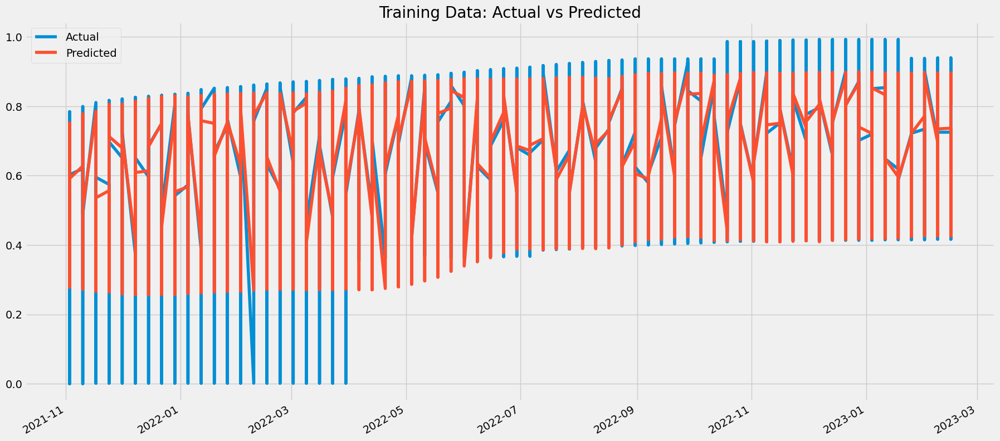

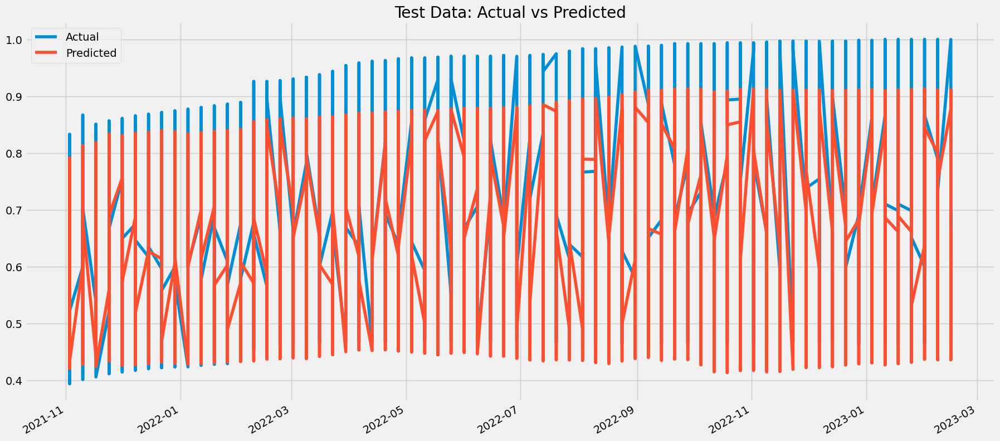

In [124]:
# Generate predictions
train_pred = model_final.predict(X_train).flatten()  # Flatten to ensure it's a 1D array
test_pred = model_final.predict(X_test).flatten()

# Create DataFrames for the actual and predicted values with proper indexing
train_indices = [x[0] for x in train_series]
train_gt = pd.DataFrame(y_train, columns=['y'], index=train_indices)
train_pred_df = pd.DataFrame(train_pred, columns=['yhat'], index=train_indices)

# Plot training predictions and actual values
pd.concat([train_gt, train_pred_df], axis=1).plot(figsize=(20,10))
plt.legend(['Actual', 'Predicted'])
plt.title('Training Data: Actual vs Predicted')

# Ensure the index is constructed correctly 
test_indices = [x[0] for x in test_series]
test_gt = pd.DataFrame(y_test, columns=['y'], index=test_indices)
test_pred_df = pd.DataFrame(test_pred, columns=['yhat'], index=test_indices)

# Plot test predictions and actual values
pd.concat([test_gt, test_pred_df], axis=1).plot(figsize=(20,10))
plt.legend(['Actual', 'Predicted'])
plt.title('Test Data: Actual vs Predicted')
plt.show()

In [125]:
# Initialize a list to store RMSEs for each fold
cv_rmses = []

# Cross-Validation Loop
for train_index, val_index in tscv.split(X_train):
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # Define and compile the LSTM model
    model = build_model(input_shape, output_units=1, neurons=best_config['neurons'], dropout=best_config['dropout'], l1_reg=best_config['l1_reg'], l2_reg=best_config['l2_reg'])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mae')

    # Fit the model on this fold
    model.fit(X_train_fold, y_train_fold, epochs=100, batch_size=best_config['batch_size'], validation_data=(X_val_fold, y_val_fold), shuffle=False, callbacks=[lr_schedule, early_stopping])

    # Make predictions on the validation fold and calculate RMSE
    val_pred = model.predict(X_val_fold).flatten()
    val_rmse = np.sqrt(mean_squared_error(y_val_fold, val_pred))
    cv_rmses.append(val_rmse)

# Calculate the average cross-validated RMSE
cv_rmse = np.mean(cv_rmses)
print(f"Cross-validated RMSE: {cv_rmse}")


Epoch 1/100


2023-11-27 18:44:23.070813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:23.071478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:23.071842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 1s 39ms/step - loss: 0.1281 - val_loss: 0.1464 - lr: 0.0010
Epoch 2/100
1/9 [==>...........................] - ETA: 0s - loss: 0.0874

2023-11-27 18:44:24.212677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:24.213311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:24.214004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 7ms/step - loss: 0.1217 - val_loss: 0.1608 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1197 - val_loss: 0.1322 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1108 - val_loss: 0.1200 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1019 - val_loss: 0.1214 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0941 - val_loss: 0.1247 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 0s 6ms/step - loss: 0.0967 - val_loss: 0.1204 - lr: 0.0010
Epoch 8/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0867 - val_loss: 0.1142 - lr: 0.0010
Epoch 9/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0762 - val_loss: 0.1100 - lr: 0.0010
Epoch 10/100
9/9 [==============================] - 0s 7ms/step - loss: 0.0684 - val_loss: 0.1031 - lr: 0.0010
Epoch 11/100
9/9 [===

2023-11-27 18:44:27.279078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:27.279623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:27.280015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 1ms/step


2023-11-27 18:44:27.905968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:27.906491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:27.906868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Epoch 1/100


2023-11-27 18:44:28.123133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:28.123648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:28.124249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 1s 19ms/step - loss: 0.1420 - val_loss: 0.0739 - lr: 0.0010
Epoch 2/100
 1/17 [>.............................] - ETA: 0s - loss: 0.0858

2023-11-27 18:44:29.004547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:29.005016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:29.005694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

17/17 [==============================] - 0s 5ms/step - loss: 0.1268 - val_loss: 0.0905 - lr: 0.0010
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1130 - val_loss: 0.0669 - lr: 0.0010
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1070 - val_loss: 0.0775 - lr: 0.0010
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 0.1041 - val_loss: 0.0668 - lr: 0.0010
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0991 - val_loss: 0.0696 - lr: 0.0010
Epoch 7/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0922 - val_loss: 0.0795 - lr: 0.0010
Epoch 8/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0896 - val_loss: 0.0699 - lr: 0.0010
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0881 - val_loss: 0.0723 - lr: 0.0010
Epoch 10/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0798 - val_loss: 0.0802 - lr: 0.0010
Epo

2023-11-27 18:44:33.010638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:33.011284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:33.011748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Epoch 1/100


2023-11-27 18:44:33.227546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:33.228086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:33.228466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 1s 15ms/step - loss: 0.1354 - val_loss: 0.1160 - lr: 0.0010
Epoch 2/100
 1/26 [>.............................] - ETA: 0s - loss: 0.0582

2023-11-27 18:44:34.396746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:34.397210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:34.397851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

26/26 [==============================] - 0s 5ms/step - loss: 0.1020 - val_loss: 0.0947 - lr: 0.0010
Epoch 3/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0974 - val_loss: 0.0828 - lr: 0.0010
Epoch 4/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0911 - val_loss: 0.0818 - lr: 0.0010
Epoch 5/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0874 - val_loss: 0.0789 - lr: 0.0010
Epoch 6/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0809 - val_loss: 0.0783 - lr: 0.0010
Epoch 7/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0773 - val_loss: 0.0719 - lr: 0.0010
Epoch 8/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0740 - val_loss: 0.0672 - lr: 0.0010
Epoch 9/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0684 - val_loss: 0.0600 - lr: 0.0010
Epoch 10/100
26/26 [==============================] - 0s 5ms/step - loss: 0.0676 - val_loss: 0.0651 - lr: 0.0010
Epo

2023-11-27 18:44:39.725666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:39.726128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:39.726778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Epoch 1/100


2023-11-27 18:44:39.940419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:39.941098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:39.941514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 1s 12ms/step - loss: 0.1252 - val_loss: 0.0998 - lr: 0.0010
Epoch 2/100
 1/34 [..............................] - ETA: 0s - loss: 0.0555

2023-11-27 18:44:41.147400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:41.147874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:41.148550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

34/34 [==============================] - 0s 5ms/step - loss: 0.0992 - val_loss: 0.1155 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0949 - val_loss: 0.0901 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0848 - val_loss: 0.0888 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0788 - val_loss: 0.0769 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0710 - val_loss: 0.0722 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0666 - val_loss: 0.0696 - lr: 0.0010
Epoch 8/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0647 - val_loss: 0.0697 - lr: 0.0010
Epoch 9/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0651 - val_loss: 0.0666 - lr: 0.0010
Epoch 10/100
34/34 [==============================] - 0s 5ms/step - loss: 0.0644 - val_loss: 0.0717 - lr: 0.0010
Epo

2023-11-27 18:44:53.695622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:53.696087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:53.696593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Epoch 1/100


2023-11-27 18:44:53.913029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:53.913630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:53.914031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 1s 11ms/step - loss: 0.1135 - val_loss: 0.0953 - lr: 0.0010
Epoch 2/100
 1/43 [..............................] - ETA: 0s - loss: 0.0554

2023-11-27 18:44:55.152454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:44:55.152864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:44:55.153309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

43/43 [==============================] - 0s 5ms/step - loss: 0.0950 - val_loss: 0.0857 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0871 - val_loss: 0.0840 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0816 - val_loss: 0.0804 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0739 - val_loss: 0.0761 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0663 - val_loss: 0.0735 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0664 - val_loss: 0.0720 - lr: 0.0010
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0610 - val_loss: 0.0665 - lr: 0.0010
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0595 - val_loss: 0.0667 - lr: 0.0010
Epoch 10/100
43/43 [==============================] - 0s 4ms/step - loss: 0.0577 - val_loss: 0.0653 - lr: 0.0010
Epo

2023-11-27 18:45:05.252021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-11-27 18:45:05.252466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-11-27 18:45:05.253101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

## IV. Results
### A. Model Performance Comparison
**ARIMA (Autoregressive Integrated Moving Average)**
- Train RMSE: 0.011998272241271278
- Test RMSE: 0.009937797182224015
- Average CV RMSE: 0.019361682068568847

**Auto_arima**
- Train RMSE: 0.014362240167989263
- Test RMSE: 0.030781744659889882
- Average CV RMSE: 0.030806369395818062

**Univariate Prophet**
- Train RMSE: 0.0020426166695390077
- Test RMSE: 0.026674654082599218
- Average CV RMSE: 0.0086679294975011

**Multivariate Prophet**
- Train RMSE: 0.01029038815089332
- Test RMSE: 0.10680624649090134
- Cross-validated RMSE: 0.011242406258430045

**XGBoost**
- Train RMSE: 0.0063968552187190315
- Test RMSE: 0.08596906481390161
- Cross-validated RMSE: 0.06388431417642502
  
**Keras LSTM (Long Short-Term Memory)**
- Train RMSE: 0.030340060238547382
- Test RMSE: 0.045407351521714524
- Cross-validated RMSE: 0.07087241651942167

Based on test RMSE, my manually tuned ARIMA model is the most successful. The worst performing model is Keras LSTM.

### B. Analysis of Results 
• Analysis of strengths and weaknesses of each model.
1. **ARIMA**
   - **Strengths**:
     - Suitable for univariate time series with a clear trend and can smooth out noise and make good short-term forecasts.
     - High log likelihood.
     - Low AIC and BIC.
     - Lowest test and cross-validation RMSE.
   - **Weaknesses**:
     - Requires manual selection/tuning of parameters which is challenging and computationally expensive.
     - In the context of my data, ARMA assumes a linear relationship in the data, and my dataset appears to have a more logistic growth model.
     - Coefficients for the AR and MA terms might not all be significantly different from zero which could be a concern for over-parameterization.
     - Did not capture seasonality that the `auto_arima` model did.
     - Complex model with a high order of moving average which could cause overfitting.
     - Heteroskedastic residuals.
     - Lower test RMSE than train RMSE.

2. **Auto_arima**
 
   - **Strengths**:
     - Automatically selects optimal model parameters (not computationally taxing).
     - Captured seasonality that the ARIMA did not.
     - High log likelihood and low AIC & BIC.
     - Significant AR terms (with low p-values).
     - Residuals which hover around 0.
   - **Weaknesses**:
     - In the context of my data, ARMA assumes a linear relationship in the data, and my dataset appears to have a more logistic growth
     - Struggles with long-term forecasting.
     - Heteroskedasticity.
     - Slight skew and high kurtosis.
     - Higher RMSE than manual ARIMA.

4. **Univariate Prophet**
   - **Strengths**:
     - Ability to account for seasonality and holidays effectively, and relatively easy to use.
     - Robust to overfitting for my model.
     - Returned a relatively low average cross-validated RMSE.
     - Stable cross validation performance (robust over time).
     - No systemic bias in residuals.
     - Good model fit indicators (high log likelihood, low AIC & BIC values, and low sigma2)
   - **Weaknesses**:
     - Good for datasets with strong seasonal effects and several seasons of historical data, which do not apply to my dataset.
     - RMSE was higher than in other models
     - Evidence of overfitting in train and test RMSE discrepancy
     - High coverage in cross-validation suggest that the prediction intervals are too wide
     - Evidence of heteroskedasticity.
     - Presence of outliers and slight skewness
     - Close alignment of cross-validated RMSE with train RMSE as opposed to test RMSE indicates that the model's performance may vary depending on test set characteristics.
    
5. **Multivariate Prophet**
   - **Strengths**:
     - Can incorporate additional regressors in my dataset.
     - Ability to account for seasonality and holidays effectively, and relatively easy to use.
     - Flexible trend modeling (better adaptation to complex data patterns)
     - Effective handling of seasonality (multiplicative seasonality)
     - Low cross-validated RMSE reinforces its robustness and reliability.
     - Increased regularization for holiday effects may have helped to manage overfitting.
   - **Weaknesses**:
     - Potential overfitting/complexity from additional regressors.
     - Feature selection of additional regressors is difficult and could introduce noise
     - Evidence of overfitting in significant discrepancy between train and test RMSE
     - Possibility of complex interactions due to multiple regressors.
     - Risk of misinterpretation of multiple variables especially with the presence of multicollinearity.

6. **XGBoost**
   - **Strengths**:
     - Can capture complex, non-linear relationships in data.
     - Robust to outliers.
     - Can handle `NaN` values and does not need data to be grouped by `Date`.
     - Provides insight into feature importance.
     - Flexibility allows it to adapt well to various data types and distributions.
     - Good performance on training data.
   - **Weaknesses**:
     - Not inherently a time series model.
     - Tuning is computationally expensive (I was unable to perform a `GridSearchCV`).
     - Evidence of overfitting.
     - Relatively high test RMSE

7. **Keras LSTM**
   - **Strengths**:
     - Can capture complex, non-linear relationships, and long-term dependencies in data.
     - Highly flexible.
     - Improved performance with preprocessing.
     - Effective capture of time-dependent patterns
     - Model can explain a significant proportion of variance in the training set (high training R-squared indicates good fit).
     - Adaptability to non-linear patterns.
   - **Weaknesses**:
     - Requires large amounts of data to train effectively, and my dataset was quite small.
     - Computationally intensive and requires a lot of manual effort to tune.
     - Overfitting indicated by RMSE discrepancy.
     - High cross-validated RMSE indicates low generalizability.
     - High sensitivity to hyperparameter settings.


I believe that there are many factors that contributed to my manually tuned ARIMA model being the best-performing one. In terms of the parameters, the `p`,`d`,`q` selection (0,1,6) reflects a well-tuned balance between both the AR and MA components of the model so that it could capture both short- and long-term trends. As for the `d` term, I believe that the use of first-order differencing likely aided in stabilizing the mean of the time series allowing it a suitable amount of stationarity for ARIMA models. Next, the sixth-order MA parameter suggests that the ARIMA model can capture complex error structures and longer lagged dependencies (*6.2 Moving Averages | Forecasting: Principles and Practice (2nd Ed)*, n.d.). Furthermore, the lack of seasonal components compared to `auto_arima` indicates that success may be due to the time series data not having strong seasonal patterns. It's important to note that my univariate Prophet model had the lowest cross validated RMSE. I believe this may be because it is less sensitive to certain data variations due to its robustness against outliers and missing data. It could be more stable across different folds of cross-validation, leading to a lower average RMSE.

Next, I believe that the simplicity of ARIMA as a model generally speaking may have leant to its success. This may have been bolstered by the lack of additional regressors. As I have mentioned, the test dataset is quite simple due to the cumulative nature of the response variable asymptotically reaching 100% vaccine completion. Furthermore, the high log likelihood and low AIC & BIC indicate that the ARIMA model is able to balance good fit and low complexity. There has been evidence of other academics using ARIMA models for cumulative COVID-19 data (ArunKumar et al., 2021). This structure might be well-suited to any autocorrelation issues in the data. 


## V. Discussion

I believe the lack of success of these models is purely due to the nature of the dataset at hand. Although it was initially approved, many issues with it affected its quality for time-series modeling. The actual train and test sets that I used ended up being extremely small due to the elimination of observations that occurred before the booster vaccines were created, grouping by `Date` for those models that needed it, and switching the data to weekly frequency to match the observation cadence from the later parts of the dataset. Additionally, the cumulative nature of the dataset made it inept for time series-modeling.

As for the actual models themselves, overfitting was one of the biggest issues I faced. I think that this may have been because of the severe change in data trends from the train to the test sets as the vaccination rate asymptotically approached 100%. Some of the models that included many parameters such as XGBoost, multivariate `Prophet`, and Keras LSTM could have fit too closely to the training data and therefore had trouble generalizing to unseen test data. Specifically, the LSTM model relies on large datasets and is powerful in capturing long-term dependencies as opposed to data that accumulates over time (Guide & Saxena, 2023). Another issue is that I did not have the time nor computational resources to perform extensive tuning for all six models. XGBoost, for example, relies on extensive grid search to ensure the best parameters are selected, and I did not have the time to run these. For LSTM, it is also difficult to determine the optimal number of layers and it can take a lot of trial and error to do so. Finally, based on the results of many of the models, heteroskedasticity, residual issues, and inability to capture complex interactions for many of the multivariate models may have led to poor performance.

I feel that this experience was valuable and that I gained knowledge on time-series modeling. I did not have any exposure to time-series modeling aside from the brief unit in Stat 303-2 before this class, and I now feel like I have a solid understanding of the modeling process. Furthermore, I had only used XGBoost and Keras LSTM before this class, so it was a great experience to bolster my skills on those and gain exposure to the other four models. Finally, I now feel more comfortable using GitHub and working on other branches as I had never done that in my previous data science projects.

I enjoyed the group aspect of the project as I felt it was easy to troubleshoot issues, divide duties based on our skills, and efficiently collaborate to produce our best work. I felt like my group worked well with one another and we did not have issues with leadership or responsibility splits. Regarding aspects of the project I was less keen about, I wish that the group element of the project continued until the project report. I feel like I would have still gained exposure to the other models in addition to having time to ensure I achieved the best models for my allocated two. Furthermore, I understand that much of this project was meant for us to research these new models; however, it would have been helpful to have received instruction on how to develop and tune some of the new ones aside from the notebook that Professor Shi published.

## VI. Conclusion

Ultimately, although I achieved some models with relatively low RMSEs, I would say that this project was marked by issues due to the nature of the data. The cumulative nature of the response variable presented unique challenges which affected the performance and suitability of many of the models. As a result, many of the models exhibited signs of overfitting and models that were more complex did not yield results that were better than simpler models. Feature engineering clearly had a significant impact on model performance, and models such as XGBoost revealed that age-specific vaccination rates and manufacturer-specific data proved crucial in some models. Finally, models that could incorporate seasonality such as ARIMA and Prophet tended to demonstrate more accurate forecasting capabilities.

As for specific model findings, the manually tuned ARIMA model emerged as the best performing in capturing the COVID dataframe's time series dynamics. Auto ARIMA was unable to outperform the manually tuned ARIMA, although the manually tuned ARIMA model had the unusual result of the test RMSE being lower than the train RMSE most likely due to the simplicity of the test set. Both of the Prophet models showed reasonable performance aside from overfitting issues with the univariate model performing better by effectively handling seasonality and trend changes. Despite its powerful and efficient algorithm, the XGBoost model suffered from overfitting, but revealed important insights on feature importances. Finally, the Keras LSTM model struggled with the cumulative and small nature of the dataset resulting in underperformance.

Overall, the cross-validated RMSEs provided a realistic insight on each model's performance compared to test and train RMSEs and helped to reveal overfitting issues. This project emphasized the importance of model selection for data science issues, and that exploratory data analysis and data preprocessing are imperative to success. Finally, a combination of manual tuning and automatic modeling processes led to modeling success.

Our team worked very effectively together during this project. In our collaborative activities, such as creating presentations and reports, we equally contributed and managed to divide the work efficiently. We recognized and utilized each other’s strengths, which was instrumental in our success. Meeting both in person and over Zoom was crucial, as it allowed us to work together on challenging aspects of the project, like debugging or understanding complex concepts.

From this experience, I've learned the importance of acknowledging and leveraging the unique strengths of team members. I now understand that a significant aspect of group work is strategically dividing responsibilities. It's impossible for one person to cover every aspect of a project efficiently. Having a clear plan and set deadlines is also essential for successful collaboration. In future projects, I plan to focus on identifying where I and my teammates excel to develop an effective strategy for collaborative work.

## VII. References
**References**

Abulkhair, A. (2023, June 13). *Data Imputation Demystified | Time Series Data | by Ahmed Abulkhair*. Medium. Retrieved October 25, 2023, from https://medium.com/@aaabulkhair/data-imputation-demystified-time-series-data-69bc9c798cb7

Aggarwal, S. (2023, November 16). *The Ultimate Guide to Building Your Own LSTM Models.* ProjectPro. Retrieved November 21, 2023, from https://www.projectpro.io/article/lstm-model/832

ArunKumar, K.E., Kalaga, D. V., Kumar, C. M. S., Chilkoor, G., Kawaji, M., & Brenza, T. M. (2021, February 8). Forecasting the dynamics of cumulative COVID-19 cases (confirmed, recovered and deaths) for top-16 countries using statistical machine learning models: Auto-Regressive Integrated Moving Average (ARIMA) and Seasonal Auto-Regressive Integrated Moving Average. *National Library of Medicine, 103*(107161).

Brownlee, J. (2021, March 19). *How to Use XGBoost for Time Series Forecasting - MachineLearningMastery.com.* Machine Learning Mastery. Retrieved November 20, 2023, from https://machinelearningmastery.com/xgboost-for-time-series-forecasting/

Brownlee, J. (2023, November 18). *How to Create an ARIMA Model for Time Series Forecasting in Python - MachineLearningMastery.com.* Machine Learning Mastery. Retrieved November 22, 2023, from https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/

Chollet, F. (n.d.). *LSTM layer.* Keras. https://keras.io/api/layers/recurrent_layers/lstm/

Chowdhury, K. (2021, May 24). *10 Hyperparameters to keep an eye on for your LSTM model — and other tips.* Medium. Retrieved November 21, 2023, from https://medium.com/geekculture/10-hyperparameters-to-keep-an-eye-on-for-your-lstm-model-and-other-tips-f0ff5b63fcd4

Dancho, M. (2017, July 23). *Tidy Time Series Analysis, Part 2: Rolling Functions.* Business Science. Retrieved November 20, 2023, from https://www.business-science.io/timeseries-analysis/2017/07/23/tidy-timeseries-analysis-pt-2.html
*4.1 Seasonal ARIMA models | STAT 510*. (n.d.). STAT ONLINE. Retrieved November 22, 2023, from https://online.stat.psu.edu/stat510/lesson/4/4.1

Guide, S., & Saxena, S. (2023, October 25). *What is LSTM? Introduction to Long Short-Term Memory.* Analytics Vidhya. Retrieved November 26, 2023, from https://www.analyticsvidhya.com/blog/2021/03/introduction-to-long-short-term-memory-lstm/

Hahn, S. (n.d.). *COVID-19 Vaccines.* FDA. Retrieved October 25, 2023, from https://www.fda.gov/emergency-preparedness-and-response/coronavirus-disease-2019-covid-19/covid-19-vaccines

Hedengren, J. D. (2022). *LSTM Networks | Dynamic Optimization.* APMonitor. Retrieved November 21, 2023, from https://apmonitor.com/do/index.php/Main/LSTMNetwork

Howson, I. (2023, September 2).* prophet_params: Tuning Parameters for Prophet Models in modeltime: The Tidymodels Extension for Time Series Modeling.* rdrr.io. Retrieved November 24, 2023, from https://rdrr.io/cran/modeltime/man/prophet_params.html
Hyndman, R. J., & Athanasopoulos, G. (n.d.). *8.1 Stationarity and differencing | Forecasting: Principles and Practice (2nd ed).* OTexts. Retrieved November 23, 2023, from https://otexts.com/fpp2/stationarity.html

Jain, S. (2023, February 6). *XGBoost*. GeeksforGeeks. Retrieved November 20, 2023, from https://www.geeksforgeeks.org/xgboost/#

Kates, J., Tolbert, J., & Rouw, A. (2021, December 8). *An Update on Vaccine Roll-Out for 5-11 Year-olds in the U.S.* KFF. Retrieved October 25, 2023, from https://www.kff.org/coronavirus-covid-19/issue-brief/an-update-on-vaccine-roll-out-for-5-11-year-olds-in-the-u-s/

Marks, P. (2022, June 30). *Coronavirus (COVID-19) Update: FDA Recommends Inclusion of Omicron BA.4/5 Component for COVID-19 Vaccine Booster Doses*. FDA. Retrieved November 19, 2023, from https://www.fda.gov/news-events/press-announcements/coronavirus-covid-19-update-fda-recommends-inclusion-omicron-ba45-component-covid-19-vaccine-booster

Montel, M. (2017). *holidays · PyPI*. PyPI. Retrieved October 25, 2023, from https://pypi.org/project/holidays/

Munichiello, K. Á. (2023, September 29). *Autoregressive Integrated Moving Average (ARIMA) Prediction Model*. Investopedia. Retrieved November 22, 2023, from https://www.investopedia.com/terms/a/autoregressive-integrated-moving-average-arima.asp

National Institute of Standards and Technology (NIST). (n.d.). *6.4.4.2. Stationarity*. Information Technology Laboratory. Retrieved November 23, 2023, from https://www.itl.nist.gov/div898/handbook/pmc/section4/pmc442.htm

Pedregosa, F., Varoquaux, G., Gramfort, A., Michel, V., Thirion, B., Grisel, O., Blondel, M., Prettenhofer, P., Weiss, R., Dubourg, V., 

Vanderplas, J., Passos, A., Cournapeau, D., Brucher, M., Perrot, M., & Duchesnay, E. (2011). Scikit-learn: Machine Learning in Python. *Journal of Machine Learning Research*, 12, 2825--2830. https://scikit-learn.org/stable/about.html#citing-scikit-learn
Pramoditha, R. (2022, July 30). *One-hot Encode Scalar-value Labels for Deep Learning Models*. Medium. Retrieved November 21, 2023, from https://medium.com/data-science-365/one-hot-encode-scalar-value-labels-for-deep-learning-models-4d4053f185c5

*Prophet | Forecasting at scale*. (n.d.). Meta Open Source. Retrieved November 24, 2023, from https://facebook.github.io/prophet/

*Saturating Forecasts | Prophet*. (n.d.). Meta Open Source. Retrieved November 25, 2023, from https://facebook.github.io/prophet/docs/saturating_forecasts.html#saturating-minimum

Schmudde, D. (2019, July 26).* Facebook Prophet: Diagnostics.* Nextjournal. Retrieved November 25, 2023, from https://nextjournal.com/fb-prophet/facebook-prophet-diagnostics

*6.2 Moving averages | Forecasting: Principles and Practice (2nd ed)*. (n.d.). OTexts. Retrieved November 26, 2023, from https://otexts.com/fpp2/moving-averages.html

Smith, T. (2017). *pmdarima.arima.auto_arima — pmdarima 2.0.4 documentation*. alkaline-ml. Retrieved November 23, 2023, from https://alkaline-ml.com/pmdarima/modules/generated/pmdarima.arima.auto_arima.html

xgboost developers. (2022). *Python API Reference — xgboost 2.0.2 documentation*. XGBoost Documentation. Retrieved November 21, 2023, from https://xgboost.readthedocs.io/en/stable/python/python_api.html

## VIII. Appendices

### ARIMA
<a id="ARIMA-Init-Model"></a>
#### Initial Benchmarking Models

In [126]:
# Initialize the ARIMA model
model_ar1 = ARIMA(train_ar, order=(1, 0, 0))

# Fit the ARIMA model
fitted_model_ar1 = model_ar1.fit()

# Print out the summary of the fit model
print(fitted_model_ar1.summary())

                                  SARIMAX Results                                   
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(1, 0, 0)   Log Likelihood                 117.310
Date:                      Mon, 27 Nov 2023   AIC                           -228.619
Time:                              18:45:05   BIC                           -222.543
Sample:                          11-03-2021   HQIC                          -226.264
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4965      0.532      0.933      0.351      -0.546       1.539
ar.L1          0.9982      0.023     42.912      0.000       0.953       1.044
sigm

/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


In [127]:
# Initialize the ARIMA model
model_ar1 = ARIMA(train_ar, order=(0, 0, 1))

# Fit the ARIMA model
fitted_model_ar1 = model_ar1.fit()

# Print out the summary of the fit model
print(fitted_model_ar1.summary())

/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


                                  SARIMAX Results                                   
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(0, 0, 1)   Log Likelihood                  33.693
Date:                      Mon, 27 Nov 2023   AIC                            -61.386
Time:                              18:45:05   BIC                            -55.310
Sample:                          11-03-2021   HQIC                           -59.030
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.7504      0.067     11.123      0.000       0.618       0.883
ma.L1          0.9998     58.844      0.017      0.986    -114.333     116.333
sigm

/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


In [128]:
# Initialize the ARIMA model
model_ar1 = ARIMA(train_ar, order=(2, 0, 2))

# Fit the ARIMA model
fitted_model_ar1 = model_ar1.fit()

# Print out the summary of the fit model
print(fitted_model_ar1.summary())

                                  SARIMAX Results                                   
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(2, 0, 2)   Log Likelihood                 147.204
Date:                      Mon, 27 Nov 2023   AIC                           -282.409
Time:                              18:45:05   BIC                           -270.257
Sample:                          11-03-2021   HQIC                          -277.697
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4692      0.451      1.042      0.298      -0.414       1.352
ar.L1          0.2810      0.157      1.793      0.073      -0.026       0.588
ar.L

/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


<a id="ARIMA-tune-prelim"></a>
#### Tuning procedure with rolling forecast

In [129]:
# Rolling forecast origin evaluation function
def rolling_forecast_origin(train_data, test_data, arima_order):
    history = [x for x in train_data]
    predictions = []
    for t in range(len(test_data)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test_data[t])
    error = mean_squared_error(test_data, predictions)
    return np.sqrt(error)

# Define the p, d, and q parameter ranges
p = d = range(0, 3)
q = range(0, 7)

# Generate all different combinations of p, d, and q triplets
pdq = list(itertools.product(p, d, q))

# Record AIC scores and RMSE
aic_scores = []
rmse_scores = []

best_aic_model = None
lowest_aic = float('inf')
best_rmse_model = None
lowest_rmse = float('inf')

# Run a grid search over different p,d,q combinations
for param in pdq:
    try:
        mod = ARIMA(train_ar, order=param)
        results = mod.fit()
        aic = results.aic
        aic_scores.append((param, aic))
        print('ARIMA{} - AIC:{}'.format(param, aic))

        if aic < lowest_aic:
            best_aic_model = (param, results)
            lowest_aic = aic

        # Use the rolling forecast origin approach for RMSE calculation
        test_rmse = rolling_forecast_origin(train_ar.values, test_ar.values, param)
        rmse_scores.append((param, test_rmse))
        print(f'ARIMA{param} - Test RMSE: {test_rmse}')

        if test_rmse < lowest_rmse:
            best_rmse_model = (param, results)
            lowest_rmse = test_rmse

    except Exception as e:
        print(f'Error fitting ARIMA{param}: {e}')
        continue

# Find the parameters with minimal AIC value
print(f"ARIMA{best_aic_model[0]} with lowest AIC of {lowest_aic}")

# Find the parameters with minimal test RMSE value
print(f"ARIMA{best_rmse_model[0]} with lowest test RMSE of {lowest_rmse}")

# Use the best AIC parameters to fit the model
best_aic_fitted_model = best_aic_model[1]
print(best_aic_fitted_model.summary())

# Use the best RMSE parameters to fit the model
best_rmse_fitted_model = best_rmse_model[1]
best_rmse_summary = best_rmse_fitted_model.summary()

# Print the train and test RMSE for the best RMSE model
best_rmse_param, best_rmse_results = best_rmse_model
train_pred_rmse = best_rmse_results.predict(start=train_ar.index[0], end=train_ar.index[-1], dynamic=False)
train_rmse_best = np.sqrt(mean_squared_error(train_ar, train_pred_rmse))
test_rmse_best = lowest_rmse
print(f"Best ARIMA{best_rmse_param} - Train RMSE: {train_rmse_best}")
print(f"Best ARIMA{best_rmse_param} - Test RMSE: {test_rmse_best}")


ARIMA(0, 0, 0) - AIC:4.247377915841888


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 0) - Test RMSE: 0.19689682599508618
ARIMA(0, 0, 1) - AIC:-61.386166557230766


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 1) - Test RMSE: 0.1019191370564995
ARIMA(0, 0, 2) - AIC:-120.75241682724243


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 2) - Test RMSE: 0.057198496179134306
ARIMA(0, 0, 3) - AIC:-167.77581727403606


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 3) - Test RMSE: 0.03252307691385174
ARIMA(0, 0, 4) - AIC:-208.98721984355345


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 4) - Test RMSE: 0.024613571459282953
ARIMA(0, 0, 5) - AIC:-238.79317806887153


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 5) - Test RMSE: 0.014536313016410257
ARIMA(0, 0, 6) - AIC:-260.72140641203134


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 6) - Test RMSE: 0.012105676352473728
ARIMA(0, 1, 0) - AIC:-233.93423132271894
ARIMA(0, 1, 0) - Test RMSE: 0.001638176583743459
ARIMA(0, 1, 1) - AIC:-281.8755026362179


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 1, 1) - Test RMSE: 0.0010609016327302642
ARIMA(0, 1, 2) - AIC:-317.04502425321454


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 2) - Test RMSE: 0.0009347626816272875
ARIMA(0, 1, 3) - AIC:-334.6221693724792


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 3) - Test RMSE: 0.0014870537589369954
ARIMA(0, 1, 4) - AIC:-341.17129968294756


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 4) - Test RMSE: 0.0010917579260762474
ARIMA(0, 1, 5) - AIC:-344.26377726332


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 5) - Test RMSE: 0.0009591114496682588
ARIMA(0, 1, 6) - AIC:-354.75089008501647


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 6) - Test RMSE: 0.0013058042895714801
ARIMA(0, 2, 0) - AIC:-381.44345120781577


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 0) - Test RMSE: 0.0007879147333206601
ARIMA(0, 2, 1) - AIC:-382.8312301530113
ARIMA(0, 2, 1) - Test RMSE: 0.0007342490373780269
ARIMA(0, 2, 2) - AIC:-380.8791307958302


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 2, 2) - Test RMSE: 0.0007314521796732864
ARIMA(0, 2, 3) - AIC:-378.92034573917493


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 3) - Test RMSE: 0.0007325634592131251
ARIMA(0, 2, 4) - AIC:-385.57523592106753


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 4) - Test RMSE: 0.001159241575397781
ARIMA(0, 2, 5) - AIC:-382.91815096136696


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 5) - Test RMSE: 0.0010718138463683647
ARIMA(0, 2, 6) - AIC:-383.45095430858504


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 6) - Test RMSE: 0.0009897008141751056
ARIMA(1, 0, 0) - AIC:-228.61918020716223


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 0) - Test RMSE: 0.0022737166421355733
ARIMA(1, 0, 1) - AIC:-269.24796001003426


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 1) - Test RMSE: 0.005404585931399144
ARIMA(1, 0, 2) - AIC:-307.1027082494086


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 2) - Test RMSE: 0.004365683947512756
ARIMA(1, 0, 3) - AIC:-329.1694480883456


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 3) - Test RMSE: 0.0020964879671221295
ARIMA(1, 0, 4) - AIC:-335.013299468729


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 4) - Test RMSE: 0.0023322136470668876
ARIMA(1, 0, 5) - AIC:-337.7136153956957


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 5) - Test RMSE: 0.0020479490548349077
ARIMA(1, 0, 6) - AIC:-332.4450350634247


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 6) - Test RMSE: 0.0034189651106060295
ARIMA(1, 1, 0) - AIC:-382.877948427655


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 0) - Test RMSE: 0.0007732110928795112
ARIMA(1, 1, 1) - AIC:-384.23718277178415


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 1) - Test RMSE: 0.0007252399068664201
ARIMA(1, 1, 2) - AIC:-382.3689356103163


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 2) - Test RMSE: 0.0007249542934853802
ARIMA(1, 1, 3) - AIC:-374.2438675173964


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 3) - Test RMSE: 0.000782814395861608
ARIMA(1, 1, 4) - AIC:-387.97730073335714


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 4) - Test RMSE: 0.0017134809487848687
ARIMA(1, 1, 5) - AIC:-388.7020424979628


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 5) - Test RMSE: 0.0011155590927342265
ARIMA(1, 1, 6) - AIC:-388.4099480064063


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 6) - Test RMSE: 0.00123734818874504
ARIMA(1, 2, 0) - AIC:-382.8776751931645


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 0) - Test RMSE: 0.0007381664319877718
ARIMA(1, 2, 1) - AIC:-380.87007247939215


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 1) - Test RMSE: 0.0007364183066952584
ARIMA(1, 2, 2) - AIC:-375.7907461572404


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 2) - Test RMSE: 0.0011117819342048353
ARIMA(1, 2, 3) - AIC:-377.41886357440137


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 3) - Test RMSE: 0.0007288358572307232
ARIMA(1, 2, 4) - AIC:-383.63415198973996


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 4) - Test RMSE: 0.0010112311290048517
ARIMA(1, 2, 5) - AIC:-385.0860947023966


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 5) - Test RMSE: 0.001005185695742508
ARIMA(1, 2, 6) - AIC:-382.50216905749863


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 6) - Test RMSE: 0.0010431592839520952
ARIMA(2, 0, 0) - AIC:-373.16946963052357


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 0) - Test RMSE: 0.0021560403099509877
ARIMA(2, 0, 1) - AIC:-376.1986841777029


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 1) - Test RMSE: 0.0023064402318947615
ARIMA(2, 0, 2) - AIC:-282.4086129935133


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 2) - Test RMSE: 0.0027854421827834
ARIMA(2, 0, 3) - AIC:-311.3186709873355


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 3) - Test RMSE: 0.0017284632612331557
ARIMA(2, 0, 4) - AIC:-328.1302481051966


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 4) - Test RMSE: 0.001821546705616348
ARIMA(2, 0, 5) - AIC:-331.6524564508811


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 5) - Test RMSE: 0.0016393788620216896
ARIMA(2, 0, 6) - AIC:-292.10284992382935


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 6) - Test RMSE: 0.008405113630402087
ARIMA(2, 1, 0) - AIC:-384.368303927542


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 0) - Test RMSE: 0.0007367568552582056
ARIMA(2, 1, 1) - AIC:-382.1998843707397


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 1) - Test RMSE: 0.0007578723701840571
ARIMA(2, 1, 2) - AIC:-380.8129483990026


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 2) - Test RMSE: 0.0007433679604867638
ARIMA(2, 1, 3) - AIC:-378.72694645280524


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 3) - Test RMSE: 0.0007581204748123403
ARIMA(2, 1, 4) - AIC:-377.06711037555243


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 4) - Test RMSE: 0.0007194634650386461
ARIMA(2, 1, 5) - AIC:-384.2577072621762


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 5) - Test RMSE: 0.001167145444086536
ARIMA(2, 1, 6) - AIC:-386.6125135638169


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 6) - Test RMSE: 0.001159203264746481
ARIMA(2, 2, 0) - AIC:-380.8901883396523


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 0) - Test RMSE: 0.0007360772804361125
ARIMA(2, 2, 1) - AIC:-378.89418192149424


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 1) - Test RMSE: 0.000735186059287429
ARIMA(2, 2, 2) - AIC:-376.90090791610766


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 2) - Test RMSE: 0.000731458173655972
ARIMA(2, 2, 3) - AIC:-378.4137824836483


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 3) - Test RMSE: 0.0007085978823558145
ARIMA(2, 2, 4) - AIC:-381.2931815248008


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 4) - Test RMSE: 0.0007603620097464024
ARIMA(2, 2, 5) - AIC:-383.15434495370494


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 5) - Test RMSE: 0.0009086549859147037
ARIMA(2, 2, 6) - AIC:-382.9672222960308


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 6) - Test RMSE: 0.001136232470792607
ARIMA(1, 1, 5) with lowest AIC of -388.7020424979628
ARIMA(2, 2, 3) with lowest test RMSE of 0.0007085978823558145
                                  SARIMAX Results                                   
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(1, 1, 5)   Log Likelihood                 201.351
Date:                      Mon, 27 Nov 2023   AIC                           -388.702
Time:                              18:46:11   BIC                           -374.651
Sample:                          11-03-2021   HQIC                          -383.268
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------

In [130]:
# Define the ARIMA order
arima_order113 = (1, 1, 3)

# Fit the ARIMA model
model113 = ARIMA(train_ar, order=arima_order113)
fitted_model113 = model113.fit()

# Predict on the training set
train_pred_ar113 = fitted_model113.predict(start=train_ar.index[0], end=train_ar.index[-1], typ='levels')

# Predict on the test set
test_pred_ar113 = fitted_model113.predict(start=test_ar.index[0], end=test_ar.index[-1], typ='levels')

# Calculate RMSE for train and test sets
train_rmse_ar113 = np.sqrt(mean_squared_error(train_ar, train_pred_ar113))
test_rmse_ar113 = np.sqrt(mean_squared_error(test_ar, test_pred_ar113))

# Print RMSE values
print(f"Train RMSE: {train_rmse_ar113}")
print(f"Test RMSE: {test_rmse_ar113}")

# Model summary
fitted_model113.summary()

Train RMSE: 0.011380421280512386
Test RMSE: 0.013461639971627658


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                  SARIMAX Results                                   
====================================================================================
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(1, 1, 3)   Log Likelihood                 192.122
Date:                      Mon, 27 Nov 2023   AIC                           -374.244
Time:                              18:46:12   BIC                           -364.207
Sample:                          11-03-2021   HQIC                          -370.363
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9352      0.031     30.139      0.000       0.874       0.996
ma.L1          0.0111      0.112      0.099      0.921      -0.209       0.231
ma.L2          0.1620      0.180      0.900      0.368      -0.191       0.515
ma.L3         -0.0638      0.143     -0.446      0.656      -0.344       0.217
sigma2      5.206e-05   8.51e-06      6.116      0.000    3.54e-05    6.87e-05
===================================================================================
Ljung-Box (L1) (Q):                   2.61   Jarque-Bera (JB):                53.62
Prob(Q):                              0.11   Prob(JB):                         0.00
Heteroskedasticity (H):               0.01   Skew:                             1.07
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.33
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

My results here are still worse compared to the other model types I have looked at. I wanted to experiment with scaled data too as it had helped in my model development in other models. So, I underwent the same process with scaled data.

In [131]:
# Import data with specific columns
df_ars = pd.read_csv('df_post_eda.csv', usecols=['Date', pred_var])

# Convert 'Date' to datetime
df_ars['Date'] = pd.to_datetime(df_ars['Date'])

# Group by 'Date' to ensure there is one unique value per date
df_ars = df_ars.groupby('Date').mean()

# Sorting the DataFrame by the index
df_ars.sort_index(inplace=True)

# Initialize the MinMaxScaler to scale data between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))

# Scale the predictive variable column
df_ars[pred_var] = scaler.fit_transform(df_ars[[pred_var]])

# Calculate the index for the 70-30 split
split_index = int(len(df_ars) * 0.7)

# Split into train and test
train_ars = df_ars.iloc[:split_index][pred_var]
test_ars = df_ars.iloc[split_index:][pred_var]

# Rolling forecast origin evaluation function
def rolling_forecast_origin(train_data, test_data, arima_order, scaler):
    history = [x for x in train_data]
    predictions = []
    for t in range(len(test_data)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test_data[t])
    # Scale predictions back to original scale
    predictions_scaled = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
    test_data_scaled = scaler.inverse_transform(test_data.reshape(-1, 1)).flatten()
    error = mean_squared_error(test_data_scaled, predictions_scaled)
    return np.sqrt(error)

# Define the p, d, and q parameter ranges
p = d = range(0, 3)
q = range(0, 7)

# Generate all different combinations of p, d, and q triplets
pdq = list(itertools.product(p, d, q))

# Record AIC scores and RMSE
aic_scores = []
rmse_scores = []

best_aic_model = None
lowest_aic = float('inf')
best_rmse_model = None
lowest_rmse = float('inf')

# Run a grid search over different p,d,q combinations
for param in pdq:
    try:
        mod = ARIMA(train_ars, order=param)
        results = mod.fit()
        aic = results.aic
        aic_scores.append((param, aic))
        print('ARIMA{} - AIC:{}'.format(param, aic))

        if aic < lowest_aic:
            best_aic_model = (param, results)
            lowest_aic = aic

        # Use the rolling forecast origin approach for RMSE calculation
        test_rmse = rolling_forecast_origin(train_ars.values, test_ars.values, param, scaler)
        rmse_scores.append((param, test_rmse))
        print(f'ARIMA{param} - Test RMSE: {test_rmse}')

        if test_rmse < lowest_rmse:
            best_rmse_model = (param, results)
            lowest_rmse = test_rmse

    except Exception as e:
        print(f'Error fitting ARIMA{param}: {e}')
        continue

# Find the parameters with minimal AIC value
print(f"ARIMA{best_aic_model[0]} with lowest AIC of {lowest_aic}")

# Find the parameters with minimal test RMSE value
print(f"ARIMA{best_rmse_model[0]} with lowest test RMSE of {lowest_rmse}")

# Use the best AIC parameters to fit the model
best_aic_fitted_model = best_aic_model[1]
print(best_aic_fitted_model.summary())

# Use the best RMSE parameters to fit the model
best_rmse_fitted_model = best_rmse_model[1]
best_rmse_summary = best_rmse_fitted_model.summary()

# Print the train and test RMSE for the best RMSE model
best_rmse_param, best_rmse_results = best_rmse_model
train_pred_rmse = best_rmse_results.predict(start=train_ars.index[0], end=train_ars.index[-1], dynamic=False)
train_rmse_best = np.sqrt(mean_squared_error(train_ars, train_pred_rmse))
test_rmse_best = lowest_rmse
print(f"Best ARIMA{best_rmse_param} - Train RMSE: {train_rmse_best}")
print(f"Best ARIMA{best_rmse_param} - Test RMSE: {test_rmse_best}")


ARIMA(0, 0, 0) - AIC:4.247377915841888


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 0, 0) - Test RMSE: 8.022315054137293
ARIMA(0, 0, 1) - AIC:-61.386166557230766
ARIMA(0, 0, 1) - Test RMSE: 4.152567840445752
ARIMA(0, 0, 2) - AIC:-120.75241682724243


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 2) - Test RMSE: 2.330481228698602
ARIMA(0, 0, 3) - AIC:-167.77581727403606


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 3) - Test RMSE: 1.3251121150087455
ARIMA(0, 0, 4) - AIC:-208.98721984355345


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 4) - Test RMSE: 1.0028492021441597
ARIMA(0, 0, 5) - AIC:-238.79317806887153


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 5) - Test RMSE: 0.5922639034623632
ARIMA(0, 0, 6) - AIC:-260.72140641203134


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 0, 6) - Test RMSE: 0.49323065088610085
ARIMA(0, 1, 0) - AIC:-233.93423132271894
ARIMA(0, 1, 0) - Test RMSE: 0.06674545718389763
ARIMA(0, 1, 1) - AIC:-281.8755026362179


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 1, 1) - Test RMSE: 0.04322511089855245
ARIMA(0, 1, 2) - AIC:-317.04502425321454


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 2) - Test RMSE: 0.03808573700955253
ARIMA(0, 1, 3) - AIC:-334.6221693724792


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 3) - Test RMSE: 0.06058814659068853
ARIMA(0, 1, 4) - AIC:-341.17129968294756


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 4) - Test RMSE: 0.04448231200056827
ARIMA(0, 1, 5) - AIC:-344.26377726332


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 5) - Test RMSE: 0.03907779712741948
ARIMA(0, 1, 6) - AIC:-354.75089008501647


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 1, 6) - Test RMSE: 0.05320336352322743
ARIMA(0, 2, 0) - AIC:-381.44345120781577


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 0) - Test RMSE: 0.03210260091573463
ARIMA(0, 2, 1) - AIC:-382.8312301530113
ARIMA(0, 2, 1) - Test RMSE: 0.029916059216671963
ARIMA(0, 2, 2) - AIC:-380.8791307958302


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

ARIMA(0, 2, 2) - Test RMSE: 0.029802104745564086
ARIMA(0, 2, 3) - AIC:-378.92034573917493


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 3) - Test RMSE: 0.02984738244131613
ARIMA(0, 2, 4) - AIC:-385.57523592106753


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 4) - Test RMSE: 0.047231848937613924
ARIMA(0, 2, 5) - AIC:-382.91815096136696


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 5) - Test RMSE: 0.043669715402971335
ARIMA(0, 2, 6) - AIC:-383.45095430858504


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(0, 2, 6) - Test RMSE: 0.04032412254754755
ARIMA(1, 0, 0) - AIC:-228.61918020716223


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 0) - Test RMSE: 0.09263974243801132
ARIMA(1, 0, 1) - AIC:-269.24796001003426


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 1) - Test RMSE: 0.22020309804244445
ARIMA(1, 0, 2) - AIC:-307.1027082494086


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 2) - Test RMSE: 0.17787433533647254
ARIMA(1, 0, 3) - AIC:-329.1694480883456


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 3) - Test RMSE: 0.08541878161043201
ARIMA(1, 0, 4) - AIC:-335.013299468729


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 4) - Test RMSE: 0.09502312978268243
ARIMA(1, 0, 5) - AIC:-337.7136153956957


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 5) - Test RMSE: 0.0834411243029291
ARIMA(1, 0, 6) - AIC:-332.4450350634247


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 0, 6) - Test RMSE: 0.1393014597252537
ARIMA(1, 1, 0) - AIC:-382.877948427655


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 0) - Test RMSE: 0.03150351946550972
ARIMA(1, 1, 1) - AIC:-384.23718277178415


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 1) - Test RMSE: 0.029548993455389843
ARIMA(1, 1, 2) - AIC:-382.3689356103163


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 2) - Test RMSE: 0.029537356495194723
ARIMA(1, 1, 3) - AIC:-374.2438675173964


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 3) - Test RMSE: 0.0318947940413857
ARIMA(1, 1, 4) - AIC:-387.97730073335714


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 4) - Test RMSE: 0.069813639407052
ARIMA(1, 1, 5) - AIC:-388.7020424979628


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 5) - Test RMSE: 0.04545206078459003
ARIMA(1, 1, 6) - AIC:-388.4099480064063


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 1, 6) - Test RMSE: 0.05041420526518064
ARIMA(1, 2, 0) - AIC:-382.8776751931645


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 0) - Test RMSE: 0.030075668563302196
ARIMA(1, 2, 1) - AIC:-380.87007247939215


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 1) - Test RMSE: 0.030004443383415666
ARIMA(1, 2, 2) - AIC:-375.7907461572404


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 2) - Test RMSE: 0.04529816518175966
ARIMA(1, 2, 3) - AIC:-377.41886357440137


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 3) - Test RMSE: 0.029695505958044835
ARIMA(1, 2, 4) - AIC:-383.63415198973996


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 4) - Test RMSE: 0.04120134831239242
ARIMA(1, 2, 5) - AIC:-385.0860947023966


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 5) - Test RMSE: 0.04095503469090788
ARIMA(1, 2, 6) - AIC:-382.50216905749863


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(1, 2, 6) - Test RMSE: 0.04250222107552389
ARIMA(2, 0, 0) - AIC:-373.16946963052357


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 0) - Test RMSE: 0.08784516737856549
ARIMA(2, 0, 1) - AIC:-376.1986841777029


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 1) - Test RMSE: 0.09397302419826165
ARIMA(2, 0, 2) - AIC:-282.4086129935133


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 2) - Test RMSE: 0.11348935993478085
ARIMA(2, 0, 3) - AIC:-311.3186709873355


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 3) - Test RMSE: 0.07042407499986683
ARIMA(2, 0, 4) - AIC:-328.1302481051966


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 4) - Test RMSE: 0.07421664358695579
ARIMA(2, 0, 5) - AIC:-331.6524564508811


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 5) - Test RMSE: 0.06679444250949447
ARIMA(2, 0, 6) - AIC:-292.10284992382935


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 0, 6) - Test RMSE: 0.34245584847869404
ARIMA(2, 1, 0) - AIC:-384.368303927542


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 0) - Test RMSE: 0.0300182371214265
ARIMA(2, 1, 1) - AIC:-382.1998843707397


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 1) - Test RMSE: 0.030878562382686502
ARIMA(2, 1, 2) - AIC:-380.8129483990026


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 2) - Test RMSE: 0.03028759834008332
ARIMA(2, 1, 3) - AIC:-378.72694645280524


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 3) - Test RMSE: 0.030888671095635985
ARIMA(2, 1, 4) - AIC:-377.06711037555243


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 4) - Test RMSE: 0.02931363955366861
ARIMA(2, 1, 5) - AIC:-384.2577072621762


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 5) - Test RMSE: 0.047553882187501874
ARIMA(2, 1, 6) - AIC:-386.6125135638169


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 1, 6) - Test RMSE: 0.04723028801801355
ARIMA(2, 2, 0) - AIC:-380.8901883396523


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 0) - Test RMSE: 0.0299905486947701
ARIMA(2, 2, 1) - AIC:-378.89418192149424


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 1) - Test RMSE: 0.02995423700309308
ARIMA(2, 2, 2) - AIC:-376.90090791610766


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 2) - Test RMSE: 0.029802348962896113
ARIMA(2, 2, 3) - AIC:-378.4137824836483


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 3) - Test RMSE: 0.028870934969235946
ARIMA(2, 2, 4) - AIC:-381.2931815248008


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 4) - Test RMSE: 0.030979999634604606
ARIMA(2, 2, 5) - AIC:-383.15434495370494


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 5) - Test RMSE: 0.03702201158236212
ARIMA(2, 2, 6) - AIC:-382.9672222960308


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


ARIMA(2, 2, 6) - Test RMSE: 0.0462943717318562
ARIMA(1, 1, 5) with lowest AIC of -388.7020424979628
ARIMA(2, 2, 3) with lowest test RMSE of 0.028870934969235946
                                  SARIMAX Results                                   
Dep. Variable:     Additional_Doses_Vax_Pct   No. Observations:                   56
Model:                       ARIMA(1, 1, 5)   Log Likelihood                 201.351
Date:                      Mon, 27 Nov 2023   AIC                           -388.702
Time:                              18:47:18   BIC                           -374.651
Sample:                          11-03-2021   HQIC                          -383.268
                               - 11-23-2022                                         
Covariance Type:                        opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
a

In [132]:
# Fit the ARIMA model223 with (2, 2, 3) parameters on the training data
model223 = ARIMA(train_ars, order=(2, 2, 3))
fitted_model223 = model223.fit()

# Predict on the train set
train_pred_scaled = fitted_model223.predict(start=train_ars.index[0], end=train_ars.index[-1], dynamic=False)

# Inverse transform the train predictions and actual values
train_pred = scaler.inverse_transform(train_pred_scaled.values.reshape(-1, 1)).flatten()
train_actual = scaler.inverse_transform(train_ars.values.reshape(-1, 1)).flatten()

# Predict on the test set
test_pred_scaled = fitted_model223.predict(start=test_ars.index[0], end=test_ars.index[-1], dynamic=False)

# Inverse transform the test predictions and actual values
test_pred = scaler.inverse_transform(test_pred_scaled.values.reshape(-1, 1)).flatten()
test_actual = scaler.inverse_transform(test_ars.values.reshape(-1, 1)).flatten()

# Calculate the RMSE for both train and test sets
train_rmse = np.sqrt(mean_squared_error(train_actual, train_pred))
test_rmse = np.sqrt(mean_squared_error(test_actual, test_pred))

# Print the RMSE values
print(f'Train RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')


Train RMSE: 0.46300258981266973
Test RMSE: 1.4118959165705978


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


### `auto_arima`
<a id="AA-2"></a>
#### Other models

In [133]:
# Possible m values
seasonal_periods = [13, 12, 24]  

# Store results
results = []

for m in seasonal_periods:
    # Fit auto_arima model
    model = auto_arima(train_aar, start_p=0, start_q=0,
                   max_p=7, max_q=7, m=m,
                   start_P=0, seasonal=True,
                   d=None, D=None, trace=True,
                   error_action='warn',  
                   suppress_warnings=False, 
                   stepwise=True)

    # Make predictions
    train_predictions = model.predict_in_sample()
    test_predictions = model.predict(n_periods=len(test_aar))

    # Calculate RMSE
    train_rmse = np.sqrt(mean_squared_error(train_aar, train_predictions))
    test_rmse = np.sqrt(mean_squared_error(test_aar, test_predictions))

    # Store results
    results.append({
        'm': m,
        'train_rmse': train_rmse,
        'test_rmse': test_rmse
    })

    print(f"Completed auto_arima for m={m}")

# Compare the models based on RMSE
for result in results:
    print(f"m={result['m']}: Train RMSE={result['train_rmse']}, Test RMSE={result['test_rmse']}")


Performing stepwise search to minimize aic


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


 ARIMA(0,2,0)(0,0,1)[13]             : AIC=-380.517, Time=0.28 sec
 ARIMA(0,2,0)(0,0,0)[13]             : AIC=-381.443, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[13]             : AIC=-381.273, Time=0.07 sec
 ARIMA(0,2,1)(0,0,1)[13]             : AIC=-381.162, Time=0.06 sec
 ARIMA(0,2,0)(1,0,0)[13]             : AIC=-380.183, Time=0.04 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(0,2,0)(1,0,1)[13]             : AIC=-378.436, Time=0.14 sec
 ARIMA(1,2,0)(0,0,0)[13]             : AIC=-382.878, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[13]             : AIC=-381.222, Time=0.02 sec
 ARIMA(1,2,0)(1,0,1)[13]             : AIC=-379.028, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[13]             : AIC=-380.890, Time=0.02 sec
 ARIMA(1,2,1)(0,0,0)[13]             : AIC=-380.870, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[13]             : AIC=-382.831, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[13]             : AIC=-378.894, Time=0.08 sec
 ARIMA(1,2,0)(0,0,0)[13] intercept   : AIC=-383.736, Time=0.02 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(1,2,0)(1,0,0)[13] intercept   : AIC=-382.384, Time=0.07 sec
 ARIMA(1,2,0)(0,0,1)[13] intercept   : AIC=-382.273, Time=0.03 sec
 ARIMA(1,2,0)(1,0,1)[13] intercept   : AIC=-380.626, Time=0.12 sec
 ARIMA(0,2,0)(0,0,0)[13] intercept   : AIC=-381.121, Time=0.01 sec
 ARIMA(2,2,0)(0,0,0)[13] intercept   : AIC=-382.006, Time=0.03 sec
 ARIMA(1,2,1)(0,0,0)[13] intercept   : AIC=-382.157, Time=0.01 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(0,2,1)(0,0,0)[13] intercept   : AIC=-384.189, Time=0.04 sec
 ARIMA(0,2,1)(1,0,0)[13] intercept   : AIC=-382.840, Time=0.09 sec
 ARIMA(0,2,1)(0,0,1)[13] intercept   : AIC=-382.728, Time=0.06 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(0,2,1)(1,0,1)[13] intercept   : AIC=-381.110, Time=0.25 sec
 ARIMA(0,2,2)(0,0,0)[13] intercept   : AIC=-382.206, Time=0.09 sec
 ARIMA(1,2,2)(0,0,0)[13] intercept   : AIC=-372.919, Time=0.02 sec

Best model:  ARIMA(0,2,1)(0,0,0)[13] intercept
Total fit time: 1.679 seconds
Completed auto_arima for m=13
Performing stepwise search to minimize aic
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=-382.010, Time=0.03 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=-381.443, Time=0.01 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(1,2,0)(1,0,0)[12]             : AIC=-383.598, Time=0.06 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=-383.356, Time=0.09 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=-382.878, Time=0.02 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(1,2,0)(2,0,0)[12]             : AIC=-381.586, Time=0.27 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=-381.600, Time=0.18 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


 ARIMA(1,2,0)(0,0,1)[12]             : AIC=-383.420, Time=0.10 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


 ARIMA(1,2,0)(2,0,1)[12]             : AIC=-379.601, Time=0.38 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=-381.499, Time=0.09 sec
 ARIMA(2,2,0)(1,0,0)[12]             : AIC=-381.603, Time=0.08 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(1,2,1)(1,0,0)[12]             : AIC=-381.582, Time=0.15 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=-382.856, Time=0.06 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,1)(1,0,0)[12]             : AIC=-379.238, Time=0.22 sec
 ARIMA(1,2,0)(1,0,0)[12] intercept   : AIC=-383.708, Time=0.15 sec
 ARIMA(1,2,0)(0,0,0)[12] intercept   : AIC=-383.736, Time=0.02 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(1,2,0)(0,0,1)[12] intercept   : AIC=-383.693, Time=0.08 sec
 ARIMA(1,2,0)(1,0,1)[12] intercept   : AIC=-381.726, Time=0.09 sec
 ARIMA(0,2,0)(0,0,0)[12] intercept   : AIC=-381.121, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[12] intercept   : AIC=-382.006, Time=0.02 sec
 ARIMA(1,2,1)(0,0,0)[12] intercept   : AIC=-382.157, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=-384.189, Time=0.02 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(0,2,1)(1,0,0)[12] intercept   : AIC=-383.968, Time=0.19 sec
 ARIMA(0,2,1)(0,0,1)[12] intercept   : AIC=-384.038, Time=0.13 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


 ARIMA(0,2,1)(1,0,1)[12] intercept   : AIC=-382.006, Time=0.14 sec
 ARIMA(0,2,2)(0,0,0)[12] intercept   : AIC=-382.206, Time=0.09 sec
 ARIMA(1,2,2)(0,0,0)[12] intercept   : AIC=-372.919, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=-382.831, Time=0.01 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12] intercept
Total fit time: 2.755 seconds
Completed auto_arima for m=12
Performing stepwise search to minimize aic


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(0,2,0)(0,0,1)[24]             : AIC=-379.444, Time=0.20 sec
 ARIMA(0,2,0)(0,0,0)[24]             : AIC=-381.443, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[24]             : AIC=-380.937, Time=0.05 sec
 ARIMA(0,2,1)(0,0,1)[24]             : AIC=-380.831, Time=0.08 sec
 ARIMA(0,2,0)(1,0,0)[24]             : AIC=-379.475, Time=0.04 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(0,2,0)(1,0,1)[24]             : AIC=-377.444, Time=0.17 sec
 ARIMA(1,2,0)(0,0,0)[24]             : AIC=-382.878, Time=0.02 sec
 ARIMA(1,2,0)(0,0,1)[24]             : AIC=-380.878, Time=0.04 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(1,2,0)(1,0,1)[24]             : AIC=-378.878, Time=0.24 sec
 ARIMA(2,2,0)(0,0,0)[24]             : AIC=-380.890, Time=0.02 sec
 ARIMA(1,2,1)(0,0,0)[24]             : AIC=-380.870, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[24]             : AIC=-382.831, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[24]             : AIC=-378.894, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[24] intercept   : AIC=-383.736, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[24] intercept   : AIC=-381.738, Time=0.07 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(1,2,0)(0,0,1)[24] intercept   : AIC=-381.740, Time=0.15 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


 ARIMA(1,2,0)(1,0,1)[24] intercept   : AIC=-379.736, Time=0.32 sec
 ARIMA(0,2,0)(0,0,0)[24] intercept   : AIC=-381.121, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[24] intercept   : AIC=-382.006, Time=0.03 sec
 ARIMA(1,2,1)(0,0,0)[24] intercept   : AIC=-382.157, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[24] intercept   : AIC=-384.189, Time=0.02 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequ

 ARIMA(0,2,1)(1,0,0)[24] intercept   : AIC=-382.239, Time=0.46 sec
 ARIMA(0,2,1)(0,0,1)[24] intercept   : AIC=-382.254, Time=0.13 sec


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


 ARIMA(0,2,1)(1,0,1)[24] intercept   : AIC=-380.254, Time=0.23 sec
 ARIMA(0,2,2)(0,0,0)[24] intercept   : AIC=-382.206, Time=0.10 sec
 ARIMA(1,2,2)(0,0,0)[24] intercept   : AIC=-372.919, Time=0.02 sec

Best model:  ARIMA(0,2,1)(0,0,0)[24] intercept
Total fit time: 2.560 seconds
Completed auto_arima for m=24
m=13: Train RMSE=0.011543544562959192, Test RMSE=0.14297127345218566
m=12: Train RMSE=0.011543544562959192, Test RMSE=0.14297127345218566
m=24: Train RMSE=0.011543544562959192, Test RMSE=0.14297127345218566


/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/avaserin/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


In [137]:
# Run auto_arima to find optimal SARIMA model parameters
model = auto_arima(train_aar, start_p=0, start_q=0,
                        max_p=7, max_q=7, m=13,
                        start_P=0, seasonal=True,
                        d=1, D=1, trace=True,
                        error_action='ignore',  
                        suppress_warnings=True, 
                        stepwise=False)

print(model.summary())
print(f"AIC: {model.aic()}")

 ARIMA(0,1,0)(0,1,0)[13]             : AIC=-183.904, Time=0.03 sec
 ARIMA(0,1,0)(0,1,1)[13]             : AIC=-182.567, Time=0.07 sec
 ARIMA(0,1,0)(0,1,2)[13]             : AIC=-180.910, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[13]             : AIC=-182.784, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[13]             : AIC=-180.663, Time=0.11 sec
 ARIMA(0,1,0)(1,1,2)[13]             : AIC=-178.891, Time=0.54 sec
 ARIMA(0,1,0)(2,1,0)[13]             : AIC=-180.888, Time=0.55 sec
 ARIMA(0,1,0)(2,1,1)[13]             : AIC=-178.880, Time=0.66 sec
 ARIMA(0,1,0)(2,1,2)[13]             : AIC=-176.904, Time=0.62 sec
 ARIMA(0,1,1)(0,1,0)[13]             : AIC=-213.586, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[13]             : AIC=-211.729, Time=0.68 sec
 ARIMA(0,1,1)(0,1,2)[13]             : AIC=-209.742, Time=0.91 sec
 ARIMA(0,1,1)(1,1,0)[13]             : AIC=-211.696, Time=0.17 sec
 ARIMA(0,1,1)(1,1,1)[13]             : AIC=-209.728, Time=0.49 sec
 ARIMA(0,1,1)(1,1,2)[13]             : AIC=-207.737, Time=2.31

In [ ]:
# Train results
train_pred = model.predict_in_sample()
pd.concat([train_aar, pd.Series(train_pred, index=train.index)], axis=1).plot(figsize=(20,8))
plt.legend(['train', 'train_pred'])

# Calculate and print the train RMSE
train_rmse = np.sqrt(mean_squared_error(train_aar, train_pred))
print(f"Train RMSE: {train_rmse}")

# Test results
test_pred = model.predict(n_periods=len(test_aar))
pd.concat([test_aar, pd.Series(test_pred)], axis=1).plot(figsize=(20,8))
plt.legend(['test', 'test_pred'])

# Calculate and print the test RMSE
test_rmse = np.sqrt(mean_squared_error(test_aar, test_pred))
print(f"Test RMSE: {test_rmse}")


In [ ]:
# Run auto_arima to find optimal SARIMA model parameters
model = auto_arima(train_aar, start_p=0, start_q=0,
                        max_p=7, max_q=7, m=24,
                        start_P=0, seasonal=True,
                        d=2, D = 0, trace=True,
                        error_action='ignore',  
                        suppress_warnings=True, 
                        stepwise=False)

print(model.summary())
print(f"AIC: {model.aic()}")

In [ ]:
# Train results
train_pred = model.predict_in_sample()
pd.concat([train_aar, pd.Series(train_pred, index=train.index)], axis=1).plot(figsize=(20,8))
plt.legend(['train', 'train_pred'])

# Calculate and print the train RMSE
train_rmse = np.sqrt(mean_squared_error(train_aar, train_pred))
print(f"Train RMSE: {train_rmse}")

# Test results
test_pred = model.predict(n_periods=len(test_aar))
pd.concat([test_aar, pd.Series(test_pred)], axis=1).plot(figsize=(20,8))
plt.legend(['test', 'test_pred'])

# Calculate and print the test RMSE
test_rmse = np.sqrt(mean_squared_error(test_aar, test_pred))
print(f"Test RMSE: {test_rmse}")


### LSTM
<a id="LSTM-PCA"></a>
#### Feature Extraction

Below I attempt to use PCA to reduce dimensionality for my LSTM model. However, the corresponding model has a much higher RMSE compared to models without dimension reduction.

In [ ]:
# Apply PCA to the scaled data without specifying n_components
pca = PCA()
pca.fit(df_scaled)

# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Components')
plt.grid(True)
plt.show()


In [ ]:
# Import data
df = pd.read_csv('df_post_eda.csv')

# Convert 'Date' to datetime and sort by 'Date' and 'Location'
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(by=['Date', 'Location'])

# Identify categorical columns except 'Location'
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_cols.remove('Location')

# One-hot encode these categorical columns
df_encoded = pd.get_dummies(df, columns=categorical_cols)

# 'Date' and 'Location' as indices
df_encoded.set_index(['Date', 'Location'], inplace=True)

# Additional time-series columns to account for 3-month pattern
df_encoded['Additional_Doses_Vax_Pct_3_m_lag'] = df_encoded[pred_var].shift(12)
df_encoded['Additional_Doses_Vax_Pct_9_m_lag'] = df_encoded[pred_var].shift(36)

# Rolling statistics
df_encoded['rolling_mean'] = df_encoded[pred_var].shift().rolling(window=12).mean()
df_encoded['rolling_std'] = df_encoded[pred_var].shift().rolling(window=12).std()

# Forward fill missing values
df_encoded.fillna(method='ffill', inplace=True)
df_encoded.fillna(method='bfill', inplace=True)

# Initialize MinMaxScaler
min_max_scaler = MinMaxScaler(feature_range=(0, 1))

# Separate target variable
target_series = df_encoded[pred_var]

# Apply MinMaxScaler to df_encoded excluding target variable
df_features_scaled = pd.DataFrame(min_max_scaler.fit_transform(df_encoded.drop(pred_var, axis=1)),
                                  columns=df_encoded.drop(pred_var, axis=1).columns, 
                                  index=df_encoded.index)

# Define the number of components for PCA
n_components = 18

# Apply PCA to the scaled feature data
pca = PCA(n_components=n_components)
df_pca = pca.fit_transform(df_features_scaled)

# Convert the PCA output to a DataFrame
df_pca = pd.DataFrame(df_pca, index=df_features_scaled.index)

# Function to create sequences for LSTM
def make_series(features, target, sequence_length):
    series = []
    for location, group in features.groupby(level='Location'):
        # Retrieve the corresponding target values for each location
        target_group = target.xs(location, level='Location')
        
        group = group.reset_index(level='Location', drop=True)
        for i in range(sequence_length, len(group)):
            sequence = group[i - sequence_length:i].values
            target_val = target_group.iloc[i - sequence_length]
            series.append((sequence, target_val))
    return series


# Set sequence length
sequence_length = 12

# Create sequences from the scaled PCA data
data_series = make_series(df_pca, target_series, sequence_length)

# Split into train and test sequences
test_size = 1080  # Size of test set
train_series = data_series[:-test_size]
test_series = data_series[-test_size:]

# Prepare data for LSTM
X_train = np.array([x[0] for x in train_series])  # Feature sequences
y_train = np.array([x[1] for x in train_series])  # Corresponding target values
X_test = np.array([x[0] for x in test_series])    # Feature sequences
y_test = np.array([x[1] for x in test_series])    # Corresponding target values

# Initialize TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

In [ ]:
# Cross-Validation Loop
for train_index, val_index in tscv.split(X_train):
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # Define LSTM model
    inputs = Input(shape=(sequence_length, X_train_fold.shape[2]))
    lstm_out = LSTM(32, return_sequences=False)(inputs)
    lstm_out = Dropout(0.2)(lstm_out)
    outputs = Dense(1)(lstm_out)
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='mae')

    # Fit the model on this fold
    model.fit(X_train_fold, y_train_fold, epochs=100, batch_size=32,
              validation_data=(X_val_fold, y_val_fold), shuffle=False)

# Final Model Training on Full Train Data
model_final = Model(inputs=inputs, outputs=outputs)
model_final.compile(optimizer='adam', loss='mae')
model_final.fit(X_train, y_train, epochs=100, batch_size=32, shuffle=False)

# Final Model Evaluation on Test Data
y_pred_test = model_final.predict(X_test)
test_rmse = sqrt(mean_squared_error(y_test, y_pred_test))
print(f"Test RMSE: {test_rmse}")

68/68 [==============================] - 1s 12ms/step - loss: 4.8453 - val_loss: 3.7010
Epoch 25/100
68/68 [==============================] - 1s 13ms/step - loss: 4.6976 - val_loss: 3.4138
Epoch 26/100
68/68 [==============================] - 1s 12ms/step - loss: 4.4393 - val_loss: 3.2844
Epoch 27/100
68/68 [==============================] - 1s 12ms/step - loss: 4.3309 - val_loss: 2.9263
Epoch 28/100
68/68 [==============================] - 1s 12ms/step - loss: 4.1556 - val_loss: 2.9857
Epoch 29/100
68/68 [==============================] - 1s 12ms/step - loss: 4.2372 - val_loss: 2.9885
Epoch 30/100
68/68 [==============================] - 1s 12ms/step - loss: 4.0847 - val_loss: 2.4251
Epoch 31/100
68/68 [==============================] - 1s 12ms/step - loss: 3.8122 - val_loss: 2.4491
Epoch 32/100
68/68 [==============================] - 1s 13ms/step - loss: 3.8742 - val_loss: 2.6154
Epoch 33/100
68/68 [==============================] - 1s 16ms/step - loss: 3.7867 - val_loss: 2.4860
Epo

85/85 [==============================] - 1s 10ms/step - loss: 3.1711 - val_loss: 2.2443
Epoch 87/100
85/85 [==============================] - 1s 10ms/step - loss: 3.1630 - val_loss: 2.1885
Epoch 88/100
85/85 [==============================] - 1s 11ms/step - loss: 3.1326 - val_loss: 2.6047
Epoch 89/100
85/85 [==============================] - 1s 11ms/step - loss: 3.0922 - val_loss: 2.1033
Epoch 90/100
85/85 [==============================] - 1s 11ms/step - loss: 3.1721 - val_loss: 1.8741
Epoch 91/100
85/85 [==============================] - 1s 11ms/step - loss: 3.0409 - val_loss: 1.4296
Epoch 92/100
85/85 [==============================] - 1s 10ms/step - loss: 3.2003 - val_loss: 1.9129
Epoch 93/100
85/85 [==============================] - 1s 12ms/step - loss: 3.1350 - val_loss: 1.5444
Epoch 94/100
85/85 [==============================] - 1s 15ms/step - loss: 3.1073 - val_loss: 2.0192
Epoch 95/100
85/85 [==============================] - 1s 13ms/step - loss: 3.0853 - val_loss: 1.7759
Epo

102/102 [==============================] - 1s 11ms/step - loss: 2.9478
Epoch 82/100
102/102 [==============================] - 1s 10ms/step - loss: 2.8649
Epoch 83/100
102/102 [==============================] - 1s 9ms/step - loss: 2.8334
Epoch 84/100
102/102 [==============================] - 1s 9ms/step - loss: 2.8383
Epoch 85/100
102/102 [==============================] - 1s 9ms/step - loss: 2.9648
Epoch 86/100
102/102 [==============================] - 1s 9ms/step - loss: 2.8721
Epoch 87/100
102/102 [==============================] - 1s 9ms/step - loss: 2.8458
Epoch 88/100
102/102 [==============================] - 1s 9ms/step - loss: 2.9719
Epoch 89/100
102/102 [==============================] - 1s 12ms/step - loss: 2.8608
Epoch 90/100
102/102 [==============================] - 1s 13ms/step - loss: 2.8715
Epoch 91/100
102/102 [==============================] - 1s 10ms/step - loss: 2.9552
Epoch 92/100
102/102 [==============================] - 1s 9ms/step - loss: 2.8690
Epoch 93/100

<a id="LSTM-initial-models"></a>
#### Initial LSTM Models

In [ ]:
# Import data
df = pd.read_csv('df_post_eda.csv')

# Convert 'Date' to datetime and sort by 'Date' and 'Location'
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(by=['Date', 'Location'])

# Identify categorical columns except 'Location' (will be used to group)
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_cols.remove('Location')

# One-hot encode these categorical columns
df_encoded = pd.get_dummies(df, columns=categorical_cols)

# 'Date' and 'Location' as indices
df_encoded.set_index(['Date', 'Location'], inplace=True)

# Predictive variable
pred_var = 'Additional_Doses_Vax_Pct'

# Additional time-series columns to account for 3-month pattern
# 3 month lag
df_encoded['Additional_Doses_Vax_Pct_3_m_lag'] = df_encoded[pred_var].shift(12)

# 9 month lag
df_encoded['Additional_Doses_Vax_Pct_9_m_lag'] = df_encoded[pred_var].shift(36)

# Rolling statistics
df_encoded['rolling_mean'] = df_encoded[pred_var].shift().rolling(window=12).mean()
df_encoded['rolling_std'] = df_encoded[pred_var].shift().rolling(window=12).std()

def process(df, target_var):
    lag_features = [col for col in df.columns if 'lag' in col or 'rolling' in col]
    df = df[[target_var] + lag_features]
    return df.fillna(0)

def normalize(df, target_var):
    for col in df.columns:
        if col != target_var:
            df[col] = (df[col] - df[col].mean()) / df[col].std()
    return df

# Process and normalize data
df_processed = process(df_encoded, pred_var)
df_normalized = normalize(df_processed, pred_var)

def make_series(data, sequence_length):
    series = []
    # Group by Location to maintain the structure per state
    for location, group in data.groupby(level='Location'):
        group = group.reset_index(level='Location', drop=True)
        for i in range(len(group) - sequence_length):
            subdf = group.iloc[i:i + sequence_length]
            series.append((subdf.index[-1], subdf[pred_var].iloc[-1], subdf.drop(pred_var, axis=1).values))
    return series

# 12 to capture 3 month pattern
sequence_length = 12
series = make_series(df_normalized, sequence_length)

# Split into train and test sets
# 1080 because it represents around 20-30% of df and is a multiple of 12
train = series[:-1080]
test = series[-1080:]

# Keras model 
num_features = df_normalized.shape[1] - 1  # excluding the target variable

inputs = keras.layers.Input(shape=(sequence_length, num_features))
lstm_out = keras.layers.LSTM(32)(inputs)
outputs = keras.layers.Dense(1)(lstm_out)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01), loss="mae")
model.summary()

# Prepare data for training
x_train = np.array([x[2].reshape(sequence_length, num_features) for x in train])
y_train = np.array([x[1] for x in train])

# Fit the model
history = model.fit(
    x=x_train,
    y=y_train,
    epochs=100,
    batch_size=32,
    shuffle=True
)

In [ ]:
# Reshape the input data for the model
x_test = np.array([x[2].reshape(sequence_length, num_features) for x in test])

# Generate predictions for training data
train_pred = model.predict(np.array([x[2] for x in train]))
train_pred = pd.DataFrame(train_pred, columns=['yhat'], index=[x[0] for x in train])

# Actual values for training data
train_gt = pd.DataFrame([x[1] for x in train], columns=['y'], index=[x[0] for x in train])

# Plot training predictions and actual values
pd.concat([train_gt, train_pred], axis=1).plot(figsize=(20,10))
plt.legend(['train_gt', 'train_pred'])
plt.title('Training Data: Actual vs Predicted')
plt.show()

# Generate predictions for test data
test_pred = model.predict(x_test)
test_pred = pd.DataFrame(test_pred, columns=['yhat'], index=[x[0] for x in test])

# Actual values for test data
test_gt = pd.DataFrame([x[1] for x in test], columns=['y'], index=[x[0] for x in test])

# Plot test predictions and actual values
pd.concat([test_gt, test_pred], axis=1).plot(figsize=(20,10))
plt.legend(['test_gt', 'test_pred'])
plt.title('Test Data: Actual vs Predicted')
plt.show()

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
y_test = np.array([x[1] for x in test])
# Assuming y_train and y_test are your actual values and train_pred, test_pred are your model's predictions
y_train_pred = model.predict(x_train).flatten()
y_test_pred = model.predict(x_test).flatten()

# Training Metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
train_mape = mean_absolute_percentage_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Test Metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_mape = mean_absolute_percentage_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Training Metrics:")
print(f"MAE: {train_mae}, RMSE: {train_rmse}, MAPE: {train_mape}, R2: {train_r2}")

print("\nTest Metrics:")
print(f"MAE: {test_mae}, RMSE: {test_rmse}, MAPE: {test_mape}, R2: {test_r2}")


In [ ]:
# Import data
df = pd.read_csv('df_post_eda.csv')

# Convert 'Date' to datetime and sort by 'Date' and 'Location'
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(by=['Date', 'Location'])

# Identify categorical columns except 'Location' (will be used to group)
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_cols.remove('Location')

# One-hot encode these categorical columns
df_encoded = pd.get_dummies(df, columns=categorical_cols)

# 'Date' and 'Location' as indices
df_encoded.set_index(['Date', 'Location'], inplace=True)

# Predictive variable
pred_var = 'Additional_Doses_Vax_Pct'

# Additional time-series columns to account for 3-month pattern
# 3 month lag
df_encoded['Additional_Doses_Vax_Pct_3_m_lag'] = df_encoded[pred_var].shift(12)

# 9 month lag
df_encoded['Additional_Doses_Vax_Pct_9_m_lag'] = df_encoded[pred_var].shift(36)

# Rolling statistics
df_encoded['rolling_mean'] = df_encoded[pred_var].shift().rolling(window=12).mean()
df_encoded['rolling_std'] = df_encoded[pred_var].shift().rolling(window=12).std()

def process(df, target_var):
    lag_features = [col for col in df.columns if 'lag' in col or 'rolling' in col]
    df = df[[target_var] + lag_features]
    return df.fillna(0)

# Normalize features based on training data
def normalize(train, test):
    mean = train.mean()
    std = train.std()
    
    train_normalized = (train - mean) / std
    test_normalized = (test - mean) / std
    
    return train_normalized, test_normalized

# Split into train and test sets (before normalization to prevent leakage)
# 1080 because it represents around 20-30% of df and is a multiple of 12
test_size = 1080 
train_df = df_encoded.iloc[:-test_size]
test_df = df_encoded.iloc[-test_size:]

# Process train and test sets separately
train_processed = process(train_df, pred_var)
test_processed = process(test_df, pred_var)

# Normalize the processed data
train_normalized, test_normalized = normalize(train_processed, test_processed)

# Create sequences for LSTM
def make_series(data, sequence_length):
    series = []
    for location, group in data.groupby(level='Location'):
        group = group.reset_index(level='Location', drop=True)
        for i in range(sequence_length, len(group)):
            sequence = group[i-sequence_length:i]
            target = group.iloc[i][pred_var]
            series.append((sequence.index[0], target, sequence.drop(pred_var, axis=1).values))
    return series

# 12 to capture 3 month pattern
sequence_length = 12
# Create sequences for LSTM from the normalized data
train_series = make_series(train_normalized, sequence_length)
test_series = make_series(test_normalized, sequence_length)

# Prepare data for LSTM
x_train = np.array([x[2] for x in train_series])
y_train = np.array([x[1] for x in train_series])

x_test = np.array([x[2] for x in test_series])
y_test = np.array([x[1] for x in test_series])

# LSTM model with Dropout
inputs = Input(shape=(sequence_length, x_train.shape[2]))
lstm_out = LSTM(32, return_sequences=False)(inputs)
lstm_out = Dropout(0.2)(lstm_out)  # Add dropout
outputs = Dense(1)(lstm_out)

model = Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mae')

# Fit the model
history = model.fit(
    x_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(x_test, y_test),  # Add validation data
    shuffle=False  # Do not shuffle time series data
)


In [ ]:
# Predictions
train_pred = model.predict(x_train).flatten()  # Flatten to ensure it's a 1D array
test_pred = model.predict(x_test).flatten()

# Create DataFrames for the actual and predicted values with proper indexing
# Ensure the index is constructed correctly for the training ground truth
train_indices = [x[0] for x in train_series]
train_gt = pd.DataFrame(y_train, columns=['y'], index=train_indices)
train_pred_df = pd.DataFrame(train_pred, columns=['yhat'], index=train_indices)

# Plot training predictions and actual values
pd.concat([train_gt, train_pred_df], axis=1).plot(figsize=(20,10))
plt.legend(['Actual', 'Predicted'])
plt.title('Training Data: Actual vs Predicted')
# Ensure the index is constructed correctly for the test ground truth
test_indices = [x[0] for x in test_series]
test_gt = pd.DataFrame(y_test, columns=['y'], index=test_indices)
test_pred_df = pd.DataFrame(test_pred, columns=['yhat'], index=test_indices)

# Plot test predictions and actual values
pd.concat([test_gt, test_pred_df], axis=1).plot(figsize=(20,10))
plt.legend(['Actual', 'Predicted'])
plt.title('Test Data: Actual vs Predicted')
plt.show()

In [ ]:
# Calculate metrics
train_mae = mean_absolute_error(y_train, train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
train_r2 = r2_score(y_train, train_pred)

test_mae = mean_absolute_error(y_test, test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
test_r2 = r2_score(y_test, test_pred)

print("Training Metrics:")
print(f"MAE: {train_mae}")
print(f"RMSE: {train_rmse}")
print(f"R2: {train_r2}")

print("\nTest Metrics:")
print(f"MAE: {test_mae}")
print(f"RMSE: {test_rmse}")
print(f"R2: {test_r2}")

In [ ]:
def build_model(sequence_length, num_features):
    inputs = Input(shape=(sequence_length, num_features))
    lstm_out = Bidirectional(LSTM(16, return_sequences=True, 
                                  kernel_regularizer=l1_l2(l1=0.01, l2=0.01)))(inputs)
    lstm_out = BatchNormalization()(lstm_out)
    lstm_out = Dropout(0.5)(lstm_out)
    lstm_out = LSTM(8, return_sequences=False,
                    kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(lstm_out)
    lstm_out = BatchNormalization()(lstm_out)
    lstm_out = Dropout(0.5)(lstm_out)
    outputs = Dense(1)(lstm_out)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='mae')
    return model

# Create the model
model = build_model(sequence_length, num_features)

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping
history = model.fit(
    x_train, y_train,
    epochs=100,
    batch_size=64,
    validation_data=(x_test, y_test),
    shuffle=False,
    callbacks=[early_stopping]
)

# Predictions
train_pred = model.predict(x_train).flatten()
test_pred = model.predict(x_test).flatten()

# Calculate metrics
train_mae = mean_absolute_error(y_train, train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
train_r2 = r2_score(y_train, train_pred)

test_mae = mean_absolute_error(y_test, test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
test_r2 = r2_score(y_test, test_pred)

print("Training Metrics:")
print(f"MAE: {train_mae}, RMSE: {train_rmse}, R2: {train_r2}")

print("\nTest Metrics:")
print(f"MAE: {test_mae}, RMSE: {test_rmse}, R2: {test_r2}")

In [ ]:
# Define a Learning Rate Scheduler
def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * np.exp(-0.1)

# Build the LSTM model with added complexity and regularization
def build_model(input_shape, output_units=1, neurons=64, dropout=0.3, regularization=(0.01, 0.01)):
    model = Sequential()
    model.add(LSTM(neurons, return_sequences=True, input_shape=input_shape,
                   kernel_regularizer=l1_l2(*regularization)))
    model.add(Dropout(dropout))
    model.add(LSTM(neurons, return_sequences=False, 
                   kernel_regularizer=l1_l2(*regularization)))
    model.add(Dropout(dropout))
    model.add(Dense(output_units))
    
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mae')
    return model

# Callbacks
lr_schedule = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10)

# Model training
model = build_model(input_shape=(sequence_length, x_train.shape[2]))
history = model.fit(
    x_train, y_train,
    epochs=100,
    batch_size=64,
    validation_data=(x_test, y_test),
    shuffle=False,
    callbacks=[lr_schedule, early_stopping]
)

# Plot the training and validation loss
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

# Generate predictions
train_pred = model.predict(x_train)
test_pred = model.predict(x_test)

# Calculate metrics
train_mae = mean_absolute_error(y_train, train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
train_r2 = r2_score(y_train, train_pred)

test_mae = mean_absolute_error(y_test, test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
test_r2 = r2_score(y_test, test_pred)

print("Training Metrics:")
print(f"MAE: {train_mae}, RMSE: {train_rmse}, R2: {train_r2}")

print("\nTest Metrics:")
print(f"MAE: {test_mae}, RMSE: {test_rmse}, R2: {test_r2}")


In [ ]:
def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * np.exp(-0.1 * (epoch // 10))  # More aggressive decay every 10 epochs

# Adjusting the regularization strengths and dropout rates
def build_model(input_shape, output_units=1, neurons=16, dropout=0.3, l1_reg=0.0001, l2_reg=0.0001):
    model = Sequential()
    model.add(LSTM(neurons, return_sequences=True, input_shape=input_shape,
                   kernel_regularizer=l1_l2(l1=l1_reg, l2=l2_reg)))
    model.add(Dropout(dropout))
    model.add(LSTM(neurons, return_sequences=False, 
                   kernel_regularizer=l1_l2(l1=l1_reg, l2=l2_reg)))
    model.add(Dropout(dropout))
    model.add(Dense(output_units))
    
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mae')
    return model

# Callbacks
lr_schedule = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Assuming x_train, y_train, x_test, y_test, and sequence_length are already defined
input_shape = (sequence_length, x_train.shape[2])

# Experimenting with different batch sizes
batch_sizes = [32, 64, 128]

for batch_size in batch_sizes:
    model = build_model(input_shape)
    history = model.fit(
        x_train, y_train,
        epochs=100,
        batch_size=batch_size,
        validation_data=(x_test, y_test),
        shuffle=False,
        callbacks=[lr_schedule, early_stopping]
    )

    # Plot the training and validation loss
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title(f'Batch Size: {batch_size}')
    plt.legend()
    plt.show()

    # Generate predictions
    train_pred = model.predict(x_train)
    test_pred = model.predict(x_test)

    # Calculate metrics
    train_mae = mean_absolute_error(y_train, train_pred)
    train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
    train_r2 = r2_score(y_train, train_pred)

    test_mae = mean_absolute_error(y_test, test_pred)
    test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
    test_r2 = r2_score(y_test, test_pred)

    print(f"Batch Size: {batch_size}")
    print("Training Metrics:")
    print(f"MAE: {train_mae}, RMSE: {train_rmse}, R2: {train_r2}")

    print("\nTest Metrics:")
    print(f"MAE: {test_mae}, RMSE: {test_rmse}, R2: {test_r2}")